# Workshop NLP avec spacy


On travaille sur un corpus de 11k+ tweets recoltés de juin 2017 a juin 2018 sur le hastag #abeilles


Le fichier est abeilles.csv

Les colonnes sont 

* author_handle: nom du compte
* likes: nombres de likes du tweet
* mentions: autres comptes mentionnés 
* permalink: du tweet
* shares: nombre de RT
* source_favorites: nombre de likes du compte
* source_followers: nombre de followers du compte
* source_following: nombre de comote suivis par le compte
* tags: hashtags present dans le tweet
* main: le texte du tweet

# NLP

On va regarder la frequence 

* des mots
* des tags 

puis avec le part of speech tagging

* des adjectifs
* des noms

avec les noun chunks:

* les groupes de mots

et avec le named entity recognition

* des entités

* Une fois identifies les principales entities, quels sont les adjectifs qui leur sont le plus associés

# popularité des tweets

Graphiquement peut on determiner s'il y a un lien entre la popularité du compte et le nombre de retweet et de likes

* creer une nouvelle variable popularité du tweet = likes + shares 
* creer une nouvelle variable popularité du compte = source_followers + source_following

Afficher le scatterplot de l'une par rapport à l'autre et en deduire s;il y a correlation ou non.

De meme, est ce que la longueur du tweet, ou le nombre de hashtag, est corrélé avec la popularité du tweet ?

* Obtient on d'autres resultats si on restreint le dataset aux tweets avec au moins 1 share ou like ?


# Similarité

Beaucoup de tweet se ressemblent.

En utilisant le module similarity de spacy, et en prenant un de ces tweets peut on trouver les tweets qui lui sont similaires ?






In [2]:
import pandas as pd
df = pd.read_csv('abeilles.csv', sep=",",error_bad_lines=False)

In [3]:
df.shape

(11246, 10)

In [4]:
df.columns

Index(['author_handle', 'likes', 'mentions', 'permalink', 'shares',
       'source_favorites', 'source_followers', 'source_following', 'tags',
       'main'],
      dtype='object')

In [5]:
df.head()

,author_handle,likes,mentions,permalink,shares,source_favorites,source_followers,source_following,tags,main
0,BleuBlancCoeur,4.0,NaN,https://twitter.com/BleuBlancCoeur/status/8724...,5.0,5430.0,6420,3885.0,['abeilles'],« Des carences en oméga-3 pourraient expliquer...
1,VirginieDevigne,0.0,NaN,https://www.twitter.com/VirginieDevigne/status...,0.0,1302.0,154,723.0,"['StopNéonics', 'abeilles']",".@EPhilippePM résistez à la Com° EU, signez le..."
2,17070908,0.0,NaN,https://www.twitter.com/17070908/status/870697...,0.0,188.0,30,127.0,"['StopNéonics', 'abeilles']",".@N_Hulot résistez à la Com° EU, signez le déc..."
3,Cocop64,0.0,NaN,https://www.twitter.com/Cocop64/status/8710723...,0.0,0.0,0,0.0,"['StopNeonics', 'abeilles']",.@AgnesBuzyn Arrêtez le massacre des #abeilles...
4,mimi6werth,0.0,NaN,https://www.twitter.com/mimi6werth/status/8710...,0.0,0.0,0,0.0,"['StopNeonics', 'abeilles']",.@EPhilippePM Arrêtez le massacre des #abeille...


In [6]:
df.dtypes

author_handle        object
likes               float64
mentions             object
permalink            object
shares              float64
source_favorites    float64
source_followers      int64
source_following    float64
tags                 object
main                 object
dtype: object

In [11]:
# ?df.sample(frac = 0.001) 

# Tags

In [15]:
df['tags'][0:3].value_counts()

['StopNéonics', 'abeilles']    2
['abeilles']                   1
Name: tags, dtype: int64

In [20]:
def tags_to_liste(tags):
    '''
    Transforme une string de type : "['abeilles', 'néonicotinoïdes', 'pétition']"
    en une liste : [abeilles,néonicotinoïdes,pétition]
    '''

    # d'abord enlever les ' les remplacer par '' (vide)
    tags = tags.replace("'",'')

    # puis enlever les [ et les ] aussi les remplacer par '' (vide)
    tags = tags.replace("[",'').replace("]",'')

    # enfin transformer la string en liste en splittant sur les virgules ,
    tags = tags.split(',')

    # mots en minuscules
#     tags = [ mot.lower() for mot in  tags  ]

    # puis enlever les espaces a droite et a gauche des mots
    tags = [ mot.strip() for mot in  tags  ]

    return tags

In [22]:
tags_liste = []
for i,d in df[30:32].iterrows():
    print("-"*30)
    nouveau_tags = tags_to_liste(d.tags)
    print("-- nouveau tags de la ligne {}".format(i))
    print(nouveau_tags)
    tags_liste = tags_liste + nouveau_tags
    print("la liste de tags entiere est ")
    print(tags_liste)
    
    

------------------------------
-- nouveau tags de la ligne 30
['abeilles', 'écologie']
la liste de tags entiere est 
['abeilles', 'écologie']
------------------------------
-- nouveau tags de la ligne 31
['Tours', 'abeilles', 'locavore', 'miel']
la liste de tags entiere est 
['abeilles', 'écologie', 'Tours', 'abeilles', 'locavore', 'miel']


In [34]:
tags_liste=[]

for i,d in df.iterrows():
    tags_liste = tags_liste + tags_to_liste(d.tags)

    #string2list(d.tags)
        #tags= tags+res
print(tags_liste[0:50])
print(len(tags_liste))
print( "le mot {} apparait {} fois dans la liste des hashtags".format('abeilles', tags_liste.count('abeilles') ) )




['abeilles', 'StopNéonics', 'abeilles', 'StopNéonics', 'abeilles', 'StopNeonics', 'abeilles', 'StopNeonics', 'abeilles', 'StopNeonics', 'abeilles', 'abeilles', 'abeilles', 'apiculture', 'mellifère', 'miel', 'paris', 'tilleul', 'LFDay', 'abeilles', 'agTech', 'agri', 'innovations', 'abeilles', 'publicisbastille', 'rooftop', 'soleil', 'StopNeonics', 'abeilles', 'SEDD2017', 'SaintJunien', 'abeilles', 'miel', 'StopNéonics', 'abeilles', 'StopNéonics', 'abeilles', 'abeilles', 'planete', 'abeilles', 'demoiselle', 'jeunefille', 'abeilles', 'néonicotinoïdes', 'pétition', 'StopNéonics', 'abeilles', 'StopNeonics', 'abeilles', 'abeilles']
38785
le mot abeilles apparait 11246 fois dans la liste des hashtags


In [45]:
# 1er temps: compter les occurences


dico = {}
for tag in tags_unique:
    dico[tag] = tags_liste.count(tag)
    

    

ValueError: If using all scalar values, you must pass an index

In [44]:
liste_occurence = []
for tag in tags_unique:
    liste_occurence.append(
        {
            "tag": tag,
            "nombre": tags_liste.count(tag)
        }
    )

# liste_occurence[0:5]

df_occurence = pd.DataFrame(liste_occurence)

df_occurence.head()

,nombre,tag
0,2,12h45RTS
1,1,13H15
2,5,13h15
3,2,14février
4,3,1593kHz


In [55]:
df_occurence.sort_values( by = 'tag', ascending = False, inplace = True  )
df_occurence.head()

,nombre,tag
4638,1,مشروع
4637,1,مركز
4636,1,حسن_الفد
4635,1,تدريب
4634,1,النحل


In [37]:
for tag in tags_unique:
    tag_count = tags_liste.count(tag)
    print( " {} apparait {} fois ".format(tag, df.sort_values(by = tag_count))  )

KeyError: 2

In [35]:
for tag in tags_unique:
    print( " {} apparait {} fois ".format(tag, df.sort_values(by = tags_liste.count(tag)))  )

KeyError: 2

In [57]:
for tag in tags_unique:
    print( " {} apparait {} fois ".format(tag, tags_liste.count(tag)))  

 12h45RTS apparait 2 fois 
 13H15 apparait 1 fois 
 13h15 apparait 5 fois 
 14février apparait 2 fois 
 1593kHz apparait 3 fois 
 18h39_FR apparait 1 fois 
 18juin apparait 1 fois 
 19h20Politique apparait 1 fois 
 19mai apparait 2 fois 
 1Jour1Femme apparait 1 fois 
 1erMai apparait 4 fois 
 1toitpourlesabeilles apparait 1 fois 
 1tpla apparait 2 fois 
 20Mai apparait 1 fois 
 20mai apparait 3 fois 
 25Janvier2018 apparait 1 fois 
 30ans apparait 2 fois 
 3ans apparait 1 fois 
 4heures apparait 1 fois 
 50ANSISARA apparait 1 fois 
 5minutes apparait 1 fois 
 6emEXTINCTION apparait 1 fois 
 6emeExctinction apparait 1 fois 
 6emexctinction apparait 1 fois 
 6mots apparait 1 fois 
 80kmh apparait 1 fois 
 8Mars apparait 1 fois 
 8h30politique apparait 3 fois 
 8pyrenees apparait 1 fois 
 A2C apparait 1 fois 
 A7 apparait 4 fois 
 ADA apparait 1 fois 
 ADP apparait 1 fois 
 AFP apparait 9 fois 
 AG apparait 1 fois 
 AGENDA95 apparait 2 fois 
 AGTech apparait 1 fois 
 ALARMANT apparait 1 f

 LaChansonDeLannee apparait 1 fois 
 LaFleche apparait 2 fois 
 LaGacilly apparait 1 fois 
 LaManche apparait 2 fois 
 LaMatinaleRCF apparait 2 fois 
 LaMayenne apparait 5 fois 
 LaNaissanceDUneRuche apparait 1 fois 
 LaPlanèteIraitMieuxSi apparait 7 fois 
 LaPlusBelleVilleDuMonde apparait 1 fois 
 LaPoste apparait 1 fois 
 LaREM apparait 7 fois 
 LaReunion apparait 1 fois 
 LaRochelle apparait 1 fois 
 LaRoe apparait 1 fois 
 LaVieilleGauche apparait 1 fois 
 LaVillaLoiseauDesSens apparait 1 fois 
 Labo apparait 1 fois 
 LamontagneRuche apparait 1 fois 
 Landos apparait 1 fois 
 Langleco apparait 1 fois 
 Langoëlan apparait 1 fois 
 Laon apparait 1 fois 
 LaraFabian apparait 1 fois 
 Larnaque apparait 1 fois 
 Laréole apparait 1 fois 
 Lausanne apparait 1 fois 
 Laval apparait 1 fois 
 Lavendula apparait 1 fois 
 LeCher apparait 1 fois 
 LeMans apparait 2 fois 
 LeMonde apparait 1 fois 
 LeSaviezVous apparait 4 fois 
 LeadBees apparait 1 fois 
 Leclerc apparait 2 fois 
 Legislatives a

 anticipation apparait 1 fois 
 antigaspi apparait 1 fois 
 antispécisme apparait 1 fois 
 ap apparait 1 fois 
 apaisant apparait 1 fois 
 apart apparait 2 fois 
 apathie apparait 1 fois 
 ape apparait 7 fois 
 aphp apparait 1 fois 
 api apparait 6 fois 
 apic apparait 1 fois 
 apicite apparait 1 fois 
 apicole apparait 17 fois 
 apicoles apparait 2 fois 
 apicoltura apparait 1 fois 
 apicuclteurs apparait 1 fois 
 apiculteur apparait 135 fois 
 apiculteurenherbe apparait 1 fois 
 apiculteurs apparait 263 fois 
 apiculteururbain apparait 1 fois 
 apicultrice apparait 7 fois 
 apicultrices apparait 1 fois 
 apicultura apparait 1 fois 
 apiculture apparait 606 fois 
 apicultureendanger apparait 1 fois 
 apicultureurbaine apparait 23 fois 
 apidays apparait 10 fois 
 apidologie apparait 1 fois 
 apig apparait 23 fois 
 apilia apparait 1 fois 
 apiluz apparait 1 fois 
 apipuncture apparait 1 fois 
 apis apparait 1 fois 
 apisbook apparait 1 fois 
 apiscivi apparait 3 fois 
 apiscope appara

 hassane_el_fad apparait 1 fois 
 hautecorse apparait 2 fois 
 hautesalpes apparait 1 fois 
 hautsdefrance apparait 1 fois 
 hazeraseeds apparait 1 fois 
 haïku apparait 1 fois 
 health apparait 1 fois 
 healthcare apparait 1 fois 
 healthy apparait 1 fois 
 helloasso apparait 1 fois 
 helping apparait 1 fois 
 helpthebees apparait 1 fois 
 herbe apparait 1 fois 
 herbes apparait 1 fois 
 herbicide apparait 3 fois 
 herbicides apparait 1 fois 
 herboristerie apparait 3 fois 
 herisson apparait 2 fois 
 herissons apparait 1 fois 
 herse apparait 1 fois 
 heureusesoireeatous apparait 1 fois 
 hiphop apparait 1 fois 
 hirondelles apparait 1 fois 
 histoire apparait 2 fois 
 hive apparait 1 fois 
 hiver apparait 8 fois 
 hivernage apparait 2 fois 
 hives apparait 4 fois 
 homemade apparait 2 fois 
 hommes apparait 4 fois 
 honey apparait 35 fois 
 honeybees apparait 1 fois 
 honeyfromparis apparait 2 fois 
 honornature apparait 1 fois 
 honte apparait 2 fois 
 hook apparait 1 fois 
 hopita

 repaircafé apparait 1 fois 
 repeuplement apparait 1 fois 
 reportage apparait 1 fois 
 reproduction apparait 4 fois 
 reputationwar apparait 1 fois 
 residence apparait 1 fois 
 residences apparait 1 fois 
 resistance apparait 1 fois 
 resolutions apparait 1 fois 
 respect apparait 1 fois 
 respectueuses apparait 1 fois 
 responsable apparait 2 fois 
 ressourcesalimentaires apparait 1 fois 
 restaurant apparait 3 fois 
 restent apparait 1 fois 
 resto apparait 1 fois 
 restrictions apparait 2 fois 
 retraite apparait 1 fois 
 reunionausommet apparait 1 fois 
 revolution apparait 1 fois 
 revolutionimmediate apparait 1 fois 
 revuedepressebio apparait 1 fois 
 rh apparait 2 fois 
 rhums apparait 1 fois 
 risque apparait 4 fois 
 risques apparait 2 fois 
 riverains apparait 3 fois 
 rivetoile apparait 1 fois 
 rmc apparait 1 fois 
 rmclive apparait 4 fois 
 robot apparait 2 fois 
 robotique apparait 2 fois 
 robotisées apparait 2 fois 
 robots apparait 23 fois 
 roman apparait 3 fois 


 virus apparait 4 fois 
 viruses apparait 1 fois 
 vision apparait 2 fois 
 vital apparait 1 fois 
 viticulteurs apparait 2 fois 
 viticulture apparait 5 fois 
 vivant apparait 5 fois 
 vivatech apparait 1 fois 
 vivelesabeilles apparait 2 fois 
 vivementlasuite apparait 2 fois 
 vivementleprintemp apparait 1 fois 
 vivre apparait 1 fois 
 vivreEnConscience apparait 1 fois 
 vivreensemble apparait 1 fois 
 voisins apparait 1 fois 
 volailles apparait 2 fois 
 volcans apparait 1 fois 
 vols apparait 3 fois 
 vote apparait 1 fois 
 vousetesresponsable apparait 1 fois 
 voyages apparait 1 fois 
 vr apparait 1 fois 
 vraimiel apparait 1 fois 
 vulgarisation apparait 1 fois 
 véganisme apparait 1 fois 
 végétal apparait 4 fois 
 végétales apparait 3 fois 
 végétalisation apparait 1 fois 
 végétaux apparait 1 fois 
 vélo apparait 2 fois 
 vétérinaire apparait 1 fois 
 vétérinaires apparait 2 fois 
 waben apparait 1 fois 
 waggle apparait 1 fois 
 wald apparait 1 fois 
 walgov apparait 1 fois

# Mots

In [58]:
def mots_to_liste(main):

    # enfin transformer la string en liste en splittant sur le vide ,
    main = main.split(' ')

    # puis enlever les espaces a droite et a gauche des mots
    # list comprehension
    main = [ mot.strip() for mot in  main  ]

    return main

In [59]:
mots_liste = []

for i,d in df.iterrows():
    mots_liste = mots_liste + mots_to_liste(d.main)

print(mots_liste[0:100])
print(len(mots_liste))

['«', 'Des', 'carences', 'en', 'oméga-3', 'pourraient', 'expliquer', 'la', 'disparition', 'massive', 'des', 'colonies', 'd’#abeilles', '»', '[@Jerusalem_Post]', ':', 'http://www.jpost.com/Edition-Francaise/Social-Eco/Abeilles-en-d%C3%A9tresse-494781\xa0…', '.@EPhilippePM', 'résistez', 'à', 'la', 'Com°', 'EU,', 'signez', 'le', 'décret', '#StopNéonics', 'interdisant', 'les', 'pesticides', 'tueurs', "d'#abeilles", '.@N_Hulot', 'résistez', 'à', 'la', 'Com°', 'EU,', 'signez', 'le', 'décret', '#StopNéonics', 'interdisant', 'les', 'pesticides', 'tueurs', "d'#abeilles", '.@AgnesBuzyn', 'Arrêtez', 'le', 'massacre', 'des', '#abeilles', 'en', 'signant', 'le', 'décret', '#StopNeonics', 'contre', 'avis', 'Com°', 'EU', 'et', 'lobbies', '.@EPhilippePM', 'Arrêtez', 'le', 'massacre', 'des', '#abeilles', 'en', 'signant', 'le', 'décret', '#StopNeonics', 'contre', 'avis', 'Com°', 'EU', 'et', 'lobbies', '.@N_Hulot', 'Arrêtez', 'le', 'massacre', 'des', '#abeilles', 'en', 'signant', 'le', 'décret', '#StopNeo

In [60]:
mots_unique=list(set(mots_liste))
print(mots_unique)

['#sulfoxaflor,un', 'connaissance', 'nougat...', 'Nolténius', '#aéroports:', '#StopGlyphosate', 'http://www.efsa.europa.eu/en/news', "d'habitude,", '#eco', 'http://sumof.us/347542706t', 'avaient', 'http://sumof.us/347554666t', 'again"', 'rattrapage', 'pic.twitter.com/P2EeViIqeQ', 'http://www.dakar-echo.com/des-pesticides-toxiques-nefastes-aux-abeilles-presents-dans-75-du-miel-mondial/\xa0…', "l'#agroécologie.", '4$', 'progrès,', 'abeilles.', 'http://sumof.us/349571615t?referring_akid=36111.13451171.B8Hx0V\xa0…', 'http://ow.ly/JsDH30cJAMA', 'https://leblogdenathaliemp.com/2018/05/08/comment-le-capitalisme-a-sauve-les-abeilles-ii/\xa0…', 'http://sumof.us/345076456t', '4000', 'législation', 'http://www.agrapresse.fr/apr-s-avoir-battu-le-pav-parisien-les-apiculteurs-d-us-par-travert-art446304-39.html?Itemid=350\xa0….', 'haies', 'abeilles:', 'parvis', 'l’Anses', '#travail:', '@mesopinions_com', 'possibilité', 'menaces', '(Le', 'réécoutez', 'http://www.up-magazine.info/index.php/planete/biod

In [61]:
for mot in mots_unique:
    print( " {} apparait {} fois ".format(mot, mots_liste.count(mot)))  

 #sulfoxaflor,un apparait 1 fois 
 connaissance apparait 6 fois 
 nougat... apparait 1 fois 
 Nolténius apparait 1 fois 
 #aéroports: apparait 1 fois 
 #StopGlyphosate apparait 1 fois 
 http://www.efsa.europa.eu/en/news apparait 1 fois 
 d'habitude, apparait 1 fois 
 #eco apparait 1 fois 
 http://sumof.us/347542706t apparait 1 fois 
 avaient apparait 5 fois 
 http://sumof.us/347554666t apparait 1 fois 
 again" apparait 3 fois 
 rattrapage apparait 1 fois 
 pic.twitter.com/P2EeViIqeQ apparait 1 fois 
 http://www.dakar-echo.com/des-pesticides-toxiques-nefastes-aux-abeilles-presents-dans-75-du-miel-mondial/ … apparait 1 fois 
 l'#agroécologie. apparait 1 fois 
 4$ apparait 1 fois 
 progrès, apparait 1 fois 
 abeilles. apparait 58 fois 
 http://sumof.us/349571615t?referring_akid=36111.13451171.B8Hx0V … apparait 1 fois 
 http://ow.ly/JsDH30cJAMA apparait 1 fois 
 https://leblogdenathaliemp.com/2018/05/08/comment-le-capitalisme-a-sauve-les-abeilles-ii/ … apparait 1 fois 
 http://sumof.us/345

 mal apparait 21 fois 
 Ashbridge, apparait 1 fois 
 http://sumof.us/347802324t apparait 1 fois 
 #contentmarketing apparait 1 fois 
 confirmé! apparait 1 fois 
 qui apparait 674 fois 
 @NoeticBees apparait 1 fois 
 😬#stop apparait 1 fois 
 performant apparait 1 fois 
 dix apparait 1 fois 
 http://sumof.us/349630475t?referring_akid=36111.11847888.YuZt6X … apparait 1 fois 
 (À apparait 1 fois 
 (ECLEA) apparait 1 fois 
 Jean-Marc apparait 5 fois 
 http://bit.ly/2Iswj6k apparait 1 fois 
 #Vetopharma apparait 1 fois 
 implantés apparait 1 fois 
 lecture apparait 5 fois 
 co apparait 3 fois 
 fongicides, apparait 1 fois 
 https://www.facebook.com/elaedanla/posts/2212658625414403 … apparait 1 fois 
 #especeendanger apparait 1 fois 
 locales. apparait 1 fois 
 http://sumof.us/354417477t apparait 1 fois 
 l’agriculteur apparait 1 fois 
 réchauffement apparait 5 fois 
 https://fr.news.yahoo.com/deux-%C3%A9tudes-terrain-confirment-nocivit%C3%A9-n%C3%A9onicotino%C3%AFdes-abeilles-081505900.html?

 hésité apparait 1 fois 
 http://sumof.us/345726238t apparait 1 fois 
 #fleurssauvages. apparait 1 fois 
 http://sumof.us/325496763t?rid=20063945 … apparait 1 fois 
 http://sumof.us/345813504t apparait 1 fois 
 #miel🍯❗🤭 apparait 1 fois 
 #monoculture apparait 1 fois 
 https://sanve.weebly.com/ apparait 1 fois 
 Abeille. apparait 1 fois 
 pic.twitter.com/Q0FqkXDdSG apparait 1 fois 
 @Bonis_Laetitia apparait 1 fois 
 #Mexique apparait 1 fois 
 camion apparait 2 fois 
 sabiedrisko apparait 1 fois 
 colonise apparait 2 fois 
 verts apparait 8 fois 
 antibiotiques apparait 1 fois 
 #coopération apparait 1 fois 
 ...... apparait 5 fois 
 Productions apparait 1 fois 
 http://sumof.us/344850504t apparait 1 fois 
 buxus, apparait 1 fois 
 Bashung apparait 1 fois 
 néonicotinoïde apparait 11 fois 
 http://sumof.us/404226053t apparait 1 fois 
 #territoires apparait 3 fois 
 "Necessary apparait 1 fois 
 portugaises apparait 1 fois 
 outil apparait 5 fois 
 #surfaces apparait 1 fois 
 orchestrée ap

 #Bruges)): apparait 1 fois 
 #Polynésie apparait 1 fois 
 [#VendrediLecture] apparait 3 fois 
 Monde apparait 4 fois 
 en même apparait 1 fois 
 brosses apparait 2 fois 
 1an apparait 1 fois 
 http://sumof.us/313928472t?rid=20155310 … apparait 1 fois 
 @Symbiose_biodiv apparait 4 fois 
 consultez apparait 2 fois 
 accompagner apparait 1 fois 
 https://www.challenges.fr/societe/un-institut-de-recherche-sur-les-abeilles-en-mal-de-budget_510826 … apparait 1 fois 
 s'être apparait 1 fois 
 Sulfoxaflor... apparait 1 fois 
 Briolance apparait 1 fois 
 🐝🍒🍑🍎 apparait 1 fois 
 (94) apparait 1 fois 
 🌿😅 apparait 1 fois 
 Pass'temps apparait 1 fois 
 avancer apparait 1 fois 
 @remihontang apparait 1 fois 
 http://sumof.us/403510815t apparait 1 fois 
 réserves. apparait 2 fois 
 https://www.sciencesetavenir.fr/nature-environnement/des-abeilles-solitaires-volent-au-secours-des-vergers-francais_123157 … apparait 1 fois 
 http://sumof.us/345128514t apparait 1 fois 
 #snapchat apparait 1 fois 
 14/03

 #européenne apparait 5 fois 
 http://www.sillonbelge.be/2157/article/2018-03-10/le-varroa-davantage-que-les-residus-responsable-de-la-mortalite-des-abeilles … apparait 4 fois 
 j’intègre apparait 1 fois 
 @CHRISTOPHEEMMA2 apparait 1 fois 
 #PlanBiodiversité apparait 1 fois 
 moment... apparait 1 fois 
 ABEILLES: apparait 1 fois 
 happy-culteurs apparait 1 fois 
 https://twitter.com/F3Alsace/status/1008352407011643392 … apparait 1 fois 
 donnant apparait 3 fois 
 http://sumof.us/345850314t apparait 1 fois 
 #publicite apparait 1 fois 
 Graines apparait 1 fois 
 banaliser? apparait 1 fois 
 légumes. apparait 1 fois 
 démarches apparait 1 fois 
 Service apparait 1 fois 
 http://sumof.us/406937494t apparait 1 fois 
 brouillons apparait 1 fois 
 https://twitter.com/i/web/status/879609529117405184 … apparait 1 fois 
 #rechauffementclimatique apparait 4 fois 
 Français, apparait 1 fois 
 alertent apparait 5 fois 
 accroître apparait 2 fois 
 sérieuse apparait 1 fois 
 #architectes apparait 2

 #prototype apparait 1 fois 
 #SofibusPatrimoine apparait 1 fois 
 #environment apparait 5 fois 
 defendre apparait 1 fois 
 "Sauver apparait 1 fois 
 l’ennemi apparait 3 fois 
 http://sumof.us/346335465t apparait 1 fois 
 @EHEApiculture apparait 1 fois 
 _Hulot: apparait 1 fois 
 22h30! apparait 1 fois 
 #Vendee apparait 1 fois 
 ...) apparait 2 fois 
 http://bit.ly/2F3AF5N apparait 1 fois 
 asiatiques, apparait 6 fois 
 environnement, apparait 1 fois 
 28/04 apparait 1 fois 
 #sodiumchannels apparait 1 fois 
 dead apparait 1 fois 
 http://bit.ly/2tt9tqC apparait 1 fois 
 Bundesregierung apparait 1 fois 
 #propolis apparait 9 fois 
 http://sumof.us/345063681t apparait 1 fois 
 frelaté. apparait 2 fois 
 #photoperso apparait 1 fois 
 #prototypes apparait 1 fois 
 miel, apparait 24 fois 
 parisien, apparait 2 fois 
 "3 apparait 1 fois 
 http://www.liberation.fr/planete/2017/10/19/deux-nouveaux-pesticides-tueurs-d-abeilles-autorises-en-catimini_1604382 … apparait 3 fois 
 #macron apparai

 EDF apparait 1 fois 
 vivants... apparait 1 fois 
 imidaclopride apparait 3 fois 
 d’intérêt apparait 1 fois 
 Favorables apparait 1 fois 
 filles, apparait 1 fois 
 frelons. apparait 1 fois 
 #pétition apparait 1478 fois 
 http://sumof.us/347113687t apparait 1 fois 
 #jachèresmellifères apparait 1 fois 
 #Beauchamps apparait 1 fois 
 journal apparait 6 fois 
 Faut-il apparait 4 fois 
 #supervoisin apparait 1 fois 
 http://sumof.us/313936062t?rid=20035753 … apparait 1 fois 
 😉😊 apparait 1 fois 
 twitter apparait 1 fois 
 danger, apparait 5 fois 
 passent apparait 3 fois 
 http://bit.ly/2oPhVwK apparait 1 fois 
 https://www.laconf56.org/2018/04/30/depart-du-convoi-mortuaire/ … apparait 1 fois 
 🐝Belle apparait 2 fois 
 🤭 apparait 1 fois 
 http://sumof.us/345114978t apparait 1 fois 
 #TitresUE apparait 1 fois 
 AG apparait 3 fois 
 #torpiller apparait 1 fois 
 sans apparait 163 fois 
 Douane apparait 1 fois 
 les pesticides. apparait 1 fois 
 allié apparait 1 fois 
 #monde" apparait 1 f

 laisser apparait 16 fois 
 embruns apparait 1 fois 
 @cotesdarmor22 apparait 1 fois 
 devenus apparait 2 fois 
 Hostabee, apparait 2 fois 
 pic.twitter.com/oJp81bjUm9 apparait 1 fois 
 aller apparait 17 fois 
 Prête apparait 1 fois 
 multiplier apparait 3 fois 
 http://sumof.us/325371593t?rid=20031392 … apparait 1 fois 
 #Closer apparait 2 fois 
 wenan apparait 1 fois 
 http://sumof.us/346334150t apparait 1 fois 
 ▪️ apparait 2 fois 
 #ParisMatch apparait 4 fois 
 achetaient apparait 1 fois 
 reconnaissante apparait 1 fois 
 http://sumof.us/345323336t apparait 1 fois 
 http://dlvr.it/QTbDzH apparait 1 fois 
 reporté apparait 3 fois 
 pathogènes apparait 3 fois 
 Comment… apparait 1 fois 
 laissée apparait 1 fois 
 Télévisions apparait 1 fois 
 cancer apparait 3 fois 
 rejetée apparait 1 fois 
 http://sumof.us/348255869t apparait 1 fois 
 ligne apparait 19 fois 
 Progrès apparait 5 fois 
 principale apparait 2 fois 
 ls apparait 1 fois 
 nom apparait 14 fois 
 construisent apparait 1 f

 utilité. apparait 1 fois 
 pic.twitter.com/a9Qn4B840O apparait 1 fois 
 http://sumof.us/347589097t apparait 1 fois 
 vérité apparait 3 fois 
 http://sciencepost.fr/2016/10/abeilles-officiellement-reconnues-espece-voie-de-disparition/?utm_content=bufferd4539&utm_medium=social&utm_source=twitter.com&utm_campaign=buffer … apparait 2 fois 
 http://sumof.us/314184689t?rid=20167321 … apparait 1 fois 
 #idée apparait 1 fois 
 Aricilik apparait 1 fois 
 l'ordre apparait 1 fois 
 #NatureWonders apparait 1 fois 
 @BruneSMH apparait 1 fois 
 http://sumof.us/314255836t?rid=12087815 … apparait 1 fois 
 pic.twitter.com/OwiYrSfRlf apparait 1 fois 
 http://sumof.us/345502022t apparait 1 fois 
 @CatfishTomei apparait 1 fois 
 http://sumof.us/314140771t?rid=18968236 … apparait 1 fois 
 lave apparait 1 fois 
 woman apparait 1 fois 
 as apparait 9 fois 
 http://sumof.us/344592968t apparait 1 fois 
 neonicotinoide apparait 1 fois 
 l'étouffer apparait 1 fois 
 Loi apparait 5 fois 
 http://dlvr.it/PwxSkL a

 #VIDEAU apparait 1 fois 
 they apparait 1 fois 
 l'#hivernage apparait 1 fois 
 redonner apparait 2 fois 
 (fondé apparait 1 fois 
 💻https://lesfleursrebelles.blogspot.fr/2017/06/jardin-des-fleurs-pour-sauver-abeilles.html … apparait 1 fois 
 Therry apparait 1 fois 
 ❤️🐝avec apparait 1 fois 
 #Régions apparait 1 fois 
 [breaking apparait 1 fois 
 partielle apparait 1 fois 
 https://www.francetvinfo.fr/sante/alimentation/video-cuba-est-devenue-un-paradis-pour-les-abeilles-grace-a-la-chute-de-l-union-sovietique_2561329.html … apparait 1 fois 
 masse, apparait 1 fois 
 silence? apparait 1 fois 
 #Buzz apparait 1 fois 
 site, apparait 1 fois 
 sains apparait 1 fois 
 raisons apparait 4 fois 
 @FdeRugy apparait 2 fois 
 https://goo.gl/C466YU apparait 1 fois 
 needed apparait 1 fois 
 #Directproducteur apparait 1 fois 
 magnifiques apparait 2 fois 
 survie❤️ apparait 1 fois 
 #Dunkerque apparait 2 fois 
 championne apparait 4 fois 
 https://www.admin.ch/gov/fr/accueil/documentation/communiq

 valide apparait 3 fois 
 committee apparait 1 fois 
 #Photo apparait 3 fois 
 Aujourd’hui, apparait 7 fois 
 l’effrayant apparait 1 fois 
 ami-#jardinier-#apiculteur apparait 1 fois 
 #SDG15 apparait 1 fois 
 neuve! apparait 1 fois 
 .@MicheleRivasi apparait 2 fois 
 #HebergementInsolite apparait 1 fois 
 espèces, apparait 1 fois 
 https://www.facebook.com/OFApidologie/posts/1044965038986705 … apparait 1 fois 
 http://sumof.us/328474692t?rid=9274097 … apparait 1 fois 
 L'Union apparait 16 fois 
 brasser apparait 1 fois 
 IL apparait 1 fois 
 https://goo.gl/V2eKYi apparait 1 fois 
 #froid apparait 6 fois 
 mystère... apparait 1 fois 
 l’acarien apparait 1 fois 
 http://sumof.us/345081210t apparait 1 fois 
 bêtes apparait 3 fois 
 Ar apparait 1 fois 
 brutal. apparait 1 fois 
 #StéphaneTravert apparait 1 fois 
 Utile apparait 1 fois 
 https://agenceurope.eu/fr/bulletin/article/12008/6 … apparait 1 fois 
 peu... apparait 1 fois 
 préoccupation apparait 2 fois 
 bole apparait 1 fois 
 htt

 @F3Lorraine apparait 2 fois 
 http://bit.ly/2KxvrNH apparait 1 fois 
 pic.twitter.com/MXrPjqjdFx apparait 1 fois 
 fous apparait 4 fois 
 @sciencepost_fr apparait 9 fois 
 adressons apparait 1 fois 
 apaisant apparait 1 fois 
 édité apparait 1 fois 
 lance apparait 36 fois 
 Récap' apparait 1 fois 
 massives apparait 4 fois 
 détient, apparait 1 fois 
 parle apparait 44 fois 
 stockés apparait 1 fois 
 subi apparait 2 fois 
 https://www.lecho.be/economie-politique/europe/general/l-europe-sauve-les-abeilles-la-belgique-s-abstient/10006586.html … apparait 2 fois 
 convaincre apparait 2 fois 
 problème" apparait 1 fois 
 ambitieuse apparait 1 fois 
 maillage apparait 2 fois 
 gage apparait 2 fois 
 #abeilles, apparait 2980 fois 
 @nicolas_samsoen apparait 2 fois 
 😠 apparait 3 fois 
 https://buff.ly/2l5XsC2 apparait 1 fois 
 1re apparait 4 fois 
 http://sumof.us/347622024t apparait 1 fois 
 planter apparait 40 fois 
 essaiment apparait 2 fois 
 🐝🙏😊 apparait 1 fois 
 Bretagnolle apparait 

 l’agriculture). apparait 1 fois 
 http://sumof.us/325948602t?rid=10068269 … apparait 1 fois 
 https://goo.gl/S97RTB apparait 1 fois 
 http://sumof.us/319524101t?rid=20155177 … apparait 1 fois 
 Blanquefort apparait 1 fois 
 boisées apparait 1 fois 
 Gnis apparait 1 fois 
 pic.twitter.com/C2f50f7TVw apparait 1 fois 
 Trophées apparait 1 fois 
 https://bit.ly/2r9iUsD apparait 1 fois 
 http://sumof.us/319343054t?rid=18350401 … apparait 1 fois 
 (très apparait 1 fois 
 http://sumof.us/314455978t?rid=20177020 … apparait 1 fois 
 Générations apparait 5 fois 
 http://sumof.us/347717839t apparait 1 fois 
 parrain apparait 4 fois 
 🐝.. apparait 1 fois 
 actions apparait 22 fois 
 SAUVONS apparait 4 fois 
 portent apparait 29 fois 
 #summeriscoming apparait 1 fois 
 slowly apparait 1 fois 
 polonisateur apparait 1 fois 
 d1 apparait 2 fois 
 http://sumof.us/345785968t apparait 1 fois 
 https://www.koreus.com/video/abeille-casque-moto.html … apparait 1 fois 
 #Greenpeace apparait 1 fois 
 Agricu

 doute... apparait 1 fois 
 https://www.facebook.com/mielsdeprovenceetdesalpesdusud/videos/1750313448611644/ … apparait 1 fois 
 #Necker apparait 1 fois 
 #chausseauslogan2018 apparait 1 fois 
 l’introduction apparait 1 fois 
 Menace apparait 1 fois 
 https://www.valhor.fr/fileadmin/A-Valhor/Valhor_PDF/Liste_Plantes_attractives-abeilles.pdf … apparait 1 fois 
 #économie apparait 2 fois 
 #telerealite. apparait 1 fois 
 🌾(invisible apparait 1 fois 
 L'absence apparait 3 fois 
 #uberisation apparait 1 fois 
 #LaFleche, apparait 1 fois 
 http://sumof.us/345742938t apparait 1 fois 
 http://sumof.us/345723970t apparait 1 fois 
 participez apparait 8 fois 
 #abattoirs apparait 2 fois 
 #produitstoxiques, apparait 1 fois 
 #Adapic apparait 1 fois 
 unie apparait 1 fois 
 thèses apparait 1 fois 
 lierres apparait 1 fois 
 véracité...#abeilles apparait 1 fois 
 http://sumof.us/346100671t apparait 1 fois 
 l’avenir apparait 5 fois 
 Superbe apparait 5 fois 
 http://sumof.us/345144455t apparait 1

 #localwashing apparait 1 fois 
 connaissais apparait 1 fois 
 Bibliothèque apparait 1 fois 
 https://twitter.com/GreenpeaceEU/status/989809132298489856 … apparait 1 fois 
 http://ow.ly/16S330g8QCl apparait 1 fois 
 annonçait apparait 1 fois 
 http://fb.me/ud5C05LK apparait 1 fois 
 #iledebeauté apparait 1 fois 
 Camus apparait 1 fois 
 http://ow.ly/iWk230iqQHp apparait 1 fois 
 3, apparait 1 fois 
 http://sumof.us/314319252t?rid=20173267 … apparait 1 fois 
 ventileuses apparait 2 fois 
 #qualité apparait 3 fois 
 Chauffé apparait 2 fois 
 20.000 apparait 7 fois 
 #apig apparait 23 fois 
 (pour apparait 1 fois 
 #IA apparait 2 fois 
 http://sumof.us/345295530t apparait 1 fois 
 Secrétaire apparait 1 fois 
 💪🏻🇪🇺#abeilles apparait 1 fois 
 https://www.bien-etrepourtous.fr/agir/les-chiffres-qui-font-reagir/les-abeilles-assurent-la-reproduction-de-plus-de-80-des-especes-vegetales-du-globe/ … apparait 1 fois 
 http://infoforet.ca/fr/faqs/est-ce-que-les-herbicides-a-base-de-glyphosate-ont-un

 pardon apparait 2 fois 
 hres apparait 1 fois 
 d'initiatives apparait 2 fois 
 http://bit.ly/2xRXAsk apparait 1 fois 
 gouvernement! apparait 1 fois 
 80%! apparait 2 fois 
 nourriture. apparait 1 fois 
 déodorants, apparait 1 fois 
 #business apparait 1 fois 
 s’implanter apparait 1 fois 
 #Bees apparait 11 fois 
 l’#Oseraie apparait 1 fois 
 devez apparait 4 fois 
 https://twitter.com/royalsociety/status/948283052295368706 … apparait 1 fois 
 http://sumof.us/345779254t apparait 1 fois 
 114 apparait 1 fois 
 d'offrir apparait 1 fois 
 🐝devront apparait 1 fois 
 http://sumof.us/346726844t apparait 1 fois 
 #formpro apparait 1 fois 
 #immobilisme apparait 1 fois 
 ⚫🇫🇷🔴 apparait 1 fois 
 #ATTENTION apparait 1 fois 
 lemondefr: apparait 1 fois 
 @Univ_Orleans apparait 1 fois 
 http://sumof.us/347707199t apparait 1 fois 
 entrepreneurs apparait 2 fois 
 #Glyphosate apparait 31 fois 
 http://sumof.us/345255205t apparait 1 fois 
 000 abeilles pendant apparait 1 fois 
 Miror apparait 2 foi

 l’Organisation apparait 1 fois 
 http://sumof.us/319356679t?rid=20050271 … apparait 1 fois 
 corse apparait 1 fois 
 incluant apparait 1 fois 
 jetez apparait 1 fois 
 développer apparait 9 fois 
 https://www.actu-environnement.com/ae/news/une-premiere-journee-mondiale-dediee-abeilles-31295.php4?xtor=AL-62 … … apparait 1 fois 
 vous!" apparait 1 fois 
 @pavelpoc apparait 3 fois 
 Défiboiseur apparait 1 fois 
 mangeons apparait 7 fois 
 http://sumof.us/401896668t apparait 1 fois 
 l’autre, apparait 1 fois 
 http://sumof.us/345186929t apparait 1 fois 
 .@Leblo6Sandrine, apparait 1 fois 
 📺🐝 apparait 1 fois 
 #apithérapeute, apparait 1 fois 
 suspend apparait 7 fois 
 traité apparait 1 fois 
 http://www.aqui.fr/breve/face-a-la-surmortalite-des-abeilles-les-apiculteurs-perigourdins-veulent-mobiliser,3148.html … apparait 1 fois 
 pic.twitter.com/CEwX4AuevO apparait 1 fois 
 @CNRS, apparait 1 fois 
 Clothianidin apparait 1 fois 
 d’art apparait 1 fois 
 Méditerranée apparait 2 fois 
 renfor

 municipales. apparait 1 fois 
 rudérales apparait 1 fois 
 famillemary apparait 1 fois 
 http://sumof.us/345182282t apparait 1 fois 
 visite. apparait 1 fois 
 https://buff.ly/2yzSWo8 apparait 1 fois 
 supply apparait 1 fois 
 astronomique apparait 1 fois 
 centre-siège apparait 1 fois 
 Fêtez apparait 1 fois 
 réservations apparait 1 fois 
 couple apparait 4 fois 
 l'usage. apparait 1 fois 
 tabasser apparait 1 fois 
 #AOP apparait 1 fois 
 #paquets apparait 1 fois 
 http://sumof.us/403483187t apparait 1 fois 
 pic.twitter.com/zbySWIElZy apparait 1 fois 
 musée... apparait 1 fois 
 légère. apparait 2 fois 
 http://sumof.us/345063252t apparait 1 fois 
 geste!!! apparait 1 fois 
 #pioupious. apparait 1 fois 
 (jeudi apparait 1 fois 
 https://www.sciencesetavenir.fr/nature-environnement/neonicotinoides-une-agence-de-l-ue-confirme-le-risque-pour-les-abeilles_121647?xtor=RSS-15&utm_medium=social&utm_source=twitter … apparait 1 fois 
 http://lemde.fr/2t7qwiD apparait 1 fois 
 http://sumof.

 Step-Projet: apparait 1 fois 
 https://buff.ly/2KmnRpR apparait 1 fois 
 migrateurs apparait 1 fois 
 #Lobby apparait 3 fois 
 les #abeilles? apparait 1 fois 
 http://sumof.us/345731320t apparait 1 fois 
 Taux apparait 2 fois 
 lampe apparait 1 fois 
 https://www.icko-apiculture.com/catalog/product/view/id/6609/s/module-connecte-b-keep/ … apparait 1 fois 
 @lemondeenface apparait 1 fois 
 https://www.youtube.com/watch?v=9x7MRpFbMcs … apparait 1 fois 
 #orange apparait 1 fois 
 ressource apparait 4 fois 
 http://lepidi-photo.blogspot.com/2017/06/20-juin-2017-operation-des-fleurs-pour.html?spref=tw … apparait 1 fois 
 permettent apparait 11 fois 
 http://sumof.us/319583541t?rid=18238529 … apparait 1 fois 
 gourmands) apparait 1 fois 
 découvert apparait 10 fois 
 controverse apparait 3 fois 
 http://sumof.us/403755871t apparait 1 fois 
 provenant apparait 2 fois 
 Arkopharma apparait 1 fois 
 #Vianneyphiles apparait 1 fois 
 #BFMTV apparait 1 fois 
 http://fb.me/2b2AAYInR apparait 1 foi

 signer.@N_Hulot: apparait 1 fois 
 mai. apparait 3 fois 
 http://sumof.us/346551449t apparait 1 fois 
 die. apparait 1 fois 
 justice apparait 22 fois 
 déconnent. apparait 1 fois 
 https://secure.avaaz.org/campaign/fr/eu_bees_consultation/ … apparait 1 fois 
 endiguer apparait 1 fois 
 http://sumof.us/314800071t?rid=11566142 … apparait 1 fois 
 partagez, apparait 1 fois 
 permanence apparait 1 fois 
 #EARA apparait 1 fois 
 @Rene_Collin apparait 4 fois 
 état, apparait 1 fois 
 simple, apparait 3 fois 
 culture​ apparait 1 fois 
 étaient apparait 18 fois 
 #smarphone apparait 1 fois 
 #laPresseEnParle apparait 1 fois 
 🐝#Bigdata apparait 1 fois 
 http://Urtikan.net apparait 1 fois 
 https://www.sciencesetavenir.fr/nature-environnement/nouveaux-pesticides-contestes-trois-mois-pour-confirmer-ou-non-l-autorisation_117593?xtor=RSS-15&utm_medium=social&utm_source=twitter … apparait 1 fois 
 rhubarbe apparait 1 fois 
 Liagre apparait 1 fois 
 Toulet apparait 1 fois 
 L'#Italie apparait 1 f

 directement apparait 10 fois 
 l’Oisans apparait 2 fois 
 @advantaFR apparait 1 fois 
 l'acarien apparait 1 fois 
 blanc apparait 2 fois 
 supplémentaires apparait 4 fois 
 neutraliser apparait 1 fois 
 #EdouardPhilippe apparait 5 fois 
 secondaire... apparait 1 fois 
 differentes apparait 1 fois 
 expérience apparait 9 fois 
 [PODCAST] apparait 1 fois 
 #untoitpourlesabeilles apparait 1 fois 
 Vs apparait 1 fois 
 #lobbying apparait 5 fois 
 #autonomes" apparait 1 fois 
 http://sumof.us/403524187t apparait 1 fois 
 l'annoncer. apparait 1 fois 
 précieuse apparait 1 fois 
 decouverte apparait 1 fois 
 Initiative" apparait 1 fois 
 bulbes apparait 1 fois 
 débattre apparait 1 fois 
 ont apparait 255 fois 
 électromagnétiques… apparait 1 fois 
 accordé apparait 2 fois 
 ruinent apparait 1 fois 
 #Santa apparait 1 fois 
 autres: apparait 1 fois 
 histoire apparait 11 fois 
 -eurodéputés apparait 1 fois 
 an, apparait 5 fois 
 http://lemde.fr/2l0gP1E apparait 3 fois 
 avertissement appara

 désormais apparait 18 fois 
 #gardemanger apparait 1 fois 
 hexagonales. apparait 1 fois 
 https://buff.ly/2sWsEHN apparait 1 fois 
 "fausse" apparait 1 fois 
 préoccupations apparait 5 fois 
 #biodiversités apparait 1 fois 
 lèvres apparait 3 fois 
 .Hostabee apparait 1 fois 
 https://france3-regions.francetvinfo.fr/bretagne/finistere/morlaix/morlaix-piege-frelons-asiatiques-prime-au-concours-lepine-1473793.html … apparait 1 fois 
 https://www.instagram.com/p/BhWxt7yBMUi/ apparait 1 fois 
 #fertilité apparait 1 fois 
 #congrès apparait 1 fois 
 http://sumof.us/347540995t apparait 1 fois 
 http://sumof.us/346105200t apparait 1 fois 
 s'efforce apparait 1 fois 
 http://sumof.us/404004531t apparait 1 fois 
 accompagne apparait 3 fois 
 puerta apparait 1 fois 
 http://sumof.us/345370044t apparait 1 fois 
 jolis apparait 1 fois 
 eau apparait 1 fois 
 diffuser apparait 1 fois 
 dystopie apparait 1 fois 
 http://sumof.us/347805163t apparait 1 fois 
 locataire apparait 1 fois 
 "salue appar

 Prototype apparait 1 fois 
 produit apparait 32 fois 
 réussite apparait 2 fois 
 https://www.francebleu.fr/emissions/la-vie-en-bleu/armorique/passion-apiculture … apparait 1 fois 
 @PineFarmsApples apparait 1 fois 
 #Brumaire apparait 2 fois 
 nourrissent apparait 4 fois 
 http://sumof.us/347190914t apparait 1 fois 
 http://sumof.us/403693844t apparait 1 fois 
 l'impression apparait 2 fois 
 pourquoi, apparait 1 fois 
 39 apparait 2 fois 
 Sable apparait 1 fois 
 supporter apparait 3 fois 
 http://ift.tt/2AbSN9F apparait 1 fois 
 pic.twitter.com/0jvwPUC2Yj apparait 1 fois 
 http://sumof.us/325526644t?rid=17854706 … apparait 1 fois 
 http://sumof.us/345827200t apparait 1 fois 
 l'EFSA apparait 1 fois 
 suppléer apparait 1 fois 
 7,3 apparait 1 fois 
 planétaire apparait 1 fois 
 prés apparait 1 fois 
 inverser apparait 1 fois 
 l'#IPBES. apparait 1 fois 
 violent apparait 1 fois 
 eaux apparait 1 fois 
 absolument apparait 9 fois 
 kann: apparait 1 fois 
 bourdons, apparait 2 fois 
 #

 "QHulot" apparait 2 fois 
 #châtaigniers apparait 1 fois 
 envahi apparait 1 fois 
 LA apparait 9 fois 
 #lora apparait 2 fois 
 Autrement apparait 1 fois 
 l’effondrement apparait 16 fois 
 #IT apparait 1 fois 
 indu… apparait 1 fois 
 http://sumof.us/346093113t apparait 1 fois 
 URGENT apparait 5 fois 
 contrôler apparait 2 fois 
 URGENCE. apparait 1 fois 
 vous.", apparait 1 fois 
 https://www.facebook.com/apiculture.net/posts/1772951962766250 … apparait 1 fois 
 exacte apparait 2 fois 
 #ferme-neuve apparait 1 fois 
 http://sumof.us/347529227t apparait 1 fois 
 fait😉 apparait 1 fois 
 j'en apparait 4 fois 
 http://www.cnrs.fr/insb/recherche/parutions/articles2017/f-ruffier.html … apparait 1 fois 
 http://sumof.us/345820073t apparait 1 fois 
 #1593kHz apparait 3 fois 
 zut apparait 1 fois 
 vitale apparait 1 fois 
 apiculteur. apparait 2 fois 
 redémarrer apparait 2 fois 
 @MuseeAgri apparait 1 fois 
 #frelonasiatique apparait 8 fois 
 #rmc apparait 1 fois 
 son apparait 183 fois 


 @ecolo apparait 1 fois 
 http://sumof.us/345794427t apparait 1 fois 
 montrée apparait 1 fois 
 http://sumof.us/403540142t apparait 1 fois 
 http://sumof.us/346174230t apparait 1 fois 
 Learn apparait 1 fois 
 Let apparait 4 fois 
 "Après apparait 2 fois 
 d’évaluation apparait 6 fois 
 conscient apparait 2 fois 
 Magasin! apparait 1 fois 
 #nature apparait 151 fois 
 L'essain apparait 1 fois 
 fêter apparait 3 fois 
 inédite apparait 3 fois 
 #climatosceptiques apparait 3 fois 
 http://sumof.us/387881723t apparait 1 fois 
 écolo, apparait 1 fois 
 https://www.lemonde.fr/planete/article/2018/06/07/les-taux-de-pertes-hivernales-ne-devraient-pas-exceder-5_5310997_3244.html … apparait 1 fois 
 M.Charozé apparait 1 fois 
 http://sumof.us/345087374t apparait 1 fois 
 #grapehospitality apparait 1 fois 
 http://sumof.us/313970799t?rid=20157282 … apparait 1 fois 
 #Igny apparait 1 fois 
 #Hostabee apparait 2 fois 
 #PierreAknine apparait 1 fois 
 https://mrmondialisation.org/parrainer-une-ruc

 ici: apparait 10 fois 
 http://sumof.us/347530988t apparait 1 fois 
 infectée apparait 1 fois 
 @Leetchiweb apparait 2 fois 
 vareuses apparait 2 fois 
 exploit, apparait 1 fois 
 http://sumof.us/345772646t apparait 1 fois 
 dard! apparait 1 fois 
 🐝https://bit.ly/2MaiKu2 apparait 1 fois 
 Ouest apparait 4 fois 
 l'adaptation apparait 1 fois 
 http://sumof.us/403479112t apparait 1 fois 
 #euros apparait 1 fois 
 pollinator-friendly apparait 1 fois 
 femme, apparait 1 fois 
 (@PhyNbreDor): apparait 1 fois 
 http://bit.ly/2jMtj91 apparait 1 fois 
 #conseils apparait 1 fois 
 https://bit.ly/2JNtt00 apparait 1 fois 
 malin apparait 3 fois 
 http://sumof.us/314120078t?rid=19811463 … apparait 1 fois 
 Etats apparait 22 fois 
 mythes apparait 1 fois 
 @AurelGrains apparait 1 fois 
 @Thom_astro apparait 1 fois 
 http://bit.ly/2ot6YRh apparait 4 fois 
 st apparait 1 fois 
 kilometers apparait 1 fois 
 http://sumof.us/403486501t apparait 1 fois 
 #Chili apparait 1 fois 
 Alpes apparait 3 fois 


 prévoyons apparait 1 fois 
 #SaveOurBees apparait 1 fois 
 .@ClaraAguilera7 apparait 2 fois 
 élèvent apparait 2 fois 
 elles? apparait 1 fois 
 http://sumof.us/314170627t?rid=10665034 … apparait 1 fois 
 Sciences apparait 2 fois 
 http://sumof.us/345773108t apparait 1 fois 
 signification apparait 1 fois 
 https://positivr.fr/sauver-abeilles-jardin-fleurs-plantes-melliferes/?utm_source=Sociallymap&utm_medium=Sociallymap&utm_campaign=Sociallymap … apparait 2 fois 
 Nouvelles apparait 1 fois 
 Mettez apparait 2 fois 
 @scoopit apparait 10 fois 
 #NouveauxMots apparait 1 fois 
 #Comores, apparait 1 fois 
 FINN apparait 1 fois 
 bruxelloise apparait 1 fois 
 masse. apparait 1 fois 
 IMPORTE apparait 1 fois 
 impacté, apparait 1 fois 
 stérile apparait 1 fois 
 ⏯️ apparait 1 fois 
 inclure apparait 1 fois 
 http://sumof.us/314248501t?rid=19495311 … apparait 1 fois 
 traiter apparait 9 fois 
 shows apparait 3 fois 
 signifie apparait 2 fois 
 NOT apparait 3 fois 
 http://sumof.us/345106072

 Vidéo : apparait 1 fois 
 l'adulte apparait 1 fois 
 #Cher apparait 2 fois 
 #onavance apparait 1 fois 
 (In apparait 1 fois 
 Marsault apparait 1 fois 
 tombent apparait 8 fois 
 #animalsphoto apparait 1 fois 
 auberge apparait 1 fois 
 http://sumof.us/345554344t apparait 1 fois 
 Souhaitons apparait 1 fois 
 [RETOUR apparait 1 fois 
 rassurante apparait 1 fois 
 l'humain, apparait 1 fois 
 totalité apparait 4 fois 
 https://lejournal.cnrs.fr/articles/des-fleurs-connectees-pour-etudier-les-abeilles … apparait 4 fois 
 @18H39_FR apparait 2 fois 
 lance, apparait 1 fois 
 http://sumof.us/325327060t?rid=9071274 … apparait 1 fois 
 👍et apparait 1 fois 
 http://sumof.us/326838307t?rid=20408441 … apparait 1 fois 
 http://bit.ly/2Fjy9DO apparait 1 fois 
 #abonnement apparait 1 fois 
 https://www.laconf56.org/2018/04/30/lettre-aux-deputes-du-morbihan/ … apparait 1 fois 
 #robotique apparait 2 fois 
 L#'agritourisme, apparait 1 fois 
 blé apparait 3 fois 
 #variés, apparait 1 fois 
 #Dégustat

 @MarcelMatar apparait 1 fois 
 #EndangeredSpeciesDay apparait 1 fois 
 Forte apparait 3 fois 
 trichogrammes apparait 1 fois 
 papyrus apparait 1 fois 
 catastrophe. apparait 2 fois 
 compromise apparait 1 fois 
 @C_qui_le_Patron apparait 1 fois 
 2000€) apparait 2 fois 
 s'est-il apparait 1 fois 
 artisanes apparait 1 fois 
 pollinators! apparait 1 fois 
 utilisé apparait 6 fois 
 http://sumof.us/325315080t?rid=19908991 … apparait 1 fois 
 #Hollande, apparait 1 fois 
 Rififi apparait 1 fois 
 #Foret apparait 1 fois 
 #réserves apparait 2 fois 
 #parisprairies apparait 1 fois 
 #veggies apparait 1 fois 
 suffit. apparait 1 fois 
 #STARS apparait 1 fois 
 http://sur.laprovence.com/yLKG-yhVD apparait 1 fois 
 cerveaux apparait 5 fois 
 pic.twitter.com/48QBUnW09b apparait 1 fois 
 NL, apparait 2 fois 
 http://sumof.us/314101958t?rid=18347806 … apparait 1 fois 
 chasseurs apparait 3 fois 
 depuis, apparait 1 fois 
 débrouilleront apparait 1 fois 
 Seuls apparait 1 fois 
 http://sumof.us/3

 Pyrénées apparait 1 fois 
 début apparait 34 fois 
 pic.twitter.com/tZRVVXH5Qv apparait 1 fois 
 bordel, apparait 1 fois 
 MiRrOr apparait 3 fois 
 https://secure.avaaz.org/campaign/fr/save_the_bees_neonics_loc_ns/?wFZNmkb … apparait 1 fois 
 http://sumof.us/347568108t apparait 1 fois 
 bio, apparait 1 fois 
 -détruisent apparait 1 fois 
 http://sumof.us/319327172t?rid=13233592 … apparait 1 fois 
 #OGM, apparait 1 fois 
 initiative! apparait 1 fois 
 l'unanimité apparait 1 fois 
 https://www.youtube.com/watch?v=RcSWZnpfMAA … apparait 1 fois 
 https://www.euractiv.fr/section/agriculture-alimentation/news/plight-of-the-bees-hits-unaware-businesses/?utm_medium=social&utm_source=twitter … apparait 1 fois 
 loger apparait 1 fois 
 Villeneuve apparait 2 fois 
 schützen apparait 1 fois 
 "L’apiculteur apparait 1 fois 
 fourgon apparait 1 fois 
 testent apparait 1 fois 
 http://sumof.us/403635286t apparait 1 fois 
 l'aider. apparait 1 fois 
 Code apparait 1 fois 
 http://sumof.us/347544257t a

 #Gulli, apparait 1 fois 
 http://ow.ly/gBBO30g2wo0 apparait 1 fois 
 #Sauvons apparait 1 fois 
 Mirror apparait 2 fois 
 http://sumof.us/406954795t apparait 1 fois 
 https://www.instagram.com/p/Be3GCYvhbVQ/ apparait 1 fois 
 dieux apparait 1 fois 
 @France2tv apparait 30 fois 
 https://www.legifrance.gouv.fr/eli/decret/2017/4/21/DEVL1704715D/jo/texte … apparait 1 fois 
 !🐝🍷😕 apparait 1 fois 
 http://ow.ly/hrTY30k1ZFX apparait 2 fois 
 Agnès apparait 1 fois 
 Julia apparait 2 fois 
 jour, apparait 7 fois 
 4.300 apparait 1 fois 
 ...👎👎c'est apparait 1 fois 
 😂😂😂😂😂😂😂 apparait 1 fois 
 réfléchie ! apparait 1 fois 
 prochaines apparait 2 fois 
 BACK!! apparait 1 fois 
 #Roubaix apparait 2 fois 
 #fiscalité, apparait 1 fois 
 Daniel apparait 1 fois 
 argent apparait 1 fois 
 envahisseurs...🤪 apparait 1 fois 
 http://www.reseau-biodiversite-abeilles.fr/documents/RBA-CP-Proteines-et-Abeilles.pdf … apparait 3 fois 
 nombreux apparait 15 fois 
 http://sumof.us/345835183t apparait 1 fois 
 d’in

 sauvegarde apparait 39 fois 
 jusqu'alors apparait 1 fois 
 http://sumof.us/345074249t apparait 1 fois 
 http://sumof.us/314234852t?rid=10041739 … apparait 1 fois 
 car apparait 31 fois 
 pères apparait 5 fois 
 http://sumof.us/345718086t apparait 1 fois 
 matins. apparait 1 fois 
 #ParlWal apparait 1 fois 
 #toxique apparait 1 fois 
 http://sumof.us/313956895t?rid=10727839 … apparait 1 fois 
 émissions apparait 3 fois 
 .. apparait 14 fois 
 http://sumof.us/345926701t apparait 1 fois 
 http://sumof.us/330716357t?rid=20478058 … apparait 1 fois 
 @GiseleBiemouret apparait 1 fois 
 @VilleDeLens. apparait 1 fois 
 Finistère, apparait 1 fois 
 anniversaire apparait 1 fois 
 Coudray-Montceaux apparait 1 fois 
 d'intoxication apparait 1 fois 
 tensions apparait 1 fois 
 #mortalité apparait 6 fois 
 scène apparait 1 fois 
 @josebove apparait 4 fois 
 “L'argent apparait 1 fois 
 #abeilles"... apparait 1 fois 
 http://sumof.us/346102588t apparait 1 fois 
 1990 apparait 1 fois 
 http://sumof.us

 https://www.instagram.com/p/BWfHDqmhRgg/ apparait 1 fois 
 Dham apparait 1 fois 
 http://sumof.us/314086094t?rid=10646286 … apparait 1 fois 
 http://sumof.us/347540111t apparait 1 fois 
 scènes apparait 1 fois 
 comprit apparait 2 fois 
 https://goo.gl/vj6STF apparait 1 fois 
 avantageusement apparait 1 fois 
 #Doubs apparait 1 fois 
 n’utilise apparait 1 fois 
 rythme apparait 4 fois 
 nature, apparait 7 fois 
 GDV apparait 1 fois 
 gourmandes, apparait 1 fois 
 adaptées apparait 2 fois 
 cubaines apparait 5 fois 
 https://twitter.com/Olivier_LG/status/880930212229337088 … apparait 1 fois 
 garder apparait 1 fois 
 http://www.cnrs.fr/midi-pyrenees/actualites/article/communique-de-presse-les-abeilles-comprennent-le-concept-de-zero … apparait 1 fois 
 #réfléchit apparait 1 fois 
 #Robotics apparait 1 fois 
 .@environnementca apparait 1 fois 
 TRIBUNE apparait 2 fois 
 crient apparait 2 fois 
 @Inra_France apparait 11 fois 
 http://chemindesabeilles.epernay.fr/ apparait 1 fois 
 relatio

 http://sumof.us/345765189t apparait 1 fois 
 l'obéissance apparait 1 fois 
 roman apparait 2 fois 
 perte??? apparait 1 fois 
 #Novotel apparait 1 fois 
 Frédéric-Back apparait 1 fois 
 plante apparait 15 fois 
 http://sumof.us/347529100t apparait 1 fois 
 @La_drome apparait 2 fois 
 virgule apparait 1 fois 
 Sud, apparait 2 fois 
 http://sumof.us/314346833t?rid=20174886 … apparait 1 fois 
 only, apparait 1 fois 
 #Désherbage apparait 1 fois 
 garantes apparait 1 fois 
 rentabilité. apparait 1 fois 
 prérimetre apparait 1 fois 
 http://sumof.us/325350237t?rid=20340090 … apparait 1 fois 
 @mathgolla apparait 1 fois 
 #allergies apparait 2 fois 
 plus?Ethique apparait 1 fois 
 Crop apparait 1 fois 
 #Mayas, apparait 1 fois 
 nature apparait 38 fois 
 La apparait 639 fois 
 #ecologie apparait 92 fois 
 Extinction apparait 1 fois 
 😀😁😂😃😄 apparait 1 fois 
 coach apparait 1 fois 
 #découverte apparait 1 fois 
 http://sumof.us/328302097t?rid=20428530 … apparait 1 fois 
 biologique apparait 3

 http://sumof.us/347617091t apparait 1 fois 
 [#JourneeAbeilles] apparait 4 fois 
 https://www.boutiquemilitante.7ecologique.eu/9__les-abeilles apparait 1 fois 
 🐝🌱 apparait 2 fois 
 @concourslepine apparait 1 fois 
 #CIV225 apparait 1 fois 
 Véronique apparait 1 fois 
 disparaissent, apparait 10 fois 
 nombreuses apparait 24 fois 
 s'occupent apparait 3 fois 
 sauvait apparait 1 fois 
 https://lejournal.cnrs.fr/articles/quand-le-productivisme-nuit-a-lagriculture … apparait 1 fois 
 anéantis apparait 4 fois 
 https://www.francebleu.fr/infos/sante-sciences/un-labo-de-biologie-d-orleans-etudie-les-insectes-pollinisateurs-en-bord-de-loire-1528363665 … apparait 1 fois 
 Aveyron apparait 1 fois 
 #borely apparait 1 fois 
 ingérer apparait 1 fois 
 Normandie... apparait 1 fois 
 génétique, apparait 2 fois 
 @mdiplo apparait 1 fois 
 Amand apparait 1 fois 
 Ils apparait 36 fois 
 http://sumof.us/345095130t apparait 1 fois 
 #HauteSaone apparait 1 fois 
 1998 apparait 1 fois 
 @DiagoraCongres.

 =Une apparait 1 fois 
 électromagnétique apparait 1 fois 
 #C8 apparait 1 fois 
 http://sumof.us/345099132t apparait 1 fois 
 http://www.lemonde.fr/planete/article/2017/06/26/le-gouvernement-envisage-d-assouplir-l-interdiction-de-certains-pesticides_5151103_3244.html … apparait 1 fois 
 apprendre apparait 7 fois 
 https://loom.ly/_JN4HJY apparait 1 fois 
 retire apparait 1 fois 
 souffle. apparait 1 fois 
 volet apparait 1 fois 
 @Europe1, apparait 5 fois 
 http://sumof.us/319328087t?rid=17853581 … apparait 1 fois 
 https://dailygeekshow.com/piege-frelon-asiatique-vente/ … apparait 1 fois 
 découvrons apparait 1 fois 
 @Observateurs apparait 2 fois 
 favorisent-elles apparait 1 fois 
 http://sumof.us/346091928t apparait 1 fois 
 valorise apparait 1 fois 
 http://sumof.us/319338876t?rid=20067780 … apparait 1 fois 
 http://sumof.us/313958429t?rid=18016872 … apparait 1 fois 
 http://sumof.us/345398434t apparait 1 fois 
 St-Ambroise apparait 1 fois 
 http://sumof.us/345767920t apparait 1 

 perdues apparait 3 fois 
 @Yann_A_B apparait 3 fois 
 🧐 apparait 1 fois 
 TIC apparait 1 fois 
 #InsectesUtiles apparait 1 fois 
 cuillère apparait 1 fois 
 @YoDeLaBigne" apparait 2 fois 
 @IhebTekkour apparait 1 fois 
 #Monsanto. apparait 1 fois 
 cochonneries. apparait 1 fois 
 (extrait apparait 2 fois 
 Évaluation apparait 1 fois 
 trottoirs apparait 2 fois 
 repas apparait 3 fois 
 #OLOGCN apparait 1 fois 
 Replay apparait 3 fois 
 années. apparait 4 fois 
 🐝http://bit.ly/2MaiKu2 apparait 1 fois 
 #durable apparait 5 fois 
 petite apparait 26 fois 
 Prende apparait 1 fois 
 d'optimiser apparait 1 fois 
 "Trousse apparait 1 fois 
 #parcFredericBack apparait 2 fois 
 #Parlementaire apparait 1 fois 
 #mélanges apparait 1 fois 
 @grandlyon apparait 1 fois 
 GUERRE apparait 1 fois 
 300 apparait 5 fois 
 surface apparait 13 fois 
 #AggloStQuentinois apparait 2 fois 
 l'#hybridation apparait 2 fois 
 succès apparait 4 fois 
 #environnemental apparait 1 fois 
 roue...mieux apparait 1 foi

 http://sumof.us/326657763t?rid=20406563 … apparait 1 fois 
 http://sumof.us/348256037t apparait 1 fois 
 #biodivercite apparait 1 fois 
 http://sumof.us/345838700t apparait 1 fois 
 irreversiblement. apparait 1 fois 
 83%. apparait 2 fois 
 #cadre apparait 1 fois 
 @Europe1 apparait 5 fois 
 http://sumof.us/412402436t apparait 1 fois 
 emploi apparait 3 fois 
 PETIT apparait 1 fois 
 Zagatti apparait 2 fois 
 gouvernants apparait 1 fois 
 Arrivée apparait 2 fois 
 droite apparait 5 fois 
 #apicole. apparait 3 fois 
 2013 apparait 1 fois 
 http://sumof.us/325318052t?rid=20023732 … apparait 1 fois 
 #bern apparait 1 fois 
 584/13) apparait 1 fois 
 l’accorhotels apparait 1 fois 
 timide... apparait 1 fois 
 propriétaires apparait 1 fois 
 FOP apparait 1 fois 
 rencontrent apparait 1 fois 
 papillons) apparait 1 fois 
 #Disparition apparait 2 fois 
 #lierre apparait 1 fois 
 lesquels apparait 4 fois 
 #AVS apparait 1 fois 
 score apparait 1 fois 
 déguisent apparait 1 fois 
 #artist appa

 #SNA apparait 2 fois 
 Simon apparait 1 fois 
 L'immeuble apparait 1 fois 
 @ojuncu apparait 1 fois 
 Prédation, apparait 1 fois 
 http://bit.ly/2soqymd apparait 2 fois 
 Mettez-vous apparait 1 fois 
 🌹https://pepiniere.brl.fr/ 🌹🌼🐝 apparait 1 fois 
 http://buff.ly/2uqrmTu apparait 1 fois 
 http://l.leparisien.fr/DC0k-o823 apparait 2 fois 
 🤩🐝🍯 apparait 1 fois 
 demissionner apparait 1 fois 
 Ukraine apparait 2 fois 
 doper apparait 3 fois 
 sucre apparait 7 fois 
 d’infos apparait 3 fois 
 meurisier apparait 1 fois 
 #triangle apparait 1 fois 
 pin. apparait 1 fois 
 d'écocide. apparait 1 fois 
 #lesnaturalistas apparait 1 fois 
 pollinisés apparait 1 fois 
 #VivementLePrintemps apparait 1 fois 
 #freedom apparait 1 fois 
 levées apparait 1 fois 
 http://sumof.us/345173710t apparait 1 fois 
 cc.@Min_Agriculture apparait 1 fois 
 meilleur apparait 10 fois 
 vibrate apparait 1 fois 
 sauvages... apparait 1 fois 
 pesticides". apparait 1 fois 
 courage apparait 12 fois 
 #clothianidine a

 Loué. apparait 2 fois 
 http://sumof.us/407186067t apparait 1 fois 
 Classic apparait 2 fois 
 commencer apparait 7 fois 
 http://sumof.us/403698069t apparait 1 fois 
 Naturapi, apparait 1 fois 
 Royaume-Uni, apparait 1 fois 
 d'esprit apparait 1 fois 
 @VivaTech apparait 6 fois 
 http://sumof.us/371111246t apparait 1 fois 
 Toulouse apparait 4 fois 
 https://www.1jour1actu.com/info-animee/pourquoi-les-abeilles-sont-elles-indispensables/ … apparait 1 fois 
 #Energie apparait 1 fois 
 [Reportage apparait 1 fois 
 @NrjActive apparait 1 fois 
 assessment apparait 1 fois 
 @UT3PaulSabatier apparait 9 fois 
 #UEfrance apparait 1 fois 
 http://sumof.us/345211190t apparait 1 fois 
 champ.... apparait 1 fois 
 l'UNAF apparait 5 fois 
 pic.twitter.com/5u0tpFrFuo apparait 1 fois 
 http://sumof.us/314158964t?rid=17964508 … apparait 1 fois 
 B-keep apparait 1 fois 
 @Okoni_Official apparait 1 fois 
 #EuropeanUnion » apparait 1 fois 
 document apparait 3 fois 
 l'agriculture: apparait 1 fois 
 🐝Bi

 écologique... apparait 1 fois 
 frémissant, apparait 1 fois 
 M apparait 4 fois 
 @sgdf apparait 1 fois 
 #mer apparait 1 fois 
 #Loqueeuropéenne apparait 1 fois 
 #écosystèmes.🌼🐝🌳 apparait 1 fois 
 Robin apparait 1 fois 
 🙋 apparait 1 fois 
 protester apparait 2 fois 
 domaine, apparait 1 fois 
 2017: apparait 1 fois 
 enzymes apparait 2 fois 
 Bizarre, apparait 1 fois 
 #WAM apparait 1 fois 
 UL apparait 1 fois 
 @Place_Beauvau apparait 2 fois 
 #alpes apparait 1 fois 
 planche apparait 172 fois 
 convoi apparait 9 fois 
 pic.twitter.com/B6GTQdJWC4 apparait 3 fois 
 #solidarité apparait 4 fois 
 «Agriculture apparait 1 fois 
 gère apparait 1 fois 
 par… apparait 1 fois 
 deviendras apparait 1 fois 
 CàD apparait 1 fois 
 "convoi apparait 7 fois 
 syndicat apparait 6 fois 
 http://sumof.us/347527723t apparait 1 fois 
 #Chocolatine apparait 1 fois 
 .@ManfredWeber apparait 1 fois 
 wasp, apparait 1 fois 
 #prunelier apparait 2 fois 
 championnes apparait 7 fois 
 venant apparait 2 foi

 !! apparait 81 fois 
 #sarrasin apparait 3 fois 
 http://sumof.us/314172639t?rid=9546091 … apparait 1 fois 
 grandes apparait 12 fois 
 http://ow.ly/Nmck30jvpbE apparait 1 fois 
 Démonstration apparait 1 fois 
 http://cwf-fcf.org/fr/notre-travail/decouvrez-la-faune/dans-la-jardin/jardin-qui-attire-les-pollinisateurs.html … apparait 1 fois 
 séance apparait 6 fois 
 #lithium apparait 1 fois 
 coorganisé apparait 2 fois 
 http://sumof.us/345269512t apparait 1 fois 
 🇪🇸 apparait 1 fois 
 @villedetrappes apparait 1 fois 
 Larger apparait 1 fois 
 contempler apparait 1 fois 
 http://sumof.us/319337692t?rid=11130819 … apparait 1 fois 
 pic.twitter.com/nPKVula1Wd apparait 1 fois 
 suicide apparait 1 fois 
 cool: apparait 1 fois 
 dizaines apparait 14 fois 
 joué apparait 2 fois 
 Galaxie apparait 1 fois 
 bourdonne apparait 7 fois 
 @pduroy apparait 1 fois 
 (@FertPaul apparait 1 fois 
 https://www.apiservices.biz/documents/articles-fr/effondrement_prix_du_miel.pdf … apparait 2 fois 
 http:/

 terminée apparait 1 fois 
 #beecity apparait 1 fois 
 #produitspolluants, apparait 1 fois 
 http://sumof.us/345793282t apparait 1 fois 
 #aéroports apparait 3 fois 
 -Disparition apparait 1 fois 
 ,ce apparait 1 fois 
 Découvrez apparait 49 fois 
 http://www.up-magazine.info/index.php?option=com_content&view=article&id=7852:une-fleur-connectee-pour-lutter-contre-le-declin-des-abeilles&catid=173:bio-diversite&Itemid=824 … apparait 1 fois 
 Apprenez apparait 1 fois 
 roues apparait 1 fois 
 #Climat... apparait 1 fois 
 mérite apparait 2 fois 
 http://bit.ly/2lZZDdd apparait 1 fois 
 #fleur apparait 11 fois 
 675, apparait 1 fois 
 l'Office apparait 2 fois 
 http://sumof.us/406341183t apparait 1 fois 
 https://www.quotidien-libre.fr/abeilles-ue-insecticides/ … apparait 1 fois 
 arrêt apparait 2 fois 
 https://www.greens-efa.eu/en/article/news/world-bee-day/ … apparait 3 fois 
 rapides. apparait 1 fois 
 #personne apparait 1 fois 
 FACILE, apparait 1 fois 
 utilité apparait 2 fois 
 #EnDi

 voler apparait 5 fois 
 équipe. apparait 1 fois 
 pic.twitter.com/t4jZxpz5f2 apparait 1 fois 
 bourré apparait 1 fois 
 #Découverte apparait 2 fois 
 implantation apparait 1 fois 
 pic.twitter.com/jNdbNqPn0c apparait 1 fois 
 #confirmé apparait 1 fois 
 http://europa.eu/!Mj94TF apparait 4 fois 
 #néonics apparait 7 fois 
 J.Dutronc... apparait 1 fois 
 orange! apparait 1 fois 
 https://youtu.be/j4f3HEdRZ1M apparait 1 fois 
 #RoyalWedding2018 apparait 1 fois 
 http://sumof.us/346555391t apparait 1 fois 
 criminels, apparait 1 fois 
 http://ow.ly/RDQ230hEy37 apparait 1 fois 
 expérimentale apparait 2 fois 
 massif" apparait 1 fois 
 d'#abeilles🐛🐝https://eco-reso.com/blog/2018/04/03/rouge-a-levres-vegan-six-collections-a-decouvrir/ …👄 apparait 1 fois 
 semi-naturels. apparait 1 fois 
 Klöckner apparait 1 fois 
 « Tueurs apparait 1 fois 
 VIE+++ apparait 1 fois 
 #Belgium apparait 1 fois 
 @VilledeLavaur apparait 1 fois 
 éco-bâtiment. apparait 1 fois 
 #PÉTITION apparait 7 fois 
 attiran

 #ModernAg apparait 1 fois 
 https://www.facebook.com/odile.veillerette/posts/10214043667460246 … apparait 1 fois 
 OuestFrance apparait 1 fois 
 #cerclevertueux apparait 2 fois 
 d’#apiculteurs apparait 2 fois 
 pic.twitter.com/z0AcsHJSdh apparait 1 fois 
 https://bit.ly/2GzfsN2 apparait 2 fois 
 espoir" apparait 1 fois 
 milliers. apparait 1 fois 
 https://www.sciencesetavenir.fr/nature-environnement/la-protection-des-abeilles-necessaire-a-la-securite-alimentaire-selon-la-fao-et-l-ue_124106?xtor=RSS-15&utm_medium=social&utm_source=twitter … apparait 1 fois 
 l’#Osmiculture apparait 1 fois 
 #horloge apparait 1 fois 
 http://fb.me/1oS0kOXql apparait 1 fois 
 #photoparlante apparait 1 fois 
 sol!! apparait 1 fois 
 @Univ-Toulouse apparait 1 fois 
 (voir apparait 3 fois 
 parraine apparait 4 fois 
 parlez-vous apparait 1 fois 
 http://sumof.us/346133015t apparait 1 fois 
 #LuDansLaPresse: apparait 1 fois 
 CQFD! apparait 1 fois 
 #Epinal apparait 1 fois 
 @1jour1actu apparait 3 fois 
 h

 https://twitter.com/KensingtonRoyal/status/980358602874675200 … apparait 1 fois 
 #abeilles: apparait 24 fois 
 @SophJouss_RTL apparait 1 fois 
 http://sumof.us/345854267t apparait 1 fois 
 https://www.generations-futures.fr/actualites/sulfoxaflor-abeille-nouvelle-victoire/ … apparait 2 fois 
 gravement apparait 1 fois 
 Strasbourg apparait 1 fois 
 beta apparait 1 fois 
 maison! apparait 1 fois 
 finistérien apparait 1 fois 
 http://sumof.us/325293546t?rid=12326776 … apparait 1 fois 
 https://buff.ly/2IjgvFv apparait 2 fois 
 Palmieri, apparait 1 fois 
 #Drome apparait 1 fois 
 http://sumof.us/347798489t apparait 1 fois 
 vingt apparait 1 fois 
 150 apparait 7 fois 
 Communauté apparait 1 fois 
 demandant apparait 6 fois 
 kilomètres apparait 1 fois 
 http://sumof.us/403478059t apparait 1 fois 
 http://sumof.us/408886676t apparait 1 fois 
 https://www.letemps.ch/sciences/2017/10/05/miel-contamine-aux-pesticides?utm_source=twitter&utm_medium=share&utm_campaign=article … apparait 2 foi

 http://sumof.us/349741510t?referring_akid=35897.9702129.IqNRkb … apparait 1 fois 
 über apparait 1 fois 
 gorrekoc'h apparait 1 fois 
 http://sumof.us/345731474t apparait 1 fois 
 http://sumof.us/403649177t apparait 1 fois 
 d’interdire apparait 6 fois 
 Jan apparait 1 fois 
 @Catalyseur_Tlse apparait 1 fois 
 évidemment, apparait 1 fois 
 #engrais apparait 2 fois 
 http://sumof.us/314324740t?rid=20173685 … apparait 1 fois 
 architectes apparait 1 fois 
 l’abeille, apparait 2 fois 
 #soigner apparait 1 fois 
 Friendly apparait 1 fois 
 🐝🍯merci apparait 1 fois 
 fascinés apparait 1 fois 
 http://sumof.us/325549406t?rid=20391224 … apparait 1 fois 
 l'IMA apparait 1 fois 
 suffisantes apparait 1 fois 
 nuit. apparait 1 fois 
 http://sumof.us/345407433t apparait 1 fois 
 t’es apparait 1 fois 
 adoption apparait 1 fois 
 osmies, apparait 2 fois 
 prince apparait 1 fois 
 http://sumof.us/345181976t apparait 1 fois 
 QUI apparait 3 fois 
 partisan. apparait 1 fois 
 💛🐝🌱🌸🌞💛 apparait 1 fois 
 

 https://buff.ly/2n78WbA apparait 1 fois 
 Philippe apparait 3 fois 
 http://sumof.us/345897072t apparait 1 fois 
 exclure apparait 1 fois 
 #fleurconnectée apparait 1 fois 
 #CoupleImprobable apparait 1 fois 
 Science: apparait 1 fois 
 infecté apparait 1 fois 
 - apparait 411 fois 
 désastre! apparait 1 fois 
 artificiellement apparait 1 fois 
 en 2016 apparait 1 fois 
 blanches apparait 1 fois 
 ttes apparait 1 fois 
 ✊https://www.generations-futures.fr/agir/interpellation/ … apparait 1 fois 
 révèlent apparait 2 fois 
 d’interdire, apparait 1 fois 
 https://www.youtube.com/watch?v=VX4YKXqaITQ … apparait 1 fois 
 décollée apparait 1 fois 
 👍🏼 apparait 1 fois 
 analyser apparait 3 fois 
 -#MonBioMoulin apparait 1 fois 
 constitue apparait 1 fois 
 drive apparait 1 fois 
 @350 apparait 1 fois 
 .@gillespargneaux apparait 1 fois 
 souhaitez apparait 5 fois 
 lois, apparait 2 fois 
 http://sumof.us/345931422t apparait 1 fois 
 http://ow.ly/9x0Y30gmf6x apparait 1 fois 
 mortes. apparait 

 blonde(bad apparait 1 fois 
 Lancement apparait 2 fois 
 épisodes apparait 1 fois 
 http://sumof.us/345082721t apparait 1 fois 
 Clinchamps apparait 1 fois 
 (bees, apparait 1 fois 
 devriez apparait 1 fois 
 quant apparait 4 fois 
 l'arsenic apparait 1 fois 
 http://www.walloniesanspesticides.com apparait 1 fois 
 défenseurs apparait 12 fois 
 farm apparait 1 fois 
 Icko apparait 1 fois 
 d’autre apparait 2 fois 
 décimées... apparait 1 fois 
 #trappes apparait 1 fois 
 charte apparait 1 fois 
 elle-même. apparait 1 fois 
 asiatique apparait 26 fois 
 http://sumof.us/403900862t apparait 1 fois 
 collètes, apparait 1 fois 
 #JeudiPhoto apparait 3 fois 
 Parliament apparait 1 fois 
 l'agrochimie, apparait 1 fois 
 realize apparait 1 fois 
 pollinisation" apparait 1 fois 
 @BioAgriOI apparait 1 fois 
 kOm apparait 3 fois 
 SIGNEZ apparait 1 fois 
 #jeruissellepourtoi apparait 1 fois 
 http://sumof.us/345754390t apparait 1 fois 
 après-midi. apparait 2 fois 
 http://sumof.us/314201907t?r

 d'Un apparait 1 fois 
 #fb apparait 1 fois 
 même, apparait 6 fois 
 ,de apparait 2 fois 
 indigène. apparait 1 fois 
 samedi apparait 17 fois 
 Pollution apparait 2 fois 
 facile apparait 12 fois 
 http:// apparait 1 fois 
 2010 apparait 1 fois 
 enroule apparait 1 fois 
 @LaCroix apparait 1 fois 
 pouvoir apparait 22 fois 
 Perte apparait 3 fois 
 arboriculteurs apparait 1 fois 
 Anaïs apparait 1 fois 
 – apparait 31 fois 
 validé apparait 2 fois 
 fake apparait 2 fois 
 INSOLITE apparait 1 fois 
 Excellent apparait 4 fois 
 @Min_Agriculture apparait 30 fois 
 https://www.quechoisir.org/actualite-pesticides-tueurs-d-abeilles-l-interdiction-s-impose-n52560/?utm_medium=social&utm_source=twitter … apparait 1 fois 
 http://ow.ly/7t9t30cOzH5 apparait 1 fois 
 Gauvain apparait 1 fois 
 http://sumof.us/345196043t apparait 1 fois 
 Pinto apparait 1 fois 
 "ça apparait 1 fois 
 00h43. apparait 1 fois 
 #luzerne apparait 3 fois 
 devant apparait 42 fois 
 JOURNEE apparait 1 fois 
 [FAUX appar

 https://m.facebook.com/story.php?story_fbid=173773950105179&id=100024177260827 … apparait 1 fois 
 Présenter apparait 1 fois 
 http://sumof.us/326658567t?rid=20113231 … apparait 1 fois 
 susceptible apparait 2 fois 
 @Pernod_Ricard apparait 1 fois 
 🇱🇺🐝🍯 apparait 1 fois 
 @ECHA apparait 1 fois 
 Sven apparait 7 fois 
 dédié apparait 2 fois 
 Exemples apparait 1 fois 
 l’installation apparait 5 fois 
 l'automne... apparait 2 fois 
 Cloud apparait 1 fois 
 suivre] apparait 1 fois 
 #onsemedesfleurs apparait 1 fois 
 quelque apparait 9 fois 
 d'Euros apparait 1 fois 
 infini apparait 1 fois 
 frontières apparait 3 fois 
 #haïku apparait 1 fois 
 http://sumof.us/403596275t apparait 1 fois 
 captures apparait 1 fois 
 http://sumof.us/345647917t apparait 1 fois 
 Flow apparait 2 fois 
 http:/... apparait 1 fois 
 http://sumof.us/345508371t apparait 1 fois 
 même… apparait 1 fois 
 http://sumof.us/345150076t apparait 1 fois 
 ❤️Consommer apparait 1 fois 
 Population apparait 1 fois 
 #Aubagn

 peuples apparait 1 fois 
 #fetedelanature apparait 2 fois 
 l'essaim, apparait 1 fois 
 chapeaux apparait 1 fois 
 protégez-les apparait 1 fois 
 "le apparait 3 fois 
 Caen apparait 1 fois 
 #urbaine apparait 6 fois 
 Réécoutez apparait 1 fois 
 kenyane apparait 1 fois 
 tendre apparait 1 fois 
 #sucre? apparait 1 fois 
 endocrinien, apparait 2 fois 
 Protéger apparait 9 fois 
 Dernier apparait 3 fois 
 (une apparait 1 fois 
 http://sumof.us/314569747t?rid=20180165 … apparait 1 fois 
 🐝La apparait 2 fois 
 Creys-Malville apparait 1 fois 
 J'organise apparait 2 fois 
 Quelles apparait 10 fois 
 #le79Inter apparait 2 fois 
 prouver apparait 1 fois 
 http://sumof.us/314005096t?rid=13222219 … apparait 1 fois 
 prenez apparait 2 fois 
 nearly apparait 1 fois 
 reveille apparait 1 fois 
 #Geeks apparait 1 fois 
 @2017endessins apparait 1 fois 
 70000 apparait 1 fois 
 http://sumof.us/344574234t apparait 1 fois 
 garde-manger apparait 4 fois 
 digne apparait 1 fois 
 contredit apparait 2 foi

 Pleine apparait 1 fois 
 https://france3-regions.francetvinfo.fr/hauts-de-france/aisne/hecatombe-abeilles-aisne-1463691.html … apparait 1 fois 
 #Cléopatre apparait 1 fois 
 Dociles apparait 1 fois 
 http://www.lavoixdunord.fr/187713/article/2017-07-05/malgre-l-engouement-pour-les-abeilles-en-ville-leur-situation-demeure-fragile … apparait 1 fois 
 dons apparait 4 fois 
 ENFIN apparait 2 fois 
 http://sumof.us/313959558t?rid=20091008 … apparait 1 fois 
 #perchoir apparait 1 fois 
 https://twitter.com/idrissaberkane/status/887643537440821248 …) apparait 1 fois 
 Ah apparait 7 fois 
 @GPRC_AB apparait 1 fois 
 pic.twitter.com/pbyfjWwLfx apparait 1 fois 
 #Rennes. apparait 5 fois 
 12aine apparait 1 fois 
 sauvez apparait 16 fois 
 #FrelonCommun apparait 1 fois 
 @recherche_anima: apparait 1 fois 
 Acarien? apparait 1 fois 
 PLATEFORME apparait 2 fois 
 @news_biodiv apparait 1 fois 
 https://bit.ly/2HQC2Tw apparait 2 fois 
 #parrain apparait 2 fois 
 http://sumof.us/313938826t?rid=188756

 importants. apparait 1 fois 
 http://sumof.us/345130523t apparait 1 fois 
 Décorer apparait 1 fois 
 "#Jaimemaplanète", apparait 1 fois 
 #Future apparait 1 fois 
 pic.twitter.com/DdbxqFlmfF apparait 1 fois 
 Programme apparait 2 fois 
 http://sumof.us/345848512t apparait 1 fois 
 @libe apparait 32 fois 
 http://sumof.us/344547006t apparait 1 fois 
 bah apparait 1 fois 
 http://m.ledevoir.com/article-502699 apparait 1 fois 
 501 apparait 1 fois 
 http://sumof.us/325295957t?rid=20112494 … apparait 1 fois 
 @SheLeonard apparait 1 fois 
 tout, apparait 1 fois 
 couché apparait 1 fois 
 #sustainablity apparait 1 fois 
 ...😭🐝 apparait 1 fois 
 https://fb.me/9xNi9jB96 apparait 1 fois 
 #viandes apparait 2 fois 
 l'existence apparait 1 fois 
 disparition, apparait 2 fois 
 @mageekguy apparait 1 fois 
 conduite apparait 1 fois 
 #Pesticides? apparait 1 fois 
 http://sumof.us/327263100t?rid=20414280 … apparait 1 fois 
 https://www.francetvinfo.fr/economie/emploi/metiers/agriculture/des-parleme

 http://sumof.us/345100553t apparait 1 fois 
 #Biodiversity apparait 5 fois 
 schémas apparait 2 fois 
 butinage apparait 7 fois 
 http://sumof.us/345178226t apparait 1 fois 
 parcourant apparait 1 fois 
 Mauvaise apparait 1 fois 
 @touleco apparait 1 fois 
 [...]... apparait 1 fois 
 Réaction apparait 1 fois 
 #Startup apparait 2 fois 
 @DowChemical apparait 3 fois 
 https://www.legifrance.gouv.fr/affichTexte.do;jsessionid=BFAE1C0924957B4861493BE13E272749.tplgfr23s_1?cidTexte=JORFTEXT000036944375&dateTexte=&oldAction=rechJO&categorieLien=id&idJO=JORFCONT000036943885 … apparait 1 fois 
 HONTE apparait 1 fois 
 Australie. apparait 1 fois 
 afghanistan. apparait 1 fois 
 qu’#insectes apparait 1 fois 
 http://sco.lt/7LSPYH apparait 1 fois 
 s'appliquent apparait 1 fois 
 http://sumof.us/325285329t?rid=7891580 … apparait 1 fois 
 #jardinsjardin apparait 1 fois 
 fausse apparait 7 fois 
 http://sumof.us/345322435t apparait 1 fois 
 phytopharmacovigilance apparait 2 fois 
 #légumes, apparait

 Henry apparait 1 fois 
 2016 apparait 10 fois 
 l’oeil apparait 1 fois 
 Monsanto, apparait 3 fois 
 l'école. apparait 1 fois 
 http://sumof.us/314308033t?rid=18453167 … apparait 1 fois 
 #CLE7-19/06 apparait 1 fois 
 reléguée apparait 1 fois 
 observé apparait 4 fois 
 say apparait 1 fois 
 aguerris apparait 1 fois 
 Don apparait 1 fois 
 #infusions apparait 3 fois 
 job apparait 2 fois 
 réussie apparait 1 fois 
 http://sumof.us/314392305t?rid=12680046 … apparait 1 fois 
 MACRON apparait 2 fois 
 l’Intelligence apparait 1 fois 
 plaint apparait 1 fois 
 @marijoTBatlle apparait 1 fois 
 http://sumof.us/345193531t apparait 1 fois 
 @Gendarmerie apparait 1 fois 
 États. apparait 1 fois 
 Beau apparait 4 fois 
 https://buff.ly/2D3SQmS apparait 1 fois 
 rappeler apparait 10 fois 
 http://sumof.us/346968431t apparait 1 fois 
 @france2tv apparait 1 fois 
 18 apparait 9 fois 
 http://sumof.us/326936048t?rid=20409270 … apparait 1 fois 
 http://sumof.us/403493594t apparait 1 fois 
 http://sum

 intrinsèque apparait 1 fois 
 butineuses🐝🐝 apparait 1 fois 
 l'insoumis apparait 1 fois 
 http://sumof.us/313950868t?rid=12738759 … apparait 1 fois 
 vêtir apparait 2 fois 
 14-15-16 apparait 1 fois 
 http://sumof.us/313990569t?rid=20158092 … apparait 1 fois 
 Rapide apparait 1 fois 
 http://sumof.us/403832460t apparait 1 fois 
 @equiterre apparait 1 fois 
 http://sumof.us/314328149t?rid=20029406 … apparait 1 fois 
 @EFSA_EU apparait 13 fois 
 «l'utilisation apparait 2 fois 
 mortuaire» apparait 3 fois 
 chgt apparait 1 fois 
 sanctuaire apparait 1 fois 
 Matignon apparait 3 fois 
 fiables apparait 1 fois 
 #potdevin apparait 2 fois 
 Gilles apparait 1 fois 
 confirmée apparait 3 fois 
 published apparait 1 fois 
 pourrez apparait 8 fois 
 consiste apparait 1 fois 
 battent apparait 4 fois 
 loque apparait 2 fois 
 http://sumof.us/319363207t?rid=9907822 … apparait 1 fois 
 #pollution apparait 26 fois 
 imaginer apparait 3 fois 
 n'arrivait apparait 1 fois 
 @FCazals apparait 1 fois 
 

 Sécurisé apparait 1 fois 
 #desir apparait 1 fois 
 @Bons_Plants apparait 1 fois 
 baissé apparait 1 fois 
 @GoodPlanet apparait 3 fois 
 http://sumof.us/326663436t?rid=9278847 … apparait 1 fois 
 #voisins apparait 1 fois 
 http://sumof.us/406936625t apparait 1 fois 
 (cc apparait 3 fois 
 J’interpelle apparait 1 fois 
 plafond...Dit apparait 1 fois 
 #Windsor apparait 1 fois 
 bonnes apparait 14 fois 
 http://sumof.us/345071066t apparait 1 fois 
 #apiculteur apparait 122 fois 
 pourrait apparait 38 fois 
 schématisation, apparait 1 fois 
 reposent apparait 1 fois 
 réussit apparait 1 fois 
 propolis apparait 3 fois 
 http://sco.lt/6Opscz apparait 1 fois 
 http://sumof.us/345788634t apparait 1 fois 
 http://sumof.us/346097947t apparait 1 fois 
 http://www.midilibre.fr//2018/04/11/du-haut-de-la-cathedrale-d-agde-45-000-abeilles-vous-observent,1654350.php … apparait 1 fois 
 Point apparait 5 fois 
 incendies. apparait 1 fois 
 genoux&quot;. apparait 1 fois 
 http://sumof.us/348053469t a

 today. apparait 1 fois 
 http://sumof.us/403528465t apparait 1 fois 
 http://sumof.us/325391451t?rid=17746427 … apparait 1 fois 
 Chine, apparait 6 fois 
 😠⚠️🐝 https://goo.gl/QKa5sc apparait 1 fois 
 #monsento apparait 1 fois 
 http://sumof.us/403487383t apparait 1 fois 
 http://sumof.us/325327602t?rid=11134214 … apparait 1 fois 
 rallongent apparait 1 fois 
 parle-t-on apparait 5 fois 
 remplacées apparait 2 fois 
 💙👍 apparait 1 fois 
 Dommage apparait 2 fois 
 Croire apparait 1 fois 
 #bees🐝 apparait 1 fois 
 ont, apparait 1 fois 
 Inanimées. apparait 1 fois 
 #paris. apparait 1 fois 
 français apparait 53 fois 
 faisons apparait 5 fois 
 http://sumof.us/403496019t apparait 1 fois 
 🇪🇺🍯 apparait 1 fois 
 85 apparait 2 fois 
 tire apparait 2 fois 
 .@BalasGuillaume, apparait 1 fois 
 #citizens apparait 1 fois 
 vanité apparait 1 fois 
 exergue apparait 1 fois 
 #parrains apparait 1 fois 
 ER apparait 1 fois 
 #SYNGENTA apparait 1 fois 
 http://sumof.us/346110175t apparait 1 fois 
 ai

 murs apparait 1 fois 
 http://sumof.us/345495188t apparait 1 fois 
 [Environnement apparait 1 fois 
 -25 apparait 1 fois 
 #chataigniers apparait 1 fois 
 Ceux-ci apparait 1 fois 
 http://vdn.lv/N7JCmF apparait 1 fois 
 #Colza: apparait 2 fois 
 #femmes apparait 3 fois 
 http://sumof.us/326347740t?rid=20402968 … apparait 1 fois 
 #ilestgrandtempsdereagir apparait 2 fois 
 http://sumof.us/314221951t?rid=10661681 … apparait 1 fois 
 #TeamCielBleu apparait 1 fois 
 🐞🦗🐝🦋🌻🌍 apparait 1 fois 
 doux apparait 3 fois 
 chapeau apparait 1 fois 
 moutarde, apparait 1 fois 
 l’Abeille apparait 1 fois 
 Unies apparait 2 fois 
 #Astuces apparait 1 fois 
 #IODA apparait 1 fois 
 http://sumof.us/319461204t?rid=20076125 … apparait 1 fois 
 publiée apparait 3 fois 
 l'#Apiculture apparait 1 fois 
 https://www.agriculture-environnement.fr/2014/10/21/apis-mellifera-une-menace-pour-les-hymenopteres-sauvages … apparait 1 fois 
 paniquer apparait 1 fois 
 http://sumof.us/347546017t apparait 1 fois 
 #mimizan

 IMI, apparait 1 fois 
 quasi-complète apparait 1 fois 
 inquiets apparait 1 fois 
 https://www.20minutes.fr/planete/2286215-20180608-apiculture-grand-recensement-mortalites-abeilles-lance-france?utm_medium=social&utm_source=twitter#xtor=RSS-149 … apparait 1 fois 
 l’hiver." apparait 1 fois 
 s'installent apparait 1 fois 
 #SauvonsLesAbeilles apparait 10 fois 
 https://www.lanouvellerepublique.fr/actu/et-si-vous-preniez-une-ruche … apparait 1 fois 
 expriment apparait 1 fois 
 d’1 apparait 1 fois 
 pic.twitter.com/gW9qpOcq8u apparait 1 fois 
 pic.twitter.com/fbpjmEdBxg apparait 1 fois 
 http://sumof.us/345649220t apparait 1 fois 
 😴 apparait 2 fois 
 #edouardmonpotededroite apparait 1 fois 
 http://sumof.us/345165903t apparait 1 fois 
 https://www.pan-europe.info/press-releases/2018/04/neonicotinoids-member-states-will-vote-27-april-commission%E2%80%99s-full-ban … apparait 1 fois 
 #plantesmellifères apparait 3 fois 
 cosmétique apparait 1 fois 
 l'année, apparait 3 fois 
 comptes appa

 https://goo.gl/T2y5Zj apparait 1 fois 
 http://sumof.us/328279996t?rid=20428292 … apparait 1 fois 
 🌼Vous apparait 1 fois 
 cheminent apparait 1 fois 
 http://www.leberry.fr/bourges/environnement/2017/08/25/un-plan-daction-en-faveur-des-abeilles-dans-le-cher_12526355.html … apparait 1 fois 
 népalaise apparait 1 fois 
 pic.twitter.com/CwIwHMX20v apparait 1 fois 
 N'oublier apparait 1 fois 
 #Autisme: apparait 1 fois 
 cosmonaute apparait 2 fois 
 https://goo.gl/XSkbPk apparait 1 fois 
 bouteilles apparait 1 fois 
 @Bannier_G apparait 1 fois 
 Laboratoire apparait 1 fois 
 #Gibles. apparait 7 fois 
 #MMU2017 apparait 1 fois 
 http://bit.ly/2DvYez3 apparait 1 fois 
 http://mailchi.mp/9c08175287ff/rzumqm1281-1802433 … apparait 1 fois 
 cousin apparait 1 fois 
 interdiction apparait 202 fois 
 tristes apparait 1 fois 
 https://www.20minutes.fr/sante/2242847-20180323-apipuncture-femme-meurt-apres-seance-acupuncture-piqures-abeille … apparait 1 fois 
 http://sumof.us/348832078t?referring_ak

 #budgetBiodiversite apparait 1 fois 
 durée apparait 3 fois 
 pilote apparait 3 fois 
 #IR apparait 1 fois 
 #anticipation apparait 1 fois 
 Ré apparait 1 fois 
 Sauvage apparait 1 fois 
 #never apparait 2 fois 
 sauvage. apparait 1 fois 
 https://www.anses.fr/fr/system/files/PHYTO2013sa0234.pdf … apparait 1 fois 
 #ddpp, apparait 1 fois 
 rendu apparait 9 fois 
 plaines apparait 1 fois 
 ...enfin apparait 1 fois 
 @arielSTRABONI apparait 1 fois 
 @Traverson apparait 1 fois 
 sur... apparait 2 fois 
 atout apparait 2 fois 
 #fleurssurlaville apparait 1 fois 
 @recherche_anima apparait 3 fois 
 #AuxArbres apparait 1 fois 
 Roumanie apparait 1 fois 
 L’apiculteur apparait 1 fois 
 responsable apparait 20 fois 
 'd' apparait 1 fois 
 http://sumof.us/325280286t?rid=10762245 … apparait 1 fois 
 l’#air apparait 1 fois 
 s'était apparait 1 fois 
 d’été apparait 2 fois 
 sables apparait 1 fois 
 #eurodéputés apparait 1 fois 
 @juracommunity apparait 1 fois 
 http://dlvr.it/QVHZfn apparait 1 f

 @ZAZAJEFF apparait 12 fois 
 25 apparait 18 fois 
 @mvtcolibris apparait 1 fois 
 témoignage apparait 5 fois 
 Heurard. apparait 1 fois 
 huile apparait 2 fois 
 l'#Environnement apparait 1 fois 
 producteur apparait 8 fois 
 #LeMans apparait 2 fois 
 MESSMER apparait 1 fois 
 Cas apparait 1 fois 
 http://ecologiste.org/contents/fr/p238_abeilles.html … apparait 1 fois 
 ferai apparait 2 fois 
 les femmes apparait 1 fois 
 prodigue apparait 1 fois 
 #sketchnote apparait 1 fois 
 ailleurs apparait 9 fois 
 bossent apparait 2 fois 
 #respect apparait 1 fois 
 #savelocalbees apparait 1 fois 
 montrent apparait 5 fois 
 stress apparait 3 fois 
 général apparait 6 fois 
 courses apparait 1 fois 
 prix🏆du apparait 1 fois 
 http://www.20minutes.fr/societe/2086807-20170614-rouen-ruches-attaquees-insecticide-plus-40000-abeilles-meurent-decimees … apparait 1 fois 
 #insoumis apparait 3 fois 
 vous‼️ apparait 1 fois 
 mardi apparait 7 fois 
 @pollinators apparait 1 fois 
 http://bit.ly/2jrYE12 ap

 qu'ils apparait 13 fois 
 R.Genet apparait 2 fois 
 s'attaque apparait 1 fois 
 l'intérêt apparait 2 fois 
 http://sumof.us/345088403t apparait 1 fois 
 messieurs apparait 1 fois 
 cardiovasculaires apparait 1 fois 
 frelons... apparait 1 fois 
 odeur apparait 5 fois 
 fallait apparait 4 fois 
 http://sumof.us/314064665t?rid=12287702 … apparait 1 fois 
 menacerait apparait 1 fois 
 néocotinoïdes, apparait 1 fois 
 2,6 apparait 1 fois 
 Curieux apparait 1 fois 
 @koreuscom apparait 2 fois 
 l'infestation apparait 1 fois 
 d'animation apparait 1 fois 
 http://sumof.us/325551692t?rid=19995160 … apparait 1 fois 
 l’Estrie apparait 1 fois 
 🐝🌞🐝🌞🐝 apparait 1 fois 
 http://bit.ly/2tIUu8h apparait 1 fois 
 rassembler apparait 1 fois 
 🌎 apparait 1 fois 
 autorisés. apparait 1 fois 
 @wa_faa apparait 5 fois 
 http://sumof.us/349207628t apparait 1 fois 
 #hommes, apparait 1 fois 
 #agriculteur.. apparait 1 fois 
 "couac apparait 1 fois 
 transformées apparait 4 fois 
 http://sumof.us/325658705t

 Zoom apparait 2 fois 
 03'21'' apparait 1 fois 
 June. apparait 1 fois 
 Landaise apparait 1 fois 
 communale apparait 1 fois 
 interdira apparait 1 fois 
 content apparait 2 fois 
 gratuitement apparait 4 fois 
 #whiteblocks apparait 1 fois 
 législature apparait 1 fois 
 BeeHome apparait 1 fois 
 http://sumof.us/345139380t apparait 1 fois 
 bon, apparait 2 fois 
 http://www.lefigaro.fr/sciences/2018/06/15/01008-20180615ARTFIG00092-des-abeilles-sauvages-a-la-maison.php … apparait 1 fois 
 @zerodechet apparait 1 fois 
 détruire apparait 4 fois 
 frappe apparait 3 fois 
 https://www.alittlemercerie.com/modelage-poterie-et-moulage/fr_moule_4_abeilles_en_silicone_souple_de_qualite_superieure_-9196139.html … apparait 1 fois 
 pic.twitter.com/OwD0TwNKej apparait 1 fois 
 sortir apparait 10 fois 
 fiches apparait 4 fois 
 http://sumof.us/327326662t?rid=20415637 … apparait 1 fois 
 Education apparait 1 fois 
 http://buff.ly/2v3t2mj apparait 1 fois 
 utilisez apparait 1 fois 
 ONU apparait 2 

 mondial. apparait 2 fois 
 plafond apparait 5 fois 
 http://sumof.us/406792392t apparait 1 fois 
 #extinction? apparait 1 fois 
 promet apparait 4 fois 
 Bioaddict apparait 3 fois 
 Bercy apparait 3 fois 
 sponsorisée apparait 1 fois 
 http://sumof.us/345269891t apparait 1 fois 
 Faites apparait 13 fois 
 (et apparait 18 fois 
 Signé: apparait 2 fois 
 décerné apparait 1 fois 
 #bugs apparait 1 fois 
 http://sco.lt/7onAy9 apparait 1 fois 
 http://www.agenceurope.info/pub/index.php?numPub=11925&pubType=1&numArticle=16&langage=fr … apparait 1 fois 
 http://www.jacheres-apicoles.fr/gallery_files/cp_les_deputes_vont_ils_affamer_les_abeilles.pdf … apparait 1 fois 
 #IDF! apparait 1 fois 
 https://pesticides.cauzio.org/fr/actions/sante-canada-doit-interdire-tous-les-pesticides-neonics … apparait 1 fois 
 #varroadestructor apparait 5 fois 
 l'agro-business apparait 1 fois 
 mériteraient apparait 1 fois 
 @pariscordonbleu apparait 1 fois 
 Au apparait 52 fois 
 protéger” apparait 3 fois 
 pha

 CDI, apparait 1 fois 
 #TimesSquare apparait 1 fois 
 #couleurs apparait 1 fois 
 podcaster apparait 1 fois 
 http://sumof.us/408168257t apparait 1 fois 
 #potagerducurieux apparait 1 fois 
 Je apparait 86 fois 
 Inquiets apparait 1 fois 
 @IncognuToulouse apparait 1 fois 
 Contre apparait 4 fois 
 #consultation apparait 4 fois 
 sensibilisation apparait 7 fois 
 @UNAFapiculture... apparait 1 fois 
 Humaine apparait 1 fois 
 eat apparait 1 fois 
 -#Zuckerberg apparait 1 fois 
 believe apparait 1 fois 
 possible... apparait 1 fois 
 #RoundUp, apparait 1 fois 
 .PETITION apparait 1 fois 
 Râmakrishna. apparait 1 fois 
 d'avenir" apparait 1 fois 
 (2,500 apparait 1 fois 
 #beekeeping apparait 47 fois 
 Mr. apparait 1 fois 
 nourriture, apparait 1 fois 
 #cocktails apparait 1 fois 
 fier apparait 3 fois 
 l’herbicide apparait 1 fois 
 http://sumof.us/346015325t apparait 1 fois 
 "faibles apparait 1 fois 
 pic.twitter.com/D3fL7H6jcR apparait 1 fois 
 d'aujourd'hui apparait 12 fois 
 Aulne 

 http://sumof.us/345351446t apparait 1 fois 
 http://sumof.us/405102644t apparait 1 fois 
 http://sumof.us/345534090t apparait 1 fois 
 Giscard apparait 1 fois 
 rude apparait 1 fois 
 #santé& apparait 3 fois 
 http://sumof.us/346092408t apparait 1 fois 
 changer apparait 8 fois 
 %: apparait 1 fois 
 d'apiculteur apparait 4 fois 
 écoliers apparait 5 fois 
 graines apparait 12 fois 
 interdire apparait 68 fois 
 décodeur apparait 1 fois 
 https://www.facebook.com/1816716549/posts/10209208498528991/ … apparait 1 fois 
 🌿🐝 apparait 1 fois 
 survécu apparait 4 fois 
 #PetitesBêtes apparait 1 fois 
 http://sumof.us/319397677t?rid=10892354 … apparait 1 fois 
 #SecondDegré apparait 1 fois 
 https://www.revesdemarins.com/blog/bzzz-bzzz apparait 1 fois 
 🌍🐝🌍🐝🌍🐝#Pétition apparait 1 fois 
 🙂 apparait 2 fois 
 réalisez apparait 1 fois 
 nos apparait 401 fois 
 l'espérer... apparait 1 fois 
 https://youtu.be/hNRHHRjep3E apparait 1 fois 
 http://sumof.us/319332398t?rid=9693703 … apparait 1 fois 
 

 @ruchers_du_born apparait 1 fois 
 2,540 apparait 1 fois 
 maçonnes. apparait 1 fois 
 http://sumof.us/314371885t?rid=12107526 … apparait 1 fois 
 #agri apparait 8 fois 
 http://buff.ly/2tIfThQ apparait 1 fois 
 🐝@melfenaert apparait 1 fois 
 pic.twitter.com/x9ffrwJWln apparait 1 fois 
 http://www.ladepeche.fr/article/2017/09/18/2647456-les-apiculteurs-a-la-fete-malgre-tout.html … apparait 1 fois 
 temps-là, apparait 1 fois 
 @LaFrenchTech apparait 3 fois 
 l’Ukraine apparait 1 fois 
 pic.twitter.com/wbtit0u2fd apparait 1 fois 
 Protection apparait 2 fois 
 #SaintAvold apparait 1 fois 
 zum apparait 1 fois 
 Reforest’Action apparait 1 fois 
 interdire. apparait 1 fois 
 #PuydeDome apparait 1 fois 
 ordonne apparait 1 fois 
 ITC apparait 1 fois 
 @TVVendee apparait 1 fois 
 don't apparait 2 fois 
 https://bit.ly/2HBTET0 apparait 1 fois 
 Pgm: apparait 1 fois 
 pays. apparait 1 fois 
 Vétérinaires apparait 1 fois 
 http://sumof.us/345977301t apparait 1 fois 
 http://sumof.us/345418570t 

 http://sumof.us/403662428t apparait 1 fois 
 #rucheconnectee apparait 15 fois 
 plaisirs apparait 2 fois 
 populations… apparait 1 fois 
 regrettent apparait 1 fois 
 FOODISME apparait 1 fois 
 ❯#Pesticides apparait 1 fois 
 Jambes apparait 2 fois 
 http://sumof.us/314160153t?rid=20165458 … apparait 1 fois 
 choléra: apparait 1 fois 
 http://sumof.us/314244561t?rid=20169538 … apparait 1 fois 
 http://sumof.us/325301484t?rid=19276069 … apparait 1 fois 
 flies apparait 1 fois 
 #Fipronil apparait 6 fois 
 l'@Agglo_Beziers apparait 2 fois 
 votées apparait 1 fois 
 via..... apparait 1 fois 
 unprofitability apparait 1 fois 
 🐝🌷 apparait 1 fois 
 #campagne apparait 3 fois 
 détection apparait 2 fois 
 Mars apparait 2 fois 
 l'oeuvre apparait 1 fois 
 http://sumof.us/344588458t apparait 1 fois 
 #exctinction apparait 1 fois 
 relaxante apparait 1 fois 
 ruches, apparait 12 fois 
 Charles apparait 2 fois 
 N'achetez apparait 1 fois 
 cacophonie apparait 1 fois 
 (Côtes apparait 1 fois 
 "@i

 anciens. apparait 1 fois 
 #Hostabee, apparait 3 fois 
 Antipolis) apparait 1 fois 
 https://bit.ly/2FZasFI apparait 1 fois 
 Bulleyment apparait 2 fois 
 http://sumof.us/315371843t?rid=2128 … apparait 1 fois 
 malbouffe » apparait 1 fois 
 @HeleneRyckmans apparait 1 fois 
 Destructor apparait 1 fois 
 ⚡️🥊 apparait 1 fois 
 ben apparait 3 fois 
 #food... apparait 1 fois 
 2h. apparait 1 fois 
 http://lemde.fr/2yEkSWR apparait 1 fois 
 conséquent apparait 3 fois 
 http://sumof.us/403917408t apparait 1 fois 
 research apparait 1 fois 
 (@JLMelenchon): apparait 1 fois 
 pensait apparait 1 fois 
 http://bit.ly/2CPpebT apparait 1 fois 
 Jounée apparait 1 fois 
 #Belfort apparait 1 fois 
 stimulera apparait 1 fois 
 http://sumof.us/404128420t apparait 1 fois 
 cliquez apparait 1 fois 
 fait-il apparait 1 fois 
 http://sumof.us/345745238t apparait 1 fois 
 https://buff.ly/2yAdbie apparait 1 fois 
 .@Monsanto apparait 1 fois 
 1000 apparait 8 fois 
 Robotique apparait 1 fois 
 http://sumof.us

 http://www.liberation.fr/planete/2018/05/26/proteger-les-abeilles-en-quelques-gestes-quotidiens_1653882 … apparait 1 fois 
 létalité apparait 1 fois 
 #ciredabeille apparait 3 fois 
 Orientez apparait 1 fois 
 http://bit.ly/PortaildesCATs apparait 1 fois 
 http://sumof.us/319583257t?rid=18340863 … apparait 1 fois 
 data apparait 1 fois 
 Desjardins apparait 1 fois 
 http://abeillesducolorado.wordpress.com apparait 1 fois 
 RFI. apparait 1 fois 
 Etiquetage apparait 3 fois 
 L’écosystème apparait 1 fois 
 Pov apparait 1 fois 
 #SophieAttar apparait 1 fois 
 J'ai apparait 29 fois 
 🙌🏼🐝 apparait 1 fois 
 http://sumof.us/349727965t?referring_akid=35897.7725309.XQKybg … apparait 1 fois 
 attendant, apparait 2 fois 
 demander apparait 16 fois 
 @cromwellmgtca apparait 3 fois 
 #Miel apparait 39 fois 
 n'aide apparait 1 fois 
 ecosystem, apparait 1 fois 
 Sale apparait 1 fois 
 @pernautjp apparait 1 fois 
 rendre apparait 16 fois 
 http://sumof.us/319349622t?rid=18268555 … apparait 1 fois 
 

 humide, apparait 2 fois 
 #corruption apparait 2 fois 
 http://sumof.us/347534642t apparait 1 fois 
 #varroase apparait 3 fois 
 Vue apparait 1 fois 
 suivie apparait 1 fois 
 #AGENDA95 apparait 2 fois 
 @centredart_les3cha apparait 1 fois 
 animaux... apparait 1 fois 
 http://sumof.us/403529166t apparait 1 fois 
 Provence apparait 2 fois 
 Madagascar, apparait 1 fois 
 placer apparait 3 fois 
 monétisées) apparait 1 fois 
 #abeilles' apparait 1 fois 
 Réautorisation apparait 1 fois 
 @CDEssonne apparait 1 fois 
 venez apparait 12 fois 
 brutal apparait 1 fois 
 @YouTube apparait 14 fois 
 dame apparait 2 fois 
 …https://stop-sulfoxaflor.agirpourlenvironnement.org/ . apparait 1 fois 
 http://bit.ly/2v2Rfy6 apparait 1 fois 
 #CDM apparait 1 fois 
 bénéfice apparait 2 fois 
 #plantesmédicinales apparait 1 fois 
 #Divin, apparait 1 fois 
 6, apparait 2 fois 
 protectrice apparait 4 fois 
 l’intérieur apparait 2 fois 
 Orienter apparait 1 fois 
 demain apparait 23 fois 
 Se apparait 4 foi

 #NotreDameDeParis apparait 1 fois 
 C'est apparait 114 fois 
 #AbeillesRobotiséesAutonomes apparait 1 fois 
 #AssNat apparait 1 fois 
 Waaaahh apparait 1 fois 
 35000 apparait 1 fois 
 Frank apparait 2 fois 
 été) apparait 1 fois 
 publiés apparait 1 fois 
 #Agriculteurs, apparait 1 fois 
 @VillagebyCaCe apparait 1 fois 
 http://sumof.us/345855032t apparait 1 fois 
 Eat apparait 1 fois 
 @SRicottier apparait 3 fois 
 ➡argument apparait 1 fois 
 fond, apparait 1 fois 
 http://sumof.us/325293526t?rid=20210302 … apparait 1 fois 
 P450) apparait 2 fois 
 http://fb.me/RfIZSbmY apparait 1 fois 
 coup, apparait 1 fois 
 des colonies, apparait 5 fois 
 #Tunisie apparait 2 fois 
 #atrazine apparait 1 fois 
 "piquent" apparait 1 fois 
 annoncé apparait 3 fois 
 destiné apparait 3 fois 
 Haut-Rhin, apparait 1 fois 
 fabricants, apparait 1 fois 
 http://www.lepoint.fr/sciences-nature/video-immersion-a-l-interieur-d-une-ruche-de-40-000-abeilles-03-03-2018-2199308_1924.php?utm_medium=social&utm_sou

 http://sumof.us/403532639t apparait 1 fois 
 d'engranger apparait 1 fois 
 oui. apparait 1 fois 
 D37-012 apparait 2 fois 
 ponte. apparait 1 fois 
 http://sumof.us/345288987t apparait 1 fois 
 🤖 apparait 1 fois 
 pédagogique, apparait 1 fois 
 @INRA apparait 1 fois 
 basées apparait 2 fois 
 s’étaient apparait 1 fois 
 sociétaux apparait 1 fois 
 @WallonieBE apparait 1 fois 
 #commerceequitable apparait 1 fois 
 @cafhautegaronne apparait 2 fois 
 #RestaurationDurable apparait 1 fois 
 français, apparait 3 fois 
 Jigourel apparait 1 fois 
 larve apparait 2 fois 
 réagit apparait 2 fois 
 😧 apparait 1 fois 
 http://sumof.us/346472561t apparait 1 fois 
 #APIdays. apparait 1 fois 
 fameux apparait 1 fois 
 boycotter apparait 1 fois 
 usage apparait 4 fois 
 <La apparait 1 fois 
 faudra-t-il apparait 1 fois 
 vouloir apparait 4 fois 
 #CharenteMaritime : apparait 1 fois 
 #NDDL, apparait 2 fois 
 ô apparait 1 fois 
 Visites apparait 1 fois 
 matin... apparait 1 fois 
 dédicaces apparait 1

 #vies apparait 1 fois 
 dangereux! apparait 1 fois 
 pic.twitter.com/T88ypKHd8Z apparait 1 fois 
 #evere apparait 1 fois 
 #robots-#abeilles apparait 2 fois 
 public apparait 15 fois 
 Moritz apparait 1 fois 
 OUF apparait 1 fois 
 alors,boycottons! apparait 1 fois 
 députée apparait 4 fois 
 (légèrement apparait 1 fois 
 d'ailleurs! apparait 1 fois 
 paysage apparait 2 fois 
 http://sumof.us/344664971t apparait 1 fois 
 tolérés apparait 1 fois 
 livré apparait 2 fois 
 Jeavons, apparait 1 fois 
 surexcitation apparait 1 fois 
 http://sumof.us/319375675t?rid=10279966 … apparait 1 fois 
 #tuerons apparait 1 fois 
 http://sumof.us/403605977t apparait 1 fois 
 pourtant, apparait 1 fois 
 https://buff.ly/2IJ43Py apparait 1 fois 
 @RachelTrapani apparait 1 fois 
 🦗 apparait 1 fois 
 https://bit.ly/2raOnd6 apparait 2 fois 
 ,@N_Hulot apparait 1 fois 
 d'exemple apparait 1 fois 
 http://sumof.us/406951580t apparait 1 fois 
 pic.twitter.com/GoSUSyXDdK apparait 1 fois 
 l'écosystème apparait 3

 d'étude apparait 1 fois 
 ça apparait 137 fois 
 angustifolia apparait 1 fois 
 #Ninadestomatesetdesbombes apparait 6 fois 
 proximité apparait 2 fois 
 http://www.mediaterre.org/biodiversite/actu,20170811075713,3.html … apparait 1 fois 
 #fête apparait 1 fois 
 mensonge. apparait 1 fois 
 langage apparait 2 fois 
 #StupideFrance apparait 1 fois 
 #Sygenta apparait 1 fois 
 énorme apparait 5 fois 
 l'homologation apparait 1 fois 
 #urbanfarming apparait 2 fois 
 http://sumof.us/346031398t apparait 1 fois 
 @BeeFriendlyZone apparait 1 fois 
 atteindre apparait 3 fois 
 there apparait 2 fois 
 Sophia-Antipolis apparait 1 fois 
 Manuka apparait 1 fois 
 GIF apparait 2 fois 
 @NicoTotet apparait 1 fois 
 Notez apparait 1 fois 
 Inno apparait 1 fois 
 slovène, apparait 1 fois 
 importées. apparait 2 fois 
 éclairante apparait 1 fois 
 d’#abeilles » ? apparait 1 fois 
 #agrochimie apparait 5 fois 
 BTV apparait 1 fois 
 #écosystème... apparait 1 fois 
 emprises apparait 1 fois 
 l’hôtel app

 arnaquer apparait 1 fois 
 Chlorothalonil apparait 1 fois 
 https://www.instagram.com/p/BYYo70dAJZYeSOswdeQI5Ikv_AlmvBJB0s_BpE0/ … apparait 1 fois 
 Défoliants apparait 1 fois 
 🌿🌸🐝 apparait 1 fois 
 utile? apparait 1 fois 
 l'honneur, apparait 2 fois 
 🐝🌼🌻 apparait 3 fois 
 2/3 apparait 3 fois 
 affaibli apparait 1 fois 
 nager, apparait 1 fois 
 http://sumof.us/347541761t apparait 1 fois 
 allergiques apparait 1 fois 
 http://bit.ly/2FHbIcT apparait 1 fois 
 https://goo.gl/ku5Jw9 apparait 1 fois 
 évaluées apparait 1 fois 
 http://sumof.us/325724795t?rid=20393595 … apparait 1 fois 
 pic.twitter.com/JA53zQ0Hke apparait 1 fois 
 http://sumof.us/345363259t apparait 1 fois 
 rentrée apparait 4 fois 
 choses, apparait 1 fois 
 agroalimentaire apparait 1 fois 
 l’Université apparait 2 fois 
 .🐝 apparait 1 fois 
 l'achète apparait 1 fois 
 MORTALITÉ apparait 1 fois 
 #18h39_FR apparait 1 fois 
 positionnera-t-elle apparait 3 fois 
 #biodiversté, apparait 1 fois 
 @SciencePresse apparait 4 

 Félicitations apparait 5 fois 
 http://sumof.us/347524096t apparait 1 fois 
 .@RoyalSegolene: apparait 1 fois 
 #LaVieilleGauche apparait 1 fois 
 masse! apparait 1 fois 
 iowa apparait 1 fois 
 suivant apparait 6 fois 
 escroquerie apparait 1 fois 
 http://sumof.us/325658778t?rid=18311795 … apparait 1 fois 
 "#Pesticides apparait 1 fois 
 banquier apparait 1 fois 
 http://sumof.us/345594170t apparait 1 fois 
 Paris🇪🇺Depuis2006 apparait 1 fois 
 s'engage apparait 8 fois 
 @UFCquechoisir apparait 3 fois 
 Résistance apparait 1 fois 
 Vive apparait 6 fois 
 à… apparait 3 fois 
 fruit apparait 6 fois 
 http://sumof.us/345175508t apparait 1 fois 
 bonus apparait 2 fois 
 #DominiqueLoiseau apparait 1 fois 
 "connectée" apparait 9 fois 
 agri apparait 1 fois 
 cages apparait 1 fois 
 @AbeillesSent apparait 1 fois 
 témoignez apparait 3 fois 
 #moisson2018, apparait 1 fois 
 People apparait 1 fois 
 http://sumof.us/314314149t?rid=17959354 … apparait 1 fois 
 soit-disant apparait 1 fois 
 🐝🐝🐝

 _NATURALIA apparait 1 fois 
 http://sumof.us/313971240t?rid=18651265 … apparait 1 fois 
 chose! apparait 2 fois 
 us! apparait 1 fois 
 #entreprises apparait 4 fois 
 deniché apparait 1 fois 
 d'affichage apparait 1 fois 
 Séminaire apparait 1 fois 
 insectes" apparait 2 fois 
 http://sumof.us/325310522t?rid=20048715 … apparait 1 fois 
 madame, apparait 1 fois 
 demandons apparait 10 fois 
 http://lemde.fr/2yCnHqZ apparait 1 fois 
 http://sumof.us/345239218t apparait 1 fois 
 derrière apparait 10 fois 
 Entrepreneuriales apparait 1 fois 
 #BEE apparait 1 fois 
 @OuestFrance. apparait 1 fois 
 https://www.mycanal.fr/docus-infos/20-h-l-evenement-l-info-du-vrai-du-08-06-sauvons-l-homme-sauvons-les-abeilles/p/1497893 … apparait 1 fois 
 #FêteDuCanada apparait 1 fois 
 #ttla apparait 2 fois 
 dévastateur? apparait 1 fois 
 ok apparait 2 fois 
 http://sumof.us/344945312t apparait 1 fois 
 http://sumof.us/313933976t?rid=12825045 … apparait 1 fois 
 #viande apparait 1 fois 
 corroborer appara

 cinquantaine apparait 1 fois 
 afficher apparait 4 fois 
 blabla apparait 1 fois 
 "B-Keep" apparait 1 fois 
 l’énergie apparait 2 fois 
 bien: apparait 1 fois 
 1978, apparait 1 fois 
 THI) apparait 1 fois 
 http://sumof.us/325791396t?rid=17977936 … apparait 1 fois 
 chiffre apparait 2 fois 
 (petit apparait 1 fois 
 @LaFabNantes apparait 1 fois 
 culture. apparait 1 fois 
 @BillalTaleb apparait 1 fois 
 mairie apparait 2 fois 
 Pesticides apparait 31 fois 
 20h15 apparait 1 fois 
 🏝 apparait 1 fois 
 http://sumof.us/403732282t apparait 1 fois 
 ENVIRONNEMENT apparait 1 fois 
 ? » apparait 1 fois 
 pb apparait 5 fois 
 Asnières-sur-Vègre apparait 1 fois 
 #aïe apparait 1 fois 
 http://sumof.us/325285086t?rid=18583351 … apparait 1 fois 
 #ruche » apparait 1 fois 
 http://sumof.us/319339760t?rid=10658040 … apparait 1 fois 
 individus... apparait 1 fois 
 associant apparait 1 fois 
 @CharlesMichel apparait 5 fois 
 @ScienceActu apparait 1 fois 
 https://youtu.be/-x9nGx-GHbo apparait 1 f

 régule apparait 1 fois 
 http://sumof.us/327631314t?rid=18903057 … apparait 1 fois 
 Suivi apparait 5 fois 
 tige apparait 1 fois 
 http://sumof.us/345746026t apparait 1 fois 
 #nature… apparait 1 fois 
 « tueurs apparait 3 fois 
 https://www.franceculture.fr/emissions/la-question-du-jour/interdiction-des-insecticides-neonicotinoides-nest-il-pas-trop-tard-pour-sauver-les-abeilles … apparait 1 fois 
 d'ouvrir apparait 4 fois 
 alarmant apparait 3 fois 
 Carine: apparait 1 fois 
 s’alarmer apparait 1 fois 
 Ministre, apparait 1 fois 
 #Pesticides: apparait 7 fois 
 b.mode, apparait 3 fois 
 Loustau. apparait 1 fois 
 #pollueurs apparait 1 fois 
 plantes, apparait 2 fois 
 http://www.semaine-sans-pesticides.fr apparait 2 fois 
 http://sumof.us/403631008t apparait 1 fois 
 Haro apparait 1 fois 
 annonciatrice apparait 1 fois 
 villes. apparait 4 fois 
 ➡coût apparait 1 fois 
 #parrainage apparait 10 fois 
 "Ces apparait 1 fois 
 @franprix apparait 4 fois 
 http://sumof.us/313932396t?rid=1

 @ParlWallonie, apparait 1 fois 
 Franche-Comté apparait 1 fois 
 crâne apparait 1 fois 
 100 apparait 14 fois 
 #SPAP apparait 2 fois 
 #Fortnite apparait 1 fois 
 développe apparait 7 fois 
 💪💪💪#Cavabuzzer apparait 1 fois 
 amies🐝 apparait 1 fois 
 @NicolasHulot apparait 2 fois 
 russe). apparait 1 fois 
 http://sumof.us/405747704t apparait 1 fois 
 una apparait 1 fois 
 http://sumof.us/347575370t apparait 1 fois 
 ➡️https://bit.ly/2IKGtCM apparait 1 fois 
 mobiliser apparait 4 fois 
 travaillera apparait 1 fois 
 #durable. apparait 1 fois 
 touchante apparait 1 fois 
 "protégeons apparait 1 fois 
 qu’est-ce apparait 1 fois 
 #Alba_La_Romaine apparait 3 fois 
 élevez apparait 1 fois 
 exploitant apparait 1 fois 
 quelqu’un apparait 1 fois 
 usage. apparait 1 fois 
 Signé apparait 1 fois 
 sécurité. apparait 1 fois 
 #HauteLoire apparait 2 fois 
 toxiques.compliqué. apparait 1 fois 
 https://buff.ly/2B9DWgx apparait 1 fois 
 chanter apparait 3 fois 
 #bouquet apparait 1 fois 
 👉🏼 appa

 #essaim ? apparait 3 fois 
 https://dailygeekshow.com/abeilles-essaim-cerveau-humain/?utm_medium=social&utm_source=twitter … apparait 1 fois 
 @pelerincom, apparait 1 fois 
 mélange apparait 8 fois 
 http://sumof.us/319329346t?rid=19128044 … apparait 1 fois 
 achetez apparait 4 fois 
 #Dordogne, apparait 1 fois 
 Néonicotinoïdes : apparait 4 fois 
 💪📢 apparait 2 fois 
 #wallonie apparait 2 fois 
 @MartinGiurfa apparait 2 fois 
 déput... apparait 1 fois 
 #Hive apparait 1 fois 
 http://sumof.us/345173875t apparait 1 fois 
 Donald apparait 2 fois 
 L'#apiculteur apparait 1 fois 
 Encre apparait 1 fois 
 #solidaire apparait 1 fois 
 http://www.lefigaro.fr/flash-actu/2017/10/18/97001-20171018FILWWW00318-des-fleurs-produisent-un-halo-bleu-attirant-les-abeilles.php … apparait 1 fois 
 Aethina apparait 2 fois 
 http://sumof.us/346230191t apparait 1 fois 
 @_miss_ives_: apparait 1 fois 
 http://sumof.us/347764864t apparait 1 fois 
 L'Etat apparait 1 fois 
 http://sumof.us/314185214t?rid=20111

 #Exposants apparait 1 fois 
 https://www.facebook.com/PommeAntaresVergerdelaBlottiere/videos/1785694141493487/?t=0 … apparait 1 fois 
 http://sumof.us/323124793t?rid=9418740 … apparait 1 fois 
 @ChatardJeanloup apparait 1 fois 
 https://www.facebook.com/story.php?story_fbid=10156056265303612&id=232490693611 … apparait 1 fois 
 #abeilles ! apparait 3 fois 
 Bee. apparait 2 fois 
 #Syndicat apparait 1 fois 
 #FabNantes apparait 1 fois 
 #GoogleAssistant apparait 2 fois 
 🍯. apparait 1 fois 
 UFC-Que apparait 2 fois 
 #Pollen apparait 1 fois 
 http://sumof.us/345138821t apparait 1 fois 
 #TSA apparait 3 fois 
 Californie apparait 2 fois 
 http://sumof.us/345734630t apparait 1 fois 
 http://sumof.us/414739314t apparait 1 fois 
 http://sumof.us/325387530t?rid=20072513 … apparait 1 fois 
 Moi, apparait 1 fois 
 trois apparait 113 fois 
 ! apparait 1662 fois 
 @makerslab_ apparait 3 fois 
 condamnent apparait 1 fois 
 #produits apparait 1 fois 
 APIgaziers apparait 1 fois 
 #sulfoxaflor appa

 planete apparait 2 fois 
 château ! apparait 1 fois 
 http://sumof.us/345773689t apparait 1 fois 
 actes. apparait 1 fois 
 @PJavaudin apparait 1 fois 
 ça...) apparait 1 fois 
 #makeourhoneygreatagain apparait 1 fois 
 #Thiaméthoxame, apparait 1 fois 
 http://sumof.us/314098549t?rid=11406287 … apparait 1 fois 
 #Rovaltain apparait 1 fois 
 #biocarburant apparait 1 fois 
 américains apparait 1 fois 
 animales apparait 2 fois 
 suivez-moi apparait 1 fois 
 http://sumof.us/319324696t?rid=19069541 … apparait 1 fois 
 l'environnement. apparait 4 fois 
 🌍 apparait 11 fois 
 http://sumof.us/347600590t apparait 1 fois 
 F.#Aletru apparait 1 fois 
 http://sumof.us/314120497t?rid=10660671 … apparait 1 fois 
 #sulfoxaflor+#glyphosate apparait 1 fois 
 Monde" apparait 1 fois 
 installés apparait 5 fois 
 avez-vous apparait 1 fois 
 anglaises. apparait 1 fois 
 ralenti apparait 2 fois 
 @LHNFisgardFortRodd apparait 1 fois 
 6... apparait 1 fois 
 énergisante apparait 1 fois 
 #quotidien. apparait

 @chancerelj apparait 1 fois 
 touchée,... apparait 1 fois 
 #APIdays: apparait 2 fois 
 "lin apparait 1 fois 
 porterons apparait 1 fois 
 1,4 apparait 4 fois 
 commission apparait 1 fois 
 @greenpeaceQC apparait 1 fois 
 #the3bs apparait 1 fois 
 tournage apparait 2 fois 
 http://sumof.us/314253296t?rid=20169933 … apparait 1 fois 
 suscite apparait 4 fois 
 GOUVERNEMENT apparait 1 fois 
 bidons apparait 1 fois 
 syndrome apparait 3 fois 
 d'agris apparait 1 fois 
 jardin: apparait 2 fois 
 néo-cotinoïdes apparait 1 fois 
 http://sumof.us/345155593t apparait 1 fois 
 http://bit.ly/2t1o4FF apparait 1 fois 
 #mayas apparait 1 fois 
 meurt apparait 2 fois 
 équipées apparait 2 fois 
 coccinelles apparait 2 fois 
 il apparait 277 fois 
 Reine! apparait 1 fois 
 beau apparait 35 fois 
 connecté apparait 4 fois 
 #StartUpStories apparait 1 fois 
 tps! apparait 1 fois 
 Denanot, apparait 1 fois 
 améliorent apparait 1 fois 
 Thiamethoxame apparait 1 fois 
 #EnMemeTemps apparait 1 fois 
 #cli

 @TwitterFrance apparait 1 fois 
 http://www.parismatch.com/Actu/Societe/La-torture-des-animaux-francais-nes-en-France-et-exportes-1231889 … apparait 1 fois 
 ⁦@JulienBouisset⁩ apparait 1 fois 
 l'édition apparait 3 fois 
 bibliothèque apparait 2 fois 
 texte apparait 3 fois 
 unidirectionnel apparait 1 fois 
 stand, apparait 1 fois 
 http://sumof.us/313983360t?rid=11410235 … apparait 1 fois 
 l'arbousier. apparait 1 fois 
 l'écologie"... apparait 1 fois 
 #trèfle apparait 4 fois 
 https://www.instagram.com/p/BWnwMRXHzxB/ apparait 1 fois 
 #EEDD apparait 3 fois 
 http://sumof.us/404115177t apparait 1 fois 
 https://positivr.fr/europe-interdit-neonicotinoides/ … apparait 1 fois 
 Leila apparait 2 fois 
 https://buff.ly/2IdmpUV apparait 1 fois 
 Saint-Simon, apparait 1 fois 
 surtout apparait 34 fois 
 signée apparait 2 fois 
 altère apparait 1 fois 
 rassemblé-es apparait 1 fois 
 passe apparait 16 fois 
 Chéri apparait 1 fois 
 http://sumof.us/314320457t?rid=17902855 … apparait 1 fois 

 #apicoles apparait 2 fois 
 fournir apparait 2 fois 
 #pourleszabeilles apparait 1 fois 
 #pollinisation apparait 91 fois 
 bacheliers apparait 1 fois 
 http://www.jacheres-apicoles.fr/gallery_files/cp_datura_et_abeilles.pdf … apparait 1 fois 
 http://ow.ly/Rd5J30iILcQ apparait 1 fois 
 cependant apparait 2 fois 
 #verger, apparait 1 fois 
 s’intéresse apparait 1 fois 
 As apparait 2 fois 
 déguster apparait 5 fois 
 http://sumof.us/346011133t apparait 1 fois 
 visites apparait 7 fois 
 https://twitter.com/publicsenat/status/996413696212582403 … apparait 1 fois 
 vote apparait 35 fois 
 nausée apparait 1 fois 
 aura apparait 19 fois 
 🌿🌎! apparait 1 fois 
 #lejardinfranprix apparait 1 fois 
 https://www.instagram.com/p/BXVLio4AHmr/ apparait 1 fois 
 http://bit.ly/2HDXHh6 apparait 1 fois 
 #décolonisation apparait 1 fois 
 pic.twitter.com/tlZ3aGXbeu apparait 1 fois 
 Sortie apparait 2 fois 
 Nadan, apparait 1 fois 
 tapissent apparait 1 fois 
 http://sumof.us/314009502t?rid=10723353 … 

 http://xfru.it/eTfQE9 apparait 1 fois 
 #Morbihan apparait 4 fois 
 https://www.instagram.com/p/Bg-0VSin52r/ apparait 1 fois 
 réalités apparait 1 fois 
 L'équipe apparait 1 fois 
 Carrés apparait 2 fois 
 @20minutes apparait 10 fois 
 #trump apparait 1 fois 
 paysage» apparait 1 fois 
 http://sumof.us/345086760t apparait 1 fois 
 https://goo.gl/dtwFjh apparait 1 fois 
 Cc apparait 2 fois 
 Dès apparait 6 fois 
 n'accélère apparait 1 fois 
 jaune, apparait 1 fois 
 needs apparait 1 fois 
 connaissances, apparait 1 fois 
 http://matthieuorphelin.org/effondrement-colonies-dabeilles-appelons-gouvernement-a-prendre-mesures-durgence/ … apparait 1 fois 
 d'activités apparait 3 fois 
 #pédagogie apparait 2 fois 
 perspectives" apparait 1 fois 
 scénario apparait 1 fois 
 «physiologie apparait 1 fois 
 couverts apparait 9 fois 
 d'EAU! apparait 1 fois 
 Capitole. apparait 1 fois 
 globale apparait 3 fois 
 Incompréhensible apparait 1 fois 
 distinguish apparait 1 fois 
 fertiles apparait 1 fo

 ...à apparait 1 fois 
 http://www.lagazettedemontpellier.fr/31069/le-chu-lance-une-campagne-facebook-pour-installer-des-ruches.html … apparait 1 fois 
 Consulting apparait 1 fois 
 sens. apparait 1 fois 
 http://sumof.us/345650875t apparait 1 fois 
 désarroi apparait 1 fois 
 disparaissent". apparait 1 fois 
 http://sumof.us/345402963t apparait 1 fois 
 Vallée apparait 1 fois 
 210°. apparait 1 fois 
 entreprises, apparait 2 fois 
 intergénérationnelle apparait 1 fois 
 http://www.jacheres-apicoles.fr/gallery_files/cp_bilan_mortalites_abeilles_nov._2016.pdf … apparait 1 fois 
 #FoodTech apparait 2 fois 
 #disparition apparait 10 fois 
 #suisse apparait 1 fois 
 l'écotoxicologie apparait 1 fois 
 😰😱 apparait 1 fois 
 assimilant apparait 1 fois 
 #salondelagriculture apparait 4 fois 
 😢 apparait 6 fois 
 http://sumof.us/319410028t?rid=19632635 … apparait 1 fois 
 https://youtu.be/cVWtEDOj-So apparait 1 fois 
 ..... apparait 1 fois 
 polaire apparait 1 fois 
 @staderochelais apparait 1 f

In [65]:
import spacy
nlp = spacy.load('fr')

In [73]:
liste_adjectifs = []
for i,d in df.sample(n = 1000).iterrows():
#     print("-- ---"*5) 
    tweet = d.main
    doc = nlp(tweet.replace('#',' ').replace('@',''))
#     print(tweet)
    for token in doc:
#         print(token.text, token.pos_ ) 
        if  token.pos_ == 'NOUN':
            liste_adjectifs.append(token.text)
    
sorted(list(set(liste_adjectifs)))

['%',
 '-Convergence',
 '-Disparition',
 '-eurodéputés',
 '1/3',
 '15/05',
 '15h',
 '17h',
 '1jour1actu',
 '1tpla',
 '20mai',
 '25/08',
 '25/10',
 'A',
 'A2C.',
 'A7',
 'ABEILLES',
 'ACT',
 'ANIMAUX',
 'APIDays2017',
 'APIdays',
 'ATELIER',
 'Abeille',
 'Abeilles',
 'Actu',
 'Actualités',
 'Actuenviro',
 'AdieuxDefinitifs',
 'Agriculteur',
 'Agriculture',
 'AgroParisTech',
 'Aidons',
 'Alençon',
 'Alerte',
 'Alimentation',
 'Alsace',
 'Anses',
 'Anses_fr',
 'Apiculteur',
 'Apiculture',
 'Appel',
 'Approche',
 'Arrêtons',
 'Assemblée',
 'Attention',
 "Aujourd'hui",
 'Aujourd’hui',
 'Autodestruction',
 'Avidité',
 'Avril',
 'Aydji',
 'BFMTV',
 'BIODIVERSITÉ',
 'BREAKING',
 'BX1Officiel',
 'BeeHive2017',
 'BeeWeek',
 'Besoin',
 'Bilan',
 'BioAgri',
 'Biocarburants',
 'Biodiversité',
 'Blé',
 'BrendaPerrott',
 'CC',
 'CDFDeshy',
 'CERVEAU',
 'CETA',
 'COMMUNIQUÉ',
 'CP',
 'CQFD',
 'CRS',
 'CS1',
 'CS2',
 'Cadre',
 'Carrières',
 'Catégorie',
 'CauseAnimale',
 'Causes',
 'Cellules',
 'Chamba

In [82]:
doc = nlp(df['main'])

for token in doc:
    print("--"*5) 
    print(token.pos_ ) 
doc = nlp(df['main'])

TypeError: Argument 'string' has incorrect type (expected str, got Series)

# popularité des tweets

Graphiquement peut on determiner s'il y a un lien entre la popularité du compte et le nombre de retweet et de likes

    creer une nouvelle variable popularité du tweet = likes + shares
    creer une nouvelle variable popularité du compte = source_followers + source_following

Afficher le scatterplot de l'une par rapport à l'autre et en deduire s;il y a correlation ou non.

De meme, est ce que la longueur du tweet, ou le nombre de hashtag, est corrélé avec la popularité du tweet ?

    Obtient on d'autres resultats si on restreint le dataset aux tweets avec au moins 1 share ou like ?


In [12]:
df['popularité_du_tweet']=df['likes']+df['shares']

In [13]:
df[['popularité_du_tweet', 'likes', 'shares']][0:3]

,popularité_du_tweet,likes,shares
0,9.0,4.0,5.0
1,0.0,0.0,0.0
2,0.0,0.0,0.0


In [14]:
df['popularité_du_compte']=df['source_followers']+df['source_following']
df[['popularité_du_compte', 'source_followers', 'source_following']][0:3]

,popularité_du_compte,source_followers,source_following
0,10305.0,6420,3885.0
1,877.0,154,723.0
2,157.0,30,127.0


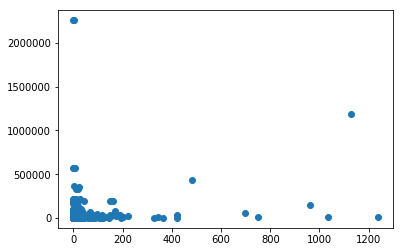

In [50]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

plt.scatter(df.popularité_du_tweet, df.popularité_du_compte)
#df['popularité_du_tweet'].plot

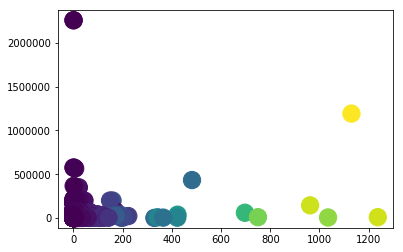

In [51]:
plt.scatter(df.popularité_du_tweet, df.popularité_du_compte, s=300, c=df.shares)

In [60]:
df['main'].value_counts()
#longueur_du_tweet=len['main']
#longueur_du_tweet

.@N_Hulot: Sauvez les #abeilles, interdisez TOUS les pesticides #néonicotinoïdes http://sumof.us/345470020t  #sulfoxaflor #flupyradifurone                                                                                                                                                                                                                                                                                                                                                       1
Aujourd'hui venez rendre visite à @hostabee au #ForumVitae #AgroParisTech #smartagri #IoT #apiculture #abeilles #LoRa #Sigfox @AgroParisTech                                                                                                                                                                                                                                                                                                                                                     1
Le gouvernement français est dans 

In [67]:
for tweet in df['main']:
    df['longueur_du_tweet'] = len(tweet)
    print(df['longueur_du_tweet'])


0        201
1        201
2        201
3        201
4        201
5        201
6        201
7        201
8        201
9        201
10       201
11       201
12       201
13       201
14       201
15       201
16       201
17       201
18       201
19       201
20       201
21       201
22       201
23       201
24       201
25       201
26       201
27       201
28       201
29       201
        ... 
11216    201
11217    201
11218    201
11219    201
11220    201
11221    201
11222    201
11223    201
11224    201
11225    201
11226    201
11227    201
11228    201
11229    201
11230    201
11231    201
11232    201
11233    201
11234    201
11235    201
11236    201
11237    201
11238    201
11239    201
11240    201
11241    201
11242    201
11243    201
11244    201
11245    201
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        112
1        112
2        112
3        112
4        112
5        112
6        112
7        112
8        112
9        112
10       112
11       11

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        134
1        134
2        134
3        134
4        134
5        134
6        134
7        134
8        134
9        134
10       134
11       134
12       134
13       134
14       134
15       134
16       134
17       134
18       134
19       134
20       134
21       134
22       134
23       134
24       134
25       134
26       134
27       134
28       134
29       134
        ... 
11216    134
11217    134
11218    134
11219    134
11220    134
11221    134
11222    134
11223    134
11224    134
11225    134
11226    134
11227    134
11228    134
11229    134
11230    134
11231    134
11232    134
11233    134
11234    134
11235    134
11236    134
11237    134
11238    134
11239    134
11240    134
11241    134
11242    134
11243    134
11244    134
11245    134
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        136
1        136
2        136
3        136
4        136
5        136
6        136
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        121
1        121
2        121
3        121
4        121
5        121
6        121
7        121
8        121
9        121
10       121
11       121
12       121
13       121
14       121
15       121
16       121
17       121
18       121
19       121
20       121
21       121
22       121
23       121
24       121
25       121
26       121
27       121
28       121
29       121
        ... 
11216    121
11217    121
11218    121
11219    121
11220    121
11221    121
11222    121
11223    121
11224    121
11225    121
11226    121
11227    121
11228    121
11229    121
11230    121
11231    121
11232    121
11233    121
11234    121
11235    121
11236    121
11237    121
11238    121
11239    121
11240    121
11241    121
11242    121
11243    121
11244    121
11245    121
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        131
1        131
2        131
3        131
4        131
5        131
6        131
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        91
1        91
2        91
3        91
4        91
5        91
6        91
7        91
8        91
9        91
10       91
11       91
12       91
13       91
14       91
15       91
16       91
17       91
18       91
19       91
20       91
21       91
22       91
23       91
24       91
25       91
26       91
27       91
28       91
29       91
         ..
11216    91
11217    91
11218    91
11219    91
11220    91
11221    91
11222    91
11223    91
11224    91
11225    91
11226    91
11227    91
11228    91
11229    91
11230    91
11231    91
11232    91
11233    91
11234    91
11235    91
11236    91
11237    91
11238    91
11239    91
11240    91
11241    91
11242    91
11243    91
11244    91
11245    91
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        140
1        140
2        140
3        140
4        140
5        140
6        140
7        140
8        140
9        140
10       140
11       140
12    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        154
1        154
2        154
3        154
4        154
5        154
6        154
7        154
8        154
9        154
10       154
11       154
12       154
13       154
14       154
15       154
16       154
17       154
18       154
19       154
20       154
21       154
22       154
23       154
24       154
25       154
26       154
27       154
28       154
29       154
        ... 
11216    154
11217    154
11218    154
11219    154
11220    154
11221    154
11222    154
11223    154
11224    154
11225    154
11226    154
11227    154
11228    154
11229    154
11230    154
11231    154
11232    154
11233    154
11234    154
11235    154
11236    154
11237    154
11238    154
11239    154
11240    154
11241    154
11242    154
11243    154
11244    154
11245    154
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        98
1        98
2        98
3        98
4        98
5        98
6        98
7        98
8    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        137
8        137
9        137
10       137
11       137
12       137
13       137
14       137
15       137
16       137
17       137
18       137
19       137
20       137
21       137
22       137
23       137
24       137
25       137
26       137
27       137
28       137
29       137
        ... 
11216    137
11217    137
11218    137
11219    137
11220    137
11221    137
11222    137
11223    137
11224    137
11225    137
11226    137
11227    137
11228    137
11229    137
11230    137
11231    137
11232    137
11233    137
11234    137
11235    137
11236    137
11237    137
11238    137
11239    137
11240    137
11241    137
11242    137
11243    137
11244    137
11245    137
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        130
1        130
2        130
3        130
4        130
5        130
6        130
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        95
1        95
2        95
3        95
4        95
5        95
6        95
7        95
8        95
9        95
10       95
11       95
12       95
13       95
14       95
15       95
16       95
17       95
18       95
19       95
20       95
21       95
22       95
23       95
24       95
25       95
26       95
27       95
28       95
29       95
         ..
11216    95
11217    95
11218    95
11219    95
11220    95
11221    95
11222    95
11223    95
11224    95
11225    95
11226    95
11227    95
11228    95
11229    95
11230    95
11231    95
11232    95
11233    95
11234    95
11235    95
11236    95
11237    95
11238    95
11239    95
11240    95
11241    95
11242    95
11243    95
11244    95
11245    95
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        106
1        106
2        106
3        106
4        106
5        106
6        106
7        106
8        106
9        106
10       106
11       106
12    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        132
1        132
2        132
3        132
4        132
5        132
6        132
7        132
8        132
9        132
10       132
11       132
12       132
13       132
14       132
15       132
16       132
17       132
18       132
19       132
20       132
21       132
22       132
23       132
24       132
25       132
26       132
27       132
28       132
29       132
        ... 
11216    132
11217    132
11218    132
11219    132
11220    132
11221    132
11222    132
11223    132
11224    132
11225    132
11226    132
11227    132
11228    132
11229    132
11230    132
11231    132
11232    132
11233    132
11234    132
11235    132
11236    132
11237    132
11238    132
11239    132
11240    132
11241    132
11242    132
11243    132
11244    132
11245    132
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        135
1        135
2        135
3        135
4        135
5        135
6        135
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        128
1        128
2        128
3        128
4        128
5        128
6        128
7        128
8        128
9        128
10       128
11       128
12       128
13       128
14       128
15       128
16       128
17       128
18       128
19       128
20       128
21       128
22       128
23       128
24       128
25       128
26       128
27       128
28       128
29       128
        ... 
11216    128
11217    128
11218    128
11219    128
11220    128
11221    128
11222    128
11223    128
11224    128
11225    128
11226    128
11227    128
11228    128
11229    128
11230    128
11231    128
11232    128
11233    128
11234    128
11235    128
11236    128
11237    128
11238    128
11239    128
11240    128
11241    128
11242    128
11243    128
11244    128
11245    128
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        109
1        109
2        109
3        109
4        109
5        109
6        109
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        65
1        65
2        65
3        65
4        65
5        65
6        65
7        65
8        65
9        65
10       65
11       65
12       65
13       65
14       65
15       65
16       65
17       65
18       65
19       65
20       65
21       65
22       65
23       65
24       65
25       65
26       65
27       65
28       65
29       65
         ..
11216    65
11217    65
11218    65
11219    65
11220    65
11221    65
11222    65
11223    65
11224    65
11225    65
11226    65
11227    65
11228    65
11229    65
11230    65
11231    65
11232    65
11233    65
11234    65
11235    65
11236    65
11237    65
11238    65
11239    65
11240    65
11241    65
11242    65
11243    65
11244    65
11245    65
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        140
1        140
2        140
3        140
4        140
5        140
6        140
7        140
8        140
9        140
10       140
11       140
12    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        119
1        119
2        119
3        119
4        119
5        119
6        119
7        119
8        119
9        119
10       119
11       119
12       119
13       119
14       119
15       119
16       119
17       119
18       119
19       119
20       119
21       119
22       119
23       119
24       119
25       119
26       119
27       119
28       119
29       119
        ... 
11216    119
11217    119
11218    119
11219    119
11220    119
11221    119
11222    119
11223    119
11224    119
11225    119
11226    119
11227    119
11228    119
11229    119
11230    119
11231    119
11232    119
11233    119
11234    119
11235    119
11236    119
11237    119
11238    119
11239    119
11240    119
11241    119
11242    119
11243    119
11244    119
11245    119
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        140
1        140
2        140
3        140
4        140
5        140
6        140
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        60
1        60
2        60
3        60
4        60
5        60
6        60
7        60
8        60
9        60
10       60
11       60
12       60
13       60
14       60
15       60
16       60
17       60
18       60
19       60
20       60
21       60
22       60
23       60
24       60
25       60
26       60
27       60
28       60
29       60
         ..
11216    60
11217    60
11218    60
11219    60
11220    60
11221    60
11222    60
11223    60
11224    60
11225    60
11226    60
11227    60
11228    60
11229    60
11230    60
11231    60
11232    60
11233    60
11234    60
11235    60
11236    60
11237    60
11238    60
11239    60
11240    60
11241    60
11242    60
11243    60
11244    60
11245    60
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        139
1        139
2        139
3        139
4        139
5        139
6        139
7        139
8        139
9        139
10       139
11       139
12    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        133
1        133
2        133
3        133
4        133
5        133
6        133
7        133
8        133
9        133
10       133
11       133
12       133
13       133
14       133
15       133
16       133
17       133
18       133
19       133
20       133
21       133
22       133
23       133
24       133
25       133
26       133
27       133
28       133
29       133
        ... 
11216    133
11217    133
11218    133
11219    133
11220    133
11221    133
11222    133
11223    133
11224    133
11225    133
11226    133
11227    133
11228    133
11229    133
11230    133
11231    133
11232    133
11233    133
11234    133
11235    133
11236    133
11237    133
11238    133
11239    133
11240    133
11241    133
11242    133
11243    133
11244    133
11245    133
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        106
1        106
2        106
3        106
4        106
5        106
6        106
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        114
1        114
2        114
3        114
4        114
5        114
6        114
7        114
8        114
9        114
10       114
11       114
12       114
13       114
14       114
15       114
16       114
17       114
18       114
19       114
20       114
21       114
22       114
23       114
24       114
25       114
26       114
27       114
28       114
29       114
        ... 
11216    114
11217    114
11218    114
11219    114
11220    114
11221    114
11222    114
11223    114
11224    114
11225    114
11226    114
11227    114
11228    114
11229    114
11230    114
11231    114
11232    114
11233    114
11234    114
11235    114
11236    114
11237    114
11238    114
11239    114
11240    114
11241    114
11242    114
11243    114
11244    114
11245    114
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        135
1        135
2        135
3        135
4        135
5        135
6        135
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        204
1        204
2        204
3        204
4        204
5        204
6        204
7        204
8        204
9        204
10       204
11       204
12       204
13       204
14       204
15       204
16       204
17       204
18       204
19       204
20       204
21       204
22       204
23       204
24       204
25       204
26       204
27       204
28       204
29       204
        ... 
11216    204
11217    204
11218    204
11219    204
11220    204
11221    204
11222    204
11223    204
11224    204
11225    204
11226    204
11227    204
11228    204
11229    204
11230    204
11231    204
11232    204
11233    204
11234    204
11235    204
11236    204
11237    204
11238    204
11239    204
11240    204
11241    204
11242    204
11243    204
11244    204
11245    204
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        108
1        108
2        108
3        108
4        108
5        108
6        108
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        140
1        140
2        140
3        140
4        140
5        140
6        140
7        140
8        140
9        140
10       140
11       140
12       140
13       140
14       140
15       140
16       140
17       140
18       140
19       140
20       140
21       140
22       140
23       140
24       140
25       140
26       140
27       140
28       140
29       140
        ... 
11216    140
11217    140
11218    140
11219    140
11220    140
11221    140
11222    140
11223    140
11224    140
11225    140
11226    140
11227    140
11228    140
11229    140
11230    140
11231    140
11232    140
11233    140
11234    140
11235    140
11236    140
11237    140
11238    140
11239    140
11240    140
11241    140
11242    140
11243    140
11244    140
11245    140
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        105
1        105
2        105
3        105
4        105
5        105
6        105
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        137
8        137
9        137
10       137
11       137
12       137
13       137
14       137
15       137
16       137
17       137
18       137
19       137
20       137
21       137
22       137
23       137
24       137
25       137
26       137
27       137
28       137
29       137
        ... 
11216    137
11217    137
11218    137
11219    137
11220    137
11221    137
11222    137
11223    137
11224    137
11225    137
11226    137
11227    137
11228    137
11229    137
11230    137
11231    137
11232    137
11233    137
11234    137
11235    137
11236    137
11237    137
11238    137
11239    137
11240    137
11241    137
11242    137
11243    137
11244    137
11245    137
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        112
1        112
2        112
3        112
4        112
5        112
6        112
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        105
1        105
2        105
3        105
4        105
5        105
6        105
7        105
8        105
9        105
10       105
11       105
12       105
13       105
14       105
15       105
16       105
17       105
18       105
19       105
20       105
21       105
22       105
23       105
24       105
25       105
26       105
27       105
28       105
29       105
        ... 
11216    105
11217    105
11218    105
11219    105
11220    105
11221    105
11222    105
11223    105
11224    105
11225    105
11226    105
11227    105
11228    105
11229    105
11230    105
11231    105
11232    105
11233    105
11234    105
11235    105
11236    105
11237    105
11238    105
11239    105
11240    105
11241    105
11242    105
11243    105
11244    105
11245    105
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        68
1        68
2        68
3        68
4        68
5        68
6        68
7        68
8    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        137
8        137
9        137
10       137
11       137
12       137
13       137
14       137
15       137
16       137
17       137
18       137
19       137
20       137
21       137
22       137
23       137
24       137
25       137
26       137
27       137
28       137
29       137
        ... 
11216    137
11217    137
11218    137
11219    137
11220    137
11221    137
11222    137
11223    137
11224    137
11225    137
11226    137
11227    137
11228    137
11229    137
11230    137
11231    137
11232    137
11233    137
11234    137
11235    137
11236    137
11237    137
11238    137
11239    137
11240    137
11241    137
11242    137
11243    137
11244    137
11245    137
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        91
1        91
2        91
3        91
4        91
5        91
6        91
7        91
8    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        139
1        139
2        139
3        139
4        139
5        139
6        139
7        139
8        139
9        139
10       139
11       139
12       139
13       139
14       139
15       139
16       139
17       139
18       139
19       139
20       139
21       139
22       139
23       139
24       139
25       139
26       139
27       139
28       139
29       139
        ... 
11216    139
11217    139
11218    139
11219    139
11220    139
11221    139
11222    139
11223    139
11224    139
11225    139
11226    139
11227    139
11228    139
11229    139
11230    139
11231    139
11232    139
11233    139
11234    139
11235    139
11236    139
11237    139
11238    139
11239    139
11240    139
11241    139
11242    139
11243    139
11244    139
11245    139
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        135
1        135
2        135
3        135
4        135
5        135
6        135
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        136
1        136
2        136
3        136
4        136
5        136
6        136
7        136
8        136
9        136
10       136
11       136
12       136
13       136
14       136
15       136
16       136
17       136
18       136
19       136
20       136
21       136
22       136
23       136
24       136
25       136
26       136
27       136
28       136
29       136
        ... 
11216    136
11217    136
11218    136
11219    136
11220    136
11221    136
11222    136
11223    136
11224    136
11225    136
11226    136
11227    136
11228    136
11229    136
11230    136
11231    136
11232    136
11233    136
11234    136
11235    136
11236    136
11237    136
11238    136
11239    136
11240    136
11241    136
11242    136
11243    136
11244    136
11245    136
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        136
1        136
2        136
3        136
4        136
5        136
6        136
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        107
1        107
2        107
3        107
4        107
5        107
6        107
7        107
8        107
9        107
10       107
11       107
12       107
13       107
14       107
15       107
16       107
17       107
18       107
19       107
20       107
21       107
22       107
23       107
24       107
25       107
26       107
27       107
28       107
29       107
        ... 
11216    107
11217    107
11218    107
11219    107
11220    107
11221    107
11222    107
11223    107
11224    107
11225    107
11226    107
11227    107
11228    107
11229    107
11230    107
11231    107
11232    107
11233    107
11234    107
11235    107
11236    107
11237    107
11238    107
11239    107
11240    107
11241    107
11242    107
11243    107
11244    107
11245    107
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        132
1        132
2        132
3        132
4        132
5        132
6        132
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        182
1        182
2        182
3        182
4        182
5        182
6        182
7        182
8        182
9        182
10       182
11       182
12       182
13       182
14       182
15       182
16       182
17       182
18       182
19       182
20       182
21       182
22       182
23       182
24       182
25       182
26       182
27       182
28       182
29       182
        ... 
11216    182
11217    182
11218    182
11219    182
11220    182
11221    182
11222    182
11223    182
11224    182
11225    182
11226    182
11227    182
11228    182
11229    182
11230    182
11231    182
11232    182
11233    182
11234    182
11235    182
11236    182
11237    182
11238    182
11239    182
11240    182
11241    182
11242    182
11243    182
11244    182
11245    182
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        177
1        177
2        177
3        177
4        177
5        177
6        177
7        177
8        177
9        177
10       177
11       177
12       177
13       177
14       177
15       177
16       177
17       177
18       177
19       177
20       177
21       177
22       177
23       177
24       177
25       177
26       177
27       177
28       177
29       177
        ... 
11216    177
11217    177
11218    177
11219    177
11220    177
11221    177
11222    177
11223    177
11224    177
11225    177
11226    177
11227    177
11228    177
11229    177
11230    177
11231    177
11232    177
11233    177
11234    177
11235    177
11236    177
11237    177
11238    177
11239    177
11240    177
11241    177
11242    177
11243    177
11244    177
11245    177
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        114
1        114
2        114
3        114
4        114
5        114
6        114
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        128
1        128
2        128
3        128
4        128
5        128
6        128
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        107
1        107
2        107
3        107
4        107
5        107
6        107
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        139
1        139
2        139
3        139
4        139
5        139
6        139
7        139
8        139
9        139
10       139
11       139
12       139
13       139
14       139
15       139
16       139
17       139
18       139
19       139
20       139
21       139
22       139
23       139
24       139
25       139
26       139
27       139
28       139
29       139
        ... 
11216    139
11217    139
11218    139
11219    139
11220    139
11221    139
11222    139
11223    139
11224    139
11225    139
11226    139
11227    139
11228    139
11229    139
11230    139
11231    139
11232    139
11233    139
11234    139
11235    139
11236    139
11237    139
11238    139
11239    139
11240    139
11241    139
11242    139
11243    139
11244    139
11245    139
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        137
8        137
9        137
10       137
11       137
12       137
13       137
14       137
15       137
16       137
17       137
18       137
19       137
20       137
21       137
22       137
23       137
24       137
25       137
26       137
27       137
28       137
29       137
        ... 
11216    137
11217    137
11218    137
11219    137
11220    137
11221    137
11222    137
11223    137
11224    137
11225    137
11226    137
11227    137
11228    137
11229    137
11230    137
11231    137
11232    137
11233    137
11234    137
11235    137
11236    137
11237    137
11238    137
11239    137
11240    137
11241    137
11242    137
11243    137
11244    137
11245    137
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        72
1        72
2        72
3        72
4        72
5        72
6        72
7        72
8        72
9        72
10       72
11       72
12       72
13       72
14       72
15       72
16       72
17       72
18       72
19       72
20       72
21       72
22       72
23       72
24       72
25       72
26       72
27       72
28       72
29       72
         ..
11216    72
11217    72
11218    72
11219    72
11220    72
11221    72
11222    72
11223    72
11224    72
11225    72
11226    72
11227    72
11228    72
11229    72
11230    72
11231    72
11232    72
11233    72
11234    72
11235    72
11236    72
11237    72
11238    72
11239    72
11240    72
11241    72
11242    72
11243    72
11244    72
11245    72
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        94
1        94
2        94
3        94
4        94
5        94
6        94
7        94
8        94
9        94
10       94
11       94
12       94
13    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        88
1        88
2        88
3        88
4        88
5        88
6        88
7        88
8        88
9        88
10       88
11       88
12       88
13       88
14       88
15       88
16       88
17       88
18       88
19       88
20       88
21       88
22       88
23       88
24       88
25       88
26       88
27       88
28       88
29       88
         ..
11216    88
11217    88
11218    88
11219    88
11220    88
11221    88
11222    88
11223    88
11224    88
11225    88
11226    88
11227    88
11228    88
11229    88
11230    88
11231    88
11232    88
11233    88
11234    88
11235    88
11236    88
11237    88
11238    88
11239    88
11240    88
11241    88
11242    88
11243    88
11244    88
11245    88
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        201
1        201
2        201
3        201
4        201
5        201
6        201
7        201
8        201
9        201
10       201
11       201
12       201
13       201
14       201
15       201
16       201
17       201
18       201
19       201
20       201
21       201
22       201
23       201
24       201
25       201
26       201
27       201
28       201
29       201
        ... 
11216    201
11217    201
11218    201
11219    201
11220    201
11221    201
11222    201
11223    201
11224    201
11225    201
11226    201
11227    201
11228    201
11229    201
11230    201
11231    201
11232    201
11233    201
11234    201
11235    201
11236    201
11237    201
11238    201
11239    201
11240    201
11241    201
11242    201
11243    201
11244    201
11245    201
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        181
1        181
2        181
3        181
4        181
5        181
6        181
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        108
1        108
2        108
3        108
4        108
5        108
6        108
7        108
8        108
9        108
10       108
11       108
12       108
13       108
14       108
15       108
16       108
17       108
18       108
19       108
20       108
21       108
22       108
23       108
24       108
25       108
26       108
27       108
28       108
29       108
        ... 
11216    108
11217    108
11218    108
11219    108
11220    108
11221    108
11222    108
11223    108
11224    108
11225    108
11226    108
11227    108
11228    108
11229    108
11230    108
11231    108
11232    108
11233    108
11234    108
11235    108
11236    108
11237    108
11238    108
11239    108
11240    108
11241    108
11242    108
11243    108
11244    108
11245    108
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        92
1        92
2        92
3        92
4        92
5        92
6        92
7        92
8    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        60
1        60
2        60
3        60
4        60
5        60
6        60
7        60
8        60
9        60
10       60
11       60
12       60
13       60
14       60
15       60
16       60
17       60
18       60
19       60
20       60
21       60
22       60
23       60
24       60
25       60
26       60
27       60
28       60
29       60
         ..
11216    60
11217    60
11218    60
11219    60
11220    60
11221    60
11222    60
11223    60
11224    60
11225    60
11226    60
11227    60
11228    60
11229    60
11230    60
11231    60
11232    60
11233    60
11234    60
11235    60
11236    60
11237    60
11238    60
11239    60
11240    60
11241    60
11242    60
11243    60
11244    60
11245    60
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        139
1        139
2        139
3        139
4        139
5        139
6        139
7        139
8        139
9        139
10       139
11       139
12    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        110
1        110
2        110
3        110
4        110
5        110
6        110
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        117
1        117
2        117
3        117
4        117
5        117
6        117
7        117
8        117
9        117
10       117
11       117
12       117
13       117
14       117
15       117
16       117
17       117
18       117
19       117
20       117
21       117
22       117
23       117
24       117
25       117
26       117
27       117
28       117
29       117
        ... 
11216    117
11217    117
11218    117
11219    117
11220    117
11221    117
11222    117
11223    117
11224    117
11225    117
11226    117
11227    117
11228    117
11229    117
11230    117
11231    117
11232    117
11233    117
11234    117
11235    117
11236    117
11237    117
11238    117
11239    117
11240    117
11241    117
11242    117
11243    117
11244    117
11245    117
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        86
1        86
2        86
3        86
4        86
5        86
6        86
7        86
8        86
9        86
10       86
11       86
12       86
13       86
14       86
15       86
16       86
17       86
18       86
19       86
20       86
21       86
22       86
23       86
24       86
25       86
26       86
27       86
28       86
29       86
         ..
11216    86
11217    86
11218    86
11219    86
11220    86
11221    86
11222    86
11223    86
11224    86
11225    86
11226    86
11227    86
11228    86
11229    86
11230    86
11231    86
11232    86
11233    86
11234    86
11235    86
11236    86
11237    86
11238    86
11239    86
11240    86
11241    86
11242    86
11243    86
11244    86
11245    86
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        44
1        44
2        44
3        44
4        44
5        44
6        44
7        44
8        44
9        44
10       44
11       44
12       44
13    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        109
1        109
2        109
3        109
4        109
5        109
6        109
7        109
8        109
9        109
10       109
11       109
12       109
13       109
14       109
15       109
16       109
17       109
18       109
19       109
20       109
21       109
22       109
23       109
24       109
25       109
26       109
27       109
28       109
29       109
        ... 
11216    109
11217    109
11218    109
11219    109
11220    109
11221    109
11222    109
11223    109
11224    109
11225    109
11226    109
11227    109
11228    109
11229    109
11230    109
11231    109
11232    109
11233    109
11234    109
11235    109
11236    109
11237    109
11238    109
11239    109
11240    109
11241    109
11242    109
11243    109
11244    109
11245    109
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        91
1        91
2        91
3        91
4        91
5        91
6        91
7        91
8        91
9        91
10       91
11       91
12       91
13       91
14       91
15       91
16       91
17       91
18       91
19       91
20       91
21       91
22       91
23       91
24       91
25       91
26       91
27       91
28       91
29       91
         ..
11216    91
11217    91
11218    91
11219    91
11220    91
11221    91
11222    91
11223    91
11224    91
11225    91
11226    91
11227    91
11228    91
11229    91
11230    91
11231    91
11232    91
11233    91
11234    91
11235    91
11236    91
11237    91
11238    91
11239    91
11240    91
11241    91
11242    91
11243    91
11244    91
11245    91
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        125
1        125
2        125
3        125
4        125
5        125
6        125
7        125
8        125
9        125
10       125
11       125
12    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        97
1        97
2        97
3        97
4        97
5        97
6        97
7        97
8        97
9        97
10       97
11       97
12       97
13       97
14       97
15       97
16       97
17       97
18       97
19       97
20       97
21       97
22       97
23       97
24       97
25       97
26       97
27       97
28       97
29       97
         ..
11216    97
11217    97
11218    97
11219    97
11220    97
11221    97
11222    97
11223    97
11224    97
11225    97
11226    97
11227    97
11228    97
11229    97
11230    97
11231    97
11232    97
11233    97
11234    97
11235    97
11236    97
11237    97
11238    97
11239    97
11240    97
11241    97
11242    97
11243    97
11244    97
11245    97
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        64
1        64
2        64
3        64
4        64
5        64
6        64
7        64
8        64
9        64
10       64
11       64
12       64
13    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        105
1        105
2        105
3        105
4        105
5        105
6        105
7        105
8        105
9        105
10       105
11       105
12       105
13       105
14       105
15       105
16       105
17       105
18       105
19       105
20       105
21       105
22       105
23       105
24       105
25       105
26       105
27       105
28       105
29       105
        ... 
11216    105
11217    105
11218    105
11219    105
11220    105
11221    105
11222    105
11223    105
11224    105
11225    105
11226    105
11227    105
11228    105
11229    105
11230    105
11231    105
11232    105
11233    105
11234    105
11235    105
11236    105
11237    105
11238    105
11239    105
11240    105
11241    105
11242    105
11243    105
11244    105
11245    105
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        125
1        125
2        125
3        125
4        125
5        125
6        125
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        142
1        142
2        142
3        142
4        142
5        142
6        142
7        142
8        142
9        142
10       142
11       142
12       142
13       142
14       142
15       142
16       142
17       142
18       142
19       142
20       142
21       142
22       142
23       142
24       142
25       142
26       142
27       142
28       142
29       142
        ... 
11216    142
11217    142
11218    142
11219    142
11220    142
11221    142
11222    142
11223    142
11224    142
11225    142
11226    142
11227    142
11228    142
11229    142
11230    142
11231    142
11232    142
11233    142
11234    142
11235    142
11236    142
11237    142
11238    142
11239    142
11240    142
11241    142
11242    142
11243    142
11244    142
11245    142
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        94
1        94
2        94
3        94
4        94
5        94
6        94
7        94
8    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        137
8        137
9        137
10       137
11       137
12       137
13       137
14       137
15       137
16       137
17       137
18       137
19       137
20       137
21       137
22       137
23       137
24       137
25       137
26       137
27       137
28       137
29       137
        ... 
11216    137
11217    137
11218    137
11219    137
11220    137
11221    137
11222    137
11223    137
11224    137
11225    137
11226    137
11227    137
11228    137
11229    137
11230    137
11231    137
11232    137
11233    137
11234    137
11235    137
11236    137
11237    137
11238    137
11239    137
11240    137
11241    137
11242    137
11243    137
11244    137
11245    137
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        137
8        137
9        137
10       137
11       137
12       137
13       137
14       137
15       137
16       137
17       137
18       137
19       137
20       137
21       137
22       137
23       137
24       137
25       137
26       137
27       137
28       137
29       137
        ... 
11216    137
11217    137
11218    137
11219    137
11220    137
11221    137
11222    137
11223    137
11224    137
11225    137
11226    137
11227    137
11228    137
11229    137
11230    137
11231    137
11232    137
11233    137
11234    137
11235    137
11236    137
11237    137
11238    137
11239    137
11240    137
11241    137
11242    137
11243    137
11244    137
11245    137
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        145
1        145
2        145
3        145
4        145
5        145
6        145
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        137
8        137
9        137
10       137
11       137
12       137
13       137
14       137
15       137
16       137
17       137
18       137
19       137
20       137
21       137
22       137
23       137
24       137
25       137
26       137
27       137
28       137
29       137
        ... 
11216    137
11217    137
11218    137
11219    137
11220    137
11221    137
11222    137
11223    137
11224    137
11225    137
11226    137
11227    137
11228    137
11229    137
11230    137
11231    137
11232    137
11233    137
11234    137
11235    137
11236    137
11237    137
11238    137
11239    137
11240    137
11241    137
11242    137
11243    137
11244    137
11245    137
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        144
1        144
2        144
3        144
4        144
5        144
6        144
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        133
1        133
2        133
3        133
4        133
5        133
6        133
7        133
8        133
9        133
10       133
11       133
12       133
13       133
14       133
15       133
16       133
17       133
18       133
19       133
20       133
21       133
22       133
23       133
24       133
25       133
26       133
27       133
28       133
29       133
        ... 
11216    133
11217    133
11218    133
11219    133
11220    133
11221    133
11222    133
11223    133
11224    133
11225    133
11226    133
11227    133
11228    133
11229    133
11230    133
11231    133
11232    133
11233    133
11234    133
11235    133
11236    133
11237    133
11238    133
11239    133
11240    133
11241    133
11242    133
11243    133
11244    133
11245    133
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        130
1        130
2        130
3        130
4        130
5        130
6        130
7        130
8        130
9        130
10       130
11       130
12       130
13       130
14       130
15       130
16       130
17       130
18       130
19       130
20       130
21       130
22       130
23       130
24       130
25       130
26       130
27       130
28       130
29       130
        ... 
11216    130
11217    130
11218    130
11219    130
11220    130
11221    130
11222    130
11223    130
11224    130
11225    130
11226    130
11227    130
11228    130
11229    130
11230    130
11231    130
11232    130
11233    130
11234    130
11235    130
11236    130
11237    130
11238    130
11239    130
11240    130
11241    130
11242    130
11243    130
11244    130
11245    130
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        197
1        197
2        197
3        197
4        197
5        197
6        197
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        137
8        137
9        137
10       137
11       137
12       137
13       137
14       137
15       137
16       137
17       137
18       137
19       137
20       137
21       137
22       137
23       137
24       137
25       137
26       137
27       137
28       137
29       137
        ... 
11216    137
11217    137
11218    137
11219    137
11220    137
11221    137
11222    137
11223    137
11224    137
11225    137
11226    137
11227    137
11228    137
11229    137
11230    137
11231    137
11232    137
11233    137
11234    137
11235    137
11236    137
11237    137
11238    137
11239    137
11240    137
11241    137
11242    137
11243    137
11244    137
11245    137
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        99
1        99
2        99
3        99
4        99
5        99
6        99
7        99
8    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        137
8        137
9        137
10       137
11       137
12       137
13       137
14       137
15       137
16       137
17       137
18       137
19       137
20       137
21       137
22       137
23       137
24       137
25       137
26       137
27       137
28       137
29       137
        ... 
11216    137
11217    137
11218    137
11219    137
11220    137
11221    137
11222    137
11223    137
11224    137
11225    137
11226    137
11227    137
11228    137
11229    137
11230    137
11231    137
11232    137
11233    137
11234    137
11235    137
11236    137
11237    137
11238    137
11239    137
11240    137
11241    137
11242    137
11243    137
11244    137
11245    137
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        109
1        109
2        109
3        109
4        109
5        109
6        109
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        126
1        126
2        126
3        126
4        126
5        126
6        126
7        126
8        126
9        126
10       126
11       126
12       126
13       126
14       126
15       126
16       126
17       126
18       126
19       126
20       126
21       126
22       126
23       126
24       126
25       126
26       126
27       126
28       126
29       126
        ... 
11216    126
11217    126
11218    126
11219    126
11220    126
11221    126
11222    126
11223    126
11224    126
11225    126
11226    126
11227    126
11228    126
11229    126
11230    126
11231    126
11232    126
11233    126
11234    126
11235    126
11236    126
11237    126
11238    126
11239    126
11240    126
11241    126
11242    126
11243    126
11244    126
11245    126
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        94
1        94
2        94
3        94
4        94
5        94
6        94
7        94
8    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        107
1        107
2        107
3        107
4        107
5        107
6        107
7        107
8        107
9        107
10       107
11       107
12       107
13       107
14       107
15       107
16       107
17       107
18       107
19       107
20       107
21       107
22       107
23       107
24       107
25       107
26       107
27       107
28       107
29       107
        ... 
11216    107
11217    107
11218    107
11219    107
11220    107
11221    107
11222    107
11223    107
11224    107
11225    107
11226    107
11227    107
11228    107
11229    107
11230    107
11231    107
11232    107
11233    107
11234    107
11235    107
11236    107
11237    107
11238    107
11239    107
11240    107
11241    107
11242    107
11243    107
11244    107
11245    107
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        101
1        101
2        101
3        101
4        101
5        101
6        101
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        137
8        137
9        137
10       137
11       137
12       137
13       137
14       137
15       137
16       137
17       137
18       137
19       137
20       137
21       137
22       137
23       137
24       137
25       137
26       137
27       137
28       137
29       137
        ... 
11216    137
11217    137
11218    137
11219    137
11220    137
11221    137
11222    137
11223    137
11224    137
11225    137
11226    137
11227    137
11228    137
11229    137
11230    137
11231    137
11232    137
11233    137
11234    137
11235    137
11236    137
11237    137
11238    137
11239    137
11240    137
11241    137
11242    137
11243    137
11244    137
11245    137
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        137
8        137
9        137
10       137
11       137
12       137
13       137
14       137
15       137
16       137
17       137
18       137
19       137
20       137
21       137
22       137
23       137
24       137
25       137
26       137
27       137
28       137
29       137
        ... 
11216    137
11217    137
11218    137
11219    137
11220    137
11221    137
11222    137
11223    137
11224    137
11225    137
11226    137
11227    137
11228    137
11229    137
11230    137
11231    137
11232    137
11233    137
11234    137
11235    137
11236    137
11237    137
11238    137
11239    137
11240    137
11241    137
11242    137
11243    137
11244    137
11245    137
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        145
1        145
2        145
3        145
4        145
5        145
6        145
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        137
8        137
9        137
10       137
11       137
12       137
13       137
14       137
15       137
16       137
17       137
18       137
19       137
20       137
21       137
22       137
23       137
24       137
25       137
26       137
27       137
28       137
29       137
        ... 
11216    137
11217    137
11218    137
11219    137
11220    137
11221    137
11222    137
11223    137
11224    137
11225    137
11226    137
11227    137
11228    137
11229    137
11230    137
11231    137
11232    137
11233    137
11234    137
11235    137
11236    137
11237    137
11238    137
11239    137
11240    137
11241    137
11242    137
11243    137
11244    137
11245    137
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        132
1        132
2        132
3        132
4        132
5        132
6        132
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        100
1        100
2        100
3        100
4        100
5        100
6        100
7        100
8        100
9        100
10       100
11       100
12       100
13       100
14       100
15       100
16       100
17       100
18       100
19       100
20       100
21       100
22       100
23       100
24       100
25       100
26       100
27       100
28       100
29       100
        ... 
11216    100
11217    100
11218    100
11219    100
11220    100
11221    100
11222    100
11223    100
11224    100
11225    100
11226    100
11227    100
11228    100
11229    100
11230    100
11231    100
11232    100
11233    100
11234    100
11235    100
11236    100
11237    100
11238    100
11239    100
11240    100
11241    100
11242    100
11243    100
11244    100
11245    100
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        177
1        177
2        177
3        177
4        177
5        177
6        177
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        137
8        137
9        137
10       137
11       137
12       137
13       137
14       137
15       137
16       137
17       137
18       137
19       137
20       137
21       137
22       137
23       137
24       137
25       137
26       137
27       137
28       137
29       137
        ... 
11216    137
11217    137
11218    137
11219    137
11220    137
11221    137
11222    137
11223    137
11224    137
11225    137
11226    137
11227    137
11228    137
11229    137
11230    137
11231    137
11232    137
11233    137
11234    137
11235    137
11236    137
11237    137
11238    137
11239    137
11240    137
11241    137
11242    137
11243    137
11244    137
11245    137
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        76
1        76
2        76
3        76
4        76
5        76
6        76
7        76
8    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        363
1        363
2        363
3        363
4        363
5        363
6        363
7        363
8        363
9        363
10       363
11       363
12       363
13       363
14       363
15       363
16       363
17       363
18       363
19       363
20       363
21       363
22       363
23       363
24       363
25       363
26       363
27       363
28       363
29       363
        ... 
11216    363
11217    363
11218    363
11219    363
11220    363
11221    363
11222    363
11223    363
11224    363
11225    363
11226    363
11227    363
11228    363
11229    363
11230    363
11231    363
11232    363
11233    363
11234    363
11235    363
11236    363
11237    363
11238    363
11239    363
11240    363
11241    363
11242    363
11243    363
11244    363
11245    363
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        99
1        99
2        99
3        99
4        99
5        99
6        99
7        99
8    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        137
8        137
9        137
10       137
11       137
12       137
13       137
14       137
15       137
16       137
17       137
18       137
19       137
20       137
21       137
22       137
23       137
24       137
25       137
26       137
27       137
28       137
29       137
        ... 
11216    137
11217    137
11218    137
11219    137
11220    137
11221    137
11222    137
11223    137
11224    137
11225    137
11226    137
11227    137
11228    137
11229    137
11230    137
11231    137
11232    137
11233    137
11234    137
11235    137
11236    137
11237    137
11238    137
11239    137
11240    137
11241    137
11242    137
11243    137
11244    137
11245    137
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        73
1        73
2        73
3        73
4        73
5        73
6        73
7        73
8    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        136
1        136
2        136
3        136
4        136
5        136
6        136
7        136
8        136
9        136
10       136
11       136
12       136
13       136
14       136
15       136
16       136
17       136
18       136
19       136
20       136
21       136
22       136
23       136
24       136
25       136
26       136
27       136
28       136
29       136
        ... 
11216    136
11217    136
11218    136
11219    136
11220    136
11221    136
11222    136
11223    136
11224    136
11225    136
11226    136
11227    136
11228    136
11229    136
11230    136
11231    136
11232    136
11233    136
11234    136
11235    136
11236    136
11237    136
11238    136
11239    136
11240    136
11241    136
11242    136
11243    136
11244    136
11245    136
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        131
1        131
2        131
3        131
4        131
5        131
6        131
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        135
1        135
2        135
3        135
4        135
5        135
6        135
7        135
8        135
9        135
10       135
11       135
12       135
13       135
14       135
15       135
16       135
17       135
18       135
19       135
20       135
21       135
22       135
23       135
24       135
25       135
26       135
27       135
28       135
29       135
        ... 
11216    135
11217    135
11218    135
11219    135
11220    135
11221    135
11222    135
11223    135
11224    135
11225    135
11226    135
11227    135
11228    135
11229    135
11230    135
11231    135
11232    135
11233    135
11234    135
11235    135
11236    135
11237    135
11238    135
11239    135
11240    135
11241    135
11242    135
11243    135
11244    135
11245    135
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        39
1        39
2        39
3        39
4        39
5        39
6        39
7        39
8    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        81
1        81
2        81
3        81
4        81
5        81
6        81
7        81
8        81
9        81
10       81
11       81
12       81
13       81
14       81
15       81
16       81
17       81
18       81
19       81
20       81
21       81
22       81
23       81
24       81
25       81
26       81
27       81
28       81
29       81
         ..
11216    81
11217    81
11218    81
11219    81
11220    81
11221    81
11222    81
11223    81
11224    81
11225    81
11226    81
11227    81
11228    81
11229    81
11230    81
11231    81
11232    81
11233    81
11234    81
11235    81
11236    81
11237    81
11238    81
11239    81
11240    81
11241    81
11242    81
11243    81
11244    81
11245    81
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        106
1        106
2        106
3        106
4        106
5        106
6        106
7        106
8        106
9        106
10       106
11       106
12    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        136
1        136
2        136
3        136
4        136
5        136
6        136
7        136
8        136
9        136
10       136
11       136
12       136
13       136
14       136
15       136
16       136
17       136
18       136
19       136
20       136
21       136
22       136
23       136
24       136
25       136
26       136
27       136
28       136
29       136
        ... 
11216    136
11217    136
11218    136
11219    136
11220    136
11221    136
11222    136
11223    136
11224    136
11225    136
11226    136
11227    136
11228    136
11229    136
11230    136
11231    136
11232    136
11233    136
11234    136
11235    136
11236    136
11237    136
11238    136
11239    136
11240    136
11241    136
11242    136
11243    136
11244    136
11245    136
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        139
1        139
2        139
3        139
4        139
5        139
6        139
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        188
1        188
2        188
3        188
4        188
5        188
6        188
7        188
8        188
9        188
10       188
11       188
12       188
13       188
14       188
15       188
16       188
17       188
18       188
19       188
20       188
21       188
22       188
23       188
24       188
25       188
26       188
27       188
28       188
29       188
        ... 
11216    188
11217    188
11218    188
11219    188
11220    188
11221    188
11222    188
11223    188
11224    188
11225    188
11226    188
11227    188
11228    188
11229    188
11230    188
11231    188
11232    188
11233    188
11234    188
11235    188
11236    188
11237    188
11238    188
11239    188
11240    188
11241    188
11242    188
11243    188
11244    188
11245    188
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        136
1        136
2        136
3        136
4        136
5        136
6        136
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        137
8        137
9        137
10       137
11       137
12       137
13       137
14       137
15       137
16       137
17       137
18       137
19       137
20       137
21       137
22       137
23       137
24       137
25       137
26       137
27       137
28       137
29       137
        ... 
11216    137
11217    137
11218    137
11219    137
11220    137
11221    137
11222    137
11223    137
11224    137
11225    137
11226    137
11227    137
11228    137
11229    137
11230    137
11231    137
11232    137
11233    137
11234    137
11235    137
11236    137
11237    137
11238    137
11239    137
11240    137
11241    137
11242    137
11243    137
11244    137
11245    137
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        175
1        175
2        175
3        175
4        175
5        175
6        175
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        137
8        137
9        137
10       137
11       137
12       137
13       137
14       137
15       137
16       137
17       137
18       137
19       137
20       137
21       137
22       137
23       137
24       137
25       137
26       137
27       137
28       137
29       137
        ... 
11216    137
11217    137
11218    137
11219    137
11220    137
11221    137
11222    137
11223    137
11224    137
11225    137
11226    137
11227    137
11228    137
11229    137
11230    137
11231    137
11232    137
11233    137
11234    137
11235    137
11236    137
11237    137
11238    137
11239    137
11240    137
11241    137
11242    137
11243    137
11244    137
11245    137
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        94
1        94
2        94
3        94
4        94
5        94
6        94
7        94
8    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        137
8        137
9        137
10       137
11       137
12       137
13       137
14       137
15       137
16       137
17       137
18       137
19       137
20       137
21       137
22       137
23       137
24       137
25       137
26       137
27       137
28       137
29       137
        ... 
11216    137
11217    137
11218    137
11219    137
11220    137
11221    137
11222    137
11223    137
11224    137
11225    137
11226    137
11227    137
11228    137
11229    137
11230    137
11231    137
11232    137
11233    137
11234    137
11235    137
11236    137
11237    137
11238    137
11239    137
11240    137
11241    137
11242    137
11243    137
11244    137
11245    137
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        154
1        154
2        154
3        154
4        154
5        154
6        154
7        154
8        154
9        154
10       154
11       154
12       154
13       154
14       154
15       154
16       154
17       154
18       154
19       154
20       154
21       154
22       154
23       154
24       154
25       154
26       154
27       154
28       154
29       154
        ... 
11216    154
11217    154
11218    154
11219    154
11220    154
11221    154
11222    154
11223    154
11224    154
11225    154
11226    154
11227    154
11228    154
11229    154
11230    154
11231    154
11232    154
11233    154
11234    154
11235    154
11236    154
11237    154
11238    154
11239    154
11240    154
11241    154
11242    154
11243    154
11244    154
11245    154
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        136
1        136
2        136
3        136
4        136
5        136
6        136
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        229
1        229
2        229
3        229
4        229
5        229
6        229
7        229
8        229
9        229
10       229
11       229
12       229
13       229
14       229
15       229
16       229
17       229
18       229
19       229
20       229
21       229
22       229
23       229
24       229
25       229
26       229
27       229
28       229
29       229
        ... 
11216    229
11217    229
11218    229
11219    229
11220    229
11221    229
11222    229
11223    229
11224    229
11225    229
11226    229
11227    229
11228    229
11229    229
11230    229
11231    229
11232    229
11233    229
11234    229
11235    229
11236    229
11237    229
11238    229
11239    229
11240    229
11241    229
11242    229
11243    229
11244    229
11245    229
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        139
1        139
2        139
3        139
4        139
5        139
6        139
7        139
8        139
9        139
10       139
11       139
12       139
13       139
14       139
15       139
16       139
17       139
18       139
19       139
20       139
21       139
22       139
23       139
24       139
25       139
26       139
27       139
28       139
29       139
        ... 
11216    139
11217    139
11218    139
11219    139
11220    139
11221    139
11222    139
11223    139
11224    139
11225    139
11226    139
11227    139
11228    139
11229    139
11230    139
11231    139
11232    139
11233    139
11234    139
11235    139
11236    139
11237    139
11238    139
11239    139
11240    139
11241    139
11242    139
11243    139
11244    139
11245    139
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        157
1        157
2        157
3        157
4        157
5        157
6        157
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        136
1        136
2        136
3        136
4        136
5        136
6        136
7        136
8        136
9        136
10       136
11       136
12       136
13       136
14       136
15       136
16       136
17       136
18       136
19       136
20       136
21       136
22       136
23       136
24       136
25       136
26       136
27       136
28       136
29       136
        ... 
11216    136
11217    136
11218    136
11219    136
11220    136
11221    136
11222    136
11223    136
11224    136
11225    136
11226    136
11227    136
11228    136
11229    136
11230    136
11231    136
11232    136
11233    136
11234    136
11235    136
11236    136
11237    136
11238    136
11239    136
11240    136
11241    136
11242    136
11243    136
11244    136
11245    136
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        99
1        99
2        99
3        99
4        99
5        99
6        99
7        99
8        99
9        99
10       99
11       99
12       99
13       99
14       99
15       99
16       99
17       99
18       99
19       99
20       99
21       99
22       99
23       99
24       99
25       99
26       99
27       99
28       99
29       99
         ..
11216    99
11217    99
11218    99
11219    99
11220    99
11221    99
11222    99
11223    99
11224    99
11225    99
11226    99
11227    99
11228    99
11229    99
11230    99
11231    99
11232    99
11233    99
11234    99
11235    99
11236    99
11237    99
11238    99
11239    99
11240    99
11241    99
11242    99
11243    99
11244    99
11245    99
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        91
1        91
2        91
3        91
4        91
5        91
6        91
7        91
8        91
9        91
10       91
11       91
12       91
13    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        140
1        140
2        140
3        140
4        140
5        140
6        140
7        140
8        140
9        140
10       140
11       140
12       140
13       140
14       140
15       140
16       140
17       140
18       140
19       140
20       140
21       140
22       140
23       140
24       140
25       140
26       140
27       140
28       140
29       140
        ... 
11216    140
11217    140
11218    140
11219    140
11220    140
11221    140
11222    140
11223    140
11224    140
11225    140
11226    140
11227    140
11228    140
11229    140
11230    140
11231    140
11232    140
11233    140
11234    140
11235    140
11236    140
11237    140
11238    140
11239    140
11240    140
11241    140
11242    140
11243    140
11244    140
11245    140
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        192
1        192
2        192
3        192
4        192
5        192
6        192
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        220
1        220
2        220
3        220
4        220
5        220
6        220
7        220
8        220
9        220
10       220
11       220
12       220
13       220
14       220
15       220
16       220
17       220
18       220
19       220
20       220
21       220
22       220
23       220
24       220
25       220
26       220
27       220
28       220
29       220
        ... 
11216    220
11217    220
11218    220
11219    220
11220    220
11221    220
11222    220
11223    220
11224    220
11225    220
11226    220
11227    220
11228    220
11229    220
11230    220
11231    220
11232    220
11233    220
11234    220
11235    220
11236    220
11237    220
11238    220
11239    220
11240    220
11241    220
11242    220
11243    220
11244    220
11245    220
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        110
1        110
2        110
3        110
4        110
5        110
6        110
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        113
1        113
2        113
3        113
4        113
5        113
6        113
7        113
8        113
9        113
10       113
11       113
12       113
13       113
14       113
15       113
16       113
17       113
18       113
19       113
20       113
21       113
22       113
23       113
24       113
25       113
26       113
27       113
28       113
29       113
        ... 
11216    113
11217    113
11218    113
11219    113
11220    113
11221    113
11222    113
11223    113
11224    113
11225    113
11226    113
11227    113
11228    113
11229    113
11230    113
11231    113
11232    113
11233    113
11234    113
11235    113
11236    113
11237    113
11238    113
11239    113
11240    113
11241    113
11242    113
11243    113
11244    113
11245    113
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        66
1        66
2        66
3        66
4        66
5        66
6        66
7        66
8    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        137
8        137
9        137
10       137
11       137
12       137
13       137
14       137
15       137
16       137
17       137
18       137
19       137
20       137
21       137
22       137
23       137
24       137
25       137
26       137
27       137
28       137
29       137
        ... 
11216    137
11217    137
11218    137
11219    137
11220    137
11221    137
11222    137
11223    137
11224    137
11225    137
11226    137
11227    137
11228    137
11229    137
11230    137
11231    137
11232    137
11233    137
11234    137
11235    137
11236    137
11237    137
11238    137
11239    137
11240    137
11241    137
11242    137
11243    137
11244    137
11245    137
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        99
1        99
2        99
3        99
4        99
5        99
6        99
7        99
8    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        137
8        137
9        137
10       137
11       137
12       137
13       137
14       137
15       137
16       137
17       137
18       137
19       137
20       137
21       137
22       137
23       137
24       137
25       137
26       137
27       137
28       137
29       137
        ... 
11216    137
11217    137
11218    137
11219    137
11220    137
11221    137
11222    137
11223    137
11224    137
11225    137
11226    137
11227    137
11228    137
11229    137
11230    137
11231    137
11232    137
11233    137
11234    137
11235    137
11236    137
11237    137
11238    137
11239    137
11240    137
11241    137
11242    137
11243    137
11244    137
11245    137
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        140
1        140
2        140
3        140
4        140
5        140
6        140
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        83
1        83
2        83
3        83
4        83
5        83
6        83
7        83
8        83
9        83
10       83
11       83
12       83
13       83
14       83
15       83
16       83
17       83
18       83
19       83
20       83
21       83
22       83
23       83
24       83
25       83
26       83
27       83
28       83
29       83
         ..
11216    83
11217    83
11218    83
11219    83
11220    83
11221    83
11222    83
11223    83
11224    83
11225    83
11226    83
11227    83
11228    83
11229    83
11230    83
11231    83
11232    83
11233    83
11234    83
11235    83
11236    83
11237    83
11238    83
11239    83
11240    83
11241    83
11242    83
11243    83
11244    83
11245    83
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        137
8        137
9        137
10       137
11       137
12    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        56
1        56
2        56
3        56
4        56
5        56
6        56
7        56
8        56
9        56
10       56
11       56
12       56
13       56
14       56
15       56
16       56
17       56
18       56
19       56
20       56
21       56
22       56
23       56
24       56
25       56
26       56
27       56
28       56
29       56
         ..
11216    56
11217    56
11218    56
11219    56
11220    56
11221    56
11222    56
11223    56
11224    56
11225    56
11226    56
11227    56
11228    56
11229    56
11230    56
11231    56
11232    56
11233    56
11234    56
11235    56
11236    56
11237    56
11238    56
11239    56
11240    56
11241    56
11242    56
11243    56
11244    56
11245    56
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        108
1        108
2        108
3        108
4        108
5        108
6        108
7        108
8        108
9        108
10       108
11       108
12    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        238
1        238
2        238
3        238
4        238
5        238
6        238
7        238
8        238
9        238
10       238
11       238
12       238
13       238
14       238
15       238
16       238
17       238
18       238
19       238
20       238
21       238
22       238
23       238
24       238
25       238
26       238
27       238
28       238
29       238
        ... 
11216    238
11217    238
11218    238
11219    238
11220    238
11221    238
11222    238
11223    238
11224    238
11225    238
11226    238
11227    238
11228    238
11229    238
11230    238
11231    238
11232    238
11233    238
11234    238
11235    238
11236    238
11237    238
11238    238
11239    238
11240    238
11241    238
11242    238
11243    238
11244    238
11245    238
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        136
1        136
2        136
3        136
4        136
5        136
6        136
7        136
8        136
9        136
10       136
11       136
12       136
13       136
14       136
15       136
16       136
17       136
18       136
19       136
20       136
21       136
22       136
23       136
24       136
25       136
26       136
27       136
28       136
29       136
        ... 
11216    136
11217    136
11218    136
11219    136
11220    136
11221    136
11222    136
11223    136
11224    136
11225    136
11226    136
11227    136
11228    136
11229    136
11230    136
11231    136
11232    136
11233    136
11234    136
11235    136
11236    136
11237    136
11238    136
11239    136
11240    136
11241    136
11242    136
11243    136
11244    136
11245    136
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        136
1        136
2        136
3        136
4        136
5        136
6        136
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        94
1        94
2        94
3        94
4        94
5        94
6        94
7        94
8        94
9        94
10       94
11       94
12       94
13       94
14       94
15       94
16       94
17       94
18       94
19       94
20       94
21       94
22       94
23       94
24       94
25       94
26       94
27       94
28       94
29       94
         ..
11216    94
11217    94
11218    94
11219    94
11220    94
11221    94
11222    94
11223    94
11224    94
11225    94
11226    94
11227    94
11228    94
11229    94
11230    94
11231    94
11232    94
11233    94
11234    94
11235    94
11236    94
11237    94
11238    94
11239    94
11240    94
11241    94
11242    94
11243    94
11244    94
11245    94
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        189
1        189
2        189
3        189
4        189
5        189
6        189
7        189
8        189
9        189
10       189
11       189
12    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        189
1        189
2        189
3        189
4        189
5        189
6        189
7        189
8        189
9        189
10       189
11       189
12       189
13       189
14       189
15       189
16       189
17       189
18       189
19       189
20       189
21       189
22       189
23       189
24       189
25       189
26       189
27       189
28       189
29       189
        ... 
11216    189
11217    189
11218    189
11219    189
11220    189
11221    189
11222    189
11223    189
11224    189
11225    189
11226    189
11227    189
11228    189
11229    189
11230    189
11231    189
11232    189
11233    189
11234    189
11235    189
11236    189
11237    189
11238    189
11239    189
11240    189
11241    189
11242    189
11243    189
11244    189
11245    189
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        144
1        144
2        144
3        144
4        144
5        144
6        144
7        144
8        144
9        144
10       144
11       144
12       144
13       144
14       144
15       144
16       144
17       144
18       144
19       144
20       144
21       144
22       144
23       144
24       144
25       144
26       144
27       144
28       144
29       144
        ... 
11216    144
11217    144
11218    144
11219    144
11220    144
11221    144
11222    144
11223    144
11224    144
11225    144
11226    144
11227    144
11228    144
11229    144
11230    144
11231    144
11232    144
11233    144
11234    144
11235    144
11236    144
11237    144
11238    144
11239    144
11240    144
11241    144
11242    144
11243    144
11244    144
11245    144
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        83
1        83
2        83
3        83
4        83
5        83
6        83
7        83
8    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        109
1        109
2        109
3        109
4        109
5        109
6        109
7        109
8        109
9        109
10       109
11       109
12       109
13       109
14       109
15       109
16       109
17       109
18       109
19       109
20       109
21       109
22       109
23       109
24       109
25       109
26       109
27       109
28       109
29       109
        ... 
11216    109
11217    109
11218    109
11219    109
11220    109
11221    109
11222    109
11223    109
11224    109
11225    109
11226    109
11227    109
11228    109
11229    109
11230    109
11231    109
11232    109
11233    109
11234    109
11235    109
11236    109
11237    109
11238    109
11239    109
11240    109
11241    109
11242    109
11243    109
11244    109
11245    109
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        145
1        145
2        145
3        145
4        145
5        145
6        145
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        38
1        38
2        38
3        38
4        38
5        38
6        38
7        38
8        38
9        38
10       38
11       38
12       38
13       38
14       38
15       38
16       38
17       38
18       38
19       38
20       38
21       38
22       38
23       38
24       38
25       38
26       38
27       38
28       38
29       38
         ..
11216    38
11217    38
11218    38
11219    38
11220    38
11221    38
11222    38
11223    38
11224    38
11225    38
11226    38
11227    38
11228    38
11229    38
11230    38
11231    38
11232    38
11233    38
11234    38
11235    38
11236    38
11237    38
11238    38
11239    38
11240    38
11241    38
11242    38
11243    38
11244    38
11245    38
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        144
1        144
2        144
3        144
4        144
5        144
6        144
7        144
8        144
9        144
10       144
11       144
12    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        139
1        139
2        139
3        139
4        139
5        139
6        139
7        139
8        139
9        139
10       139
11       139
12       139
13       139
14       139
15       139
16       139
17       139
18       139
19       139
20       139
21       139
22       139
23       139
24       139
25       139
26       139
27       139
28       139
29       139
        ... 
11216    139
11217    139
11218    139
11219    139
11220    139
11221    139
11222    139
11223    139
11224    139
11225    139
11226    139
11227    139
11228    139
11229    139
11230    139
11231    139
11232    139
11233    139
11234    139
11235    139
11236    139
11237    139
11238    139
11239    139
11240    139
11241    139
11242    139
11243    139
11244    139
11245    139
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        99
1        99
2        99
3        99
4        99
5        99
6        99
7        99
8    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        137
8        137
9        137
10       137
11       137
12       137
13       137
14       137
15       137
16       137
17       137
18       137
19       137
20       137
21       137
22       137
23       137
24       137
25       137
26       137
27       137
28       137
29       137
        ... 
11216    137
11217    137
11218    137
11219    137
11220    137
11221    137
11222    137
11223    137
11224    137
11225    137
11226    137
11227    137
11228    137
11229    137
11230    137
11231    137
11232    137
11233    137
11234    137
11235    137
11236    137
11237    137
11238    137
11239    137
11240    137
11241    137
11242    137
11243    137
11244    137
11245    137
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        111
1        111
2        111
3        111
4        111
5        111
6        111
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        121
1        121
2        121
3        121
4        121
5        121
6        121
7        121
8        121
9        121
10       121
11       121
12       121
13       121
14       121
15       121
16       121
17       121
18       121
19       121
20       121
21       121
22       121
23       121
24       121
25       121
26       121
27       121
28       121
29       121
        ... 
11216    121
11217    121
11218    121
11219    121
11220    121
11221    121
11222    121
11223    121
11224    121
11225    121
11226    121
11227    121
11228    121
11229    121
11230    121
11231    121
11232    121
11233    121
11234    121
11235    121
11236    121
11237    121
11238    121
11239    121
11240    121
11241    121
11242    121
11243    121
11244    121
11245    121
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        145
1        145
2        145
3        145
4        145
5        145
6        145
7        145
8        145
9        145
10       145
11       145
12       145
13       145
14       145
15       145
16       145
17       145
18       145
19       145
20       145
21       145
22       145
23       145
24       145
25       145
26       145
27       145
28       145
29       145
        ... 
11216    145
11217    145
11218    145
11219    145
11220    145
11221    145
11222    145
11223    145
11224    145
11225    145
11226    145
11227    145
11228    145
11229    145
11230    145
11231    145
11232    145
11233    145
11234    145
11235    145
11236    145
11237    145
11238    145
11239    145
11240    145
11241    145
11242    145
11243    145
11244    145
11245    145
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        99
1        99
2        99
3        99
4        99
5        99
6        99
7        99
8    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        137
8        137
9        137
10       137
11       137
12       137
13       137
14       137
15       137
16       137
17       137
18       137
19       137
20       137
21       137
22       137
23       137
24       137
25       137
26       137
27       137
28       137
29       137
        ... 
11216    137
11217    137
11218    137
11219    137
11220    137
11221    137
11222    137
11223    137
11224    137
11225    137
11226    137
11227    137
11228    137
11229    137
11230    137
11231    137
11232    137
11233    137
11234    137
11235    137
11236    137
11237    137
11238    137
11239    137
11240    137
11241    137
11242    137
11243    137
11244    137
11245    137
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        210
1        210
2        210
3        210
4        210
5        210
6        210
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        145
1        145
2        145
3        145
4        145
5        145
6        145
7        145
8        145
9        145
10       145
11       145
12       145
13       145
14       145
15       145
16       145
17       145
18       145
19       145
20       145
21       145
22       145
23       145
24       145
25       145
26       145
27       145
28       145
29       145
        ... 
11216    145
11217    145
11218    145
11219    145
11220    145
11221    145
11222    145
11223    145
11224    145
11225    145
11226    145
11227    145
11228    145
11229    145
11230    145
11231    145
11232    145
11233    145
11234    145
11235    145
11236    145
11237    145
11238    145
11239    145
11240    145
11241    145
11242    145
11243    145
11244    145
11245    145
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        98
1        98
2        98
3        98
4        98
5        98
6        98
7        98
8    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        137
8        137
9        137
10       137
11       137
12       137
13       137
14       137
15       137
16       137
17       137
18       137
19       137
20       137
21       137
22       137
23       137
24       137
25       137
26       137
27       137
28       137
29       137
        ... 
11216    137
11217    137
11218    137
11219    137
11220    137
11221    137
11222    137
11223    137
11224    137
11225    137
11226    137
11227    137
11228    137
11229    137
11230    137
11231    137
11232    137
11233    137
11234    137
11235    137
11236    137
11237    137
11238    137
11239    137
11240    137
11241    137
11242    137
11243    137
11244    137
11245    137
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        214
1        214
2        214
3        214
4        214
5        214
6        214
7        214
8        214
9        214
10       214
11       214
12       214
13       214
14       214
15       214
16       214
17       214
18       214
19       214
20       214
21       214
22       214
23       214
24       214
25       214
26       214
27       214
28       214
29       214
        ... 
11216    214
11217    214
11218    214
11219    214
11220    214
11221    214
11222    214
11223    214
11224    214
11225    214
11226    214
11227    214
11228    214
11229    214
11230    214
11231    214
11232    214
11233    214
11234    214
11235    214
11236    214
11237    214
11238    214
11239    214
11240    214
11241    214
11242    214
11243    214
11244    214
11245    214
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        139
1        139
2        139
3        139
4        139
5        139
6        139
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        246
1        246
2        246
3        246
4        246
5        246
6        246
7        246
8        246
9        246
10       246
11       246
12       246
13       246
14       246
15       246
16       246
17       246
18       246
19       246
20       246
21       246
22       246
23       246
24       246
25       246
26       246
27       246
28       246
29       246
        ... 
11216    246
11217    246
11218    246
11219    246
11220    246
11221    246
11222    246
11223    246
11224    246
11225    246
11226    246
11227    246
11228    246
11229    246
11230    246
11231    246
11232    246
11233    246
11234    246
11235    246
11236    246
11237    246
11238    246
11239    246
11240    246
11241    246
11242    246
11243    246
11244    246
11245    246
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        144
1        144
2        144
3        144
4        144
5        144
6        144
7        144
8        144
9        144
10       144
11       144
12       144
13       144
14       144
15       144
16       144
17       144
18       144
19       144
20       144
21       144
22       144
23       144
24       144
25       144
26       144
27       144
28       144
29       144
        ... 
11216    144
11217    144
11218    144
11219    144
11220    144
11221    144
11222    144
11223    144
11224    144
11225    144
11226    144
11227    144
11228    144
11229    144
11230    144
11231    144
11232    144
11233    144
11234    144
11235    144
11236    144
11237    144
11238    144
11239    144
11240    144
11241    144
11242    144
11243    144
11244    144
11245    144
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        145
1        145
2        145
3        145
4        145
5        145
6        145
7        145
8        145
9        145
10       145
11       145
12       145
13       145
14       145
15       145
16       145
17       145
18       145
19       145
20       145
21       145
22       145
23       145
24       145
25       145
26       145
27       145
28       145
29       145
        ... 
11216    145
11217    145
11218    145
11219    145
11220    145
11221    145
11222    145
11223    145
11224    145
11225    145
11226    145
11227    145
11228    145
11229    145
11230    145
11231    145
11232    145
11233    145
11234    145
11235    145
11236    145
11237    145
11238    145
11239    145
11240    145
11241    145
11242    145
11243    145
11244    145
11245    145
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        145
1        145
2        145
3        145
4        145
5        145
6        145
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        145
1        145
2        145
3        145
4        145
5        145
6        145
7        145
8        145
9        145
10       145
11       145
12       145
13       145
14       145
15       145
16       145
17       145
18       145
19       145
20       145
21       145
22       145
23       145
24       145
25       145
26       145
27       145
28       145
29       145
        ... 
11216    145
11217    145
11218    145
11219    145
11220    145
11221    145
11222    145
11223    145
11224    145
11225    145
11226    145
11227    145
11228    145
11229    145
11230    145
11231    145
11232    145
11233    145
11234    145
11235    145
11236    145
11237    145
11238    145
11239    145
11240    145
11241    145
11242    145
11243    145
11244    145
11245    145
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        56
1        56
2        56
3        56
4        56
5        56
6        56
7        56
8        56
9        56
10       56
11       56
12       56
13       56
14       56
15       56
16       56
17       56
18       56
19       56
20       56
21       56
22       56
23       56
24       56
25       56
26       56
27       56
28       56
29       56
         ..
11216    56
11217    56
11218    56
11219    56
11220    56
11221    56
11222    56
11223    56
11224    56
11225    56
11226    56
11227    56
11228    56
11229    56
11230    56
11231    56
11232    56
11233    56
11234    56
11235    56
11236    56
11237    56
11238    56
11239    56
11240    56
11241    56
11242    56
11243    56
11244    56
11245    56
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        114
1        114
2        114
3        114
4        114
5        114
6        114
7        114
8        114
9        114
10       114
11       114
12    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        145
1        145
2        145
3        145
4        145
5        145
6        145
7        145
8        145
9        145
10       145
11       145
12       145
13       145
14       145
15       145
16       145
17       145
18       145
19       145
20       145
21       145
22       145
23       145
24       145
25       145
26       145
27       145
28       145
29       145
        ... 
11216    145
11217    145
11218    145
11219    145
11220    145
11221    145
11222    145
11223    145
11224    145
11225    145
11226    145
11227    145
11228    145
11229    145
11230    145
11231    145
11232    145
11233    145
11234    145
11235    145
11236    145
11237    145
11238    145
11239    145
11240    145
11241    145
11242    145
11243    145
11244    145
11245    145
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        74
1        74
2        74
3        74
4        74
5        74
6        74
7        74
8        74
9        74
10       74
11       74
12       74
13       74
14       74
15       74
16       74
17       74
18       74
19       74
20       74
21       74
22       74
23       74
24       74
25       74
26       74
27       74
28       74
29       74
         ..
11216    74
11217    74
11218    74
11219    74
11220    74
11221    74
11222    74
11223    74
11224    74
11225    74
11226    74
11227    74
11228    74
11229    74
11230    74
11231    74
11232    74
11233    74
11234    74
11235    74
11236    74
11237    74
11238    74
11239    74
11240    74
11241    74
11242    74
11243    74
11244    74
11245    74
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        135
1        135
2        135
3        135
4        135
5        135
6        135
7        135
8        135
9        135
10       135
11       135
12    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        103
1        103
2        103
3        103
4        103
5        103
6        103
7        103
8        103
9        103
10       103
11       103
12       103
13       103
14       103
15       103
16       103
17       103
18       103
19       103
20       103
21       103
22       103
23       103
24       103
25       103
26       103
27       103
28       103
29       103
        ... 
11216    103
11217    103
11218    103
11219    103
11220    103
11221    103
11222    103
11223    103
11224    103
11225    103
11226    103
11227    103
11228    103
11229    103
11230    103
11231    103
11232    103
11233    103
11234    103
11235    103
11236    103
11237    103
11238    103
11239    103
11240    103
11241    103
11242    103
11243    103
11244    103
11245    103
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        132
1        132
2        132
3        132
4        132
5        132
6        132
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        30
1        30
2        30
3        30
4        30
5        30
6        30
7        30
8        30
9        30
10       30
11       30
12       30
13       30
14       30
15       30
16       30
17       30
18       30
19       30
20       30
21       30
22       30
23       30
24       30
25       30
26       30
27       30
28       30
29       30
         ..
11216    30
11217    30
11218    30
11219    30
11220    30
11221    30
11222    30
11223    30
11224    30
11225    30
11226    30
11227    30
11228    30
11229    30
11230    30
11231    30
11232    30
11233    30
11234    30
11235    30
11236    30
11237    30
11238    30
11239    30
11240    30
11241    30
11242    30
11243    30
11244    30
11245    30
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        137
8        137
9        137
10       137
11       137
12    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        137
8        137
9        137
10       137
11       137
12       137
13       137
14       137
15       137
16       137
17       137
18       137
19       137
20       137
21       137
22       137
23       137
24       137
25       137
26       137
27       137
28       137
29       137
        ... 
11216    137
11217    137
11218    137
11219    137
11220    137
11221    137
11222    137
11223    137
11224    137
11225    137
11226    137
11227    137
11228    137
11229    137
11230    137
11231    137
11232    137
11233    137
11234    137
11235    137
11236    137
11237    137
11238    137
11239    137
11240    137
11241    137
11242    137
11243    137
11244    137
11245    137
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        145
1        145
2        145
3        145
4        145
5        145
6        145
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        137
8        137
9        137
10       137
11       137
12       137
13       137
14       137
15       137
16       137
17       137
18       137
19       137
20       137
21       137
22       137
23       137
24       137
25       137
26       137
27       137
28       137
29       137
        ... 
11216    137
11217    137
11218    137
11219    137
11220    137
11221    137
11222    137
11223    137
11224    137
11225    137
11226    137
11227    137
11228    137
11229    137
11230    137
11231    137
11232    137
11233    137
11234    137
11235    137
11236    137
11237    137
11238    137
11239    137
11240    137
11241    137
11242    137
11243    137
11244    137
11245    137
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        140
1        140
2        140
3        140
4        140
5        140
6        140
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        137
8        137
9        137
10       137
11       137
12       137
13       137
14       137
15       137
16       137
17       137
18       137
19       137
20       137
21       137
22       137
23       137
24       137
25       137
26       137
27       137
28       137
29       137
        ... 
11216    137
11217    137
11218    137
11219    137
11220    137
11221    137
11222    137
11223    137
11224    137
11225    137
11226    137
11227    137
11228    137
11229    137
11230    137
11231    137
11232    137
11233    137
11234    137
11235    137
11236    137
11237    137
11238    137
11239    137
11240    137
11241    137
11242    137
11243    137
11244    137
11245    137
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        94
1        94
2        94
3        94
4        94
5        94
6        94
7        94
8    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        137
8        137
9        137
10       137
11       137
12       137
13       137
14       137
15       137
16       137
17       137
18       137
19       137
20       137
21       137
22       137
23       137
24       137
25       137
26       137
27       137
28       137
29       137
        ... 
11216    137
11217    137
11218    137
11219    137
11220    137
11221    137
11222    137
11223    137
11224    137
11225    137
11226    137
11227    137
11228    137
11229    137
11230    137
11231    137
11232    137
11233    137
11234    137
11235    137
11236    137
11237    137
11238    137
11239    137
11240    137
11241    137
11242    137
11243    137
11244    137
11245    137
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        111
1        111
2        111
3        111
4        111
5        111
6        111
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        56
1        56
2        56
3        56
4        56
5        56
6        56
7        56
8        56
9        56
10       56
11       56
12       56
13       56
14       56
15       56
16       56
17       56
18       56
19       56
20       56
21       56
22       56
23       56
24       56
25       56
26       56
27       56
28       56
29       56
         ..
11216    56
11217    56
11218    56
11219    56
11220    56
11221    56
11222    56
11223    56
11224    56
11225    56
11226    56
11227    56
11228    56
11229    56
11230    56
11231    56
11232    56
11233    56
11234    56
11235    56
11236    56
11237    56
11238    56
11239    56
11240    56
11241    56
11242    56
11243    56
11244    56
11245    56
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        137
8        137
9        137
10       137
11       137
12    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        56
1        56
2        56
3        56
4        56
5        56
6        56
7        56
8        56
9        56
10       56
11       56
12       56
13       56
14       56
15       56
16       56
17       56
18       56
19       56
20       56
21       56
22       56
23       56
24       56
25       56
26       56
27       56
28       56
29       56
         ..
11216    56
11217    56
11218    56
11219    56
11220    56
11221    56
11222    56
11223    56
11224    56
11225    56
11226    56
11227    56
11228    56
11229    56
11230    56
11231    56
11232    56
11233    56
11234    56
11235    56
11236    56
11237    56
11238    56
11239    56
11240    56
11241    56
11242    56
11243    56
11244    56
11245    56
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        145
1        145
2        145
3        145
4        145
5        145
6        145
7        145
8        145
9        145
10       145
11       145
12    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        137
8        137
9        137
10       137
11       137
12       137
13       137
14       137
15       137
16       137
17       137
18       137
19       137
20       137
21       137
22       137
23       137
24       137
25       137
26       137
27       137
28       137
29       137
        ... 
11216    137
11217    137
11218    137
11219    137
11220    137
11221    137
11222    137
11223    137
11224    137
11225    137
11226    137
11227    137
11228    137
11229    137
11230    137
11231    137
11232    137
11233    137
11234    137
11235    137
11236    137
11237    137
11238    137
11239    137
11240    137
11241    137
11242    137
11243    137
11244    137
11245    137
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        135
1        135
2        135
3        135
4        135
5        135
6        135
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        178
1        178
2        178
3        178
4        178
5        178
6        178
7        178
8        178
9        178
10       178
11       178
12       178
13       178
14       178
15       178
16       178
17       178
18       178
19       178
20       178
21       178
22       178
23       178
24       178
25       178
26       178
27       178
28       178
29       178
        ... 
11216    178
11217    178
11218    178
11219    178
11220    178
11221    178
11222    178
11223    178
11224    178
11225    178
11226    178
11227    178
11228    178
11229    178
11230    178
11231    178
11232    178
11233    178
11234    178
11235    178
11236    178
11237    178
11238    178
11239    178
11240    178
11241    178
11242    178
11243    178
11244    178
11245    178
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        103
1        103
2        103
3        103
4        103
5        103
6        103
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        59
1        59
2        59
3        59
4        59
5        59
6        59
7        59
8        59
9        59
10       59
11       59
12       59
13       59
14       59
15       59
16       59
17       59
18       59
19       59
20       59
21       59
22       59
23       59
24       59
25       59
26       59
27       59
28       59
29       59
         ..
11216    59
11217    59
11218    59
11219    59
11220    59
11221    59
11222    59
11223    59
11224    59
11225    59
11226    59
11227    59
11228    59
11229    59
11230    59
11231    59
11232    59
11233    59
11234    59
11235    59
11236    59
11237    59
11238    59
11239    59
11240    59
11241    59
11242    59
11243    59
11244    59
11245    59
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        64
1        64
2        64
3        64
4        64
5        64
6        64
7        64
8        64
9        64
10       64
11       64
12       64
13    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        137
8        137
9        137
10       137
11       137
12       137
13       137
14       137
15       137
16       137
17       137
18       137
19       137
20       137
21       137
22       137
23       137
24       137
25       137
26       137
27       137
28       137
29       137
        ... 
11216    137
11217    137
11218    137
11219    137
11220    137
11221    137
11222    137
11223    137
11224    137
11225    137
11226    137
11227    137
11228    137
11229    137
11230    137
11231    137
11232    137
11233    137
11234    137
11235    137
11236    137
11237    137
11238    137
11239    137
11240    137
11241    137
11242    137
11243    137
11244    137
11245    137
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        132
1        132
2        132
3        132
4        132
5        132
6        132
7        132
8        132
9        132
10       132
11       132
12       132
13       132
14       132
15       132
16       132
17       132
18       132
19       132
20       132
21       132
22       132
23       132
24       132
25       132
26       132
27       132
28       132
29       132
        ... 
11216    132
11217    132
11218    132
11219    132
11220    132
11221    132
11222    132
11223    132
11224    132
11225    132
11226    132
11227    132
11228    132
11229    132
11230    132
11231    132
11232    132
11233    132
11234    132
11235    132
11236    132
11237    132
11238    132
11239    132
11240    132
11241    132
11242    132
11243    132
11244    132
11245    132
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        137
8        137
9        137
10       137
11       137
12       137
13       137
14       137
15       137
16       137
17       137
18       137
19       137
20       137
21       137
22       137
23       137
24       137
25       137
26       137
27       137
28       137
29       137
        ... 
11216    137
11217    137
11218    137
11219    137
11220    137
11221    137
11222    137
11223    137
11224    137
11225    137
11226    137
11227    137
11228    137
11229    137
11230    137
11231    137
11232    137
11233    137
11234    137
11235    137
11236    137
11237    137
11238    137
11239    137
11240    137
11241    137
11242    137
11243    137
11244    137
11245    137
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        137
8        137
9        137
10       137
11       137
12       137
13       137
14       137
15       137
16       137
17       137
18       137
19       137
20       137
21       137
22       137
23       137
24       137
25       137
26       137
27       137
28       137
29       137
        ... 
11216    137
11217    137
11218    137
11219    137
11220    137
11221    137
11222    137
11223    137
11224    137
11225    137
11226    137
11227    137
11228    137
11229    137
11230    137
11231    137
11232    137
11233    137
11234    137
11235    137
11236    137
11237    137
11238    137
11239    137
11240    137
11241    137
11242    137
11243    137
11244    137
11245    137
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        77
1        77
2        77
3        77
4        77
5        77
6        77
7        77
8    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        127
1        127
2        127
3        127
4        127
5        127
6        127
7        127
8        127
9        127
10       127
11       127
12       127
13       127
14       127
15       127
16       127
17       127
18       127
19       127
20       127
21       127
22       127
23       127
24       127
25       127
26       127
27       127
28       127
29       127
        ... 
11216    127
11217    127
11218    127
11219    127
11220    127
11221    127
11222    127
11223    127
11224    127
11225    127
11226    127
11227    127
11228    127
11229    127
11230    127
11231    127
11232    127
11233    127
11234    127
11235    127
11236    127
11237    127
11238    127
11239    127
11240    127
11241    127
11242    127
11243    127
11244    127
11245    127
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        137
8        137
9        137
10       137
11       137
12       137
13       137
14       137
15       137
16       137
17       137
18       137
19       137
20       137
21       137
22       137
23       137
24       137
25       137
26       137
27       137
28       137
29       137
        ... 
11216    137
11217    137
11218    137
11219    137
11220    137
11221    137
11222    137
11223    137
11224    137
11225    137
11226    137
11227    137
11228    137
11229    137
11230    137
11231    137
11232    137
11233    137
11234    137
11235    137
11236    137
11237    137
11238    137
11239    137
11240    137
11241    137
11242    137
11243    137
11244    137
11245    137
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        75
1        75
2        75
3        75
4        75
5        75
6        75
7        75
8    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        136
1        136
2        136
3        136
4        136
5        136
6        136
7        136
8        136
9        136
10       136
11       136
12       136
13       136
14       136
15       136
16       136
17       136
18       136
19       136
20       136
21       136
22       136
23       136
24       136
25       136
26       136
27       136
28       136
29       136
        ... 
11216    136
11217    136
11218    136
11219    136
11220    136
11221    136
11222    136
11223    136
11224    136
11225    136
11226    136
11227    136
11228    136
11229    136
11230    136
11231    136
11232    136
11233    136
11234    136
11235    136
11236    136
11237    136
11238    136
11239    136
11240    136
11241    136
11242    136
11243    136
11244    136
11245    136
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        145
1        145
2        145
3        145
4        145
5        145
6        145
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        137
8        137
9        137
10       137
11       137
12       137
13       137
14       137
15       137
16       137
17       137
18       137
19       137
20       137
21       137
22       137
23       137
24       137
25       137
26       137
27       137
28       137
29       137
        ... 
11216    137
11217    137
11218    137
11219    137
11220    137
11221    137
11222    137
11223    137
11224    137
11225    137
11226    137
11227    137
11228    137
11229    137
11230    137
11231    137
11232    137
11233    137
11234    137
11235    137
11236    137
11237    137
11238    137
11239    137
11240    137
11241    137
11242    137
11243    137
11244    137
11245    137
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        123
1        123
2        123
3        123
4        123
5        123
6        123
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        127
1        127
2        127
3        127
4        127
5        127
6        127
7        127
8        127
9        127
10       127
11       127
12       127
13       127
14       127
15       127
16       127
17       127
18       127
19       127
20       127
21       127
22       127
23       127
24       127
25       127
26       127
27       127
28       127
29       127
        ... 
11216    127
11217    127
11218    127
11219    127
11220    127
11221    127
11222    127
11223    127
11224    127
11225    127
11226    127
11227    127
11228    127
11229    127
11230    127
11231    127
11232    127
11233    127
11234    127
11235    127
11236    127
11237    127
11238    127
11239    127
11240    127
11241    127
11242    127
11243    127
11244    127
11245    127
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        136
1        136
2        136
3        136
4        136
5        136
6        136
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        137
8        137
9        137
10       137
11       137
12       137
13       137
14       137
15       137
16       137
17       137
18       137
19       137
20       137
21       137
22       137
23       137
24       137
25       137
26       137
27       137
28       137
29       137
        ... 
11216    137
11217    137
11218    137
11219    137
11220    137
11221    137
11222    137
11223    137
11224    137
11225    137
11226    137
11227    137
11228    137
11229    137
11230    137
11231    137
11232    137
11233    137
11234    137
11235    137
11236    137
11237    137
11238    137
11239    137
11240    137
11241    137
11242    137
11243    137
11244    137
11245    137
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        136
1        136
2        136
3        136
4        136
5        136
6        136
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        137
8        137
9        137
10       137
11       137
12       137
13       137
14       137
15       137
16       137
17       137
18       137
19       137
20       137
21       137
22       137
23       137
24       137
25       137
26       137
27       137
28       137
29       137
        ... 
11216    137
11217    137
11218    137
11219    137
11220    137
11221    137
11222    137
11223    137
11224    137
11225    137
11226    137
11227    137
11228    137
11229    137
11230    137
11231    137
11232    137
11233    137
11234    137
11235    137
11236    137
11237    137
11238    137
11239    137
11240    137
11241    137
11242    137
11243    137
11244    137
11245    137
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        137
8        137
9        137
10       137
11       137
12       137
13       137
14       137
15       137
16       137
17       137
18       137
19       137
20       137
21       137
22       137
23       137
24       137
25       137
26       137
27       137
28       137
29       137
        ... 
11216    137
11217    137
11218    137
11219    137
11220    137
11221    137
11222    137
11223    137
11224    137
11225    137
11226    137
11227    137
11228    137
11229    137
11230    137
11231    137
11232    137
11233    137
11234    137
11235    137
11236    137
11237    137
11238    137
11239    137
11240    137
11241    137
11242    137
11243    137
11244    137
11245    137
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        140
1        140
2        140
3        140
4        140
5        140
6        140
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        140
1        140
2        140
3        140
4        140
5        140
6        140
7        140
8        140
9        140
10       140
11       140
12       140
13       140
14       140
15       140
16       140
17       140
18       140
19       140
20       140
21       140
22       140
23       140
24       140
25       140
26       140
27       140
28       140
29       140
        ... 
11216    140
11217    140
11218    140
11219    140
11220    140
11221    140
11222    140
11223    140
11224    140
11225    140
11226    140
11227    140
11228    140
11229    140
11230    140
11231    140
11232    140
11233    140
11234    140
11235    140
11236    140
11237    140
11238    140
11239    140
11240    140
11241    140
11242    140
11243    140
11244    140
11245    140
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        137
8        137
9        137
10       137
11       137
12       137
13       137
14       137
15       137
16       137
17       137
18       137
19       137
20       137
21       137
22       137
23       137
24       137
25       137
26       137
27       137
28       137
29       137
        ... 
11216    137
11217    137
11218    137
11219    137
11220    137
11221    137
11222    137
11223    137
11224    137
11225    137
11226    137
11227    137
11228    137
11229    137
11230    137
11231    137
11232    137
11233    137
11234    137
11235    137
11236    137
11237    137
11238    137
11239    137
11240    137
11241    137
11242    137
11243    137
11244    137
11245    137
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        135
1        135
2        135
3        135
4        135
5        135
6        135
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        123
1        123
2        123
3        123
4        123
5        123
6        123
7        123
8        123
9        123
10       123
11       123
12       123
13       123
14       123
15       123
16       123
17       123
18       123
19       123
20       123
21       123
22       123
23       123
24       123
25       123
26       123
27       123
28       123
29       123
        ... 
11216    123
11217    123
11218    123
11219    123
11220    123
11221    123
11222    123
11223    123
11224    123
11225    123
11226    123
11227    123
11228    123
11229    123
11230    123
11231    123
11232    123
11233    123
11234    123
11235    123
11236    123
11237    123
11238    123
11239    123
11240    123
11241    123
11242    123
11243    123
11244    123
11245    123
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        121
1        121
2        121
3        121
4        121
5        121
6        121
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        95
1        95
2        95
3        95
4        95
5        95
6        95
7        95
8        95
9        95
10       95
11       95
12       95
13       95
14       95
15       95
16       95
17       95
18       95
19       95
20       95
21       95
22       95
23       95
24       95
25       95
26       95
27       95
28       95
29       95
         ..
11216    95
11217    95
11218    95
11219    95
11220    95
11221    95
11222    95
11223    95
11224    95
11225    95
11226    95
11227    95
11228    95
11229    95
11230    95
11231    95
11232    95
11233    95
11234    95
11235    95
11236    95
11237    95
11238    95
11239    95
11240    95
11241    95
11242    95
11243    95
11244    95
11245    95
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        134
1        134
2        134
3        134
4        134
5        134
6        134
7        134
8        134
9        134
10       134
11       134
12    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        120
1        120
2        120
3        120
4        120
5        120
6        120
7        120
8        120
9        120
10       120
11       120
12       120
13       120
14       120
15       120
16       120
17       120
18       120
19       120
20       120
21       120
22       120
23       120
24       120
25       120
26       120
27       120
28       120
29       120
        ... 
11216    120
11217    120
11218    120
11219    120
11220    120
11221    120
11222    120
11223    120
11224    120
11225    120
11226    120
11227    120
11228    120
11229    120
11230    120
11231    120
11232    120
11233    120
11234    120
11235    120
11236    120
11237    120
11238    120
11239    120
11240    120
11241    120
11242    120
11243    120
11244    120
11245    120
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        195
1        195
2        195
3        195
4        195
5        195
6        195
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        137
8        137
9        137
10       137
11       137
12       137
13       137
14       137
15       137
16       137
17       137
18       137
19       137
20       137
21       137
22       137
23       137
24       137
25       137
26       137
27       137
28       137
29       137
        ... 
11216    137
11217    137
11218    137
11219    137
11220    137
11221    137
11222    137
11223    137
11224    137
11225    137
11226    137
11227    137
11228    137
11229    137
11230    137
11231    137
11232    137
11233    137
11234    137
11235    137
11236    137
11237    137
11238    137
11239    137
11240    137
11241    137
11242    137
11243    137
11244    137
11245    137
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        151
1        151
2        151
3        151
4        151
5        151
6        151
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        137
8        137
9        137
10       137
11       137
12       137
13       137
14       137
15       137
16       137
17       137
18       137
19       137
20       137
21       137
22       137
23       137
24       137
25       137
26       137
27       137
28       137
29       137
        ... 
11216    137
11217    137
11218    137
11219    137
11220    137
11221    137
11222    137
11223    137
11224    137
11225    137
11226    137
11227    137
11228    137
11229    137
11230    137
11231    137
11232    137
11233    137
11234    137
11235    137
11236    137
11237    137
11238    137
11239    137
11240    137
11241    137
11242    137
11243    137
11244    137
11245    137
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        135
1        135
2        135
3        135
4        135
5        135
6        135
7        135
8        135
9        135
10       135
11       135
12       135
13       135
14       135
15       135
16       135
17       135
18       135
19       135
20       135
21       135
22       135
23       135
24       135
25       135
26       135
27       135
28       135
29       135
        ... 
11216    135
11217    135
11218    135
11219    135
11220    135
11221    135
11222    135
11223    135
11224    135
11225    135
11226    135
11227    135
11228    135
11229    135
11230    135
11231    135
11232    135
11233    135
11234    135
11235    135
11236    135
11237    135
11238    135
11239    135
11240    135
11241    135
11242    135
11243    135
11244    135
11245    135
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        154
1        154
2        154
3        154
4        154
5        154
6        154
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        137
8        137
9        137
10       137
11       137
12       137
13       137
14       137
15       137
16       137
17       137
18       137
19       137
20       137
21       137
22       137
23       137
24       137
25       137
26       137
27       137
28       137
29       137
        ... 
11216    137
11217    137
11218    137
11219    137
11220    137
11221    137
11222    137
11223    137
11224    137
11225    137
11226    137
11227    137
11228    137
11229    137
11230    137
11231    137
11232    137
11233    137
11234    137
11235    137
11236    137
11237    137
11238    137
11239    137
11240    137
11241    137
11242    137
11243    137
11244    137
11245    137
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        115
1        115
2        115
3        115
4        115
5        115
6        115
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        145
1        145
2        145
3        145
4        145
5        145
6        145
7        145
8        145
9        145
10       145
11       145
12       145
13       145
14       145
15       145
16       145
17       145
18       145
19       145
20       145
21       145
22       145
23       145
24       145
25       145
26       145
27       145
28       145
29       145
        ... 
11216    145
11217    145
11218    145
11219    145
11220    145
11221    145
11222    145
11223    145
11224    145
11225    145
11226    145
11227    145
11228    145
11229    145
11230    145
11231    145
11232    145
11233    145
11234    145
11235    145
11236    145
11237    145
11238    145
11239    145
11240    145
11241    145
11242    145
11243    145
11244    145
11245    145
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        77
1        77
2        77
3        77
4        77
5        77
6        77
7        77
8    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        137
8        137
9        137
10       137
11       137
12       137
13       137
14       137
15       137
16       137
17       137
18       137
19       137
20       137
21       137
22       137
23       137
24       137
25       137
26       137
27       137
28       137
29       137
        ... 
11216    137
11217    137
11218    137
11219    137
11220    137
11221    137
11222    137
11223    137
11224    137
11225    137
11226    137
11227    137
11228    137
11229    137
11230    137
11231    137
11232    137
11233    137
11234    137
11235    137
11236    137
11237    137
11238    137
11239    137
11240    137
11241    137
11242    137
11243    137
11244    137
11245    137
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        110
1        110
2        110
3        110
4        110
5        110
6        110
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        143
1        143
2        143
3        143
4        143
5        143
6        143
7        143
8        143
9        143
10       143
11       143
12       143
13       143
14       143
15       143
16       143
17       143
18       143
19       143
20       143
21       143
22       143
23       143
24       143
25       143
26       143
27       143
28       143
29       143
        ... 
11216    143
11217    143
11218    143
11219    143
11220    143
11221    143
11222    143
11223    143
11224    143
11225    143
11226    143
11227    143
11228    143
11229    143
11230    143
11231    143
11232    143
11233    143
11234    143
11235    143
11236    143
11237    143
11238    143
11239    143
11240    143
11241    143
11242    143
11243    143
11244    143
11245    143
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        80
1        80
2        80
3        80
4        80
5        80
6        80
7        80
8        80
9        80
10       80
11       80
12       80
13       80
14       80
15       80
16       80
17       80
18       80
19       80
20       80
21       80
22       80
23       80
24       80
25       80
26       80
27       80
28       80
29       80
         ..
11216    80
11217    80
11218    80
11219    80
11220    80
11221    80
11222    80
11223    80
11224    80
11225    80
11226    80
11227    80
11228    80
11229    80
11230    80
11231    80
11232    80
11233    80
11234    80
11235    80
11236    80
11237    80
11238    80
11239    80
11240    80
11241    80
11242    80
11243    80
11244    80
11245    80
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        94
1        94
2        94
3        94
4        94
5        94
6        94
7        94
8        94
9        94
10       94
11       94
12       94
13    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        137
8        137
9        137
10       137
11       137
12       137
13       137
14       137
15       137
16       137
17       137
18       137
19       137
20       137
21       137
22       137
23       137
24       137
25       137
26       137
27       137
28       137
29       137
        ... 
11216    137
11217    137
11218    137
11219    137
11220    137
11221    137
11222    137
11223    137
11224    137
11225    137
11226    137
11227    137
11228    137
11229    137
11230    137
11231    137
11232    137
11233    137
11234    137
11235    137
11236    137
11237    137
11238    137
11239    137
11240    137
11241    137
11242    137
11243    137
11244    137
11245    137
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        112
1        112
2        112
3        112
4        112
5        112
6        112
7        112
8        112
9        112
10       112
11       112
12       112
13       112
14       112
15       112
16       112
17       112
18       112
19       112
20       112
21       112
22       112
23       112
24       112
25       112
26       112
27       112
28       112
29       112
        ... 
11216    112
11217    112
11218    112
11219    112
11220    112
11221    112
11222    112
11223    112
11224    112
11225    112
11226    112
11227    112
11228    112
11229    112
11230    112
11231    112
11232    112
11233    112
11234    112
11235    112
11236    112
11237    112
11238    112
11239    112
11240    112
11241    112
11242    112
11243    112
11244    112
11245    112
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        157
1        157
2        157
3        157
4        157
5        157
6        157
7        157
8        157
9        157
10       157
11       157
12       157
13       157
14       157
15       157
16       157
17       157
18       157
19       157
20       157
21       157
22       157
23       157
24       157
25       157
26       157
27       157
28       157
29       157
        ... 
11216    157
11217    157
11218    157
11219    157
11220    157
11221    157
11222    157
11223    157
11224    157
11225    157
11226    157
11227    157
11228    157
11229    157
11230    157
11231    157
11232    157
11233    157
11234    157
11235    157
11236    157
11237    157
11238    157
11239    157
11240    157
11241    157
11242    157
11243    157
11244    157
11245    157
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        152
1        152
2        152
3        152
4        152
5        152
6        152
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        100
1        100
2        100
3        100
4        100
5        100
6        100
7        100
8        100
9        100
10       100
11       100
12       100
13       100
14       100
15       100
16       100
17       100
18       100
19       100
20       100
21       100
22       100
23       100
24       100
25       100
26       100
27       100
28       100
29       100
        ... 
11216    100
11217    100
11218    100
11219    100
11220    100
11221    100
11222    100
11223    100
11224    100
11225    100
11226    100
11227    100
11228    100
11229    100
11230    100
11231    100
11232    100
11233    100
11234    100
11235    100
11236    100
11237    100
11238    100
11239    100
11240    100
11241    100
11242    100
11243    100
11244    100
11245    100
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        136
1        136
2        136
3        136
4        136
5        136
6        136
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        137
8        137
9        137
10       137
11       137
12       137
13       137
14       137
15       137
16       137
17       137
18       137
19       137
20       137
21       137
22       137
23       137
24       137
25       137
26       137
27       137
28       137
29       137
        ... 
11216    137
11217    137
11218    137
11219    137
11220    137
11221    137
11222    137
11223    137
11224    137
11225    137
11226    137
11227    137
11228    137
11229    137
11230    137
11231    137
11232    137
11233    137
11234    137
11235    137
11236    137
11237    137
11238    137
11239    137
11240    137
11241    137
11242    137
11243    137
11244    137
11245    137
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        85
1        85
2        85
3        85
4        85
5        85
6        85
7        85
8    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        140
1        140
2        140
3        140
4        140
5        140
6        140
7        140
8        140
9        140
10       140
11       140
12       140
13       140
14       140
15       140
16       140
17       140
18       140
19       140
20       140
21       140
22       140
23       140
24       140
25       140
26       140
27       140
28       140
29       140
        ... 
11216    140
11217    140
11218    140
11219    140
11220    140
11221    140
11222    140
11223    140
11224    140
11225    140
11226    140
11227    140
11228    140
11229    140
11230    140
11231    140
11232    140
11233    140
11234    140
11235    140
11236    140
11237    140
11238    140
11239    140
11240    140
11241    140
11242    140
11243    140
11244    140
11245    140
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        140
1        140
2        140
3        140
4        140
5        140
6        140
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        131
1        131
2        131
3        131
4        131
5        131
6        131
7        131
8        131
9        131
10       131
11       131
12       131
13       131
14       131
15       131
16       131
17       131
18       131
19       131
20       131
21       131
22       131
23       131
24       131
25       131
26       131
27       131
28       131
29       131
        ... 
11216    131
11217    131
11218    131
11219    131
11220    131
11221    131
11222    131
11223    131
11224    131
11225    131
11226    131
11227    131
11228    131
11229    131
11230    131
11231    131
11232    131
11233    131
11234    131
11235    131
11236    131
11237    131
11238    131
11239    131
11240    131
11241    131
11242    131
11243    131
11244    131
11245    131
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        71
1        71
2        71
3        71
4        71
5        71
6        71
7        71
8    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        136
1        136
2        136
3        136
4        136
5        136
6        136
7        136
8        136
9        136
10       136
11       136
12       136
13       136
14       136
15       136
16       136
17       136
18       136
19       136
20       136
21       136
22       136
23       136
24       136
25       136
26       136
27       136
28       136
29       136
        ... 
11216    136
11217    136
11218    136
11219    136
11220    136
11221    136
11222    136
11223    136
11224    136
11225    136
11226    136
11227    136
11228    136
11229    136
11230    136
11231    136
11232    136
11233    136
11234    136
11235    136
11236    136
11237    136
11238    136
11239    136
11240    136
11241    136
11242    136
11243    136
11244    136
11245    136
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        137
8        137
9        137
10       137
11       137
12       137
13       137
14       137
15       137
16       137
17       137
18       137
19       137
20       137
21       137
22       137
23       137
24       137
25       137
26       137
27       137
28       137
29       137
        ... 
11216    137
11217    137
11218    137
11219    137
11220    137
11221    137
11222    137
11223    137
11224    137
11225    137
11226    137
11227    137
11228    137
11229    137
11230    137
11231    137
11232    137
11233    137
11234    137
11235    137
11236    137
11237    137
11238    137
11239    137
11240    137
11241    137
11242    137
11243    137
11244    137
11245    137
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        93
1        93
2        93
3        93
4        93
5        93
6        93
7        93
8    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        121
1        121
2        121
3        121
4        121
5        121
6        121
7        121
8        121
9        121
10       121
11       121
12       121
13       121
14       121
15       121
16       121
17       121
18       121
19       121
20       121
21       121
22       121
23       121
24       121
25       121
26       121
27       121
28       121
29       121
        ... 
11216    121
11217    121
11218    121
11219    121
11220    121
11221    121
11222    121
11223    121
11224    121
11225    121
11226    121
11227    121
11228    121
11229    121
11230    121
11231    121
11232    121
11233    121
11234    121
11235    121
11236    121
11237    121
11238    121
11239    121
11240    121
11241    121
11242    121
11243    121
11244    121
11245    121
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        237
1        237
2        237
3        237
4        237
5        237
6        237
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        326
1        326
2        326
3        326
4        326
5        326
6        326
7        326
8        326
9        326
10       326
11       326
12       326
13       326
14       326
15       326
16       326
17       326
18       326
19       326
20       326
21       326
22       326
23       326
24       326
25       326
26       326
27       326
28       326
29       326
        ... 
11216    326
11217    326
11218    326
11219    326
11220    326
11221    326
11222    326
11223    326
11224    326
11225    326
11226    326
11227    326
11228    326
11229    326
11230    326
11231    326
11232    326
11233    326
11234    326
11235    326
11236    326
11237    326
11238    326
11239    326
11240    326
11241    326
11242    326
11243    326
11244    326
11245    326
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        340
1        340
2        340
3        340
4        340
5        340
6        340
7        3

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        262
1        262
2        262
3        262
4        262
5        262
6        262
7        262
8        262
9        262
10       262
11       262
12       262
13       262
14       262
15       262
16       262
17       262
18       262
19       262
20       262
21       262
22       262
23       262
24       262
25       262
26       262
27       262
28       262
29       262
        ... 
11216    262
11217    262
11218    262
11219    262
11220    262
11221    262
11222    262
11223    262
11224    262
11225    262
11226    262
11227    262
11228    262
11229    262
11230    262
11231    262
11232    262
11233    262
11234    262
11235    262
11236    262
11237    262
11238    262
11239    262
11240    262
11241    262
11242    262
11243    262
11244    262
11245    262
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        180
1        180
2        180
3        180
4        180
5        180
6        180
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        79
1        79
2        79
3        79
4        79
5        79
6        79
7        79
8        79
9        79
10       79
11       79
12       79
13       79
14       79
15       79
16       79
17       79
18       79
19       79
20       79
21       79
22       79
23       79
24       79
25       79
26       79
27       79
28       79
29       79
         ..
11216    79
11217    79
11218    79
11219    79
11220    79
11221    79
11222    79
11223    79
11224    79
11225    79
11226    79
11227    79
11228    79
11229    79
11230    79
11231    79
11232    79
11233    79
11234    79
11235    79
11236    79
11237    79
11238    79
11239    79
11240    79
11241    79
11242    79
11243    79
11244    79
11245    79
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        106
1        106
2        106
3        106
4        106
5        106
6        106
7        106
8        106
9        106
10       106
11       106
12    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        137
8        137
9        137
10       137
11       137
12       137
13       137
14       137
15       137
16       137
17       137
18       137
19       137
20       137
21       137
22       137
23       137
24       137
25       137
26       137
27       137
28       137
29       137
        ... 
11216    137
11217    137
11218    137
11219    137
11220    137
11221    137
11222    137
11223    137
11224    137
11225    137
11226    137
11227    137
11228    137
11229    137
11230    137
11231    137
11232    137
11233    137
11234    137
11235    137
11236    137
11237    137
11238    137
11239    137
11240    137
11241    137
11242    137
11243    137
11244    137
11245    137
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        90
1        90
2        90
3        90
4        90
5        90
6        90
7        90
8    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        97
1        97
2        97
3        97
4        97
5        97
6        97
7        97
8        97
9        97
10       97
11       97
12       97
13       97
14       97
15       97
16       97
17       97
18       97
19       97
20       97
21       97
22       97
23       97
24       97
25       97
26       97
27       97
28       97
29       97
         ..
11216    97
11217    97
11218    97
11219    97
11220    97
11221    97
11222    97
11223    97
11224    97
11225    97
11226    97
11227    97
11228    97
11229    97
11230    97
11231    97
11232    97
11233    97
11234    97
11235    97
11236    97
11237    97
11238    97
11239    97
11240    97
11241    97
11242    97
11243    97
11244    97
11245    97
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        162
1        162
2        162
3        162
4        162
5        162
6        162
7        162
8        162
9        162
10       162
11       162
12    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        248
1        248
2        248
3        248
4        248
5        248
6        248
7        248
8        248
9        248
10       248
11       248
12       248
13       248
14       248
15       248
16       248
17       248
18       248
19       248
20       248
21       248
22       248
23       248
24       248
25       248
26       248
27       248
28       248
29       248
        ... 
11216    248
11217    248
11218    248
11219    248
11220    248
11221    248
11222    248
11223    248
11224    248
11225    248
11226    248
11227    248
11228    248
11229    248
11230    248
11231    248
11232    248
11233    248
11234    248
11235    248
11236    248
11237    248
11238    248
11239    248
11240    248
11241    248
11242    248
11243    248
11244    248
11245    248
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        108
1        108
2        108
3        108
4        108
5        108
6        108
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        83
1        83
2        83
3        83
4        83
5        83
6        83
7        83
8        83
9        83
10       83
11       83
12       83
13       83
14       83
15       83
16       83
17       83
18       83
19       83
20       83
21       83
22       83
23       83
24       83
25       83
26       83
27       83
28       83
29       83
         ..
11216    83
11217    83
11218    83
11219    83
11220    83
11221    83
11222    83
11223    83
11224    83
11225    83
11226    83
11227    83
11228    83
11229    83
11230    83
11231    83
11232    83
11233    83
11234    83
11235    83
11236    83
11237    83
11238    83
11239    83
11240    83
11241    83
11242    83
11243    83
11244    83
11245    83
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        267
1        267
2        267
3        267
4        267
5        267
6        267
7        267
8        267
9        267
10       267
11       267
12    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        77
1        77
2        77
3        77
4        77
5        77
6        77
7        77
8        77
9        77
10       77
11       77
12       77
13       77
14       77
15       77
16       77
17       77
18       77
19       77
20       77
21       77
22       77
23       77
24       77
25       77
26       77
27       77
28       77
29       77
         ..
11216    77
11217    77
11218    77
11219    77
11220    77
11221    77
11222    77
11223    77
11224    77
11225    77
11226    77
11227    77
11228    77
11229    77
11230    77
11231    77
11232    77
11233    77
11234    77
11235    77
11236    77
11237    77
11238    77
11239    77
11240    77
11241    77
11242    77
11243    77
11244    77
11245    77
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        88
1        88
2        88
3        88
4        88
5        88
6        88
7        88
8        88
9        88
10       88
11       88
12       88
13    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        139
1        139
2        139
3        139
4        139
5        139
6        139
7        139
8        139
9        139
10       139
11       139
12       139
13       139
14       139
15       139
16       139
17       139
18       139
19       139
20       139
21       139
22       139
23       139
24       139
25       139
26       139
27       139
28       139
29       139
        ... 
11216    139
11217    139
11218    139
11219    139
11220    139
11221    139
11222    139
11223    139
11224    139
11225    139
11226    139
11227    139
11228    139
11229    139
11230    139
11231    139
11232    139
11233    139
11234    139
11235    139
11236    139
11237    139
11238    139
11239    139
11240    139
11241    139
11242    139
11243    139
11244    139
11245    139
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        272
1        272
2        272
3        272
4        272
5        272
6        272
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        244
1        244
2        244
3        244
4        244
5        244
6        244
7        244
8        244
9        244
10       244
11       244
12       244
13       244
14       244
15       244
16       244
17       244
18       244
19       244
20       244
21       244
22       244
23       244
24       244
25       244
26       244
27       244
28       244
29       244
        ... 
11216    244
11217    244
11218    244
11219    244
11220    244
11221    244
11222    244
11223    244
11224    244
11225    244
11226    244
11227    244
11228    244
11229    244
11230    244
11231    244
11232    244
11233    244
11234    244
11235    244
11236    244
11237    244
11238    244
11239    244
11240    244
11241    244
11242    244
11243    244
11244    244
11245    244
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        236
1        236
2        236
3        236
4        236
5        236
6        236
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        70
1        70
2        70
3        70
4        70
5        70
6        70
7        70
8        70
9        70
10       70
11       70
12       70
13       70
14       70
15       70
16       70
17       70
18       70
19       70
20       70
21       70
22       70
23       70
24       70
25       70
26       70
27       70
28       70
29       70
         ..
11216    70
11217    70
11218    70
11219    70
11220    70
11221    70
11222    70
11223    70
11224    70
11225    70
11226    70
11227    70
11228    70
11229    70
11230    70
11231    70
11232    70
11233    70
11234    70
11235    70
11236    70
11237    70
11238    70
11239    70
11240    70
11241    70
11242    70
11243    70
11244    70
11245    70
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        135
1        135
2        135
3        135
4        135
5        135
6        135
7        135
8        135
9        135
10       135
11       135
12    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        104
1        104
2        104
3        104
4        104
5        104
6        104
7        104
8        104
9        104
10       104
11       104
12       104
13       104
14       104
15       104
16       104
17       104
18       104
19       104
20       104
21       104
22       104
23       104
24       104
25       104
26       104
27       104
28       104
29       104
        ... 
11216    104
11217    104
11218    104
11219    104
11220    104
11221    104
11222    104
11223    104
11224    104
11225    104
11226    104
11227    104
11228    104
11229    104
11230    104
11231    104
11232    104
11233    104
11234    104
11235    104
11236    104
11237    104
11238    104
11239    104
11240    104
11241    104
11242    104
11243    104
11244    104
11245    104
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        136
1        136
2        136
3        136
4        136
5        136
6        136
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        136
1        136
2        136
3        136
4        136
5        136
6        136
7        136
8        136
9        136
10       136
11       136
12       136
13       136
14       136
15       136
16       136
17       136
18       136
19       136
20       136
21       136
22       136
23       136
24       136
25       136
26       136
27       136
28       136
29       136
        ... 
11216    136
11217    136
11218    136
11219    136
11220    136
11221    136
11222    136
11223    136
11224    136
11225    136
11226    136
11227    136
11228    136
11229    136
11230    136
11231    136
11232    136
11233    136
11234    136
11235    136
11236    136
11237    136
11238    136
11239    136
11240    136
11241    136
11242    136
11243    136
11244    136
11245    136
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        103
1        103
2        103
3        103
4        103
5        103
6        103
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        113
1        113
2        113
3        113
4        113
5        113
6        113
7        113
8        113
9        113
10       113
11       113
12       113
13       113
14       113
15       113
16       113
17       113
18       113
19       113
20       113
21       113
22       113
23       113
24       113
25       113
26       113
27       113
28       113
29       113
        ... 
11216    113
11217    113
11218    113
11219    113
11220    113
11221    113
11222    113
11223    113
11224    113
11225    113
11226    113
11227    113
11228    113
11229    113
11230    113
11231    113
11232    113
11233    113
11234    113
11235    113
11236    113
11237    113
11238    113
11239    113
11240    113
11241    113
11242    113
11243    113
11244    113
11245    113
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        140
1        140
2        140
3        140
4        140
5        140
6        140
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        137
8        137
9        137
10       137
11       137
12       137
13       137
14       137
15       137
16       137
17       137
18       137
19       137
20       137
21       137
22       137
23       137
24       137
25       137
26       137
27       137
28       137
29       137
        ... 
11216    137
11217    137
11218    137
11219    137
11220    137
11221    137
11222    137
11223    137
11224    137
11225    137
11226    137
11227    137
11228    137
11229    137
11230    137
11231    137
11232    137
11233    137
11234    137
11235    137
11236    137
11237    137
11238    137
11239    137
11240    137
11241    137
11242    137
11243    137
11244    137
11245    137
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        109
1        109
2        109
3        109
4        109
5        109
6        109
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        101
1        101
2        101
3        101
4        101
5        101
6        101
7        101
8        101
9        101
10       101
11       101
12       101
13       101
14       101
15       101
16       101
17       101
18       101
19       101
20       101
21       101
22       101
23       101
24       101
25       101
26       101
27       101
28       101
29       101
        ... 
11216    101
11217    101
11218    101
11219    101
11220    101
11221    101
11222    101
11223    101
11224    101
11225    101
11226    101
11227    101
11228    101
11229    101
11230    101
11231    101
11232    101
11233    101
11234    101
11235    101
11236    101
11237    101
11238    101
11239    101
11240    101
11241    101
11242    101
11243    101
11244    101
11245    101
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        110
1        110
2        110
3        110
4        110
5        110
6        110
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        226
1        226
2        226
3        226
4        226
5        226
6        226
7        226
8        226
9        226
10       226
11       226
12       226
13       226
14       226
15       226
16       226
17       226
18       226
19       226
20       226
21       226
22       226
23       226
24       226
25       226
26       226
27       226
28       226
29       226
        ... 
11216    226
11217    226
11218    226
11219    226
11220    226
11221    226
11222    226
11223    226
11224    226
11225    226
11226    226
11227    226
11228    226
11229    226
11230    226
11231    226
11232    226
11233    226
11234    226
11235    226
11236    226
11237    226
11238    226
11239    226
11240    226
11241    226
11242    226
11243    226
11244    226
11245    226
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        124
1        124
2        124
3        124
4        124
5        124
6        124
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        270
1        270
2        270
3        270
4        270
5        270
6        270
7        270
8        270
9        270
10       270
11       270
12       270
13       270
14       270
15       270
16       270
17       270
18       270
19       270
20       270
21       270
22       270
23       270
24       270
25       270
26       270
27       270
28       270
29       270
        ... 
11216    270
11217    270
11218    270
11219    270
11220    270
11221    270
11222    270
11223    270
11224    270
11225    270
11226    270
11227    270
11228    270
11229    270
11230    270
11231    270
11232    270
11233    270
11234    270
11235    270
11236    270
11237    270
11238    270
11239    270
11240    270
11241    270
11242    270
11243    270
11244    270
11245    270
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        311
1        311
2        311
3        311
4        311
5        311
6        311
7        3

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        254
1        254
2        254
3        254
4        254
5        254
6        254
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        137
8        137
9        137
10       137
11       137
12       137
13       137
14       137
15       137
16       137
17       137
18       137
19       137
20       137
21       137
22       137
23       137
24       137
25       137
26       137
27       137
28       137
29       137
        ... 
11216    137
11217    137
11218    137
11219    137
11220    137
11221    137
11222    137
11223    137
11224    137
11225    137
11226    137
11227    137
11228    137
11229    137
11230    137
11231    137
11232    137
11233    137
11234    137
11235    137
11236    137
11237    137
11238    137
11239    137
11240    137
11241    137
11242    137
11243    137
11244    137
11245    137
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        71
1        71
2        71
3        71
4        71
5        71
6        71
7        71
8    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        139
1        139
2        139
3        139
4        139
5        139
6        139
7        139
8        139
9        139
10       139
11       139
12       139
13       139
14       139
15       139
16       139
17       139
18       139
19       139
20       139
21       139
22       139
23       139
24       139
25       139
26       139
27       139
28       139
29       139
        ... 
11216    139
11217    139
11218    139
11219    139
11220    139
11221    139
11222    139
11223    139
11224    139
11225    139
11226    139
11227    139
11228    139
11229    139
11230    139
11231    139
11232    139
11233    139
11234    139
11235    139
11236    139
11237    139
11238    139
11239    139
11240    139
11241    139
11242    139
11243    139
11244    139
11245    139
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        135
1        135
2        135
3        135
4        135
5        135
6        135
7        135
8        135
9        135
10       135
11       135
12       135
13       135
14       135
15       135
16       135
17       135
18       135
19       135
20       135
21       135
22       135
23       135
24       135
25       135
26       135
27       135
28       135
29       135
        ... 
11216    135
11217    135
11218    135
11219    135
11220    135
11221    135
11222    135
11223    135
11224    135
11225    135
11226    135
11227    135
11228    135
11229    135
11230    135
11231    135
11232    135
11233    135
11234    135
11235    135
11236    135
11237    135
11238    135
11239    135
11240    135
11241    135
11242    135
11243    135
11244    135
11245    135
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        96
1        96
2        96
3        96
4        96
5        96
6        96
7        96
8    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        146
1        146
2        146
3        146
4        146
5        146
6        146
7        146
8        146
9        146
10       146
11       146
12       146
13       146
14       146
15       146
16       146
17       146
18       146
19       146
20       146
21       146
22       146
23       146
24       146
25       146
26       146
27       146
28       146
29       146
        ... 
11216    146
11217    146
11218    146
11219    146
11220    146
11221    146
11222    146
11223    146
11224    146
11225    146
11226    146
11227    146
11228    146
11229    146
11230    146
11231    146
11232    146
11233    146
11234    146
11235    146
11236    146
11237    146
11238    146
11239    146
11240    146
11241    146
11242    146
11243    146
11244    146
11245    146
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        129
1        129
2        129
3        129
4        129
5        129
6        129
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        136
1        136
2        136
3        136
4        136
5        136
6        136
7        136
8        136
9        136
10       136
11       136
12       136
13       136
14       136
15       136
16       136
17       136
18       136
19       136
20       136
21       136
22       136
23       136
24       136
25       136
26       136
27       136
28       136
29       136
        ... 
11216    136
11217    136
11218    136
11219    136
11220    136
11221    136
11222    136
11223    136
11224    136
11225    136
11226    136
11227    136
11228    136
11229    136
11230    136
11231    136
11232    136
11233    136
11234    136
11235    136
11236    136
11237    136
11238    136
11239    136
11240    136
11241    136
11242    136
11243    136
11244    136
11245    136
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        101
1        101
2        101
3        101
4        101
5        101
6        101
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        99
1        99
2        99
3        99
4        99
5        99
6        99
7        99
8        99
9        99
10       99
11       99
12       99
13       99
14       99
15       99
16       99
17       99
18       99
19       99
20       99
21       99
22       99
23       99
24       99
25       99
26       99
27       99
28       99
29       99
         ..
11216    99
11217    99
11218    99
11219    99
11220    99
11221    99
11222    99
11223    99
11224    99
11225    99
11226    99
11227    99
11228    99
11229    99
11230    99
11231    99
11232    99
11233    99
11234    99
11235    99
11236    99
11237    99
11238    99
11239    99
11240    99
11241    99
11242    99
11243    99
11244    99
11245    99
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        132
1        132
2        132
3        132
4        132
5        132
6        132
7        132
8        132
9        132
10       132
11       132
12    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        122
1        122
2        122
3        122
4        122
5        122
6        122
7        122
8        122
9        122
10       122
11       122
12       122
13       122
14       122
15       122
16       122
17       122
18       122
19       122
20       122
21       122
22       122
23       122
24       122
25       122
26       122
27       122
28       122
29       122
        ... 
11216    122
11217    122
11218    122
11219    122
11220    122
11221    122
11222    122
11223    122
11224    122
11225    122
11226    122
11227    122
11228    122
11229    122
11230    122
11231    122
11232    122
11233    122
11234    122
11235    122
11236    122
11237    122
11238    122
11239    122
11240    122
11241    122
11242    122
11243    122
11244    122
11245    122
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        79
1        79
2        79
3        79
4        79
5        79
6        79
7        79
8    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        256
1        256
2        256
3        256
4        256
5        256
6        256
7        256
8        256
9        256
10       256
11       256
12       256
13       256
14       256
15       256
16       256
17       256
18       256
19       256
20       256
21       256
22       256
23       256
24       256
25       256
26       256
27       256
28       256
29       256
        ... 
11216    256
11217    256
11218    256
11219    256
11220    256
11221    256
11222    256
11223    256
11224    256
11225    256
11226    256
11227    256
11228    256
11229    256
11230    256
11231    256
11232    256
11233    256
11234    256
11235    256
11236    256
11237    256
11238    256
11239    256
11240    256
11241    256
11242    256
11243    256
11244    256
11245    256
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        263
1        263
2        263
3        263
4        263
5        263
6        263
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        125
1        125
2        125
3        125
4        125
5        125
6        125
7        125
8        125
9        125
10       125
11       125
12       125
13       125
14       125
15       125
16       125
17       125
18       125
19       125
20       125
21       125
22       125
23       125
24       125
25       125
26       125
27       125
28       125
29       125
        ... 
11216    125
11217    125
11218    125
11219    125
11220    125
11221    125
11222    125
11223    125
11224    125
11225    125
11226    125
11227    125
11228    125
11229    125
11230    125
11231    125
11232    125
11233    125
11234    125
11235    125
11236    125
11237    125
11238    125
11239    125
11240    125
11241    125
11242    125
11243    125
11244    125
11245    125
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        124
1        124
2        124
3        124
4        124
5        124
6        124
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        137
8        137
9        137
10       137
11       137
12       137
13       137
14       137
15       137
16       137
17       137
18       137
19       137
20       137
21       137
22       137
23       137
24       137
25       137
26       137
27       137
28       137
29       137
        ... 
11216    137
11217    137
11218    137
11219    137
11220    137
11221    137
11222    137
11223    137
11224    137
11225    137
11226    137
11227    137
11228    137
11229    137
11230    137
11231    137
11232    137
11233    137
11234    137
11235    137
11236    137
11237    137
11238    137
11239    137
11240    137
11241    137
11242    137
11243    137
11244    137
11245    137
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        137
8        137
9        137
10       137
11       137
12       137
13       137
14       137
15       137
16       137
17       137
18       137
19       137
20       137
21       137
22       137
23       137
24       137
25       137
26       137
27       137
28       137
29       137
        ... 
11216    137
11217    137
11218    137
11219    137
11220    137
11221    137
11222    137
11223    137
11224    137
11225    137
11226    137
11227    137
11228    137
11229    137
11230    137
11231    137
11232    137
11233    137
11234    137
11235    137
11236    137
11237    137
11238    137
11239    137
11240    137
11241    137
11242    137
11243    137
11244    137
11245    137
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        137
8        137
9        137
10       137
11       137
12       137
13       137
14       137
15       137
16       137
17       137
18       137
19       137
20       137
21       137
22       137
23       137
24       137
25       137
26       137
27       137
28       137
29       137
        ... 
11216    137
11217    137
11218    137
11219    137
11220    137
11221    137
11222    137
11223    137
11224    137
11225    137
11226    137
11227    137
11228    137
11229    137
11230    137
11231    137
11232    137
11233    137
11234    137
11235    137
11236    137
11237    137
11238    137
11239    137
11240    137
11241    137
11242    137
11243    137
11244    137
11245    137
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        143
1        143
2        143
3        143
4        143
5        143
6        143
7        143
8        143
9        143
10       143
11       143
12       143
13       143
14       143
15       143
16       143
17       143
18       143
19       143
20       143
21       143
22       143
23       143
24       143
25       143
26       143
27       143
28       143
29       143
        ... 
11216    143
11217    143
11218    143
11219    143
11220    143
11221    143
11222    143
11223    143
11224    143
11225    143
11226    143
11227    143
11228    143
11229    143
11230    143
11231    143
11232    143
11233    143
11234    143
11235    143
11236    143
11237    143
11238    143
11239    143
11240    143
11241    143
11242    143
11243    143
11244    143
11245    143
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        103
1        103
2        103
3        103
4        103
5        103
6        103
7        103
8        103
9        103
10       103
11       103
12       103
13       103
14       103
15       103
16       103
17       103
18       103
19       103
20       103
21       103
22       103
23       103
24       103
25       103
26       103
27       103
28       103
29       103
        ... 
11216    103
11217    103
11218    103
11219    103
11220    103
11221    103
11222    103
11223    103
11224    103
11225    103
11226    103
11227    103
11228    103
11229    103
11230    103
11231    103
11232    103
11233    103
11234    103
11235    103
11236    103
11237    103
11238    103
11239    103
11240    103
11241    103
11242    103
11243    103
11244    103
11245    103
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        137
8        137
9        137
10       137
11       137
12       137
13       137
14       137
15       137
16       137
17       137
18       137
19       137
20       137
21       137
22       137
23       137
24       137
25       137
26       137
27       137
28       137
29       137
        ... 
11216    137
11217    137
11218    137
11219    137
11220    137
11221    137
11222    137
11223    137
11224    137
11225    137
11226    137
11227    137
11228    137
11229    137
11230    137
11231    137
11232    137
11233    137
11234    137
11235    137
11236    137
11237    137
11238    137
11239    137
11240    137
11241    137
11242    137
11243    137
11244    137
11245    137
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        64
1        64
2        64
3        64
4        64
5        64
6        64
7        64
8    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        145
1        145
2        145
3        145
4        145
5        145
6        145
7        145
8        145
9        145
10       145
11       145
12       145
13       145
14       145
15       145
16       145
17       145
18       145
19       145
20       145
21       145
22       145
23       145
24       145
25       145
26       145
27       145
28       145
29       145
        ... 
11216    145
11217    145
11218    145
11219    145
11220    145
11221    145
11222    145
11223    145
11224    145
11225    145
11226    145
11227    145
11228    145
11229    145
11230    145
11231    145
11232    145
11233    145
11234    145
11235    145
11236    145
11237    145
11238    145
11239    145
11240    145
11241    145
11242    145
11243    145
11244    145
11245    145
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        122
1        122
2        122
3        122
4        122
5        122
6        122
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        94
1        94
2        94
3        94
4        94
5        94
6        94
7        94
8        94
9        94
10       94
11       94
12       94
13       94
14       94
15       94
16       94
17       94
18       94
19       94
20       94
21       94
22       94
23       94
24       94
25       94
26       94
27       94
28       94
29       94
         ..
11216    94
11217    94
11218    94
11219    94
11220    94
11221    94
11222    94
11223    94
11224    94
11225    94
11226    94
11227    94
11228    94
11229    94
11230    94
11231    94
11232    94
11233    94
11234    94
11235    94
11236    94
11237    94
11238    94
11239    94
11240    94
11241    94
11242    94
11243    94
11244    94
11245    94
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        137
8        137
9        137
10       137
11       137
12    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        137
8        137
9        137
10       137
11       137
12       137
13       137
14       137
15       137
16       137
17       137
18       137
19       137
20       137
21       137
22       137
23       137
24       137
25       137
26       137
27       137
28       137
29       137
        ... 
11216    137
11217    137
11218    137
11219    137
11220    137
11221    137
11222    137
11223    137
11224    137
11225    137
11226    137
11227    137
11228    137
11229    137
11230    137
11231    137
11232    137
11233    137
11234    137
11235    137
11236    137
11237    137
11238    137
11239    137
11240    137
11241    137
11242    137
11243    137
11244    137
11245    137
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        139
1        139
2        139
3        139
4        139
5        139
6        139
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        137
8        137
9        137
10       137
11       137
12       137
13       137
14       137
15       137
16       137
17       137
18       137
19       137
20       137
21       137
22       137
23       137
24       137
25       137
26       137
27       137
28       137
29       137
        ... 
11216    137
11217    137
11218    137
11219    137
11220    137
11221    137
11222    137
11223    137
11224    137
11225    137
11226    137
11227    137
11228    137
11229    137
11230    137
11231    137
11232    137
11233    137
11234    137
11235    137
11236    137
11237    137
11238    137
11239    137
11240    137
11241    137
11242    137
11243    137
11244    137
11245    137
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        170
1        170
2        170
3        170
4        170
5        170
6        170
7        170
8        170
9        170
10       170
11       170
12       170
13       170
14       170
15       170
16       170
17       170
18       170
19       170
20       170
21       170
22       170
23       170
24       170
25       170
26       170
27       170
28       170
29       170
        ... 
11216    170
11217    170
11218    170
11219    170
11220    170
11221    170
11222    170
11223    170
11224    170
11225    170
11226    170
11227    170
11228    170
11229    170
11230    170
11231    170
11232    170
11233    170
11234    170
11235    170
11236    170
11237    170
11238    170
11239    170
11240    170
11241    170
11242    170
11243    170
11244    170
11245    170
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        137
8        137
9        137
10       137
11       137
12       137
13       137
14       137
15       137
16       137
17       137
18       137
19       137
20       137
21       137
22       137
23       137
24       137
25       137
26       137
27       137
28       137
29       137
        ... 
11216    137
11217    137
11218    137
11219    137
11220    137
11221    137
11222    137
11223    137
11224    137
11225    137
11226    137
11227    137
11228    137
11229    137
11230    137
11231    137
11232    137
11233    137
11234    137
11235    137
11236    137
11237    137
11238    137
11239    137
11240    137
11241    137
11242    137
11243    137
11244    137
11245    137
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        93
1        93
2        93
3        93
4        93
5        93
6        93
7        93
8        93
9        93
10       93
11       93
12       93
13       93
14       93
15       93
16       93
17       93
18       93
19       93
20       93
21       93
22       93
23       93
24       93
25       93
26       93
27       93
28       93
29       93
         ..
11216    93
11217    93
11218    93
11219    93
11220    93
11221    93
11222    93
11223    93
11224    93
11225    93
11226    93
11227    93
11228    93
11229    93
11230    93
11231    93
11232    93
11233    93
11234    93
11235    93
11236    93
11237    93
11238    93
11239    93
11240    93
11241    93
11242    93
11243    93
11244    93
11245    93
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        137
8        137
9        137
10       137
11       137
12    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        99
1        99
2        99
3        99
4        99
5        99
6        99
7        99
8        99
9        99
10       99
11       99
12       99
13       99
14       99
15       99
16       99
17       99
18       99
19       99
20       99
21       99
22       99
23       99
24       99
25       99
26       99
27       99
28       99
29       99
         ..
11216    99
11217    99
11218    99
11219    99
11220    99
11221    99
11222    99
11223    99
11224    99
11225    99
11226    99
11227    99
11228    99
11229    99
11230    99
11231    99
11232    99
11233    99
11234    99
11235    99
11236    99
11237    99
11238    99
11239    99
11240    99
11241    99
11242    99
11243    99
11244    99
11245    99
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        136
1        136
2        136
3        136
4        136
5        136
6        136
7        136
8        136
9        136
10       136
11       136
12    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        145
1        145
2        145
3        145
4        145
5        145
6        145
7        145
8        145
9        145
10       145
11       145
12       145
13       145
14       145
15       145
16       145
17       145
18       145
19       145
20       145
21       145
22       145
23       145
24       145
25       145
26       145
27       145
28       145
29       145
        ... 
11216    145
11217    145
11218    145
11219    145
11220    145
11221    145
11222    145
11223    145
11224    145
11225    145
11226    145
11227    145
11228    145
11229    145
11230    145
11231    145
11232    145
11233    145
11234    145
11235    145
11236    145
11237    145
11238    145
11239    145
11240    145
11241    145
11242    145
11243    145
11244    145
11245    145
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        137
8        137
9        137
10       137
11       137
12       137
13       137
14       137
15       137
16       137
17       137
18       137
19       137
20       137
21       137
22       137
23       137
24       137
25       137
26       137
27       137
28       137
29       137
        ... 
11216    137
11217    137
11218    137
11219    137
11220    137
11221    137
11222    137
11223    137
11224    137
11225    137
11226    137
11227    137
11228    137
11229    137
11230    137
11231    137
11232    137
11233    137
11234    137
11235    137
11236    137
11237    137
11238    137
11239    137
11240    137
11241    137
11242    137
11243    137
11244    137
11245    137
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        137
8        137
9        137
10       137
11       137
12       137
13       137
14       137
15       137
16       137
17       137
18       137
19       137
20       137
21       137
22       137
23       137
24       137
25       137
26       137
27       137
28       137
29       137
        ... 
11216    137
11217    137
11218    137
11219    137
11220    137
11221    137
11222    137
11223    137
11224    137
11225    137
11226    137
11227    137
11228    137
11229    137
11230    137
11231    137
11232    137
11233    137
11234    137
11235    137
11236    137
11237    137
11238    137
11239    137
11240    137
11241    137
11242    137
11243    137
11244    137
11245    137
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        137
8        137
9        137
10       137
11       137
12       137
13       137
14       137
15       137
16       137
17       137
18       137
19       137
20       137
21       137
22       137
23       137
24       137
25       137
26       137
27       137
28       137
29       137
        ... 
11216    137
11217    137
11218    137
11219    137
11220    137
11221    137
11222    137
11223    137
11224    137
11225    137
11226    137
11227    137
11228    137
11229    137
11230    137
11231    137
11232    137
11233    137
11234    137
11235    137
11236    137
11237    137
11238    137
11239    137
11240    137
11241    137
11242    137
11243    137
11244    137
11245    137
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        137
8        137
9        137
10       137
11       137
12       137
13       137
14       137
15       137
16       137
17       137
18       137
19       137
20       137
21       137
22       137
23       137
24       137
25       137
26       137
27       137
28       137
29       137
        ... 
11216    137
11217    137
11218    137
11219    137
11220    137
11221    137
11222    137
11223    137
11224    137
11225    137
11226    137
11227    137
11228    137
11229    137
11230    137
11231    137
11232    137
11233    137
11234    137
11235    137
11236    137
11237    137
11238    137
11239    137
11240    137
11241    137
11242    137
11243    137
11244    137
11245    137
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        170
1        170
2        170
3        170
4        170
5        170
6        170
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        137
8        137
9        137
10       137
11       137
12       137
13       137
14       137
15       137
16       137
17       137
18       137
19       137
20       137
21       137
22       137
23       137
24       137
25       137
26       137
27       137
28       137
29       137
        ... 
11216    137
11217    137
11218    137
11219    137
11220    137
11221    137
11222    137
11223    137
11224    137
11225    137
11226    137
11227    137
11228    137
11229    137
11230    137
11231    137
11232    137
11233    137
11234    137
11235    137
11236    137
11237    137
11238    137
11239    137
11240    137
11241    137
11242    137
11243    137
11244    137
11245    137
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        120
1        120
2        120
3        120
4        120
5        120
6        120
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        137
8        137
9        137
10       137
11       137
12       137
13       137
14       137
15       137
16       137
17       137
18       137
19       137
20       137
21       137
22       137
23       137
24       137
25       137
26       137
27       137
28       137
29       137
        ... 
11216    137
11217    137
11218    137
11219    137
11220    137
11221    137
11222    137
11223    137
11224    137
11225    137
11226    137
11227    137
11228    137
11229    137
11230    137
11231    137
11232    137
11233    137
11234    137
11235    137
11236    137
11237    137
11238    137
11239    137
11240    137
11241    137
11242    137
11243    137
11244    137
11245    137
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        137
8        137
9        137
10       137
11       137
12       137
13       137
14       137
15       137
16       137
17       137
18       137
19       137
20       137
21       137
22       137
23       137
24       137
25       137
26       137
27       137
28       137
29       137
        ... 
11216    137
11217    137
11218    137
11219    137
11220    137
11221    137
11222    137
11223    137
11224    137
11225    137
11226    137
11227    137
11228    137
11229    137
11230    137
11231    137
11232    137
11233    137
11234    137
11235    137
11236    137
11237    137
11238    137
11239    137
11240    137
11241    137
11242    137
11243    137
11244    137
11245    137
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        183
1        183
2        183
3        183
4        183
5        183
6        183
7        183
8        183
9        183
10       183
11       183
12       183
13       183
14       183
15       183
16       183
17       183
18       183
19       183
20       183
21       183
22       183
23       183
24       183
25       183
26       183
27       183
28       183
29       183
        ... 
11216    183
11217    183
11218    183
11219    183
11220    183
11221    183
11222    183
11223    183
11224    183
11225    183
11226    183
11227    183
11228    183
11229    183
11230    183
11231    183
11232    183
11233    183
11234    183
11235    183
11236    183
11237    183
11238    183
11239    183
11240    183
11241    183
11242    183
11243    183
11244    183
11245    183
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        145
1        145
2        145
3        145
4        145
5        145
6        145
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        137
8        137
9        137
10       137
11       137
12       137
13       137
14       137
15       137
16       137
17       137
18       137
19       137
20       137
21       137
22       137
23       137
24       137
25       137
26       137
27       137
28       137
29       137
        ... 
11216    137
11217    137
11218    137
11219    137
11220    137
11221    137
11222    137
11223    137
11224    137
11225    137
11226    137
11227    137
11228    137
11229    137
11230    137
11231    137
11232    137
11233    137
11234    137
11235    137
11236    137
11237    137
11238    137
11239    137
11240    137
11241    137
11242    137
11243    137
11244    137
11245    137
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        137
8        137
9        137
10       137
11       137
12       137
13       137
14       137
15       137
16       137
17       137
18       137
19       137
20       137
21       137
22       137
23       137
24       137
25       137
26       137
27       137
28       137
29       137
        ... 
11216    137
11217    137
11218    137
11219    137
11220    137
11221    137
11222    137
11223    137
11224    137
11225    137
11226    137
11227    137
11228    137
11229    137
11230    137
11231    137
11232    137
11233    137
11234    137
11235    137
11236    137
11237    137
11238    137
11239    137
11240    137
11241    137
11242    137
11243    137
11244    137
11245    137
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        113
1        113
2        113
3        113
4        113
5        113
6        113
7        113
8        113
9        113
10       113
11       113
12       113
13       113
14       113
15       113
16       113
17       113
18       113
19       113
20       113
21       113
22       113
23       113
24       113
25       113
26       113
27       113
28       113
29       113
        ... 
11216    113
11217    113
11218    113
11219    113
11220    113
11221    113
11222    113
11223    113
11224    113
11225    113
11226    113
11227    113
11228    113
11229    113
11230    113
11231    113
11232    113
11233    113
11234    113
11235    113
11236    113
11237    113
11238    113
11239    113
11240    113
11241    113
11242    113
11243    113
11244    113
11245    113
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        115
1        115
2        115
3        115
4        115
5        115
6        115
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        137
8        137
9        137
10       137
11       137
12       137
13       137
14       137
15       137
16       137
17       137
18       137
19       137
20       137
21       137
22       137
23       137
24       137
25       137
26       137
27       137
28       137
29       137
        ... 
11216    137
11217    137
11218    137
11219    137
11220    137
11221    137
11222    137
11223    137
11224    137
11225    137
11226    137
11227    137
11228    137
11229    137
11230    137
11231    137
11232    137
11233    137
11234    137
11235    137
11236    137
11237    137
11238    137
11239    137
11240    137
11241    137
11242    137
11243    137
11244    137
11245    137
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        137
8        137
9        137
10       137
11       137
12       137
13       137
14       137
15       137
16       137
17       137
18       137
19       137
20       137
21       137
22       137
23       137
24       137
25       137
26       137
27       137
28       137
29       137
        ... 
11216    137
11217    137
11218    137
11219    137
11220    137
11221    137
11222    137
11223    137
11224    137
11225    137
11226    137
11227    137
11228    137
11229    137
11230    137
11231    137
11232    137
11233    137
11234    137
11235    137
11236    137
11237    137
11238    137
11239    137
11240    137
11241    137
11242    137
11243    137
11244    137
11245    137
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        137
8        137
9        137
10       137
11       137
12       137
13       137
14       137
15       137
16       137
17       137
18       137
19       137
20       137
21       137
22       137
23       137
24       137
25       137
26       137
27       137
28       137
29       137
        ... 
11216    137
11217    137
11218    137
11219    137
11220    137
11221    137
11222    137
11223    137
11224    137
11225    137
11226    137
11227    137
11228    137
11229    137
11230    137
11231    137
11232    137
11233    137
11234    137
11235    137
11236    137
11237    137
11238    137
11239    137
11240    137
11241    137
11242    137
11243    137
11244    137
11245    137
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        113
1        113
2        113
3        113
4        113
5        113
6        113
7        113
8        113
9        113
10       113
11       113
12       113
13       113
14       113
15       113
16       113
17       113
18       113
19       113
20       113
21       113
22       113
23       113
24       113
25       113
26       113
27       113
28       113
29       113
        ... 
11216    113
11217    113
11218    113
11219    113
11220    113
11221    113
11222    113
11223    113
11224    113
11225    113
11226    113
11227    113
11228    113
11229    113
11230    113
11231    113
11232    113
11233    113
11234    113
11235    113
11236    113
11237    113
11238    113
11239    113
11240    113
11241    113
11242    113
11243    113
11244    113
11245    113
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        137
8        137
9        137
10       137
11       137
12       137
13       137
14       137
15       137
16       137
17       137
18       137
19       137
20       137
21       137
22       137
23       137
24       137
25       137
26       137
27       137
28       137
29       137
        ... 
11216    137
11217    137
11218    137
11219    137
11220    137
11221    137
11222    137
11223    137
11224    137
11225    137
11226    137
11227    137
11228    137
11229    137
11230    137
11231    137
11232    137
11233    137
11234    137
11235    137
11236    137
11237    137
11238    137
11239    137
11240    137
11241    137
11242    137
11243    137
11244    137
11245    137
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        137
8        137
9        137
10       137
11       137
12       137
13       137
14       137
15       137
16       137
17       137
18       137
19       137
20       137
21       137
22       137
23       137
24       137
25       137
26       137
27       137
28       137
29       137
        ... 
11216    137
11217    137
11218    137
11219    137
11220    137
11221    137
11222    137
11223    137
11224    137
11225    137
11226    137
11227    137
11228    137
11229    137
11230    137
11231    137
11232    137
11233    137
11234    137
11235    137
11236    137
11237    137
11238    137
11239    137
11240    137
11241    137
11242    137
11243    137
11244    137
11245    137
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        136
1        136
2        136
3        136
4        136
5        136
6        136
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        64
1        64
2        64
3        64
4        64
5        64
6        64
7        64
8        64
9        64
10       64
11       64
12       64
13       64
14       64
15       64
16       64
17       64
18       64
19       64
20       64
21       64
22       64
23       64
24       64
25       64
26       64
27       64
28       64
29       64
         ..
11216    64
11217    64
11218    64
11219    64
11220    64
11221    64
11222    64
11223    64
11224    64
11225    64
11226    64
11227    64
11228    64
11229    64
11230    64
11231    64
11232    64
11233    64
11234    64
11235    64
11236    64
11237    64
11238    64
11239    64
11240    64
11241    64
11242    64
11243    64
11244    64
11245    64
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        137
8        137
9        137
10       137
11       137
12    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        137
8        137
9        137
10       137
11       137
12       137
13       137
14       137
15       137
16       137
17       137
18       137
19       137
20       137
21       137
22       137
23       137
24       137
25       137
26       137
27       137
28       137
29       137
        ... 
11216    137
11217    137
11218    137
11219    137
11220    137
11221    137
11222    137
11223    137
11224    137
11225    137
11226    137
11227    137
11228    137
11229    137
11230    137
11231    137
11232    137
11233    137
11234    137
11235    137
11236    137
11237    137
11238    137
11239    137
11240    137
11241    137
11242    137
11243    137
11244    137
11245    137
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        145
1        145
2        145
3        145
4        145
5        145
6        145
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        151
1        151
2        151
3        151
4        151
5        151
6        151
7        151
8        151
9        151
10       151
11       151
12       151
13       151
14       151
15       151
16       151
17       151
18       151
19       151
20       151
21       151
22       151
23       151
24       151
25       151
26       151
27       151
28       151
29       151
        ... 
11216    151
11217    151
11218    151
11219    151
11220    151
11221    151
11222    151
11223    151
11224    151
11225    151
11226    151
11227    151
11228    151
11229    151
11230    151
11231    151
11232    151
11233    151
11234    151
11235    151
11236    151
11237    151
11238    151
11239    151
11240    151
11241    151
11242    151
11243    151
11244    151
11245    151
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        147
1        147
2        147
3        147
4        147
5        147
6        147
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        137
8        137
9        137
10       137
11       137
12       137
13       137
14       137
15       137
16       137
17       137
18       137
19       137
20       137
21       137
22       137
23       137
24       137
25       137
26       137
27       137
28       137
29       137
        ... 
11216    137
11217    137
11218    137
11219    137
11220    137
11221    137
11222    137
11223    137
11224    137
11225    137
11226    137
11227    137
11228    137
11229    137
11230    137
11231    137
11232    137
11233    137
11234    137
11235    137
11236    137
11237    137
11238    137
11239    137
11240    137
11241    137
11242    137
11243    137
11244    137
11245    137
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        115
1        115
2        115
3        115
4        115
5        115
6        115
7        115
8        115
9        115
10       115
11       115
12       115
13       115
14       115
15       115
16       115
17       115
18       115
19       115
20       115
21       115
22       115
23       115
24       115
25       115
26       115
27       115
28       115
29       115
        ... 
11216    115
11217    115
11218    115
11219    115
11220    115
11221    115
11222    115
11223    115
11224    115
11225    115
11226    115
11227    115
11228    115
11229    115
11230    115
11231    115
11232    115
11233    115
11234    115
11235    115
11236    115
11237    115
11238    115
11239    115
11240    115
11241    115
11242    115
11243    115
11244    115
11245    115
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        129
1        129
2        129
3        129
4        129
5        129
6        129
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        134
1        134
2        134
3        134
4        134
5        134
6        134
7        134
8        134
9        134
10       134
11       134
12       134
13       134
14       134
15       134
16       134
17       134
18       134
19       134
20       134
21       134
22       134
23       134
24       134
25       134
26       134
27       134
28       134
29       134
        ... 
11216    134
11217    134
11218    134
11219    134
11220    134
11221    134
11222    134
11223    134
11224    134
11225    134
11226    134
11227    134
11228    134
11229    134
11230    134
11231    134
11232    134
11233    134
11234    134
11235    134
11236    134
11237    134
11238    134
11239    134
11240    134
11241    134
11242    134
11243    134
11244    134
11245    134
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        173
1        173
2        173
3        173
4        173
5        173
6        173
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        206
1        206
2        206
3        206
4        206
5        206
6        206
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        282
1        282
2        282
3        282
4        282
5        282
6        282
7        282
8        282
9        282
10       282
11       282
12       282
13       282
14       282
15       282
16       282
17       282
18       282
19       282
20       282
21       282
22       282
23       282
24       282
25       282
26       282
27       282
28       282
29       282
        ... 
11216    282
11217    282
11218    282
11219    282
11220    282
11221    282
11222    282
11223    282
11224    282
11225    282
11226    282
11227    282
11228    282
11229    282
11230    282
11231    282
11232    282
11233    282
11234    282
11235    282
11236    282
11237    282
11238    282
11239    282
11240    282
11241    282
11242    282
11243    282
11244    282
11245    282
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        139
1        139
2        139
3        139
4        139
5        139
6        139
7        139
8        139
9        139
10       139
11       139
12       139
13       139
14       139
15       139
16       139
17       139
18       139
19       139
20       139
21       139
22       139
23       139
24       139
25       139
26       139
27       139
28       139
29       139
        ... 
11216    139
11217    139
11218    139
11219    139
11220    139
11221    139
11222    139
11223    139
11224    139
11225    139
11226    139
11227    139
11228    139
11229    139
11230    139
11231    139
11232    139
11233    139
11234    139
11235    139
11236    139
11237    139
11238    139
11239    139
11240    139
11241    139
11242    139
11243    139
11244    139
11245    139
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        105
1        105
2        105
3        105
4        105
5        105
6        105
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        152
1        152
2        152
3        152
4        152
5        152
6        152
7        152
8        152
9        152
10       152
11       152
12       152
13       152
14       152
15       152
16       152
17       152
18       152
19       152
20       152
21       152
22       152
23       152
24       152
25       152
26       152
27       152
28       152
29       152
        ... 
11216    152
11217    152
11218    152
11219    152
11220    152
11221    152
11222    152
11223    152
11224    152
11225    152
11226    152
11227    152
11228    152
11229    152
11230    152
11231    152
11232    152
11233    152
11234    152
11235    152
11236    152
11237    152
11238    152
11239    152
11240    152
11241    152
11242    152
11243    152
11244    152
11245    152
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        152
1        152
2        152
3        152
4        152
5        152
6        152
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        152
1        152
2        152
3        152
4        152
5        152
6        152
7        152
8        152
9        152
10       152
11       152
12       152
13       152
14       152
15       152
16       152
17       152
18       152
19       152
20       152
21       152
22       152
23       152
24       152
25       152
26       152
27       152
28       152
29       152
        ... 
11216    152
11217    152
11218    152
11219    152
11220    152
11221    152
11222    152
11223    152
11224    152
11225    152
11226    152
11227    152
11228    152
11229    152
11230    152
11231    152
11232    152
11233    152
11234    152
11235    152
11236    152
11237    152
11238    152
11239    152
11240    152
11241    152
11242    152
11243    152
11244    152
11245    152
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        152
1        152
2        152
3        152
4        152
5        152
6        152
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        152
1        152
2        152
3        152
4        152
5        152
6        152
7        152
8        152
9        152
10       152
11       152
12       152
13       152
14       152
15       152
16       152
17       152
18       152
19       152
20       152
21       152
22       152
23       152
24       152
25       152
26       152
27       152
28       152
29       152
        ... 
11216    152
11217    152
11218    152
11219    152
11220    152
11221    152
11222    152
11223    152
11224    152
11225    152
11226    152
11227    152
11228    152
11229    152
11230    152
11231    152
11232    152
11233    152
11234    152
11235    152
11236    152
11237    152
11238    152
11239    152
11240    152
11241    152
11242    152
11243    152
11244    152
11245    152
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        152
1        152
2        152
3        152
4        152
5        152
6        152
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        152
1        152
2        152
3        152
4        152
5        152
6        152
7        152
8        152
9        152
10       152
11       152
12       152
13       152
14       152
15       152
16       152
17       152
18       152
19       152
20       152
21       152
22       152
23       152
24       152
25       152
26       152
27       152
28       152
29       152
        ... 
11216    152
11217    152
11218    152
11219    152
11220    152
11221    152
11222    152
11223    152
11224    152
11225    152
11226    152
11227    152
11228    152
11229    152
11230    152
11231    152
11232    152
11233    152
11234    152
11235    152
11236    152
11237    152
11238    152
11239    152
11240    152
11241    152
11242    152
11243    152
11244    152
11245    152
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        152
1        152
2        152
3        152
4        152
5        152
6        152
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        152
1        152
2        152
3        152
4        152
5        152
6        152
7        152
8        152
9        152
10       152
11       152
12       152
13       152
14       152
15       152
16       152
17       152
18       152
19       152
20       152
21       152
22       152
23       152
24       152
25       152
26       152
27       152
28       152
29       152
        ... 
11216    152
11217    152
11218    152
11219    152
11220    152
11221    152
11222    152
11223    152
11224    152
11225    152
11226    152
11227    152
11228    152
11229    152
11230    152
11231    152
11232    152
11233    152
11234    152
11235    152
11236    152
11237    152
11238    152
11239    152
11240    152
11241    152
11242    152
11243    152
11244    152
11245    152
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        152
1        152
2        152
3        152
4        152
5        152
6        152
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        152
1        152
2        152
3        152
4        152
5        152
6        152
7        152
8        152
9        152
10       152
11       152
12       152
13       152
14       152
15       152
16       152
17       152
18       152
19       152
20       152
21       152
22       152
23       152
24       152
25       152
26       152
27       152
28       152
29       152
        ... 
11216    152
11217    152
11218    152
11219    152
11220    152
11221    152
11222    152
11223    152
11224    152
11225    152
11226    152
11227    152
11228    152
11229    152
11230    152
11231    152
11232    152
11233    152
11234    152
11235    152
11236    152
11237    152
11238    152
11239    152
11240    152
11241    152
11242    152
11243    152
11244    152
11245    152
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        152
1        152
2        152
3        152
4        152
5        152
6        152
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        152
1        152
2        152
3        152
4        152
5        152
6        152
7        152
8        152
9        152
10       152
11       152
12       152
13       152
14       152
15       152
16       152
17       152
18       152
19       152
20       152
21       152
22       152
23       152
24       152
25       152
26       152
27       152
28       152
29       152
        ... 
11216    152
11217    152
11218    152
11219    152
11220    152
11221    152
11222    152
11223    152
11224    152
11225    152
11226    152
11227    152
11228    152
11229    152
11230    152
11231    152
11232    152
11233    152
11234    152
11235    152
11236    152
11237    152
11238    152
11239    152
11240    152
11241    152
11242    152
11243    152
11244    152
11245    152
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        120
1        120
2        120
3        120
4        120
5        120
6        120
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        56
1        56
2        56
3        56
4        56
5        56
6        56
7        56
8        56
9        56
10       56
11       56
12       56
13       56
14       56
15       56
16       56
17       56
18       56
19       56
20       56
21       56
22       56
23       56
24       56
25       56
26       56
27       56
28       56
29       56
         ..
11216    56
11217    56
11218    56
11219    56
11220    56
11221    56
11222    56
11223    56
11224    56
11225    56
11226    56
11227    56
11228    56
11229    56
11230    56
11231    56
11232    56
11233    56
11234    56
11235    56
11236    56
11237    56
11238    56
11239    56
11240    56
11241    56
11242    56
11243    56
11244    56
11245    56
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        152
1        152
2        152
3        152
4        152
5        152
6        152
7        152
8        152
9        152
10       152
11       152
12    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        152
1        152
2        152
3        152
4        152
5        152
6        152
7        152
8        152
9        152
10       152
11       152
12       152
13       152
14       152
15       152
16       152
17       152
18       152
19       152
20       152
21       152
22       152
23       152
24       152
25       152
26       152
27       152
28       152
29       152
        ... 
11216    152
11217    152
11218    152
11219    152
11220    152
11221    152
11222    152
11223    152
11224    152
11225    152
11226    152
11227    152
11228    152
11229    152
11230    152
11231    152
11232    152
11233    152
11234    152
11235    152
11236    152
11237    152
11238    152
11239    152
11240    152
11241    152
11242    152
11243    152
11244    152
11245    152
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        152
1        152
2        152
3        152
4        152
5        152
6        152
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        152
1        152
2        152
3        152
4        152
5        152
6        152
7        152
8        152
9        152
10       152
11       152
12       152
13       152
14       152
15       152
16       152
17       152
18       152
19       152
20       152
21       152
22       152
23       152
24       152
25       152
26       152
27       152
28       152
29       152
        ... 
11216    152
11217    152
11218    152
11219    152
11220    152
11221    152
11222    152
11223    152
11224    152
11225    152
11226    152
11227    152
11228    152
11229    152
11230    152
11231    152
11232    152
11233    152
11234    152
11235    152
11236    152
11237    152
11238    152
11239    152
11240    152
11241    152
11242    152
11243    152
11244    152
11245    152
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        151
1        151
2        151
3        151
4        151
5        151
6        151
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        152
1        152
2        152
3        152
4        152
5        152
6        152
7        152
8        152
9        152
10       152
11       152
12       152
13       152
14       152
15       152
16       152
17       152
18       152
19       152
20       152
21       152
22       152
23       152
24       152
25       152
26       152
27       152
28       152
29       152
        ... 
11216    152
11217    152
11218    152
11219    152
11220    152
11221    152
11222    152
11223    152
11224    152
11225    152
11226    152
11227    152
11228    152
11229    152
11230    152
11231    152
11232    152
11233    152
11234    152
11235    152
11236    152
11237    152
11238    152
11239    152
11240    152
11241    152
11242    152
11243    152
11244    152
11245    152
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        151
1        151
2        151
3        151
4        151
5        151
6        151
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        152
1        152
2        152
3        152
4        152
5        152
6        152
7        152
8        152
9        152
10       152
11       152
12       152
13       152
14       152
15       152
16       152
17       152
18       152
19       152
20       152
21       152
22       152
23       152
24       152
25       152
26       152
27       152
28       152
29       152
        ... 
11216    152
11217    152
11218    152
11219    152
11220    152
11221    152
11222    152
11223    152
11224    152
11225    152
11226    152
11227    152
11228    152
11229    152
11230    152
11231    152
11232    152
11233    152
11234    152
11235    152
11236    152
11237    152
11238    152
11239    152
11240    152
11241    152
11242    152
11243    152
11244    152
11245    152
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        152
1        152
2        152
3        152
4        152
5        152
6        152
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        152
1        152
2        152
3        152
4        152
5        152
6        152
7        152
8        152
9        152
10       152
11       152
12       152
13       152
14       152
15       152
16       152
17       152
18       152
19       152
20       152
21       152
22       152
23       152
24       152
25       152
26       152
27       152
28       152
29       152
        ... 
11216    152
11217    152
11218    152
11219    152
11220    152
11221    152
11222    152
11223    152
11224    152
11225    152
11226    152
11227    152
11228    152
11229    152
11230    152
11231    152
11232    152
11233    152
11234    152
11235    152
11236    152
11237    152
11238    152
11239    152
11240    152
11241    152
11242    152
11243    152
11244    152
11245    152
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        152
1        152
2        152
3        152
4        152
5        152
6        152
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        152
1        152
2        152
3        152
4        152
5        152
6        152
7        152
8        152
9        152
10       152
11       152
12       152
13       152
14       152
15       152
16       152
17       152
18       152
19       152
20       152
21       152
22       152
23       152
24       152
25       152
26       152
27       152
28       152
29       152
        ... 
11216    152
11217    152
11218    152
11219    152
11220    152
11221    152
11222    152
11223    152
11224    152
11225    152
11226    152
11227    152
11228    152
11229    152
11230    152
11231    152
11232    152
11233    152
11234    152
11235    152
11236    152
11237    152
11238    152
11239    152
11240    152
11241    152
11242    152
11243    152
11244    152
11245    152
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        140
1        140
2        140
3        140
4        140
5        140
6        140
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        152
1        152
2        152
3        152
4        152
5        152
6        152
7        152
8        152
9        152
10       152
11       152
12       152
13       152
14       152
15       152
16       152
17       152
18       152
19       152
20       152
21       152
22       152
23       152
24       152
25       152
26       152
27       152
28       152
29       152
        ... 
11216    152
11217    152
11218    152
11219    152
11220    152
11221    152
11222    152
11223    152
11224    152
11225    152
11226    152
11227    152
11228    152
11229    152
11230    152
11231    152
11232    152
11233    152
11234    152
11235    152
11236    152
11237    152
11238    152
11239    152
11240    152
11241    152
11242    152
11243    152
11244    152
11245    152
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        152
1        152
2        152
3        152
4        152
5        152
6        152
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        152
1        152
2        152
3        152
4        152
5        152
6        152
7        152
8        152
9        152
10       152
11       152
12       152
13       152
14       152
15       152
16       152
17       152
18       152
19       152
20       152
21       152
22       152
23       152
24       152
25       152
26       152
27       152
28       152
29       152
        ... 
11216    152
11217    152
11218    152
11219    152
11220    152
11221    152
11222    152
11223    152
11224    152
11225    152
11226    152
11227    152
11228    152
11229    152
11230    152
11231    152
11232    152
11233    152
11234    152
11235    152
11236    152
11237    152
11238    152
11239    152
11240    152
11241    152
11242    152
11243    152
11244    152
11245    152
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        152
1        152
2        152
3        152
4        152
5        152
6        152
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        152
1        152
2        152
3        152
4        152
5        152
6        152
7        152
8        152
9        152
10       152
11       152
12       152
13       152
14       152
15       152
16       152
17       152
18       152
19       152
20       152
21       152
22       152
23       152
24       152
25       152
26       152
27       152
28       152
29       152
        ... 
11216    152
11217    152
11218    152
11219    152
11220    152
11221    152
11222    152
11223    152
11224    152
11225    152
11226    152
11227    152
11228    152
11229    152
11230    152
11231    152
11232    152
11233    152
11234    152
11235    152
11236    152
11237    152
11238    152
11239    152
11240    152
11241    152
11242    152
11243    152
11244    152
11245    152
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        141
1        141
2        141
3        141
4        141
5        141
6        141
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        152
1        152
2        152
3        152
4        152
5        152
6        152
7        152
8        152
9        152
10       152
11       152
12       152
13       152
14       152
15       152
16       152
17       152
18       152
19       152
20       152
21       152
22       152
23       152
24       152
25       152
26       152
27       152
28       152
29       152
        ... 
11216    152
11217    152
11218    152
11219    152
11220    152
11221    152
11222    152
11223    152
11224    152
11225    152
11226    152
11227    152
11228    152
11229    152
11230    152
11231    152
11232    152
11233    152
11234    152
11235    152
11236    152
11237    152
11238    152
11239    152
11240    152
11241    152
11242    152
11243    152
11244    152
11245    152
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        152
1        152
2        152
3        152
4        152
5        152
6        152
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        151
1        151
2        151
3        151
4        151
5        151
6        151
7        151
8        151
9        151
10       151
11       151
12       151
13       151
14       151
15       151
16       151
17       151
18       151
19       151
20       151
21       151
22       151
23       151
24       151
25       151
26       151
27       151
28       151
29       151
        ... 
11216    151
11217    151
11218    151
11219    151
11220    151
11221    151
11222    151
11223    151
11224    151
11225    151
11226    151
11227    151
11228    151
11229    151
11230    151
11231    151
11232    151
11233    151
11234    151
11235    151
11236    151
11237    151
11238    151
11239    151
11240    151
11241    151
11242    151
11243    151
11244    151
11245    151
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        152
1        152
2        152
3        152
4        152
5        152
6        152
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        152
1        152
2        152
3        152
4        152
5        152
6        152
7        152
8        152
9        152
10       152
11       152
12       152
13       152
14       152
15       152
16       152
17       152
18       152
19       152
20       152
21       152
22       152
23       152
24       152
25       152
26       152
27       152
28       152
29       152
        ... 
11216    152
11217    152
11218    152
11219    152
11220    152
11221    152
11222    152
11223    152
11224    152
11225    152
11226    152
11227    152
11228    152
11229    152
11230    152
11231    152
11232    152
11233    152
11234    152
11235    152
11236    152
11237    152
11238    152
11239    152
11240    152
11241    152
11242    152
11243    152
11244    152
11245    152
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        114
1        114
2        114
3        114
4        114
5        114
6        114
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        88
1        88
2        88
3        88
4        88
5        88
6        88
7        88
8        88
9        88
10       88
11       88
12       88
13       88
14       88
15       88
16       88
17       88
18       88
19       88
20       88
21       88
22       88
23       88
24       88
25       88
26       88
27       88
28       88
29       88
         ..
11216    88
11217    88
11218    88
11219    88
11220    88
11221    88
11222    88
11223    88
11224    88
11225    88
11226    88
11227    88
11228    88
11229    88
11230    88
11231    88
11232    88
11233    88
11234    88
11235    88
11236    88
11237    88
11238    88
11239    88
11240    88
11241    88
11242    88
11243    88
11244    88
11245    88
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        152
1        152
2        152
3        152
4        152
5        152
6        152
7        152
8        152
9        152
10       152
11       152
12    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        151
1        151
2        151
3        151
4        151
5        151
6        151
7        151
8        151
9        151
10       151
11       151
12       151
13       151
14       151
15       151
16       151
17       151
18       151
19       151
20       151
21       151
22       151
23       151
24       151
25       151
26       151
27       151
28       151
29       151
        ... 
11216    151
11217    151
11218    151
11219    151
11220    151
11221    151
11222    151
11223    151
11224    151
11225    151
11226    151
11227    151
11228    151
11229    151
11230    151
11231    151
11232    151
11233    151
11234    151
11235    151
11236    151
11237    151
11238    151
11239    151
11240    151
11241    151
11242    151
11243    151
11244    151
11245    151
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        152
1        152
2        152
3        152
4        152
5        152
6        152
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        152
1        152
2        152
3        152
4        152
5        152
6        152
7        152
8        152
9        152
10       152
11       152
12       152
13       152
14       152
15       152
16       152
17       152
18       152
19       152
20       152
21       152
22       152
23       152
24       152
25       152
26       152
27       152
28       152
29       152
        ... 
11216    152
11217    152
11218    152
11219    152
11220    152
11221    152
11222    152
11223    152
11224    152
11225    152
11226    152
11227    152
11228    152
11229    152
11230    152
11231    152
11232    152
11233    152
11234    152
11235    152
11236    152
11237    152
11238    152
11239    152
11240    152
11241    152
11242    152
11243    152
11244    152
11245    152
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        152
1        152
2        152
3        152
4        152
5        152
6        152
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        152
1        152
2        152
3        152
4        152
5        152
6        152
7        152
8        152
9        152
10       152
11       152
12       152
13       152
14       152
15       152
16       152
17       152
18       152
19       152
20       152
21       152
22       152
23       152
24       152
25       152
26       152
27       152
28       152
29       152
        ... 
11216    152
11217    152
11218    152
11219    152
11220    152
11221    152
11222    152
11223    152
11224    152
11225    152
11226    152
11227    152
11228    152
11229    152
11230    152
11231    152
11232    152
11233    152
11234    152
11235    152
11236    152
11237    152
11238    152
11239    152
11240    152
11241    152
11242    152
11243    152
11244    152
11245    152
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        152
1        152
2        152
3        152
4        152
5        152
6        152
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        104
1        104
2        104
3        104
4        104
5        104
6        104
7        104
8        104
9        104
10       104
11       104
12       104
13       104
14       104
15       104
16       104
17       104
18       104
19       104
20       104
21       104
22       104
23       104
24       104
25       104
26       104
27       104
28       104
29       104
        ... 
11216    104
11217    104
11218    104
11219    104
11220    104
11221    104
11222    104
11223    104
11224    104
11225    104
11226    104
11227    104
11228    104
11229    104
11230    104
11231    104
11232    104
11233    104
11234    104
11235    104
11236    104
11237    104
11238    104
11239    104
11240    104
11241    104
11242    104
11243    104
11244    104
11245    104
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        152
1        152
2        152
3        152
4        152
5        152
6        152
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        152
1        152
2        152
3        152
4        152
5        152
6        152
7        152
8        152
9        152
10       152
11       152
12       152
13       152
14       152
15       152
16       152
17       152
18       152
19       152
20       152
21       152
22       152
23       152
24       152
25       152
26       152
27       152
28       152
29       152
        ... 
11216    152
11217    152
11218    152
11219    152
11220    152
11221    152
11222    152
11223    152
11224    152
11225    152
11226    152
11227    152
11228    152
11229    152
11230    152
11231    152
11232    152
11233    152
11234    152
11235    152
11236    152
11237    152
11238    152
11239    152
11240    152
11241    152
11242    152
11243    152
11244    152
11245    152
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        152
1        152
2        152
3        152
4        152
5        152
6        152
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        152
1        152
2        152
3        152
4        152
5        152
6        152
7        152
8        152
9        152
10       152
11       152
12       152
13       152
14       152
15       152
16       152
17       152
18       152
19       152
20       152
21       152
22       152
23       152
24       152
25       152
26       152
27       152
28       152
29       152
        ... 
11216    152
11217    152
11218    152
11219    152
11220    152
11221    152
11222    152
11223    152
11224    152
11225    152
11226    152
11227    152
11228    152
11229    152
11230    152
11231    152
11232    152
11233    152
11234    152
11235    152
11236    152
11237    152
11238    152
11239    152
11240    152
11241    152
11242    152
11243    152
11244    152
11245    152
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        151
1        151
2        151
3        151
4        151
5        151
6        151
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        152
1        152
2        152
3        152
4        152
5        152
6        152
7        152
8        152
9        152
10       152
11       152
12       152
13       152
14       152
15       152
16       152
17       152
18       152
19       152
20       152
21       152
22       152
23       152
24       152
25       152
26       152
27       152
28       152
29       152
        ... 
11216    152
11217    152
11218    152
11219    152
11220    152
11221    152
11222    152
11223    152
11224    152
11225    152
11226    152
11227    152
11228    152
11229    152
11230    152
11231    152
11232    152
11233    152
11234    152
11235    152
11236    152
11237    152
11238    152
11239    152
11240    152
11241    152
11242    152
11243    152
11244    152
11245    152
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        152
1        152
2        152
3        152
4        152
5        152
6        152
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        152
1        152
2        152
3        152
4        152
5        152
6        152
7        152
8        152
9        152
10       152
11       152
12       152
13       152
14       152
15       152
16       152
17       152
18       152
19       152
20       152
21       152
22       152
23       152
24       152
25       152
26       152
27       152
28       152
29       152
        ... 
11216    152
11217    152
11218    152
11219    152
11220    152
11221    152
11222    152
11223    152
11224    152
11225    152
11226    152
11227    152
11228    152
11229    152
11230    152
11231    152
11232    152
11233    152
11234    152
11235    152
11236    152
11237    152
11238    152
11239    152
11240    152
11241    152
11242    152
11243    152
11244    152
11245    152
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        152
1        152
2        152
3        152
4        152
5        152
6        152
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        152
1        152
2        152
3        152
4        152
5        152
6        152
7        152
8        152
9        152
10       152
11       152
12       152
13       152
14       152
15       152
16       152
17       152
18       152
19       152
20       152
21       152
22       152
23       152
24       152
25       152
26       152
27       152
28       152
29       152
        ... 
11216    152
11217    152
11218    152
11219    152
11220    152
11221    152
11222    152
11223    152
11224    152
11225    152
11226    152
11227    152
11228    152
11229    152
11230    152
11231    152
11232    152
11233    152
11234    152
11235    152
11236    152
11237    152
11238    152
11239    152
11240    152
11241    152
11242    152
11243    152
11244    152
11245    152
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        123
1        123
2        123
3        123
4        123
5        123
6        123
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        135
1        135
2        135
3        135
4        135
5        135
6        135
7        135
8        135
9        135
10       135
11       135
12       135
13       135
14       135
15       135
16       135
17       135
18       135
19       135
20       135
21       135
22       135
23       135
24       135
25       135
26       135
27       135
28       135
29       135
        ... 
11216    135
11217    135
11218    135
11219    135
11220    135
11221    135
11222    135
11223    135
11224    135
11225    135
11226    135
11227    135
11228    135
11229    135
11230    135
11231    135
11232    135
11233    135
11234    135
11235    135
11236    135
11237    135
11238    135
11239    135
11240    135
11241    135
11242    135
11243    135
11244    135
11245    135
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        152
1        152
2        152
3        152
4        152
5        152
6        152
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        152
1        152
2        152
3        152
4        152
5        152
6        152
7        152
8        152
9        152
10       152
11       152
12       152
13       152
14       152
15       152
16       152
17       152
18       152
19       152
20       152
21       152
22       152
23       152
24       152
25       152
26       152
27       152
28       152
29       152
        ... 
11216    152
11217    152
11218    152
11219    152
11220    152
11221    152
11222    152
11223    152
11224    152
11225    152
11226    152
11227    152
11228    152
11229    152
11230    152
11231    152
11232    152
11233    152
11234    152
11235    152
11236    152
11237    152
11238    152
11239    152
11240    152
11241    152
11242    152
11243    152
11244    152
11245    152
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        152
1        152
2        152
3        152
4        152
5        152
6        152
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        152
1        152
2        152
3        152
4        152
5        152
6        152
7        152
8        152
9        152
10       152
11       152
12       152
13       152
14       152
15       152
16       152
17       152
18       152
19       152
20       152
21       152
22       152
23       152
24       152
25       152
26       152
27       152
28       152
29       152
        ... 
11216    152
11217    152
11218    152
11219    152
11220    152
11221    152
11222    152
11223    152
11224    152
11225    152
11226    152
11227    152
11228    152
11229    152
11230    152
11231    152
11232    152
11233    152
11234    152
11235    152
11236    152
11237    152
11238    152
11239    152
11240    152
11241    152
11242    152
11243    152
11244    152
11245    152
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        152
1        152
2        152
3        152
4        152
5        152
6        152
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        152
1        152
2        152
3        152
4        152
5        152
6        152
7        152
8        152
9        152
10       152
11       152
12       152
13       152
14       152
15       152
16       152
17       152
18       152
19       152
20       152
21       152
22       152
23       152
24       152
25       152
26       152
27       152
28       152
29       152
        ... 
11216    152
11217    152
11218    152
11219    152
11220    152
11221    152
11222    152
11223    152
11224    152
11225    152
11226    152
11227    152
11228    152
11229    152
11230    152
11231    152
11232    152
11233    152
11234    152
11235    152
11236    152
11237    152
11238    152
11239    152
11240    152
11241    152
11242    152
11243    152
11244    152
11245    152
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        152
1        152
2        152
3        152
4        152
5        152
6        152
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        152
1        152
2        152
3        152
4        152
5        152
6        152
7        152
8        152
9        152
10       152
11       152
12       152
13       152
14       152
15       152
16       152
17       152
18       152
19       152
20       152
21       152
22       152
23       152
24       152
25       152
26       152
27       152
28       152
29       152
        ... 
11216    152
11217    152
11218    152
11219    152
11220    152
11221    152
11222    152
11223    152
11224    152
11225    152
11226    152
11227    152
11228    152
11229    152
11230    152
11231    152
11232    152
11233    152
11234    152
11235    152
11236    152
11237    152
11238    152
11239    152
11240    152
11241    152
11242    152
11243    152
11244    152
11245    152
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        152
1        152
2        152
3        152
4        152
5        152
6        152
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        152
1        152
2        152
3        152
4        152
5        152
6        152
7        152
8        152
9        152
10       152
11       152
12       152
13       152
14       152
15       152
16       152
17       152
18       152
19       152
20       152
21       152
22       152
23       152
24       152
25       152
26       152
27       152
28       152
29       152
        ... 
11216    152
11217    152
11218    152
11219    152
11220    152
11221    152
11222    152
11223    152
11224    152
11225    152
11226    152
11227    152
11228    152
11229    152
11230    152
11231    152
11232    152
11233    152
11234    152
11235    152
11236    152
11237    152
11238    152
11239    152
11240    152
11241    152
11242    152
11243    152
11244    152
11245    152
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        152
1        152
2        152
3        152
4        152
5        152
6        152
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        152
1        152
2        152
3        152
4        152
5        152
6        152
7        152
8        152
9        152
10       152
11       152
12       152
13       152
14       152
15       152
16       152
17       152
18       152
19       152
20       152
21       152
22       152
23       152
24       152
25       152
26       152
27       152
28       152
29       152
        ... 
11216    152
11217    152
11218    152
11219    152
11220    152
11221    152
11222    152
11223    152
11224    152
11225    152
11226    152
11227    152
11228    152
11229    152
11230    152
11231    152
11232    152
11233    152
11234    152
11235    152
11236    152
11237    152
11238    152
11239    152
11240    152
11241    152
11242    152
11243    152
11244    152
11245    152
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        152
1        152
2        152
3        152
4        152
5        152
6        152
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        152
1        152
2        152
3        152
4        152
5        152
6        152
7        152
8        152
9        152
10       152
11       152
12       152
13       152
14       152
15       152
16       152
17       152
18       152
19       152
20       152
21       152
22       152
23       152
24       152
25       152
26       152
27       152
28       152
29       152
        ... 
11216    152
11217    152
11218    152
11219    152
11220    152
11221    152
11222    152
11223    152
11224    152
11225    152
11226    152
11227    152
11228    152
11229    152
11230    152
11231    152
11232    152
11233    152
11234    152
11235    152
11236    152
11237    152
11238    152
11239    152
11240    152
11241    152
11242    152
11243    152
11244    152
11245    152
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        152
1        152
2        152
3        152
4        152
5        152
6        152
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        152
1        152
2        152
3        152
4        152
5        152
6        152
7        152
8        152
9        152
10       152
11       152
12       152
13       152
14       152
15       152
16       152
17       152
18       152
19       152
20       152
21       152
22       152
23       152
24       152
25       152
26       152
27       152
28       152
29       152
        ... 
11216    152
11217    152
11218    152
11219    152
11220    152
11221    152
11222    152
11223    152
11224    152
11225    152
11226    152
11227    152
11228    152
11229    152
11230    152
11231    152
11232    152
11233    152
11234    152
11235    152
11236    152
11237    152
11238    152
11239    152
11240    152
11241    152
11242    152
11243    152
11244    152
11245    152
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        152
1        152
2        152
3        152
4        152
5        152
6        152
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        149
1        149
2        149
3        149
4        149
5        149
6        149
7        149
8        149
9        149
10       149
11       149
12       149
13       149
14       149
15       149
16       149
17       149
18       149
19       149
20       149
21       149
22       149
23       149
24       149
25       149
26       149
27       149
28       149
29       149
        ... 
11216    149
11217    149
11218    149
11219    149
11220    149
11221    149
11222    149
11223    149
11224    149
11225    149
11226    149
11227    149
11228    149
11229    149
11230    149
11231    149
11232    149
11233    149
11234    149
11235    149
11236    149
11237    149
11238    149
11239    149
11240    149
11241    149
11242    149
11243    149
11244    149
11245    149
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        152
1        152
2        152
3        152
4        152
5        152
6        152
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        152
1        152
2        152
3        152
4        152
5        152
6        152
7        152
8        152
9        152
10       152
11       152
12       152
13       152
14       152
15       152
16       152
17       152
18       152
19       152
20       152
21       152
22       152
23       152
24       152
25       152
26       152
27       152
28       152
29       152
        ... 
11216    152
11217    152
11218    152
11219    152
11220    152
11221    152
11222    152
11223    152
11224    152
11225    152
11226    152
11227    152
11228    152
11229    152
11230    152
11231    152
11232    152
11233    152
11234    152
11235    152
11236    152
11237    152
11238    152
11239    152
11240    152
11241    152
11242    152
11243    152
11244    152
11245    152
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        152
1        152
2        152
3        152
4        152
5        152
6        152
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        152
1        152
2        152
3        152
4        152
5        152
6        152
7        152
8        152
9        152
10       152
11       152
12       152
13       152
14       152
15       152
16       152
17       152
18       152
19       152
20       152
21       152
22       152
23       152
24       152
25       152
26       152
27       152
28       152
29       152
        ... 
11216    152
11217    152
11218    152
11219    152
11220    152
11221    152
11222    152
11223    152
11224    152
11225    152
11226    152
11227    152
11228    152
11229    152
11230    152
11231    152
11232    152
11233    152
11234    152
11235    152
11236    152
11237    152
11238    152
11239    152
11240    152
11241    152
11242    152
11243    152
11244    152
11245    152
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        152
1        152
2        152
3        152
4        152
5        152
6        152
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        152
1        152
2        152
3        152
4        152
5        152
6        152
7        152
8        152
9        152
10       152
11       152
12       152
13       152
14       152
15       152
16       152
17       152
18       152
19       152
20       152
21       152
22       152
23       152
24       152
25       152
26       152
27       152
28       152
29       152
        ... 
11216    152
11217    152
11218    152
11219    152
11220    152
11221    152
11222    152
11223    152
11224    152
11225    152
11226    152
11227    152
11228    152
11229    152
11230    152
11231    152
11232    152
11233    152
11234    152
11235    152
11236    152
11237    152
11238    152
11239    152
11240    152
11241    152
11242    152
11243    152
11244    152
11245    152
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        152
1        152
2        152
3        152
4        152
5        152
6        152
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        152
1        152
2        152
3        152
4        152
5        152
6        152
7        152
8        152
9        152
10       152
11       152
12       152
13       152
14       152
15       152
16       152
17       152
18       152
19       152
20       152
21       152
22       152
23       152
24       152
25       152
26       152
27       152
28       152
29       152
        ... 
11216    152
11217    152
11218    152
11219    152
11220    152
11221    152
11222    152
11223    152
11224    152
11225    152
11226    152
11227    152
11228    152
11229    152
11230    152
11231    152
11232    152
11233    152
11234    152
11235    152
11236    152
11237    152
11238    152
11239    152
11240    152
11241    152
11242    152
11243    152
11244    152
11245    152
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        166
1        166
2        166
3        166
4        166
5        166
6        166
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        151
1        151
2        151
3        151
4        151
5        151
6        151
7        151
8        151
9        151
10       151
11       151
12       151
13       151
14       151
15       151
16       151
17       151
18       151
19       151
20       151
21       151
22       151
23       151
24       151
25       151
26       151
27       151
28       151
29       151
        ... 
11216    151
11217    151
11218    151
11219    151
11220    151
11221    151
11222    151
11223    151
11224    151
11225    151
11226    151
11227    151
11228    151
11229    151
11230    151
11231    151
11232    151
11233    151
11234    151
11235    151
11236    151
11237    151
11238    151
11239    151
11240    151
11241    151
11242    151
11243    151
11244    151
11245    151
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        152
1        152
2        152
3        152
4        152
5        152
6        152
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        152
1        152
2        152
3        152
4        152
5        152
6        152
7        152
8        152
9        152
10       152
11       152
12       152
13       152
14       152
15       152
16       152
17       152
18       152
19       152
20       152
21       152
22       152
23       152
24       152
25       152
26       152
27       152
28       152
29       152
        ... 
11216    152
11217    152
11218    152
11219    152
11220    152
11221    152
11222    152
11223    152
11224    152
11225    152
11226    152
11227    152
11228    152
11229    152
11230    152
11231    152
11232    152
11233    152
11234    152
11235    152
11236    152
11237    152
11238    152
11239    152
11240    152
11241    152
11242    152
11243    152
11244    152
11245    152
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        152
1        152
2        152
3        152
4        152
5        152
6        152
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        152
1        152
2        152
3        152
4        152
5        152
6        152
7        152
8        152
9        152
10       152
11       152
12       152
13       152
14       152
15       152
16       152
17       152
18       152
19       152
20       152
21       152
22       152
23       152
24       152
25       152
26       152
27       152
28       152
29       152
        ... 
11216    152
11217    152
11218    152
11219    152
11220    152
11221    152
11222    152
11223    152
11224    152
11225    152
11226    152
11227    152
11228    152
11229    152
11230    152
11231    152
11232    152
11233    152
11234    152
11235    152
11236    152
11237    152
11238    152
11239    152
11240    152
11241    152
11242    152
11243    152
11244    152
11245    152
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        152
1        152
2        152
3        152
4        152
5        152
6        152
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        152
1        152
2        152
3        152
4        152
5        152
6        152
7        152
8        152
9        152
10       152
11       152
12       152
13       152
14       152
15       152
16       152
17       152
18       152
19       152
20       152
21       152
22       152
23       152
24       152
25       152
26       152
27       152
28       152
29       152
        ... 
11216    152
11217    152
11218    152
11219    152
11220    152
11221    152
11222    152
11223    152
11224    152
11225    152
11226    152
11227    152
11228    152
11229    152
11230    152
11231    152
11232    152
11233    152
11234    152
11235    152
11236    152
11237    152
11238    152
11239    152
11240    152
11241    152
11242    152
11243    152
11244    152
11245    152
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        152
1        152
2        152
3        152
4        152
5        152
6        152
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        152
1        152
2        152
3        152
4        152
5        152
6        152
7        152
8        152
9        152
10       152
11       152
12       152
13       152
14       152
15       152
16       152
17       152
18       152
19       152
20       152
21       152
22       152
23       152
24       152
25       152
26       152
27       152
28       152
29       152
        ... 
11216    152
11217    152
11218    152
11219    152
11220    152
11221    152
11222    152
11223    152
11224    152
11225    152
11226    152
11227    152
11228    152
11229    152
11230    152
11231    152
11232    152
11233    152
11234    152
11235    152
11236    152
11237    152
11238    152
11239    152
11240    152
11241    152
11242    152
11243    152
11244    152
11245    152
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        152
1        152
2        152
3        152
4        152
5        152
6        152
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        136
1        136
2        136
3        136
4        136
5        136
6        136
7        136
8        136
9        136
10       136
11       136
12       136
13       136
14       136
15       136
16       136
17       136
18       136
19       136
20       136
21       136
22       136
23       136
24       136
25       136
26       136
27       136
28       136
29       136
        ... 
11216    136
11217    136
11218    136
11219    136
11220    136
11221    136
11222    136
11223    136
11224    136
11225    136
11226    136
11227    136
11228    136
11229    136
11230    136
11231    136
11232    136
11233    136
11234    136
11235    136
11236    136
11237    136
11238    136
11239    136
11240    136
11241    136
11242    136
11243    136
11244    136
11245    136
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        152
1        152
2        152
3        152
4        152
5        152
6        152
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        152
1        152
2        152
3        152
4        152
5        152
6        152
7        152
8        152
9        152
10       152
11       152
12       152
13       152
14       152
15       152
16       152
17       152
18       152
19       152
20       152
21       152
22       152
23       152
24       152
25       152
26       152
27       152
28       152
29       152
        ... 
11216    152
11217    152
11218    152
11219    152
11220    152
11221    152
11222    152
11223    152
11224    152
11225    152
11226    152
11227    152
11228    152
11229    152
11230    152
11231    152
11232    152
11233    152
11234    152
11235    152
11236    152
11237    152
11238    152
11239    152
11240    152
11241    152
11242    152
11243    152
11244    152
11245    152
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        167
1        167
2        167
3        167
4        167
5        167
6        167
7        167
8        167
9        167
10       167
11       167
12       167
13       167
14       167
15       167
16       167
17       167
18       167
19       167
20       167
21       167
22       167
23       167
24       167
25       167
26       167
27       167
28       167
29       167
        ... 
11216    167
11217    167
11218    167
11219    167
11220    167
11221    167
11222    167
11223    167
11224    167
11225    167
11226    167
11227    167
11228    167
11229    167
11230    167
11231    167
11232    167
11233    167
11234    167
11235    167
11236    167
11237    167
11238    167
11239    167
11240    167
11241    167
11242    167
11243    167
11244    167
11245    167
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        112
1        112
2        112
3        112
4        112
5        112
6        112
7        112
8        112
9        112
10       112
11       112
12       112
13       112
14       112
15       112
16       112
17       112
18       112
19       112
20       112
21       112
22       112
23       112
24       112
25       112
26       112
27       112
28       112
29       112
        ... 
11216    112
11217    112
11218    112
11219    112
11220    112
11221    112
11222    112
11223    112
11224    112
11225    112
11226    112
11227    112
11228    112
11229    112
11230    112
11231    112
11232    112
11233    112
11234    112
11235    112
11236    112
11237    112
11238    112
11239    112
11240    112
11241    112
11242    112
11243    112
11244    112
11245    112
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        115
1        115
2        115
3        115
4        115
5        115
6        115
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        153
1        153
2        153
3        153
4        153
5        153
6        153
7        153
8        153
9        153
10       153
11       153
12       153
13       153
14       153
15       153
16       153
17       153
18       153
19       153
20       153
21       153
22       153
23       153
24       153
25       153
26       153
27       153
28       153
29       153
        ... 
11216    153
11217    153
11218    153
11219    153
11220    153
11221    153
11222    153
11223    153
11224    153
11225    153
11226    153
11227    153
11228    153
11229    153
11230    153
11231    153
11232    153
11233    153
11234    153
11235    153
11236    153
11237    153
11238    153
11239    153
11240    153
11241    153
11242    153
11243    153
11244    153
11245    153
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        87
1        87
2        87
3        87
4        87
5        87
6        87
7        87
8    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        137
8        137
9        137
10       137
11       137
12       137
13       137
14       137
15       137
16       137
17       137
18       137
19       137
20       137
21       137
22       137
23       137
24       137
25       137
26       137
27       137
28       137
29       137
        ... 
11216    137
11217    137
11218    137
11219    137
11220    137
11221    137
11222    137
11223    137
11224    137
11225    137
11226    137
11227    137
11228    137
11229    137
11230    137
11231    137
11232    137
11233    137
11234    137
11235    137
11236    137
11237    137
11238    137
11239    137
11240    137
11241    137
11242    137
11243    137
11244    137
11245    137
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        127
1        127
2        127
3        127
4        127
5        127
6        127
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        141
1        141
2        141
3        141
4        141
5        141
6        141
7        141
8        141
9        141
10       141
11       141
12       141
13       141
14       141
15       141
16       141
17       141
18       141
19       141
20       141
21       141
22       141
23       141
24       141
25       141
26       141
27       141
28       141
29       141
        ... 
11216    141
11217    141
11218    141
11219    141
11220    141
11221    141
11222    141
11223    141
11224    141
11225    141
11226    141
11227    141
11228    141
11229    141
11230    141
11231    141
11232    141
11233    141
11234    141
11235    141
11236    141
11237    141
11238    141
11239    141
11240    141
11241    141
11242    141
11243    141
11244    141
11245    141
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        145
1        145
2        145
3        145
4        145
5        145
6        145
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        137
8        137
9        137
10       137
11       137
12       137
13       137
14       137
15       137
16       137
17       137
18       137
19       137
20       137
21       137
22       137
23       137
24       137
25       137
26       137
27       137
28       137
29       137
        ... 
11216    137
11217    137
11218    137
11219    137
11220    137
11221    137
11222    137
11223    137
11224    137
11225    137
11226    137
11227    137
11228    137
11229    137
11230    137
11231    137
11232    137
11233    137
11234    137
11235    137
11236    137
11237    137
11238    137
11239    137
11240    137
11241    137
11242    137
11243    137
11244    137
11245    137
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        145
1        145
2        145
3        145
4        145
5        145
6        145
7        145
8        145
9        145
10       145
11       145
12       145
13       145
14       145
15       145
16       145
17       145
18       145
19       145
20       145
21       145
22       145
23       145
24       145
25       145
26       145
27       145
28       145
29       145
        ... 
11216    145
11217    145
11218    145
11219    145
11220    145
11221    145
11222    145
11223    145
11224    145
11225    145
11226    145
11227    145
11228    145
11229    145
11230    145
11231    145
11232    145
11233    145
11234    145
11235    145
11236    145
11237    145
11238    145
11239    145
11240    145
11241    145
11242    145
11243    145
11244    145
11245    145
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        152
1        152
2        152
3        152
4        152
5        152
6        152
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        137
8        137
9        137
10       137
11       137
12       137
13       137
14       137
15       137
16       137
17       137
18       137
19       137
20       137
21       137
22       137
23       137
24       137
25       137
26       137
27       137
28       137
29       137
        ... 
11216    137
11217    137
11218    137
11219    137
11220    137
11221    137
11222    137
11223    137
11224    137
11225    137
11226    137
11227    137
11228    137
11229    137
11230    137
11231    137
11232    137
11233    137
11234    137
11235    137
11236    137
11237    137
11238    137
11239    137
11240    137
11241    137
11242    137
11243    137
11244    137
11245    137
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        145
1        145
2        145
3        145
4        145
5        145
6        145
7        145
8        145
9        145
10       145
11       145
12       145
13       145
14       145
15       145
16       145
17       145
18       145
19       145
20       145
21       145
22       145
23       145
24       145
25       145
26       145
27       145
28       145
29       145
        ... 
11216    145
11217    145
11218    145
11219    145
11220    145
11221    145
11222    145
11223    145
11224    145
11225    145
11226    145
11227    145
11228    145
11229    145
11230    145
11231    145
11232    145
11233    145
11234    145
11235    145
11236    145
11237    145
11238    145
11239    145
11240    145
11241    145
11242    145
11243    145
11244    145
11245    145
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        151
1        151
2        151
3        151
4        151
5        151
6        151
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        137
8        137
9        137
10       137
11       137
12       137
13       137
14       137
15       137
16       137
17       137
18       137
19       137
20       137
21       137
22       137
23       137
24       137
25       137
26       137
27       137
28       137
29       137
        ... 
11216    137
11217    137
11218    137
11219    137
11220    137
11221    137
11222    137
11223    137
11224    137
11225    137
11226    137
11227    137
11228    137
11229    137
11230    137
11231    137
11232    137
11233    137
11234    137
11235    137
11236    137
11237    137
11238    137
11239    137
11240    137
11241    137
11242    137
11243    137
11244    137
11245    137
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        145
1        145
2        145
3        145
4        145
5        145
6        145
7        145
8        145
9        145
10       145
11       145
12       145
13       145
14       145
15       145
16       145
17       145
18       145
19       145
20       145
21       145
22       145
23       145
24       145
25       145
26       145
27       145
28       145
29       145
        ... 
11216    145
11217    145
11218    145
11219    145
11220    145
11221    145
11222    145
11223    145
11224    145
11225    145
11226    145
11227    145
11228    145
11229    145
11230    145
11231    145
11232    145
11233    145
11234    145
11235    145
11236    145
11237    145
11238    145
11239    145
11240    145
11241    145
11242    145
11243    145
11244    145
11245    145
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        97
1        97
2        97
3        97
4        97
5        97
6        97
7        97
8    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        137
8        137
9        137
10       137
11       137
12       137
13       137
14       137
15       137
16       137
17       137
18       137
19       137
20       137
21       137
22       137
23       137
24       137
25       137
26       137
27       137
28       137
29       137
        ... 
11216    137
11217    137
11218    137
11219    137
11220    137
11221    137
11222    137
11223    137
11224    137
11225    137
11226    137
11227    137
11228    137
11229    137
11230    137
11231    137
11232    137
11233    137
11234    137
11235    137
11236    137
11237    137
11238    137
11239    137
11240    137
11241    137
11242    137
11243    137
11244    137
11245    137
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        145
1        145
2        145
3        145
4        145
5        145
6        145
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        191
1        191
2        191
3        191
4        191
5        191
6        191
7        191
8        191
9        191
10       191
11       191
12       191
13       191
14       191
15       191
16       191
17       191
18       191
19       191
20       191
21       191
22       191
23       191
24       191
25       191
26       191
27       191
28       191
29       191
        ... 
11216    191
11217    191
11218    191
11219    191
11220    191
11221    191
11222    191
11223    191
11224    191
11225    191
11226    191
11227    191
11228    191
11229    191
11230    191
11231    191
11232    191
11233    191
11234    191
11235    191
11236    191
11237    191
11238    191
11239    191
11240    191
11241    191
11242    191
11243    191
11244    191
11245    191
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        136
1        136
2        136
3        136
4        136
5        136
6        136
7        136
8        136
9        136
10       136
11       136
12       136
13       136
14       136
15       136
16       136
17       136
18       136
19       136
20       136
21       136
22       136
23       136
24       136
25       136
26       136
27       136
28       136
29       136
        ... 
11216    136
11217    136
11218    136
11219    136
11220    136
11221    136
11222    136
11223    136
11224    136
11225    136
11226    136
11227    136
11228    136
11229    136
11230    136
11231    136
11232    136
11233    136
11234    136
11235    136
11236    136
11237    136
11238    136
11239    136
11240    136
11241    136
11242    136
11243    136
11244    136
11245    136
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        137
8        137
9        137
10       137
11       137
12       137
13       137
14       137
15       137
16       137
17       137
18       137
19       137
20       137
21       137
22       137
23       137
24       137
25       137
26       137
27       137
28       137
29       137
        ... 
11216    137
11217    137
11218    137
11219    137
11220    137
11221    137
11222    137
11223    137
11224    137
11225    137
11226    137
11227    137
11228    137
11229    137
11230    137
11231    137
11232    137
11233    137
11234    137
11235    137
11236    137
11237    137
11238    137
11239    137
11240    137
11241    137
11242    137
11243    137
11244    137
11245    137
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        109
1        109
2        109
3        109
4        109
5        109
6        109
7        109
8        109
9        109
10       109
11       109
12       109
13       109
14       109
15       109
16       109
17       109
18       109
19       109
20       109
21       109
22       109
23       109
24       109
25       109
26       109
27       109
28       109
29       109
        ... 
11216    109
11217    109
11218    109
11219    109
11220    109
11221    109
11222    109
11223    109
11224    109
11225    109
11226    109
11227    109
11228    109
11229    109
11230    109
11231    109
11232    109
11233    109
11234    109
11235    109
11236    109
11237    109
11238    109
11239    109
11240    109
11241    109
11242    109
11243    109
11244    109
11245    109
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        115
1        115
2        115
3        115
4        115
5        115
6        115
7        115
8        115
9        115
10       115
11       115
12       115
13       115
14       115
15       115
16       115
17       115
18       115
19       115
20       115
21       115
22       115
23       115
24       115
25       115
26       115
27       115
28       115
29       115
        ... 
11216    115
11217    115
11218    115
11219    115
11220    115
11221    115
11222    115
11223    115
11224    115
11225    115
11226    115
11227    115
11228    115
11229    115
11230    115
11231    115
11232    115
11233    115
11234    115
11235    115
11236    115
11237    115
11238    115
11239    115
11240    115
11241    115
11242    115
11243    115
11244    115
11245    115
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        161
1        161
2        161
3        161
4        161
5        161
6        161
7        161
8        161
9        161
10       161
11       161
12       161
13       161
14       161
15       161
16       161
17       161
18       161
19       161
20       161
21       161
22       161
23       161
24       161
25       161
26       161
27       161
28       161
29       161
        ... 
11216    161
11217    161
11218    161
11219    161
11220    161
11221    161
11222    161
11223    161
11224    161
11225    161
11226    161
11227    161
11228    161
11229    161
11230    161
11231    161
11232    161
11233    161
11234    161
11235    161
11236    161
11237    161
11238    161
11239    161
11240    161
11241    161
11242    161
11243    161
11244    161
11245    161
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        82
1        82
2        82
3        82
4        82
5        82
6        82
7        82
8    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        182
1        182
2        182
3        182
4        182
5        182
6        182
7        182
8        182
9        182
10       182
11       182
12       182
13       182
14       182
15       182
16       182
17       182
18       182
19       182
20       182
21       182
22       182
23       182
24       182
25       182
26       182
27       182
28       182
29       182
        ... 
11216    182
11217    182
11218    182
11219    182
11220    182
11221    182
11222    182
11223    182
11224    182
11225    182
11226    182
11227    182
11228    182
11229    182
11230    182
11231    182
11232    182
11233    182
11234    182
11235    182
11236    182
11237    182
11238    182
11239    182
11240    182
11241    182
11242    182
11243    182
11244    182
11245    182
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        105
1        105
2        105
3        105
4        105
5        105
6        105
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        137
8        137
9        137
10       137
11       137
12       137
13       137
14       137
15       137
16       137
17       137
18       137
19       137
20       137
21       137
22       137
23       137
24       137
25       137
26       137
27       137
28       137
29       137
        ... 
11216    137
11217    137
11218    137
11219    137
11220    137
11221    137
11222    137
11223    137
11224    137
11225    137
11226    137
11227    137
11228    137
11229    137
11230    137
11231    137
11232    137
11233    137
11234    137
11235    137
11236    137
11237    137
11238    137
11239    137
11240    137
11241    137
11242    137
11243    137
11244    137
11245    137
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        145
1        145
2        145
3        145
4        145
5        145
6        145
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        137
8        137
9        137
10       137
11       137
12       137
13       137
14       137
15       137
16       137
17       137
18       137
19       137
20       137
21       137
22       137
23       137
24       137
25       137
26       137
27       137
28       137
29       137
        ... 
11216    137
11217    137
11218    137
11219    137
11220    137
11221    137
11222    137
11223    137
11224    137
11225    137
11226    137
11227    137
11228    137
11229    137
11230    137
11231    137
11232    137
11233    137
11234    137
11235    137
11236    137
11237    137
11238    137
11239    137
11240    137
11241    137
11242    137
11243    137
11244    137
11245    137
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        123
1        123
2        123
3        123
4        123
5        123
6        123
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        141
1        141
2        141
3        141
4        141
5        141
6        141
7        141
8        141
9        141
10       141
11       141
12       141
13       141
14       141
15       141
16       141
17       141
18       141
19       141
20       141
21       141
22       141
23       141
24       141
25       141
26       141
27       141
28       141
29       141
        ... 
11216    141
11217    141
11218    141
11219    141
11220    141
11221    141
11222    141
11223    141
11224    141
11225    141
11226    141
11227    141
11228    141
11229    141
11230    141
11231    141
11232    141
11233    141
11234    141
11235    141
11236    141
11237    141
11238    141
11239    141
11240    141
11241    141
11242    141
11243    141
11244    141
11245    141
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        102
1        102
2        102
3        102
4        102
5        102
6        102
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        140
1        140
2        140
3        140
4        140
5        140
6        140
7        140
8        140
9        140
10       140
11       140
12       140
13       140
14       140
15       140
16       140
17       140
18       140
19       140
20       140
21       140
22       140
23       140
24       140
25       140
26       140
27       140
28       140
29       140
        ... 
11216    140
11217    140
11218    140
11219    140
11220    140
11221    140
11222    140
11223    140
11224    140
11225    140
11226    140
11227    140
11228    140
11229    140
11230    140
11231    140
11232    140
11233    140
11234    140
11235    140
11236    140
11237    140
11238    140
11239    140
11240    140
11241    140
11242    140
11243    140
11244    140
11245    140
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        75
1        75
2        75
3        75
4        75
5        75
6        75
7        75
8    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        211
1        211
2        211
3        211
4        211
5        211
6        211
7        211
8        211
9        211
10       211
11       211
12       211
13       211
14       211
15       211
16       211
17       211
18       211
19       211
20       211
21       211
22       211
23       211
24       211
25       211
26       211
27       211
28       211
29       211
        ... 
11216    211
11217    211
11218    211
11219    211
11220    211
11221    211
11222    211
11223    211
11224    211
11225    211
11226    211
11227    211
11228    211
11229    211
11230    211
11231    211
11232    211
11233    211
11234    211
11235    211
11236    211
11237    211
11238    211
11239    211
11240    211
11241    211
11242    211
11243    211
11244    211
11245    211
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        202
1        202
2        202
3        202
4        202
5        202
6        202
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        70
1        70
2        70
3        70
4        70
5        70
6        70
7        70
8        70
9        70
10       70
11       70
12       70
13       70
14       70
15       70
16       70
17       70
18       70
19       70
20       70
21       70
22       70
23       70
24       70
25       70
26       70
27       70
28       70
29       70
         ..
11216    70
11217    70
11218    70
11219    70
11220    70
11221    70
11222    70
11223    70
11224    70
11225    70
11226    70
11227    70
11228    70
11229    70
11230    70
11231    70
11232    70
11233    70
11234    70
11235    70
11236    70
11237    70
11238    70
11239    70
11240    70
11241    70
11242    70
11243    70
11244    70
11245    70
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        76
1        76
2        76
3        76
4        76
5        76
6        76
7        76
8        76
9        76
10       76
11       76
12       76
13    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        140
1        140
2        140
3        140
4        140
5        140
6        140
7        140
8        140
9        140
10       140
11       140
12       140
13       140
14       140
15       140
16       140
17       140
18       140
19       140
20       140
21       140
22       140
23       140
24       140
25       140
26       140
27       140
28       140
29       140
        ... 
11216    140
11217    140
11218    140
11219    140
11220    140
11221    140
11222    140
11223    140
11224    140
11225    140
11226    140
11227    140
11228    140
11229    140
11230    140
11231    140
11232    140
11233    140
11234    140
11235    140
11236    140
11237    140
11238    140
11239    140
11240    140
11241    140
11242    140
11243    140
11244    140
11245    140
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        115
1        115
2        115
3        115
4        115
5        115
6        115
7        115
8        115
9        115
10       115
11       115
12       115
13       115
14       115
15       115
16       115
17       115
18       115
19       115
20       115
21       115
22       115
23       115
24       115
25       115
26       115
27       115
28       115
29       115
        ... 
11216    115
11217    115
11218    115
11219    115
11220    115
11221    115
11222    115
11223    115
11224    115
11225    115
11226    115
11227    115
11228    115
11229    115
11230    115
11231    115
11232    115
11233    115
11234    115
11235    115
11236    115
11237    115
11238    115
11239    115
11240    115
11241    115
11242    115
11243    115
11244    115
11245    115
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        56
1        56
2        56
3        56
4        56
5        56
6        56
7        56
8    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        137
8        137
9        137
10       137
11       137
12       137
13       137
14       137
15       137
16       137
17       137
18       137
19       137
20       137
21       137
22       137
23       137
24       137
25       137
26       137
27       137
28       137
29       137
        ... 
11216    137
11217    137
11218    137
11219    137
11220    137
11221    137
11222    137
11223    137
11224    137
11225    137
11226    137
11227    137
11228    137
11229    137
11230    137
11231    137
11232    137
11233    137
11234    137
11235    137
11236    137
11237    137
11238    137
11239    137
11240    137
11241    137
11242    137
11243    137
11244    137
11245    137
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        178
1        178
2        178
3        178
4        178
5        178
6        178
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        151
1        151
2        151
3        151
4        151
5        151
6        151
7        151
8        151
9        151
10       151
11       151
12       151
13       151
14       151
15       151
16       151
17       151
18       151
19       151
20       151
21       151
22       151
23       151
24       151
25       151
26       151
27       151
28       151
29       151
        ... 
11216    151
11217    151
11218    151
11219    151
11220    151
11221    151
11222    151
11223    151
11224    151
11225    151
11226    151
11227    151
11228    151
11229    151
11230    151
11231    151
11232    151
11233    151
11234    151
11235    151
11236    151
11237    151
11238    151
11239    151
11240    151
11241    151
11242    151
11243    151
11244    151
11245    151
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        142
1        142
2        142
3        142
4        142
5        142
6        142
7        142
8        142
9        142
10       142
11       142
12       142
13       142
14       142
15       142
16       142
17       142
18       142
19       142
20       142
21       142
22       142
23       142
24       142
25       142
26       142
27       142
28       142
29       142
        ... 
11216    142
11217    142
11218    142
11219    142
11220    142
11221    142
11222    142
11223    142
11224    142
11225    142
11226    142
11227    142
11228    142
11229    142
11230    142
11231    142
11232    142
11233    142
11234    142
11235    142
11236    142
11237    142
11238    142
11239    142
11240    142
11241    142
11242    142
11243    142
11244    142
11245    142
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        105
1        105
2        105
3        105
4        105
5        105
6        105
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        84
1        84
2        84
3        84
4        84
5        84
6        84
7        84
8        84
9        84
10       84
11       84
12       84
13       84
14       84
15       84
16       84
17       84
18       84
19       84
20       84
21       84
22       84
23       84
24       84
25       84
26       84
27       84
28       84
29       84
         ..
11216    84
11217    84
11218    84
11219    84
11220    84
11221    84
11222    84
11223    84
11224    84
11225    84
11226    84
11227    84
11228    84
11229    84
11230    84
11231    84
11232    84
11233    84
11234    84
11235    84
11236    84
11237    84
11238    84
11239    84
11240    84
11241    84
11242    84
11243    84
11244    84
11245    84
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        235
1        235
2        235
3        235
4        235
5        235
6        235
7        235
8        235
9        235
10       235
11       235
12    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        139
1        139
2        139
3        139
4        139
5        139
6        139
7        139
8        139
9        139
10       139
11       139
12       139
13       139
14       139
15       139
16       139
17       139
18       139
19       139
20       139
21       139
22       139
23       139
24       139
25       139
26       139
27       139
28       139
29       139
        ... 
11216    139
11217    139
11218    139
11219    139
11220    139
11221    139
11222    139
11223    139
11224    139
11225    139
11226    139
11227    139
11228    139
11229    139
11230    139
11231    139
11232    139
11233    139
11234    139
11235    139
11236    139
11237    139
11238    139
11239    139
11240    139
11241    139
11242    139
11243    139
11244    139
11245    139
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        131
1        131
2        131
3        131
4        131
5        131
6        131
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        125
1        125
2        125
3        125
4        125
5        125
6        125
7        125
8        125
9        125
10       125
11       125
12       125
13       125
14       125
15       125
16       125
17       125
18       125
19       125
20       125
21       125
22       125
23       125
24       125
25       125
26       125
27       125
28       125
29       125
        ... 
11216    125
11217    125
11218    125
11219    125
11220    125
11221    125
11222    125
11223    125
11224    125
11225    125
11226    125
11227    125
11228    125
11229    125
11230    125
11231    125
11232    125
11233    125
11234    125
11235    125
11236    125
11237    125
11238    125
11239    125
11240    125
11241    125
11242    125
11243    125
11244    125
11245    125
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        139
1        139
2        139
3        139
4        139
5        139
6        139
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        135
1        135
2        135
3        135
4        135
5        135
6        135
7        135
8        135
9        135
10       135
11       135
12       135
13       135
14       135
15       135
16       135
17       135
18       135
19       135
20       135
21       135
22       135
23       135
24       135
25       135
26       135
27       135
28       135
29       135
        ... 
11216    135
11217    135
11218    135
11219    135
11220    135
11221    135
11222    135
11223    135
11224    135
11225    135
11226    135
11227    135
11228    135
11229    135
11230    135
11231    135
11232    135
11233    135
11234    135
11235    135
11236    135
11237    135
11238    135
11239    135
11240    135
11241    135
11242    135
11243    135
11244    135
11245    135
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        193
1        193
2        193
3        193
4        193
5        193
6        193
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        225
1        225
2        225
3        225
4        225
5        225
6        225
7        225
8        225
9        225
10       225
11       225
12       225
13       225
14       225
15       225
16       225
17       225
18       225
19       225
20       225
21       225
22       225
23       225
24       225
25       225
26       225
27       225
28       225
29       225
        ... 
11216    225
11217    225
11218    225
11219    225
11220    225
11221    225
11222    225
11223    225
11224    225
11225    225
11226    225
11227    225
11228    225
11229    225
11230    225
11231    225
11232    225
11233    225
11234    225
11235    225
11236    225
11237    225
11238    225
11239    225
11240    225
11241    225
11242    225
11243    225
11244    225
11245    225
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        140
1        140
2        140
3        140
4        140
5        140
6        140
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        121
1        121
2        121
3        121
4        121
5        121
6        121
7        121
8        121
9        121
10       121
11       121
12       121
13       121
14       121
15       121
16       121
17       121
18       121
19       121
20       121
21       121
22       121
23       121
24       121
25       121
26       121
27       121
28       121
29       121
        ... 
11216    121
11217    121
11218    121
11219    121
11220    121
11221    121
11222    121
11223    121
11224    121
11225    121
11226    121
11227    121
11228    121
11229    121
11230    121
11231    121
11232    121
11233    121
11234    121
11235    121
11236    121
11237    121
11238    121
11239    121
11240    121
11241    121
11242    121
11243    121
11244    121
11245    121
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        171
1        171
2        171
3        171
4        171
5        171
6        171
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        134
1        134
2        134
3        134
4        134
5        134
6        134
7        134
8        134
9        134
10       134
11       134
12       134
13       134
14       134
15       134
16       134
17       134
18       134
19       134
20       134
21       134
22       134
23       134
24       134
25       134
26       134
27       134
28       134
29       134
        ... 
11216    134
11217    134
11218    134
11219    134
11220    134
11221    134
11222    134
11223    134
11224    134
11225    134
11226    134
11227    134
11228    134
11229    134
11230    134
11231    134
11232    134
11233    134
11234    134
11235    134
11236    134
11237    134
11238    134
11239    134
11240    134
11241    134
11242    134
11243    134
11244    134
11245    134
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        124
1        124
2        124
3        124
4        124
5        124
6        124
7        124
8        124
9        124
10       124
11       124
12       124
13       124
14       124
15       124
16       124
17       124
18       124
19       124
20       124
21       124
22       124
23       124
24       124
25       124
26       124
27       124
28       124
29       124
        ... 
11216    124
11217    124
11218    124
11219    124
11220    124
11221    124
11222    124
11223    124
11224    124
11225    124
11226    124
11227    124
11228    124
11229    124
11230    124
11231    124
11232    124
11233    124
11234    124
11235    124
11236    124
11237    124
11238    124
11239    124
11240    124
11241    124
11242    124
11243    124
11244    124
11245    124
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        140
1        140
2        140
3        140
4        140
5        140
6        140
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        134
1        134
2        134
3        134
4        134
5        134
6        134
7        134
8        134
9        134
10       134
11       134
12       134
13       134
14       134
15       134
16       134
17       134
18       134
19       134
20       134
21       134
22       134
23       134
24       134
25       134
26       134
27       134
28       134
29       134
        ... 
11216    134
11217    134
11218    134
11219    134
11220    134
11221    134
11222    134
11223    134
11224    134
11225    134
11226    134
11227    134
11228    134
11229    134
11230    134
11231    134
11232    134
11233    134
11234    134
11235    134
11236    134
11237    134
11238    134
11239    134
11240    134
11241    134
11242    134
11243    134
11244    134
11245    134
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        158
1        158
2        158
3        158
4        158
5        158
6        158
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        71
1        71
2        71
3        71
4        71
5        71
6        71
7        71
8        71
9        71
10       71
11       71
12       71
13       71
14       71
15       71
16       71
17       71
18       71
19       71
20       71
21       71
22       71
23       71
24       71
25       71
26       71
27       71
28       71
29       71
         ..
11216    71
11217    71
11218    71
11219    71
11220    71
11221    71
11222    71
11223    71
11224    71
11225    71
11226    71
11227    71
11228    71
11229    71
11230    71
11231    71
11232    71
11233    71
11234    71
11235    71
11236    71
11237    71
11238    71
11239    71
11240    71
11241    71
11242    71
11243    71
11244    71
11245    71
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        139
1        139
2        139
3        139
4        139
5        139
6        139
7        139
8        139
9        139
10       139
11       139
12    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        139
1        139
2        139
3        139
4        139
5        139
6        139
7        139
8        139
9        139
10       139
11       139
12       139
13       139
14       139
15       139
16       139
17       139
18       139
19       139
20       139
21       139
22       139
23       139
24       139
25       139
26       139
27       139
28       139
29       139
        ... 
11216    139
11217    139
11218    139
11219    139
11220    139
11221    139
11222    139
11223    139
11224    139
11225    139
11226    139
11227    139
11228    139
11229    139
11230    139
11231    139
11232    139
11233    139
11234    139
11235    139
11236    139
11237    139
11238    139
11239    139
11240    139
11241    139
11242    139
11243    139
11244    139
11245    139
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        128
1        128
2        128
3        128
4        128
5        128
6        128
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        62
1        62
2        62
3        62
4        62
5        62
6        62
7        62
8    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        141
1        141
2        141
3        141
4        141
5        141
6        141
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        173
1        173
2        173
3        173
4        173
5        173
6        173
7        173
8        173
9        173
10       173
11       173
12       173
13       173
14       173
15       173
16       173
17       173
18       173
19       173
20       173
21       173
22       173
23       173
24       173
25       173
26       173
27       173
28       173
29       173
        ... 
11216    173
11217    173
11218    173
11219    173
11220    173
11221    173
11222    173
11223    173
11224    173
11225    173
11226    173
11227    173
11228    173
11229    173
11230    173
11231    173
11232    173
11233    173
11234    173
11235    173
11236    173
11237    173
11238    173
11239    173
11240    173
11241    173
11242    173
11243    173
11244    173
11245    173
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        116
1        116
2        116
3        116
4        116
5        116
6        116
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        237
1        237
2        237
3        237
4        237
5        237
6        237
7        237
8        237
9        237
10       237
11       237
12       237
13       237
14       237
15       237
16       237
17       237
18       237
19       237
20       237
21       237
22       237
23       237
24       237
25       237
26       237
27       237
28       237
29       237
        ... 
11216    237
11217    237
11218    237
11219    237
11220    237
11221    237
11222    237
11223    237
11224    237
11225    237
11226    237
11227    237
11228    237
11229    237
11230    237
11231    237
11232    237
11233    237
11234    237
11235    237
11236    237
11237    237
11238    237
11239    237
11240    237
11241    237
11242    237
11243    237
11244    237
11245    237
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        137
8        137
9        137
10       137
11       137
12       137
13       137
14       137
15       137
16       137
17       137
18       137
19       137
20       137
21       137
22       137
23       137
24       137
25       137
26       137
27       137
28       137
29       137
        ... 
11216    137
11217    137
11218    137
11219    137
11220    137
11221    137
11222    137
11223    137
11224    137
11225    137
11226    137
11227    137
11228    137
11229    137
11230    137
11231    137
11232    137
11233    137
11234    137
11235    137
11236    137
11237    137
11238    137
11239    137
11240    137
11241    137
11242    137
11243    137
11244    137
11245    137
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        144
1        144
2        144
3        144
4        144
5        144
6        144
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        146
1        146
2        146
3        146
4        146
5        146
6        146
7        146
8        146
9        146
10       146
11       146
12       146
13       146
14       146
15       146
16       146
17       146
18       146
19       146
20       146
21       146
22       146
23       146
24       146
25       146
26       146
27       146
28       146
29       146
        ... 
11216    146
11217    146
11218    146
11219    146
11220    146
11221    146
11222    146
11223    146
11224    146
11225    146
11226    146
11227    146
11228    146
11229    146
11230    146
11231    146
11232    146
11233    146
11234    146
11235    146
11236    146
11237    146
11238    146
11239    146
11240    146
11241    146
11242    146
11243    146
11244    146
11245    146
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        85
1        85
2        85
3        85
4        85
5        85
6        85
7        85
8    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        139
1        139
2        139
3        139
4        139
5        139
6        139
7        139
8        139
9        139
10       139
11       139
12       139
13       139
14       139
15       139
16       139
17       139
18       139
19       139
20       139
21       139
22       139
23       139
24       139
25       139
26       139
27       139
28       139
29       139
        ... 
11216    139
11217    139
11218    139
11219    139
11220    139
11221    139
11222    139
11223    139
11224    139
11225    139
11226    139
11227    139
11228    139
11229    139
11230    139
11231    139
11232    139
11233    139
11234    139
11235    139
11236    139
11237    139
11238    139
11239    139
11240    139
11241    139
11242    139
11243    139
11244    139
11245    139
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        89
1        89
2        89
3        89
4        89
5        89
6        89
7        89
8    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        136
1        136
2        136
3        136
4        136
5        136
6        136
7        136
8        136
9        136
10       136
11       136
12       136
13       136
14       136
15       136
16       136
17       136
18       136
19       136
20       136
21       136
22       136
23       136
24       136
25       136
26       136
27       136
28       136
29       136
        ... 
11216    136
11217    136
11218    136
11219    136
11220    136
11221    136
11222    136
11223    136
11224    136
11225    136
11226    136
11227    136
11228    136
11229    136
11230    136
11231    136
11232    136
11233    136
11234    136
11235    136
11236    136
11237    136
11238    136
11239    136
11240    136
11241    136
11242    136
11243    136
11244    136
11245    136
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        134
1        134
2        134
3        134
4        134
5        134
6        134
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        100
1        100
2        100
3        100
4        100
5        100
6        100
7        100
8        100
9        100
10       100
11       100
12       100
13       100
14       100
15       100
16       100
17       100
18       100
19       100
20       100
21       100
22       100
23       100
24       100
25       100
26       100
27       100
28       100
29       100
        ... 
11216    100
11217    100
11218    100
11219    100
11220    100
11221    100
11222    100
11223    100
11224    100
11225    100
11226    100
11227    100
11228    100
11229    100
11230    100
11231    100
11232    100
11233    100
11234    100
11235    100
11236    100
11237    100
11238    100
11239    100
11240    100
11241    100
11242    100
11243    100
11244    100
11245    100
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        134
1        134
2        134
3        134
4        134
5        134
6        134
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        186
1        186
2        186
3        186
4        186
5        186
6        186
7        186
8        186
9        186
10       186
11       186
12       186
13       186
14       186
15       186
16       186
17       186
18       186
19       186
20       186
21       186
22       186
23       186
24       186
25       186
26       186
27       186
28       186
29       186
        ... 
11216    186
11217    186
11218    186
11219    186
11220    186
11221    186
11222    186
11223    186
11224    186
11225    186
11226    186
11227    186
11228    186
11229    186
11230    186
11231    186
11232    186
11233    186
11234    186
11235    186
11236    186
11237    186
11238    186
11239    186
11240    186
11241    186
11242    186
11243    186
11244    186
11245    186
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        110
1        110
2        110
3        110
4        110
5        110
6        110
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        105
1        105
2        105
3        105
4        105
5        105
6        105
7        105
8        105
9        105
10       105
11       105
12       105
13       105
14       105
15       105
16       105
17       105
18       105
19       105
20       105
21       105
22       105
23       105
24       105
25       105
26       105
27       105
28       105
29       105
        ... 
11216    105
11217    105
11218    105
11219    105
11220    105
11221    105
11222    105
11223    105
11224    105
11225    105
11226    105
11227    105
11228    105
11229    105
11230    105
11231    105
11232    105
11233    105
11234    105
11235    105
11236    105
11237    105
11238    105
11239    105
11240    105
11241    105
11242    105
11243    105
11244    105
11245    105
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        142
1        142
2        142
3        142
4        142
5        142
6        142
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        107
1        107
2        107
3        107
4        107
5        107
6        107
7        107
8        107
9        107
10       107
11       107
12       107
13       107
14       107
15       107
16       107
17       107
18       107
19       107
20       107
21       107
22       107
23       107
24       107
25       107
26       107
27       107
28       107
29       107
        ... 
11216    107
11217    107
11218    107
11219    107
11220    107
11221    107
11222    107
11223    107
11224    107
11225    107
11226    107
11227    107
11228    107
11229    107
11230    107
11231    107
11232    107
11233    107
11234    107
11235    107
11236    107
11237    107
11238    107
11239    107
11240    107
11241    107
11242    107
11243    107
11244    107
11245    107
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        200
1        200
2        200
3        200
4        200
5        200
6        200
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        140
1        140
2        140
3        140
4        140
5        140
6        140
7        140
8        140
9        140
10       140
11       140
12       140
13       140
14       140
15       140
16       140
17       140
18       140
19       140
20       140
21       140
22       140
23       140
24       140
25       140
26       140
27       140
28       140
29       140
        ... 
11216    140
11217    140
11218    140
11219    140
11220    140
11221    140
11222    140
11223    140
11224    140
11225    140
11226    140
11227    140
11228    140
11229    140
11230    140
11231    140
11232    140
11233    140
11234    140
11235    140
11236    140
11237    140
11238    140
11239    140
11240    140
11241    140
11242    140
11243    140
11244    140
11245    140
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        128
1        128
2        128
3        128
4        128
5        128
6        128
7        128
8        128
9        128
10       128
11       128
12       128
13       128
14       128
15       128
16       128
17       128
18       128
19       128
20       128
21       128
22       128
23       128
24       128
25       128
26       128
27       128
28       128
29       128
        ... 
11216    128
11217    128
11218    128
11219    128
11220    128
11221    128
11222    128
11223    128
11224    128
11225    128
11226    128
11227    128
11228    128
11229    128
11230    128
11231    128
11232    128
11233    128
11234    128
11235    128
11236    128
11237    128
11238    128
11239    128
11240    128
11241    128
11242    128
11243    128
11244    128
11245    128
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        99
1        99
2        99
3        99
4        99
5        99
6        99
7        99
8    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        298
1        298
2        298
3        298
4        298
5        298
6        298
7        298
8        298
9        298
10       298
11       298
12       298
13       298
14       298
15       298
16       298
17       298
18       298
19       298
20       298
21       298
22       298
23       298
24       298
25       298
26       298
27       298
28       298
29       298
        ... 
11216    298
11217    298
11218    298
11219    298
11220    298
11221    298
11222    298
11223    298
11224    298
11225    298
11226    298
11227    298
11228    298
11229    298
11230    298
11231    298
11232    298
11233    298
11234    298
11235    298
11236    298
11237    298
11238    298
11239    298
11240    298
11241    298
11242    298
11243    298
11244    298
11245    298
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        297
1        297
2        297
3        297
4        297
5        297
6        297
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        134
1        134
2        134
3        134
4        134
5        134
6        134
7        134
8        134
9        134
10       134
11       134
12       134
13       134
14       134
15       134
16       134
17       134
18       134
19       134
20       134
21       134
22       134
23       134
24       134
25       134
26       134
27       134
28       134
29       134
        ... 
11216    134
11217    134
11218    134
11219    134
11220    134
11221    134
11222    134
11223    134
11224    134
11225    134
11226    134
11227    134
11228    134
11229    134
11230    134
11231    134
11232    134
11233    134
11234    134
11235    134
11236    134
11237    134
11238    134
11239    134
11240    134
11241    134
11242    134
11243    134
11244    134
11245    134
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        136
1        136
2        136
3        136
4        136
5        136
6        136
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        208
1        208
2        208
3        208
4        208
5        208
6        208
7        208
8        208
9        208
10       208
11       208
12       208
13       208
14       208
15       208
16       208
17       208
18       208
19       208
20       208
21       208
22       208
23       208
24       208
25       208
26       208
27       208
28       208
29       208
        ... 
11216    208
11217    208
11218    208
11219    208
11220    208
11221    208
11222    208
11223    208
11224    208
11225    208
11226    208
11227    208
11228    208
11229    208
11230    208
11231    208
11232    208
11233    208
11234    208
11235    208
11236    208
11237    208
11238    208
11239    208
11240    208
11241    208
11242    208
11243    208
11244    208
11245    208
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        107
1        107
2        107
3        107
4        107
5        107
6        107
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        82
1        82
2        82
3        82
4        82
5        82
6        82
7        82
8    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        135
1        135
2        135
3        135
4        135
5        135
6        135
7        135
8        135
9        135
10       135
11       135
12       135
13       135
14       135
15       135
16       135
17       135
18       135
19       135
20       135
21       135
22       135
23       135
24       135
25       135
26       135
27       135
28       135
29       135
        ... 
11216    135
11217    135
11218    135
11219    135
11220    135
11221    135
11222    135
11223    135
11224    135
11225    135
11226    135
11227    135
11228    135
11229    135
11230    135
11231    135
11232    135
11233    135
11234    135
11235    135
11236    135
11237    135
11238    135
11239    135
11240    135
11241    135
11242    135
11243    135
11244    135
11245    135
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        139
1        139
2        139
3        139
4        139
5        139
6        139
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        113
1        113
2        113
3        113
4        113
5        113
6        113
7        113
8        113
9        113
10       113
11       113
12       113
13       113
14       113
15       113
16       113
17       113
18       113
19       113
20       113
21       113
22       113
23       113
24       113
25       113
26       113
27       113
28       113
29       113
        ... 
11216    113
11217    113
11218    113
11219    113
11220    113
11221    113
11222    113
11223    113
11224    113
11225    113
11226    113
11227    113
11228    113
11229    113
11230    113
11231    113
11232    113
11233    113
11234    113
11235    113
11236    113
11237    113
11238    113
11239    113
11240    113
11241    113
11242    113
11243    113
11244    113
11245    113
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        169
1        169
2        169
3        169
4        169
5        169
6        169
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        198
1        198
2        198
3        198
4        198
5        198
6        198
7        198
8        198
9        198
10       198
11       198
12       198
13       198
14       198
15       198
16       198
17       198
18       198
19       198
20       198
21       198
22       198
23       198
24       198
25       198
26       198
27       198
28       198
29       198
        ... 
11216    198
11217    198
11218    198
11219    198
11220    198
11221    198
11222    198
11223    198
11224    198
11225    198
11226    198
11227    198
11228    198
11229    198
11230    198
11231    198
11232    198
11233    198
11234    198
11235    198
11236    198
11237    198
11238    198
11239    198
11240    198
11241    198
11242    198
11243    198
11244    198
11245    198
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        94
1        94
2        94
3        94
4        94
5        94
6        94
7        94
8    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        108
1        108
2        108
3        108
4        108
5        108
6        108
7        108
8        108
9        108
10       108
11       108
12       108
13       108
14       108
15       108
16       108
17       108
18       108
19       108
20       108
21       108
22       108
23       108
24       108
25       108
26       108
27       108
28       108
29       108
        ... 
11216    108
11217    108
11218    108
11219    108
11220    108
11221    108
11222    108
11223    108
11224    108
11225    108
11226    108
11227    108
11228    108
11229    108
11230    108
11231    108
11232    108
11233    108
11234    108
11235    108
11236    108
11237    108
11238    108
11239    108
11240    108
11241    108
11242    108
11243    108
11244    108
11245    108
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        48
1        48
2        48
3        48
4        48
5        48
6        48
7        48
8    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        257
1        257
2        257
3        257
4        257
5        257
6        257
7        257
8        257
9        257
10       257
11       257
12       257
13       257
14       257
15       257
16       257
17       257
18       257
19       257
20       257
21       257
22       257
23       257
24       257
25       257
26       257
27       257
28       257
29       257
        ... 
11216    257
11217    257
11218    257
11219    257
11220    257
11221    257
11222    257
11223    257
11224    257
11225    257
11226    257
11227    257
11228    257
11229    257
11230    257
11231    257
11232    257
11233    257
11234    257
11235    257
11236    257
11237    257
11238    257
11239    257
11240    257
11241    257
11242    257
11243    257
11244    257
11245    257
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        423
1        423
2        423
3        423
4        423
5        423
6        423
7        4

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        140
1        140
2        140
3        140
4        140
5        140
6        140
7        140
8        140
9        140
10       140
11       140
12       140
13       140
14       140
15       140
16       140
17       140
18       140
19       140
20       140
21       140
22       140
23       140
24       140
25       140
26       140
27       140
28       140
29       140
        ... 
11216    140
11217    140
11218    140
11219    140
11220    140
11221    140
11222    140
11223    140
11224    140
11225    140
11226    140
11227    140
11228    140
11229    140
11230    140
11231    140
11232    140
11233    140
11234    140
11235    140
11236    140
11237    140
11238    140
11239    140
11240    140
11241    140
11242    140
11243    140
11244    140
11245    140
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        115
1        115
2        115
3        115
4        115
5        115
6        115
7        115
8        115
9        115
10       115
11       115
12       115
13       115
14       115
15       115
16       115
17       115
18       115
19       115
20       115
21       115
22       115
23       115
24       115
25       115
26       115
27       115
28       115
29       115
        ... 
11216    115
11217    115
11218    115
11219    115
11220    115
11221    115
11222    115
11223    115
11224    115
11225    115
11226    115
11227    115
11228    115
11229    115
11230    115
11231    115
11232    115
11233    115
11234    115
11235    115
11236    115
11237    115
11238    115
11239    115
11240    115
11241    115
11242    115
11243    115
11244    115
11245    115
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        131
1        131
2        131
3        131
4        131
5        131
6        131
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        132
1        132
2        132
3        132
4        132
5        132
6        132
7        132
8        132
9        132
10       132
11       132
12       132
13       132
14       132
15       132
16       132
17       132
18       132
19       132
20       132
21       132
22       132
23       132
24       132
25       132
26       132
27       132
28       132
29       132
        ... 
11216    132
11217    132
11218    132
11219    132
11220    132
11221    132
11222    132
11223    132
11224    132
11225    132
11226    132
11227    132
11228    132
11229    132
11230    132
11231    132
11232    132
11233    132
11234    132
11235    132
11236    132
11237    132
11238    132
11239    132
11240    132
11241    132
11242    132
11243    132
11244    132
11245    132
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        116
1        116
2        116
3        116
4        116
5        116
6        116
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        131
1        131
2        131
3        131
4        131
5        131
6        131
7        131
8        131
9        131
10       131
11       131
12       131
13       131
14       131
15       131
16       131
17       131
18       131
19       131
20       131
21       131
22       131
23       131
24       131
25       131
26       131
27       131
28       131
29       131
        ... 
11216    131
11217    131
11218    131
11219    131
11220    131
11221    131
11222    131
11223    131
11224    131
11225    131
11226    131
11227    131
11228    131
11229    131
11230    131
11231    131
11232    131
11233    131
11234    131
11235    131
11236    131
11237    131
11238    131
11239    131
11240    131
11241    131
11242    131
11243    131
11244    131
11245    131
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        80
1        80
2        80
3        80
4        80
5        80
6        80
7        80
8    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        139
1        139
2        139
3        139
4        139
5        139
6        139
7        139
8        139
9        139
10       139
11       139
12       139
13       139
14       139
15       139
16       139
17       139
18       139
19       139
20       139
21       139
22       139
23       139
24       139
25       139
26       139
27       139
28       139
29       139
        ... 
11216    139
11217    139
11218    139
11219    139
11220    139
11221    139
11222    139
11223    139
11224    139
11225    139
11226    139
11227    139
11228    139
11229    139
11230    139
11231    139
11232    139
11233    139
11234    139
11235    139
11236    139
11237    139
11238    139
11239    139
11240    139
11241    139
11242    139
11243    139
11244    139
11245    139
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        139
1        139
2        139
3        139
4        139
5        139
6        139
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        157
1        157
2        157
3        157
4        157
5        157
6        157
7        157
8        157
9        157
10       157
11       157
12       157
13       157
14       157
15       157
16       157
17       157
18       157
19       157
20       157
21       157
22       157
23       157
24       157
25       157
26       157
27       157
28       157
29       157
        ... 
11216    157
11217    157
11218    157
11219    157
11220    157
11221    157
11222    157
11223    157
11224    157
11225    157
11226    157
11227    157
11228    157
11229    157
11230    157
11231    157
11232    157
11233    157
11234    157
11235    157
11236    157
11237    157
11238    157
11239    157
11240    157
11241    157
11242    157
11243    157
11244    157
11245    157
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        241
1        241
2        241
3        241
4        241
5        241
6        241
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        110
1        110
2        110
3        110
4        110
5        110
6        110
7        110
8        110
9        110
10       110
11       110
12       110
13       110
14       110
15       110
16       110
17       110
18       110
19       110
20       110
21       110
22       110
23       110
24       110
25       110
26       110
27       110
28       110
29       110
        ... 
11216    110
11217    110
11218    110
11219    110
11220    110
11221    110
11222    110
11223    110
11224    110
11225    110
11226    110
11227    110
11228    110
11229    110
11230    110
11231    110
11232    110
11233    110
11234    110
11235    110
11236    110
11237    110
11238    110
11239    110
11240    110
11241    110
11242    110
11243    110
11244    110
11245    110
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        109
1        109
2        109
3        109
4        109
5        109
6        109
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        132
1        132
2        132
3        132
4        132
5        132
6        132
7        132
8        132
9        132
10       132
11       132
12       132
13       132
14       132
15       132
16       132
17       132
18       132
19       132
20       132
21       132
22       132
23       132
24       132
25       132
26       132
27       132
28       132
29       132
        ... 
11216    132
11217    132
11218    132
11219    132
11220    132
11221    132
11222    132
11223    132
11224    132
11225    132
11226    132
11227    132
11228    132
11229    132
11230    132
11231    132
11232    132
11233    132
11234    132
11235    132
11236    132
11237    132
11238    132
11239    132
11240    132
11241    132
11242    132
11243    132
11244    132
11245    132
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        237
1        237
2        237
3        237
4        237
5        237
6        237
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        136
1        136
2        136
3        136
4        136
5        136
6        136
7        136
8        136
9        136
10       136
11       136
12       136
13       136
14       136
15       136
16       136
17       136
18       136
19       136
20       136
21       136
22       136
23       136
24       136
25       136
26       136
27       136
28       136
29       136
        ... 
11216    136
11217    136
11218    136
11219    136
11220    136
11221    136
11222    136
11223    136
11224    136
11225    136
11226    136
11227    136
11228    136
11229    136
11230    136
11231    136
11232    136
11233    136
11234    136
11235    136
11236    136
11237    136
11238    136
11239    136
11240    136
11241    136
11242    136
11243    136
11244    136
11245    136
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        226
1        226
2        226
3        226
4        226
5        226
6        226
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        135
1        135
2        135
3        135
4        135
5        135
6        135
7        135
8        135
9        135
10       135
11       135
12       135
13       135
14       135
15       135
16       135
17       135
18       135
19       135
20       135
21       135
22       135
23       135
24       135
25       135
26       135
27       135
28       135
29       135
        ... 
11216    135
11217    135
11218    135
11219    135
11220    135
11221    135
11222    135
11223    135
11224    135
11225    135
11226    135
11227    135
11228    135
11229    135
11230    135
11231    135
11232    135
11233    135
11234    135
11235    135
11236    135
11237    135
11238    135
11239    135
11240    135
11241    135
11242    135
11243    135
11244    135
11245    135
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        83
1        83
2        83
3        83
4        83
5        83
6        83
7        83
8    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        122
1        122
2        122
3        122
4        122
5        122
6        122
7        122
8        122
9        122
10       122
11       122
12       122
13       122
14       122
15       122
16       122
17       122
18       122
19       122
20       122
21       122
22       122
23       122
24       122
25       122
26       122
27       122
28       122
29       122
        ... 
11216    122
11217    122
11218    122
11219    122
11220    122
11221    122
11222    122
11223    122
11224    122
11225    122
11226    122
11227    122
11228    122
11229    122
11230    122
11231    122
11232    122
11233    122
11234    122
11235    122
11236    122
11237    122
11238    122
11239    122
11240    122
11241    122
11242    122
11243    122
11244    122
11245    122
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        139
1        139
2        139
3        139
4        139
5        139
6        139
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        134
1        134
2        134
3        134
4        134
5        134
6        134
7        134
8        134
9        134
10       134
11       134
12       134
13       134
14       134
15       134
16       134
17       134
18       134
19       134
20       134
21       134
22       134
23       134
24       134
25       134
26       134
27       134
28       134
29       134
        ... 
11216    134
11217    134
11218    134
11219    134
11220    134
11221    134
11222    134
11223    134
11224    134
11225    134
11226    134
11227    134
11228    134
11229    134
11230    134
11231    134
11232    134
11233    134
11234    134
11235    134
11236    134
11237    134
11238    134
11239    134
11240    134
11241    134
11242    134
11243    134
11244    134
11245    134
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        273
1        273
2        273
3        273
4        273
5        273
6        273
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        217
1        217
2        217
3        217
4        217
5        217
6        217
7        217
8        217
9        217
10       217
11       217
12       217
13       217
14       217
15       217
16       217
17       217
18       217
19       217
20       217
21       217
22       217
23       217
24       217
25       217
26       217
27       217
28       217
29       217
        ... 
11216    217
11217    217
11218    217
11219    217
11220    217
11221    217
11222    217
11223    217
11224    217
11225    217
11226    217
11227    217
11228    217
11229    217
11230    217
11231    217
11232    217
11233    217
11234    217
11235    217
11236    217
11237    217
11238    217
11239    217
11240    217
11241    217
11242    217
11243    217
11244    217
11245    217
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        122
1        122
2        122
3        122
4        122
5        122
6        122
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        232
1        232
2        232
3        232
4        232
5        232
6        232
7        232
8        232
9        232
10       232
11       232
12       232
13       232
14       232
15       232
16       232
17       232
18       232
19       232
20       232
21       232
22       232
23       232
24       232
25       232
26       232
27       232
28       232
29       232
        ... 
11216    232
11217    232
11218    232
11219    232
11220    232
11221    232
11222    232
11223    232
11224    232
11225    232
11226    232
11227    232
11228    232
11229    232
11230    232
11231    232
11232    232
11233    232
11234    232
11235    232
11236    232
11237    232
11238    232
11239    232
11240    232
11241    232
11242    232
11243    232
11244    232
11245    232
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        59
1        59
2        59
3        59
4        59
5        59
6        59
7        59
8    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        139
1        139
2        139
3        139
4        139
5        139
6        139
7        139
8        139
9        139
10       139
11       139
12       139
13       139
14       139
15       139
16       139
17       139
18       139
19       139
20       139
21       139
22       139
23       139
24       139
25       139
26       139
27       139
28       139
29       139
        ... 
11216    139
11217    139
11218    139
11219    139
11220    139
11221    139
11222    139
11223    139
11224    139
11225    139
11226    139
11227    139
11228    139
11229    139
11230    139
11231    139
11232    139
11233    139
11234    139
11235    139
11236    139
11237    139
11238    139
11239    139
11240    139
11241    139
11242    139
11243    139
11244    139
11245    139
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        120
1        120
2        120
3        120
4        120
5        120
6        120
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        115
1        115
2        115
3        115
4        115
5        115
6        115
7        115
8        115
9        115
10       115
11       115
12       115
13       115
14       115
15       115
16       115
17       115
18       115
19       115
20       115
21       115
22       115
23       115
24       115
25       115
26       115
27       115
28       115
29       115
        ... 
11216    115
11217    115
11218    115
11219    115
11220    115
11221    115
11222    115
11223    115
11224    115
11225    115
11226    115
11227    115
11228    115
11229    115
11230    115
11231    115
11232    115
11233    115
11234    115
11235    115
11236    115
11237    115
11238    115
11239    115
11240    115
11241    115
11242    115
11243    115
11244    115
11245    115
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        55
1        55
2        55
3        55
4        55
5        55
6        55
7        55
8    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        266
1        266
2        266
3        266
4        266
5        266
6        266
7        266
8        266
9        266
10       266
11       266
12       266
13       266
14       266
15       266
16       266
17       266
18       266
19       266
20       266
21       266
22       266
23       266
24       266
25       266
26       266
27       266
28       266
29       266
        ... 
11216    266
11217    266
11218    266
11219    266
11220    266
11221    266
11222    266
11223    266
11224    266
11225    266
11226    266
11227    266
11228    266
11229    266
11230    266
11231    266
11232    266
11233    266
11234    266
11235    266
11236    266
11237    266
11238    266
11239    266
11240    266
11241    266
11242    266
11243    266
11244    266
11245    266
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        249
1        249
2        249
3        249
4        249
5        249
6        249
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        462
1        462
2        462
3        462
4        462
5        462
6        462
7        462
8        462
9        462
10       462
11       462
12       462
13       462
14       462
15       462
16       462
17       462
18       462
19       462
20       462
21       462
22       462
23       462
24       462
25       462
26       462
27       462
28       462
29       462
        ... 
11216    462
11217    462
11218    462
11219    462
11220    462
11221    462
11222    462
11223    462
11224    462
11225    462
11226    462
11227    462
11228    462
11229    462
11230    462
11231    462
11232    462
11233    462
11234    462
11235    462
11236    462
11237    462
11238    462
11239    462
11240    462
11241    462
11242    462
11243    462
11244    462
11245    462
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        261
1        261
2        261
3        261
4        261
5        261
6        261
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        299
1        299
2        299
3        299
4        299
5        299
6        299
7        299
8        299
9        299
10       299
11       299
12       299
13       299
14       299
15       299
16       299
17       299
18       299
19       299
20       299
21       299
22       299
23       299
24       299
25       299
26       299
27       299
28       299
29       299
        ... 
11216    299
11217    299
11218    299
11219    299
11220    299
11221    299
11222    299
11223    299
11224    299
11225    299
11226    299
11227    299
11228    299
11229    299
11230    299
11231    299
11232    299
11233    299
11234    299
11235    299
11236    299
11237    299
11238    299
11239    299
11240    299
11241    299
11242    299
11243    299
11244    299
11245    299
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        249
1        249
2        249
3        249
4        249
5        249
6        249
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        220
1        220
2        220
3        220
4        220
5        220
6        220
7        220
8        220
9        220
10       220
11       220
12       220
13       220
14       220
15       220
16       220
17       220
18       220
19       220
20       220
21       220
22       220
23       220
24       220
25       220
26       220
27       220
28       220
29       220
        ... 
11216    220
11217    220
11218    220
11219    220
11220    220
11221    220
11222    220
11223    220
11224    220
11225    220
11226    220
11227    220
11228    220
11229    220
11230    220
11231    220
11232    220
11233    220
11234    220
11235    220
11236    220
11237    220
11238    220
11239    220
11240    220
11241    220
11242    220
11243    220
11244    220
11245    220
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        264
1        264
2        264
3        264
4        264
5        264
6        264
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        116
1        116
2        116
3        116
4        116
5        116
6        116
7        116
8        116
9        116
10       116
11       116
12       116
13       116
14       116
15       116
16       116
17       116
18       116
19       116
20       116
21       116
22       116
23       116
24       116
25       116
26       116
27       116
28       116
29       116
        ... 
11216    116
11217    116
11218    116
11219    116
11220    116
11221    116
11222    116
11223    116
11224    116
11225    116
11226    116
11227    116
11228    116
11229    116
11230    116
11231    116
11232    116
11233    116
11234    116
11235    116
11236    116
11237    116
11238    116
11239    116
11240    116
11241    116
11242    116
11243    116
11244    116
11245    116
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        181
1        181
2        181
3        181
4        181
5        181
6        181
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        247
1        247
2        247
3        247
4        247
5        247
6        247
7        247
8        247
9        247
10       247
11       247
12       247
13       247
14       247
15       247
16       247
17       247
18       247
19       247
20       247
21       247
22       247
23       247
24       247
25       247
26       247
27       247
28       247
29       247
        ... 
11216    247
11217    247
11218    247
11219    247
11220    247
11221    247
11222    247
11223    247
11224    247
11225    247
11226    247
11227    247
11228    247
11229    247
11230    247
11231    247
11232    247
11233    247
11234    247
11235    247
11236    247
11237    247
11238    247
11239    247
11240    247
11241    247
11242    247
11243    247
11244    247
11245    247
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        444
1        444
2        444
3        444
4        444
5        444
6        444
7        4

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        103
1        103
2        103
3        103
4        103
5        103
6        103
7        103
8        103
9        103
10       103
11       103
12       103
13       103
14       103
15       103
16       103
17       103
18       103
19       103
20       103
21       103
22       103
23       103
24       103
25       103
26       103
27       103
28       103
29       103
        ... 
11216    103
11217    103
11218    103
11219    103
11220    103
11221    103
11222    103
11223    103
11224    103
11225    103
11226    103
11227    103
11228    103
11229    103
11230    103
11231    103
11232    103
11233    103
11234    103
11235    103
11236    103
11237    103
11238    103
11239    103
11240    103
11241    103
11242    103
11243    103
11244    103
11245    103
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        172
1        172
2        172
3        172
4        172
5        172
6        172
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        132
1        132
2        132
3        132
4        132
5        132
6        132
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        106
1        106
2        106
3        106
4        106
5        106
6        106
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        139
1        139
2        139
3        139
4        139
5        139
6        139
7        139
8        139
9        139
10       139
11       139
12       139
13       139
14       139
15       139
16       139
17       139
18       139
19       139
20       139
21       139
22       139
23       139
24       139
25       139
26       139
27       139
28       139
29       139
        ... 
11216    139
11217    139
11218    139
11219    139
11220    139
11221    139
11222    139
11223    139
11224    139
11225    139
11226    139
11227    139
11228    139
11229    139
11230    139
11231    139
11232    139
11233    139
11234    139
11235    139
11236    139
11237    139
11238    139
11239    139
11240    139
11241    139
11242    139
11243    139
11244    139
11245    139
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        169
1        169
2        169
3        169
4        169
5        169
6        169
7        169
8        169
9        169
10       169
11       169
12       169
13       169
14       169
15       169
16       169
17       169
18       169
19       169
20       169
21       169
22       169
23       169
24       169
25       169
26       169
27       169
28       169
29       169
        ... 
11216    169
11217    169
11218    169
11219    169
11220    169
11221    169
11222    169
11223    169
11224    169
11225    169
11226    169
11227    169
11228    169
11229    169
11230    169
11231    169
11232    169
11233    169
11234    169
11235    169
11236    169
11237    169
11238    169
11239    169
11240    169
11241    169
11242    169
11243    169
11244    169
11245    169
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        144
1        144
2        144
3        144
4        144
5        144
6        144
7        144
8        144
9        144
10       144
11       144
12       144
13       144
14       144
15       144
16       144
17       144
18       144
19       144
20       144
21       144
22       144
23       144
24       144
25       144
26       144
27       144
28       144
29       144
        ... 
11216    144
11217    144
11218    144
11219    144
11220    144
11221    144
11222    144
11223    144
11224    144
11225    144
11226    144
11227    144
11228    144
11229    144
11230    144
11231    144
11232    144
11233    144
11234    144
11235    144
11236    144
11237    144
11238    144
11239    144
11240    144
11241    144
11242    144
11243    144
11244    144
11245    144
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        122
1        122
2        122
3        122
4        122
5        122
6        122
7        122
8        122
9        122
10       122
11       122
12       122
13       122
14       122
15       122
16       122
17       122
18       122
19       122
20       122
21       122
22       122
23       122
24       122
25       122
26       122
27       122
28       122
29       122
        ... 
11216    122
11217    122
11218    122
11219    122
11220    122
11221    122
11222    122
11223    122
11224    122
11225    122
11226    122
11227    122
11228    122
11229    122
11230    122
11231    122
11232    122
11233    122
11234    122
11235    122
11236    122
11237    122
11238    122
11239    122
11240    122
11241    122
11242    122
11243    122
11244    122
11245    122
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        127
1        127
2        127
3        127
4        127
5        127
6        127
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        127
1        127
2        127
3        127
4        127
5        127
6        127
7        127
8        127
9        127
10       127
11       127
12       127
13       127
14       127
15       127
16       127
17       127
18       127
19       127
20       127
21       127
22       127
23       127
24       127
25       127
26       127
27       127
28       127
29       127
        ... 
11216    127
11217    127
11218    127
11219    127
11220    127
11221    127
11222    127
11223    127
11224    127
11225    127
11226    127
11227    127
11228    127
11229    127
11230    127
11231    127
11232    127
11233    127
11234    127
11235    127
11236    127
11237    127
11238    127
11239    127
11240    127
11241    127
11242    127
11243    127
11244    127
11245    127
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        187
1        187
2        187
3        187
4        187
5        187
6        187
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        136
1        136
2        136
3        136
4        136
5        136
6        136
7        136
8        136
9        136
10       136
11       136
12       136
13       136
14       136
15       136
16       136
17       136
18       136
19       136
20       136
21       136
22       136
23       136
24       136
25       136
26       136
27       136
28       136
29       136
        ... 
11216    136
11217    136
11218    136
11219    136
11220    136
11221    136
11222    136
11223    136
11224    136
11225    136
11226    136
11227    136
11228    136
11229    136
11230    136
11231    136
11232    136
11233    136
11234    136
11235    136
11236    136
11237    136
11238    136
11239    136
11240    136
11241    136
11242    136
11243    136
11244    136
11245    136
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        113
1        113
2        113
3        113
4        113
5        113
6        113
7        113
8        113
9        113
10       113
11       113
12       113
13       113
14       113
15       113
16       113
17       113
18       113
19       113
20       113
21       113
22       113
23       113
24       113
25       113
26       113
27       113
28       113
29       113
        ... 
11216    113
11217    113
11218    113
11219    113
11220    113
11221    113
11222    113
11223    113
11224    113
11225    113
11226    113
11227    113
11228    113
11229    113
11230    113
11231    113
11232    113
11233    113
11234    113
11235    113
11236    113
11237    113
11238    113
11239    113
11240    113
11241    113
11242    113
11243    113
11244    113
11245    113
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        140
1        140
2        140
3        140
4        140
5        140
6        140
7        140
8        140
9        140
10       140
11       140
12       140
13       140
14       140
15       140
16       140
17       140
18       140
19       140
20       140
21       140
22       140
23       140
24       140
25       140
26       140
27       140
28       140
29       140
        ... 
11216    140
11217    140
11218    140
11219    140
11220    140
11221    140
11222    140
11223    140
11224    140
11225    140
11226    140
11227    140
11228    140
11229    140
11230    140
11231    140
11232    140
11233    140
11234    140
11235    140
11236    140
11237    140
11238    140
11239    140
11240    140
11241    140
11242    140
11243    140
11244    140
11245    140
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        111
1        111
2        111
3        111
4        111
5        111
6        111
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        179
1        179
2        179
3        179
4        179
5        179
6        179
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        140
1        140
2        140
3        140
4        140
5        140
6        140
7        140
8        140
9        140
10       140
11       140
12       140
13       140
14       140
15       140
16       140
17       140
18       140
19       140
20       140
21       140
22       140
23       140
24       140
25       140
26       140
27       140
28       140
29       140
        ... 
11216    140
11217    140
11218    140
11219    140
11220    140
11221    140
11222    140
11223    140
11224    140
11225    140
11226    140
11227    140
11228    140
11229    140
11230    140
11231    140
11232    140
11233    140
11234    140
11235    140
11236    140
11237    140
11238    140
11239    140
11240    140
11241    140
11242    140
11243    140
11244    140
11245    140
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        186
1        186
2        186
3        186
4        186
5        186
6        186
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        136
1        136
2        136
3        136
4        136
5        136
6        136
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        70
1        70
2        70
3        70
4        70
5        70
6        70
7        70
8    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        129
1        129
2        129
3        129
4        129
5        129
6        129
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        55
1        55
2        55
3        55
4        55
5        55
6        55
7        55
8    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        123
1        123
2        123
3        123
4        123
5        123
6        123
7        123
8        123
9        123
10       123
11       123
12       123
13       123
14       123
15       123
16       123
17       123
18       123
19       123
20       123
21       123
22       123
23       123
24       123
25       123
26       123
27       123
28       123
29       123
        ... 
11216    123
11217    123
11218    123
11219    123
11220    123
11221    123
11222    123
11223    123
11224    123
11225    123
11226    123
11227    123
11228    123
11229    123
11230    123
11231    123
11232    123
11233    123
11234    123
11235    123
11236    123
11237    123
11238    123
11239    123
11240    123
11241    123
11242    123
11243    123
11244    123
11245    123
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        99
1        99
2        99
3        99
4        99
5        99
6        99
7        99
8    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        175
1        175
2        175
3        175
4        175
5        175
6        175
7        175
8        175
9        175
10       175
11       175
12       175
13       175
14       175
15       175
16       175
17       175
18       175
19       175
20       175
21       175
22       175
23       175
24       175
25       175
26       175
27       175
28       175
29       175
        ... 
11216    175
11217    175
11218    175
11219    175
11220    175
11221    175
11222    175
11223    175
11224    175
11225    175
11226    175
11227    175
11228    175
11229    175
11230    175
11231    175
11232    175
11233    175
11234    175
11235    175
11236    175
11237    175
11238    175
11239    175
11240    175
11241    175
11242    175
11243    175
11244    175
11245    175
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        111
1        111
2        111
3        111
4        111
5        111
6        111
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        103
1        103
2        103
3        103
4        103
5        103
6        103
7        103
8        103
9        103
10       103
11       103
12       103
13       103
14       103
15       103
16       103
17       103
18       103
19       103
20       103
21       103
22       103
23       103
24       103
25       103
26       103
27       103
28       103
29       103
        ... 
11216    103
11217    103
11218    103
11219    103
11220    103
11221    103
11222    103
11223    103
11224    103
11225    103
11226    103
11227    103
11228    103
11229    103
11230    103
11231    103
11232    103
11233    103
11234    103
11235    103
11236    103
11237    103
11238    103
11239    103
11240    103
11241    103
11242    103
11243    103
11244    103
11245    103
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        171
1        171
2        171
3        171
4        171
5        171
6        171
7        171
8        171
9        171
10       171
11       171
12       171
13       171
14       171
15       171
16       171
17       171
18       171
19       171
20       171
21       171
22       171
23       171
24       171
25       171
26       171
27       171
28       171
29       171
        ... 
11216    171
11217    171
11218    171
11219    171
11220    171
11221    171
11222    171
11223    171
11224    171
11225    171
11226    171
11227    171
11228    171
11229    171
11230    171
11231    171
11232    171
11233    171
11234    171
11235    171
11236    171
11237    171
11238    171
11239    171
11240    171
11241    171
11242    171
11243    171
11244    171
11245    171
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        114
1        114
2        114
3        114
4        114
5        114
6        114
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        88
1        88
2        88
3        88
4        88
5        88
6        88
7        88
8    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        96
1        96
2        96
3        96
4        96
5        96
6        96
7        96
8        96
9        96
10       96
11       96
12       96
13       96
14       96
15       96
16       96
17       96
18       96
19       96
20       96
21       96
22       96
23       96
24       96
25       96
26       96
27       96
28       96
29       96
         ..
11216    96
11217    96
11218    96
11219    96
11220    96
11221    96
11222    96
11223    96
11224    96
11225    96
11226    96
11227    96
11228    96
11229    96
11230    96
11231    96
11232    96
11233    96
11234    96
11235    96
11236    96
11237    96
11238    96
11239    96
11240    96
11241    96
11242    96
11243    96
11244    96
11245    96
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        113
1        113
2        113
3        113
4        113
5        113
6        113
7        113
8        113
9        113
10       113
11       113
12       113
13       113
14       113
15       113
16       113
17       113
18       113
19       113
20       113
21       113
22       113
23       113
24       113
25       113
26       113
27       113
28       113
29       113
        ... 
11216    113
11217    113
11218    113
11219    113
11220    113
11221    113
11222    113
11223    113
11224    113
11225    113
11226    113
11227    113
11228    113
11229    113
11230    113
11231    113
11232    113
11233    113
11234    113
11235    113
11236    113
11237    113
11238    113
11239    113
11240    113
11241    113
11242    113
11243    113
11244    113
11245    113
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        169
1        169
2        169
3        169
4        169
5        169
6        169
7        169
8        169
9        169
10       169
11       169
12       169
13       169
14       169
15       169
16       169
17       169
18       169
19       169
20       169
21       169
22       169
23       169
24       169
25       169
26       169
27       169
28       169
29       169
        ... 
11216    169
11217    169
11218    169
11219    169
11220    169
11221    169
11222    169
11223    169
11224    169
11225    169
11226    169
11227    169
11228    169
11229    169
11230    169
11231    169
11232    169
11233    169
11234    169
11235    169
11236    169
11237    169
11238    169
11239    169
11240    169
11241    169
11242    169
11243    169
11244    169
11245    169
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        136
1        136
2        136
3        136
4        136
5        136
6        136
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        168
1        168
2        168
3        168
4        168
5        168
6        168
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        98
1        98
2        98
3        98
4        98
5        98
6        98
7        98
8        98
9        98
10       98
11       98
12       98
13       98
14       98
15       98
16       98
17       98
18       98
19       98
20       98
21       98
22       98
23       98
24       98
25       98
26       98
27       98
28       98
29       98
         ..
11216    98
11217    98
11218    98
11219    98
11220    98
11221    98
11222    98
11223    98
11224    98
11225    98
11226    98
11227    98
11228    98
11229    98
11230    98
11231    98
11232    98
11233    98
11234    98
11235    98
11236    98
11237    98
11238    98
11239    98
11240    98
11241    98
11242    98
11243    98
11244    98
11245    98
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        111
1        111
2        111
3        111
4        111
5        111
6        111
7        111
8        111
9        111
10       111
11       111
12       111
13       111
14       111
15       111
16       111
17       111
18       111
19       111
20       111
21       111
22       111
23       111
24       111
25       111
26       111
27       111
28       111
29       111
        ... 
11216    111
11217    111
11218    111
11219    111
11220    111
11221    111
11222    111
11223    111
11224    111
11225    111
11226    111
11227    111
11228    111
11229    111
11230    111
11231    111
11232    111
11233    111
11234    111
11235    111
11236    111
11237    111
11238    111
11239    111
11240    111
11241    111
11242    111
11243    111
11244    111
11245    111
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        137
8        137
9        137
10       137
11       137
12       137
13       137
14       137
15       137
16       137
17       137
18       137
19       137
20       137
21       137
22       137
23       137
24       137
25       137
26       137
27       137
28       137
29       137
        ... 
11216    137
11217    137
11218    137
11219    137
11220    137
11221    137
11222    137
11223    137
11224    137
11225    137
11226    137
11227    137
11228    137
11229    137
11230    137
11231    137
11232    137
11233    137
11234    137
11235    137
11236    137
11237    137
11238    137
11239    137
11240    137
11241    137
11242    137
11243    137
11244    137
11245    137
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        204
1        204
2        204
3        204
4        204
5        204
6        204
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        115
1        115
2        115
3        115
4        115
5        115
6        115
7        115
8        115
9        115
10       115
11       115
12       115
13       115
14       115
15       115
16       115
17       115
18       115
19       115
20       115
21       115
22       115
23       115
24       115
25       115
26       115
27       115
28       115
29       115
        ... 
11216    115
11217    115
11218    115
11219    115
11220    115
11221    115
11222    115
11223    115
11224    115
11225    115
11226    115
11227    115
11228    115
11229    115
11230    115
11231    115
11232    115
11233    115
11234    115
11235    115
11236    115
11237    115
11238    115
11239    115
11240    115
11241    115
11242    115
11243    115
11244    115
11245    115
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        139
1        139
2        139
3        139
4        139
5        139
6        139
7        139
8        139
9        139
10       139
11       139
12       139
13       139
14       139
15       139
16       139
17       139
18       139
19       139
20       139
21       139
22       139
23       139
24       139
25       139
26       139
27       139
28       139
29       139
        ... 
11216    139
11217    139
11218    139
11219    139
11220    139
11221    139
11222    139
11223    139
11224    139
11225    139
11226    139
11227    139
11228    139
11229    139
11230    139
11231    139
11232    139
11233    139
11234    139
11235    139
11236    139
11237    139
11238    139
11239    139
11240    139
11241    139
11242    139
11243    139
11244    139
11245    139
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        171
1        171
2        171
3        171
4        171
5        171
6        171
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        108
1        108
2        108
3        108
4        108
5        108
6        108
7        108
8        108
9        108
10       108
11       108
12       108
13       108
14       108
15       108
16       108
17       108
18       108
19       108
20       108
21       108
22       108
23       108
24       108
25       108
26       108
27       108
28       108
29       108
        ... 
11216    108
11217    108
11218    108
11219    108
11220    108
11221    108
11222    108
11223    108
11224    108
11225    108
11226    108
11227    108
11228    108
11229    108
11230    108
11231    108
11232    108
11233    108
11234    108
11235    108
11236    108
11237    108
11238    108
11239    108
11240    108
11241    108
11242    108
11243    108
11244    108
11245    108
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        314
1        314
2        314
3        314
4        314
5        314
6        314
7        3

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        72
1        72
2        72
3        72
4        72
5        72
6        72
7        72
8        72
9        72
10       72
11       72
12       72
13       72
14       72
15       72
16       72
17       72
18       72
19       72
20       72
21       72
22       72
23       72
24       72
25       72
26       72
27       72
28       72
29       72
         ..
11216    72
11217    72
11218    72
11219    72
11220    72
11221    72
11222    72
11223    72
11224    72
11225    72
11226    72
11227    72
11228    72
11229    72
11230    72
11231    72
11232    72
11233    72
11234    72
11235    72
11236    72
11237    72
11238    72
11239    72
11240    72
11241    72
11242    72
11243    72
11244    72
11245    72
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        95
1        95
2        95
3        95
4        95
5        95
6        95
7        95
8        95
9        95
10       95
11       95
12       95
13       95
14       95
15       95
16       95
17       95
18       95
19       95
20       95
21       95
22       95
23       95
24       95
25       95
26       95
27       95
28       95
29       95
         ..
11216    95
11217    95
11218    95
11219    95
11220    95
11221    95
11222    95
11223    95
11224    95
11225    95
11226    95
11227    95
11228    95
11229    95
11230    95
11231    95
11232    95
11233    95
11234    95
11235    95
11236    95
11237    95
11238    95
11239    95
11240    95
11241    95
11242    95
11243    95
11244    95
11245    95
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        137
8        137
9        137
10       137
11       137
12       137
13       137
14       137
15       137
16       137
17       137
18       137
19       137
20       137
21       137
22       137
23       137
24       137
25       137
26       137
27       137
28       137
29       137
        ... 
11216    137
11217    137
11218    137
11219    137
11220    137
11221    137
11222    137
11223    137
11224    137
11225    137
11226    137
11227    137
11228    137
11229    137
11230    137
11231    137
11232    137
11233    137
11234    137
11235    137
11236    137
11237    137
11238    137
11239    137
11240    137
11241    137
11242    137
11243    137
11244    137
11245    137
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        364
1        364
2        364
3        364
4        364
5        364
6        364
7        3

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        132
1        132
2        132
3        132
4        132
5        132
6        132
7        132
8        132
9        132
10       132
11       132
12       132
13       132
14       132
15       132
16       132
17       132
18       132
19       132
20       132
21       132
22       132
23       132
24       132
25       132
26       132
27       132
28       132
29       132
        ... 
11216    132
11217    132
11218    132
11219    132
11220    132
11221    132
11222    132
11223    132
11224    132
11225    132
11226    132
11227    132
11228    132
11229    132
11230    132
11231    132
11232    132
11233    132
11234    132
11235    132
11236    132
11237    132
11238    132
11239    132
11240    132
11241    132
11242    132
11243    132
11244    132
11245    132
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        208
1        208
2        208
3        208
4        208
5        208
6        208
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        158
1        158
2        158
3        158
4        158
5        158
6        158
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        117
1        117
2        117
3        117
4        117
5        117
6        117
7        117
8        117
9        117
10       117
11       117
12       117
13       117
14       117
15       117
16       117
17       117
18       117
19       117
20       117
21       117
22       117
23       117
24       117
25       117
26       117
27       117
28       117
29       117
        ... 
11216    117
11217    117
11218    117
11219    117
11220    117
11221    117
11222    117
11223    117
11224    117
11225    117
11226    117
11227    117
11228    117
11229    117
11230    117
11231    117
11232    117
11233    117
11234    117
11235    117
11236    117
11237    117
11238    117
11239    117
11240    117
11241    117
11242    117
11243    117
11244    117
11245    117
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        139
1        139
2        139
3        139
4        139
5        139
6        139
7        139
8        139
9        139
10       139
11       139
12       139
13       139
14       139
15       139
16       139
17       139
18       139
19       139
20       139
21       139
22       139
23       139
24       139
25       139
26       139
27       139
28       139
29       139
        ... 
11216    139
11217    139
11218    139
11219    139
11220    139
11221    139
11222    139
11223    139
11224    139
11225    139
11226    139
11227    139
11228    139
11229    139
11230    139
11231    139
11232    139
11233    139
11234    139
11235    139
11236    139
11237    139
11238    139
11239    139
11240    139
11241    139
11242    139
11243    139
11244    139
11245    139
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        133
1        133
2        133
3        133
4        133
5        133
6        133
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        114
1        114
2        114
3        114
4        114
5        114
6        114
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        137
1        137
2        137
3        137
4        137
5        137
6        137
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        87
1        87
2        87
3        87
4        87
5        87
6        87
7        87
8    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        112
1        112
2        112
3        112
4        112
5        112
6        112
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        175
1        175
2        175
3        175
4        175
5        175
6        175
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        121
1        121
2        121
3        121
4        121
5        121
6        121
7        121
8        121
9        121
10       121
11       121
12       121
13       121
14       121
15       121
16       121
17       121
18       121
19       121
20       121
21       121
22       121
23       121
24       121
25       121
26       121
27       121
28       121
29       121
        ... 
11216    121
11217    121
11218    121
11219    121
11220    121
11221    121
11222    121
11223    121
11224    121
11225    121
11226    121
11227    121
11228    121
11229    121
11230    121
11231    121
11232    121
11233    121
11234    121
11235    121
11236    121
11237    121
11238    121
11239    121
11240    121
11241    121
11242    121
11243    121
11244    121
11245    121
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        208
1        208
2        208
3        208
4        208
5        208
6        208
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        139
1        139
2        139
3        139
4        139
5        139
6        139
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        261
1        261
2        261
3        261
4        261
5        261
6        261
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        140
1        140
2        140
3        140
4        140
5        140
6        140
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        100
1        100
2        100
3        100
4        100
5        100
6        100
7        100
8        100
9        100
10       100
11       100
12       100
13       100
14       100
15       100
16       100
17       100
18       100
19       100
20       100
21       100
22       100
23       100
24       100
25       100
26       100
27       100
28       100
29       100
        ... 
11216    100
11217    100
11218    100
11219    100
11220    100
11221    100
11222    100
11223    100
11224    100
11225    100
11226    100
11227    100
11228    100
11229    100
11230    100
11231    100
11232    100
11233    100
11234    100
11235    100
11236    100
11237    100
11238    100
11239    100
11240    100
11241    100
11242    100
11243    100
11244    100
11245    100
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        213
1        213
2        213
3        213
4        213
5        213
6        213
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        110
1        110
2        110
3        110
4        110
5        110
6        110
7        110
8        110
9        110
10       110
11       110
12       110
13       110
14       110
15       110
16       110
17       110
18       110
19       110
20       110
21       110
22       110
23       110
24       110
25       110
26       110
27       110
28       110
29       110
        ... 
11216    110
11217    110
11218    110
11219    110
11220    110
11221    110
11222    110
11223    110
11224    110
11225    110
11226    110
11227    110
11228    110
11229    110
11230    110
11231    110
11232    110
11233    110
11234    110
11235    110
11236    110
11237    110
11238    110
11239    110
11240    110
11241    110
11242    110
11243    110
11244    110
11245    110
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        93
1        93
2        93
3        93
4        93
5        93
6        93
7        93
8    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        248
1        248
2        248
3        248
4        248
5        248
6        248
7        248
8        248
9        248
10       248
11       248
12       248
13       248
14       248
15       248
16       248
17       248
18       248
19       248
20       248
21       248
22       248
23       248
24       248
25       248
26       248
27       248
28       248
29       248
        ... 
11216    248
11217    248
11218    248
11219    248
11220    248
11221    248
11222    248
11223    248
11224    248
11225    248
11226    248
11227    248
11228    248
11229    248
11230    248
11231    248
11232    248
11233    248
11234    248
11235    248
11236    248
11237    248
11238    248
11239    248
11240    248
11241    248
11242    248
11243    248
11244    248
11245    248
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        136
1        136
2        136
3        136
4        136
5        136
6        136
7        136
8        136
9        136
10       136
11       136
12       136
13       136
14       136
15       136
16       136
17       136
18       136
19       136
20       136
21       136
22       136
23       136
24       136
25       136
26       136
27       136
28       136
29       136
        ... 
11216    136
11217    136
11218    136
11219    136
11220    136
11221    136
11222    136
11223    136
11224    136
11225    136
11226    136
11227    136
11228    136
11229    136
11230    136
11231    136
11232    136
11233    136
11234    136
11235    136
11236    136
11237    136
11238    136
11239    136
11240    136
11241    136
11242    136
11243    136
11244    136
11245    136
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        139
1        139
2        139
3        139
4        139
5        139
6        139
7        139
8        139
9        139
10       139
11       139
12       139
13       139
14       139
15       139
16       139
17       139
18       139
19       139
20       139
21       139
22       139
23       139
24       139
25       139
26       139
27       139
28       139
29       139
        ... 
11216    139
11217    139
11218    139
11219    139
11220    139
11221    139
11222    139
11223    139
11224    139
11225    139
11226    139
11227    139
11228    139
11229    139
11230    139
11231    139
11232    139
11233    139
11234    139
11235    139
11236    139
11237    139
11238    139
11239    139
11240    139
11241    139
11242    139
11243    139
11244    139
11245    139
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        143
1        143
2        143
3        143
4        143
5        143
6        143
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        211
1        211
2        211
3        211
4        211
5        211
6        211
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        185
1        185
2        185
3        185
4        185
5        185
6        185
7        185
8        185
9        185
10       185
11       185
12       185
13       185
14       185
15       185
16       185
17       185
18       185
19       185
20       185
21       185
22       185
23       185
24       185
25       185
26       185
27       185
28       185
29       185
        ... 
11216    185
11217    185
11218    185
11219    185
11220    185
11221    185
11222    185
11223    185
11224    185
11225    185
11226    185
11227    185
11228    185
11229    185
11230    185
11231    185
11232    185
11233    185
11234    185
11235    185
11236    185
11237    185
11238    185
11239    185
11240    185
11241    185
11242    185
11243    185
11244    185
11245    185
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        130
1        130
2        130
3        130
4        130
5        130
6        130
7        130
8        130
9        130
10       130
11       130
12       130
13       130
14       130
15       130
16       130
17       130
18       130
19       130
20       130
21       130
22       130
23       130
24       130
25       130
26       130
27       130
28       130
29       130
        ... 
11216    130
11217    130
11218    130
11219    130
11220    130
11221    130
11222    130
11223    130
11224    130
11225    130
11226    130
11227    130
11228    130
11229    130
11230    130
11231    130
11232    130
11233    130
11234    130
11235    130
11236    130
11237    130
11238    130
11239    130
11240    130
11241    130
11242    130
11243    130
11244    130
11245    130
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        118
1        118
2        118
3        118
4        118
5        118
6        118
7        118
8        118
9        118
10       118
11       118
12       118
13       118
14       118
15       118
16       118
17       118
18       118
19       118
20       118
21       118
22       118
23       118
24       118
25       118
26       118
27       118
28       118
29       118
        ... 
11216    118
11217    118
11218    118
11219    118
11220    118
11221    118
11222    118
11223    118
11224    118
11225    118
11226    118
11227    118
11228    118
11229    118
11230    118
11231    118
11232    118
11233    118
11234    118
11235    118
11236    118
11237    118
11238    118
11239    118
11240    118
11241    118
11242    118
11243    118
11244    118
11245    118
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        157
1        157
2        157
3        157
4        157
5        157
6        157
7        157
8        157
9        157
10       157
11       157
12       157
13       157
14       157
15       157
16       157
17       157
18       157
19       157
20       157
21       157
22       157
23       157
24       157
25       157
26       157
27       157
28       157
29       157
        ... 
11216    157
11217    157
11218    157
11219    157
11220    157
11221    157
11222    157
11223    157
11224    157
11225    157
11226    157
11227    157
11228    157
11229    157
11230    157
11231    157
11232    157
11233    157
11234    157
11235    157
11236    157
11237    157
11238    157
11239    157
11240    157
11241    157
11242    157
11243    157
11244    157
11245    157
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        190
1        190
2        190
3        190
4        190
5        190
6        190
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        113
1        113
2        113
3        113
4        113
5        113
6        113
7        113
8        113
9        113
10       113
11       113
12       113
13       113
14       113
15       113
16       113
17       113
18       113
19       113
20       113
21       113
22       113
23       113
24       113
25       113
26       113
27       113
28       113
29       113
        ... 
11216    113
11217    113
11218    113
11219    113
11220    113
11221    113
11222    113
11223    113
11224    113
11225    113
11226    113
11227    113
11228    113
11229    113
11230    113
11231    113
11232    113
11233    113
11234    113
11235    113
11236    113
11237    113
11238    113
11239    113
11240    113
11241    113
11242    113
11243    113
11244    113
11245    113
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        125
1        125
2        125
3        125
4        125
5        125
6        125
7        125
8        125
9        125
10       125
11       125
12       125
13       125
14       125
15       125
16       125
17       125
18       125
19       125
20       125
21       125
22       125
23       125
24       125
25       125
26       125
27       125
28       125
29       125
        ... 
11216    125
11217    125
11218    125
11219    125
11220    125
11221    125
11222    125
11223    125
11224    125
11225    125
11226    125
11227    125
11228    125
11229    125
11230    125
11231    125
11232    125
11233    125
11234    125
11235    125
11236    125
11237    125
11238    125
11239    125
11240    125
11241    125
11242    125
11243    125
11244    125
11245    125
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        139
1        139
2        139
3        139
4        139
5        139
6        139
7        139
8        139
9        139
10       139
11       139
12       139
13       139
14       139
15       139
16       139
17       139
18       139
19       139
20       139
21       139
22       139
23       139
24       139
25       139
26       139
27       139
28       139
29       139
        ... 
11216    139
11217    139
11218    139
11219    139
11220    139
11221    139
11222    139
11223    139
11224    139
11225    139
11226    139
11227    139
11228    139
11229    139
11230    139
11231    139
11232    139
11233    139
11234    139
11235    139
11236    139
11237    139
11238    139
11239    139
11240    139
11241    139
11242    139
11243    139
11244    139
11245    139
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        101
1        101
2        101
3        101
4        101
5        101
6        101
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        176
1        176
2        176
3        176
4        176
5        176
6        176
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        140
1        140
2        140
3        140
4        140
5        140
6        140
7        140
8        140
9        140
10       140
11       140
12       140
13       140
14       140
15       140
16       140
17       140
18       140
19       140
20       140
21       140
22       140
23       140
24       140
25       140
26       140
27       140
28       140
29       140
        ... 
11216    140
11217    140
11218    140
11219    140
11220    140
11221    140
11222    140
11223    140
11224    140
11225    140
11226    140
11227    140
11228    140
11229    140
11230    140
11231    140
11232    140
11233    140
11234    140
11235    140
11236    140
11237    140
11238    140
11239    140
11240    140
11241    140
11242    140
11243    140
11244    140
11245    140
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        136
1        136
2        136
3        136
4        136
5        136
6        136
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        176
1        176
2        176
3        176
4        176
5        176
6        176
7        176
8        176
9        176
10       176
11       176
12       176
13       176
14       176
15       176
16       176
17       176
18       176
19       176
20       176
21       176
22       176
23       176
24       176
25       176
26       176
27       176
28       176
29       176
        ... 
11216    176
11217    176
11218    176
11219    176
11220    176
11221    176
11222    176
11223    176
11224    176
11225    176
11226    176
11227    176
11228    176
11229    176
11230    176
11231    176
11232    176
11233    176
11234    176
11235    176
11236    176
11237    176
11238    176
11239    176
11240    176
11241    176
11242    176
11243    176
11244    176
11245    176
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        135
1        135
2        135
3        135
4        135
5        135
6        135
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        60
1        60
2        60
3        60
4        60
5        60
6        60
7        60
8        60
9        60
10       60
11       60
12       60
13       60
14       60
15       60
16       60
17       60
18       60
19       60
20       60
21       60
22       60
23       60
24       60
25       60
26       60
27       60
28       60
29       60
         ..
11216    60
11217    60
11218    60
11219    60
11220    60
11221    60
11222    60
11223    60
11224    60
11225    60
11226    60
11227    60
11228    60
11229    60
11230    60
11231    60
11232    60
11233    60
11234    60
11235    60
11236    60
11237    60
11238    60
11239    60
11240    60
11241    60
11242    60
11243    60
11244    60
11245    60
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        176
1        176
2        176
3        176
4        176
5        176
6        176
7        176
8        176
9        176
10       176
11       176
12    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        176
1        176
2        176
3        176
4        176
5        176
6        176
7        176
8        176
9        176
10       176
11       176
12       176
13       176
14       176
15       176
16       176
17       176
18       176
19       176
20       176
21       176
22       176
23       176
24       176
25       176
26       176
27       176
28       176
29       176
        ... 
11216    176
11217    176
11218    176
11219    176
11220    176
11221    176
11222    176
11223    176
11224    176
11225    176
11226    176
11227    176
11228    176
11229    176
11230    176
11231    176
11232    176
11233    176
11234    176
11235    176
11236    176
11237    176
11238    176
11239    176
11240    176
11241    176
11242    176
11243    176
11244    176
11245    176
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        170
1        170
2        170
3        170
4        170
5        170
6        170
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        171
1        171
2        171
3        171
4        171
5        171
6        171
7        171
8        171
9        171
10       171
11       171
12       171
13       171
14       171
15       171
16       171
17       171
18       171
19       171
20       171
21       171
22       171
23       171
24       171
25       171
26       171
27       171
28       171
29       171
        ... 
11216    171
11217    171
11218    171
11219    171
11220    171
11221    171
11222    171
11223    171
11224    171
11225    171
11226    171
11227    171
11228    171
11229    171
11230    171
11231    171
11232    171
11233    171
11234    171
11235    171
11236    171
11237    171
11238    171
11239    171
11240    171
11241    171
11242    171
11243    171
11244    171
11245    171
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        208
1        208
2        208
3        208
4        208
5        208
6        208
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        140
1        140
2        140
3        140
4        140
5        140
6        140
7        140
8        140
9        140
10       140
11       140
12       140
13       140
14       140
15       140
16       140
17       140
18       140
19       140
20       140
21       140
22       140
23       140
24       140
25       140
26       140
27       140
28       140
29       140
        ... 
11216    140
11217    140
11218    140
11219    140
11220    140
11221    140
11222    140
11223    140
11224    140
11225    140
11226    140
11227    140
11228    140
11229    140
11230    140
11231    140
11232    140
11233    140
11234    140
11235    140
11236    140
11237    140
11238    140
11239    140
11240    140
11241    140
11242    140
11243    140
11244    140
11245    140
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        83
1        83
2        83
3        83
4        83
5        83
6        83
7        83
8        83
9        83
10       83
11       83
12       83
13       83
14       83
15       83
16       83
17       83
18       83
19       83
20       83
21       83
22       83
23       83
24       83
25       83
26       83
27       83
28       83
29       83
         ..
11216    83
11217    83
11218    83
11219    83
11220    83
11221    83
11222    83
11223    83
11224    83
11225    83
11226    83
11227    83
11228    83
11229    83
11230    83
11231    83
11232    83
11233    83
11234    83
11235    83
11236    83
11237    83
11238    83
11239    83
11240    83
11241    83
11242    83
11243    83
11244    83
11245    83
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        111
1        111
2        111
3        111
4        111
5        111
6        111
7        111
8        111
9        111
10       111
11       111
12    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        176
1        176
2        176
3        176
4        176
5        176
6        176
7        176
8        176
9        176
10       176
11       176
12       176
13       176
14       176
15       176
16       176
17       176
18       176
19       176
20       176
21       176
22       176
23       176
24       176
25       176
26       176
27       176
28       176
29       176
        ... 
11216    176
11217    176
11218    176
11219    176
11220    176
11221    176
11222    176
11223    176
11224    176
11225    176
11226    176
11227    176
11228    176
11229    176
11230    176
11231    176
11232    176
11233    176
11234    176
11235    176
11236    176
11237    176
11238    176
11239    176
11240    176
11241    176
11242    176
11243    176
11244    176
11245    176
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        180
1        180
2        180
3        180
4        180
5        180
6        180
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        176
1        176
2        176
3        176
4        176
5        176
6        176
7        176
8        176
9        176
10       176
11       176
12       176
13       176
14       176
15       176
16       176
17       176
18       176
19       176
20       176
21       176
22       176
23       176
24       176
25       176
26       176
27       176
28       176
29       176
        ... 
11216    176
11217    176
11218    176
11219    176
11220    176
11221    176
11222    176
11223    176
11224    176
11225    176
11226    176
11227    176
11228    176
11229    176
11230    176
11231    176
11232    176
11233    176
11234    176
11235    176
11236    176
11237    176
11238    176
11239    176
11240    176
11241    176
11242    176
11243    176
11244    176
11245    176
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        80
1        80
2        80
3        80
4        80
5        80
6        80
7        80
8    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        188
1        188
2        188
3        188
4        188
5        188
6        188
7        188
8        188
9        188
10       188
11       188
12       188
13       188
14       188
15       188
16       188
17       188
18       188
19       188
20       188
21       188
22       188
23       188
24       188
25       188
26       188
27       188
28       188
29       188
        ... 
11216    188
11217    188
11218    188
11219    188
11220    188
11221    188
11222    188
11223    188
11224    188
11225    188
11226    188
11227    188
11228    188
11229    188
11230    188
11231    188
11232    188
11233    188
11234    188
11235    188
11236    188
11237    188
11238    188
11239    188
11240    188
11241    188
11242    188
11243    188
11244    188
11245    188
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        107
1        107
2        107
3        107
4        107
5        107
6        107
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        132
1        132
2        132
3        132
4        132
5        132
6        132
7        132
8        132
9        132
10       132
11       132
12       132
13       132
14       132
15       132
16       132
17       132
18       132
19       132
20       132
21       132
22       132
23       132
24       132
25       132
26       132
27       132
28       132
29       132
        ... 
11216    132
11217    132
11218    132
11219    132
11220    132
11221    132
11222    132
11223    132
11224    132
11225    132
11226    132
11227    132
11228    132
11229    132
11230    132
11231    132
11232    132
11233    132
11234    132
11235    132
11236    132
11237    132
11238    132
11239    132
11240    132
11241    132
11242    132
11243    132
11244    132
11245    132
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        185
1        185
2        185
3        185
4        185
5        185
6        185
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        152
1        152
2        152
3        152
4        152
5        152
6        152
7        152
8        152
9        152
10       152
11       152
12       152
13       152
14       152
15       152
16       152
17       152
18       152
19       152
20       152
21       152
22       152
23       152
24       152
25       152
26       152
27       152
28       152
29       152
        ... 
11216    152
11217    152
11218    152
11219    152
11220    152
11221    152
11222    152
11223    152
11224    152
11225    152
11226    152
11227    152
11228    152
11229    152
11230    152
11231    152
11232    152
11233    152
11234    152
11235    152
11236    152
11237    152
11238    152
11239    152
11240    152
11241    152
11242    152
11243    152
11244    152
11245    152
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        182
1        182
2        182
3        182
4        182
5        182
6        182
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        181
1        181
2        181
3        181
4        181
5        181
6        181
7        181
8        181
9        181
10       181
11       181
12       181
13       181
14       181
15       181
16       181
17       181
18       181
19       181
20       181
21       181
22       181
23       181
24       181
25       181
26       181
27       181
28       181
29       181
        ... 
11216    181
11217    181
11218    181
11219    181
11220    181
11221    181
11222    181
11223    181
11224    181
11225    181
11226    181
11227    181
11228    181
11229    181
11230    181
11231    181
11232    181
11233    181
11234    181
11235    181
11236    181
11237    181
11238    181
11239    181
11240    181
11241    181
11242    181
11243    181
11244    181
11245    181
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        373
1        373
2        373
3        373
4        373
5        373
6        373
7        3

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        151
1        151
2        151
3        151
4        151
5        151
6        151
7        151
8        151
9        151
10       151
11       151
12       151
13       151
14       151
15       151
16       151
17       151
18       151
19       151
20       151
21       151
22       151
23       151
24       151
25       151
26       151
27       151
28       151
29       151
        ... 
11216    151
11217    151
11218    151
11219    151
11220    151
11221    151
11222    151
11223    151
11224    151
11225    151
11226    151
11227    151
11228    151
11229    151
11230    151
11231    151
11232    151
11233    151
11234    151
11235    151
11236    151
11237    151
11238    151
11239    151
11240    151
11241    151
11242    151
11243    151
11244    151
11245    151
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        262
1        262
2        262
3        262
4        262
5        262
6        262
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        116
1        116
2        116
3        116
4        116
5        116
6        116
7        116
8        116
9        116
10       116
11       116
12       116
13       116
14       116
15       116
16       116
17       116
18       116
19       116
20       116
21       116
22       116
23       116
24       116
25       116
26       116
27       116
28       116
29       116
        ... 
11216    116
11217    116
11218    116
11219    116
11220    116
11221    116
11222    116
11223    116
11224    116
11225    116
11226    116
11227    116
11228    116
11229    116
11230    116
11231    116
11232    116
11233    116
11234    116
11235    116
11236    116
11237    116
11238    116
11239    116
11240    116
11241    116
11242    116
11243    116
11244    116
11245    116
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        108
1        108
2        108
3        108
4        108
5        108
6        108
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        152
1        152
2        152
3        152
4        152
5        152
6        152
7        152
8        152
9        152
10       152
11       152
12       152
13       152
14       152
15       152
16       152
17       152
18       152
19       152
20       152
21       152
22       152
23       152
24       152
25       152
26       152
27       152
28       152
29       152
        ... 
11216    152
11217    152
11218    152
11219    152
11220    152
11221    152
11222    152
11223    152
11224    152
11225    152
11226    152
11227    152
11228    152
11229    152
11230    152
11231    152
11232    152
11233    152
11234    152
11235    152
11236    152
11237    152
11238    152
11239    152
11240    152
11241    152
11242    152
11243    152
11244    152
11245    152
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        97
1        97
2        97
3        97
4        97
5        97
6        97
7        97
8        97
9        97
10       97
11       97
12       97
13       97
14       97
15       97
16       97
17       97
18       97
19       97
20       97
21       97
22       97
23       97
24       97
25       97
26       97
27       97
28       97
29       97
         ..
11216    97
11217    97
11218    97
11219    97
11220    97
11221    97
11222    97
11223    97
11224    97
11225    97
11226    97
11227    97
11228    97
11229    97
11230    97
11231    97
11232    97
11233    97
11234    97
11235    97
11236    97
11237    97
11238    97
11239    97
11240    97
11241    97
11242    97
11243    97
11244    97
11245    97
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        123
1        123
2        123
3        123
4        123
5        123
6        123
7        123
8        123
9        123
10       123
11       123
12    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        203
1        203
2        203
3        203
4        203
5        203
6        203
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        184
1        184
2        184
3        184
4        184
5        184
6        184
7        184
8        184
9        184
10       184
11       184
12       184
13       184
14       184
15       184
16       184
17       184
18       184
19       184
20       184
21       184
22       184
23       184
24       184
25       184
26       184
27       184
28       184
29       184
        ... 
11216    184
11217    184
11218    184
11219    184
11220    184
11221    184
11222    184
11223    184
11224    184
11225    184
11226    184
11227    184
11228    184
11229    184
11230    184
11231    184
11232    184
11233    184
11234    184
11235    184
11236    184
11237    184
11238    184
11239    184
11240    184
11241    184
11242    184
11243    184
11244    184
11245    184
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        195
1        195
2        195
3        195
4        195
5        195
6        195
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        159
1        159
2        159
3        159
4        159
5        159
6        159
7        159
8        159
9        159
10       159
11       159
12       159
13       159
14       159
15       159
16       159
17       159
18       159
19       159
20       159
21       159
22       159
23       159
24       159
25       159
26       159
27       159
28       159
29       159
        ... 
11216    159
11217    159
11218    159
11219    159
11220    159
11221    159
11222    159
11223    159
11224    159
11225    159
11226    159
11227    159
11228    159
11229    159
11230    159
11231    159
11232    159
11233    159
11234    159
11235    159
11236    159
11237    159
11238    159
11239    159
11240    159
11241    159
11242    159
11243    159
11244    159
11245    159
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        112
1        112
2        112
3        112
4        112
5        112
6        112
7        112
8        112
9        112
10       112
11       112
12       112
13       112
14       112
15       112
16       112
17       112
18       112
19       112
20       112
21       112
22       112
23       112
24       112
25       112
26       112
27       112
28       112
29       112
        ... 
11216    112
11217    112
11218    112
11219    112
11220    112
11221    112
11222    112
11223    112
11224    112
11225    112
11226    112
11227    112
11228    112
11229    112
11230    112
11231    112
11232    112
11233    112
11234    112
11235    112
11236    112
11237    112
11238    112
11239    112
11240    112
11241    112
11242    112
11243    112
11244    112
11245    112
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        152
1        152
2        152
3        152
4        152
5        152
6        152
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        295
1        295
2        295
3        295
4        295
5        295
6        295
7        295
8        295
9        295
10       295
11       295
12       295
13       295
14       295
15       295
16       295
17       295
18       295
19       295
20       295
21       295
22       295
23       295
24       295
25       295
26       295
27       295
28       295
29       295
        ... 
11216    295
11217    295
11218    295
11219    295
11220    295
11221    295
11222    295
11223    295
11224    295
11225    295
11226    295
11227    295
11228    295
11229    295
11230    295
11231    295
11232    295
11233    295
11234    295
11235    295
11236    295
11237    295
11238    295
11239    295
11240    295
11241    295
11242    295
11243    295
11244    295
11245    295
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        152
1        152
2        152
3        152
4        152
5        152
6        152
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        311
1        311
2        311
3        311
4        311
5        311
6        311
7        311
8        311
9        311
10       311
11       311
12       311
13       311
14       311
15       311
16       311
17       311
18       311
19       311
20       311
21       311
22       311
23       311
24       311
25       311
26       311
27       311
28       311
29       311
        ... 
11216    311
11217    311
11218    311
11219    311
11220    311
11221    311
11222    311
11223    311
11224    311
11225    311
11226    311
11227    311
11228    311
11229    311
11230    311
11231    311
11232    311
11233    311
11234    311
11235    311
11236    311
11237    311
11238    311
11239    311
11240    311
11241    311
11242    311
11243    311
11244    311
11245    311
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        133
1        133
2        133
3        133
4        133
5        133
6        133
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        150
1        150
2        150
3        150
4        150
5        150
6        150
7        150
8        150
9        150
10       150
11       150
12       150
13       150
14       150
15       150
16       150
17       150
18       150
19       150
20       150
21       150
22       150
23       150
24       150
25       150
26       150
27       150
28       150
29       150
        ... 
11216    150
11217    150
11218    150
11219    150
11220    150
11221    150
11222    150
11223    150
11224    150
11225    150
11226    150
11227    150
11228    150
11229    150
11230    150
11231    150
11232    150
11233    150
11234    150
11235    150
11236    150
11237    150
11238    150
11239    150
11240    150
11241    150
11242    150
11243    150
11244    150
11245    150
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        207
1        207
2        207
3        207
4        207
5        207
6        207
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        121
1        121
2        121
3        121
4        121
5        121
6        121
7        121
8        121
9        121
10       121
11       121
12       121
13       121
14       121
15       121
16       121
17       121
18       121
19       121
20       121
21       121
22       121
23       121
24       121
25       121
26       121
27       121
28       121
29       121
        ... 
11216    121
11217    121
11218    121
11219    121
11220    121
11221    121
11222    121
11223    121
11224    121
11225    121
11226    121
11227    121
11228    121
11229    121
11230    121
11231    121
11232    121
11233    121
11234    121
11235    121
11236    121
11237    121
11238    121
11239    121
11240    121
11241    121
11242    121
11243    121
11244    121
11245    121
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        150
1        150
2        150
3        150
4        150
5        150
6        150
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        278
1        278
2        278
3        278
4        278
5        278
6        278
7        278
8        278
9        278
10       278
11       278
12       278
13       278
14       278
15       278
16       278
17       278
18       278
19       278
20       278
21       278
22       278
23       278
24       278
25       278
26       278
27       278
28       278
29       278
        ... 
11216    278
11217    278
11218    278
11219    278
11220    278
11221    278
11222    278
11223    278
11224    278
11225    278
11226    278
11227    278
11228    278
11229    278
11230    278
11231    278
11232    278
11233    278
11234    278
11235    278
11236    278
11237    278
11238    278
11239    278
11240    278
11241    278
11242    278
11243    278
11244    278
11245    278
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        219
1        219
2        219
3        219
4        219
5        219
6        219
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        266
1        266
2        266
3        266
4        266
5        266
6        266
7        266
8        266
9        266
10       266
11       266
12       266
13       266
14       266
15       266
16       266
17       266
18       266
19       266
20       266
21       266
22       266
23       266
24       266
25       266
26       266
27       266
28       266
29       266
        ... 
11216    266
11217    266
11218    266
11219    266
11220    266
11221    266
11222    266
11223    266
11224    266
11225    266
11226    266
11227    266
11228    266
11229    266
11230    266
11231    266
11232    266
11233    266
11234    266
11235    266
11236    266
11237    266
11238    266
11239    266
11240    266
11241    266
11242    266
11243    266
11244    266
11245    266
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        254
1        254
2        254
3        254
4        254
5        254
6        254
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        176
1        176
2        176
3        176
4        176
5        176
6        176
7        176
8        176
9        176
10       176
11       176
12       176
13       176
14       176
15       176
16       176
17       176
18       176
19       176
20       176
21       176
22       176
23       176
24       176
25       176
26       176
27       176
28       176
29       176
        ... 
11216    176
11217    176
11218    176
11219    176
11220    176
11221    176
11222    176
11223    176
11224    176
11225    176
11226    176
11227    176
11228    176
11229    176
11230    176
11231    176
11232    176
11233    176
11234    176
11235    176
11236    176
11237    176
11238    176
11239    176
11240    176
11241    176
11242    176
11243    176
11244    176
11245    176
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        199
1        199
2        199
3        199
4        199
5        199
6        199
7        199
8        199
9        199
10       199
11       199
12       199
13       199
14       199
15       199
16       199
17       199
18       199
19       199
20       199
21       199
22       199
23       199
24       199
25       199
26       199
27       199
28       199
29       199
        ... 
11216    199
11217    199
11218    199
11219    199
11220    199
11221    199
11222    199
11223    199
11224    199
11225    199
11226    199
11227    199
11228    199
11229    199
11230    199
11231    199
11232    199
11233    199
11234    199
11235    199
11236    199
11237    199
11238    199
11239    199
11240    199
11241    199
11242    199
11243    199
11244    199
11245    199
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        105
1        105
2        105
3        105
4        105
5        105
6        105
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        95
1        95
2        95
3        95
4        95
5        95
6        95
7        95
8        95
9        95
10       95
11       95
12       95
13       95
14       95
15       95
16       95
17       95
18       95
19       95
20       95
21       95
22       95
23       95
24       95
25       95
26       95
27       95
28       95
29       95
         ..
11216    95
11217    95
11218    95
11219    95
11220    95
11221    95
11222    95
11223    95
11224    95
11225    95
11226    95
11227    95
11228    95
11229    95
11230    95
11231    95
11232    95
11233    95
11234    95
11235    95
11236    95
11237    95
11238    95
11239    95
11240    95
11241    95
11242    95
11243    95
11244    95
11245    95
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        80
1        80
2        80
3        80
4        80
5        80
6        80
7        80
8        80
9        80
10       80
11       80
12       80
13    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        204
1        204
2        204
3        204
4        204
5        204
6        204
7        204
8        204
9        204
10       204
11       204
12       204
13       204
14       204
15       204
16       204
17       204
18       204
19       204
20       204
21       204
22       204
23       204
24       204
25       204
26       204
27       204
28       204
29       204
        ... 
11216    204
11217    204
11218    204
11219    204
11220    204
11221    204
11222    204
11223    204
11224    204
11225    204
11226    204
11227    204
11228    204
11229    204
11230    204
11231    204
11232    204
11233    204
11234    204
11235    204
11236    204
11237    204
11238    204
11239    204
11240    204
11241    204
11242    204
11243    204
11244    204
11245    204
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        126
1        126
2        126
3        126
4        126
5        126
6        126
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        204
1        204
2        204
3        204
4        204
5        204
6        204
7        204
8        204
9        204
10       204
11       204
12       204
13       204
14       204
15       204
16       204
17       204
18       204
19       204
20       204
21       204
22       204
23       204
24       204
25       204
26       204
27       204
28       204
29       204
        ... 
11216    204
11217    204
11218    204
11219    204
11220    204
11221    204
11222    204
11223    204
11224    204
11225    204
11226    204
11227    204
11228    204
11229    204
11230    204
11231    204
11232    204
11233    204
11234    204
11235    204
11236    204
11237    204
11238    204
11239    204
11240    204
11241    204
11242    204
11243    204
11244    204
11245    204
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        143
1        143
2        143
3        143
4        143
5        143
6        143
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        133
1        133
2        133
3        133
4        133
5        133
6        133
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        222
1        222
2        222
3        222
4        222
5        222
6        222
7        222
8        222
9        222
10       222
11       222
12       222
13       222
14       222
15       222
16       222
17       222
18       222
19       222
20       222
21       222
22       222
23       222
24       222
25       222
26       222
27       222
28       222
29       222
        ... 
11216    222
11217    222
11218    222
11219    222
11220    222
11221    222
11222    222
11223    222
11224    222
11225    222
11226    222
11227    222
11228    222
11229    222
11230    222
11231    222
11232    222
11233    222
11234    222
11235    222
11236    222
11237    222
11238    222
11239    222
11240    222
11241    222
11242    222
11243    222
11244    222
11245    222
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        132
1        132
2        132
3        132
4        132
5        132
6        132
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        144
1        144
2        144
3        144
4        144
5        144
6        144
7        144
8        144
9        144
10       144
11       144
12       144
13       144
14       144
15       144
16       144
17       144
18       144
19       144
20       144
21       144
22       144
23       144
24       144
25       144
26       144
27       144
28       144
29       144
        ... 
11216    144
11217    144
11218    144
11219    144
11220    144
11221    144
11222    144
11223    144
11224    144
11225    144
11226    144
11227    144
11228    144
11229    144
11230    144
11231    144
11232    144
11233    144
11234    144
11235    144
11236    144
11237    144
11238    144
11239    144
11240    144
11241    144
11242    144
11243    144
11244    144
11245    144
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        329
1        329
2        329
3        329
4        329
5        329
6        329
7        3

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        211
1        211
2        211
3        211
4        211
5        211
6        211
7        211
8        211
9        211
10       211
11       211
12       211
13       211
14       211
15       211
16       211
17       211
18       211
19       211
20       211
21       211
22       211
23       211
24       211
25       211
26       211
27       211
28       211
29       211
        ... 
11216    211
11217    211
11218    211
11219    211
11220    211
11221    211
11222    211
11223    211
11224    211
11225    211
11226    211
11227    211
11228    211
11229    211
11230    211
11231    211
11232    211
11233    211
11234    211
11235    211
11236    211
11237    211
11238    211
11239    211
11240    211
11241    211
11242    211
11243    211
11244    211
11245    211
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        60
1        60
2        60
3        60
4        60
5        60
6        60
7        60
8    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        155
1        155
2        155
3        155
4        155
5        155
6        155
7        155
8        155
9        155
10       155
11       155
12       155
13       155
14       155
15       155
16       155
17       155
18       155
19       155
20       155
21       155
22       155
23       155
24       155
25       155
26       155
27       155
28       155
29       155
        ... 
11216    155
11217    155
11218    155
11219    155
11220    155
11221    155
11222    155
11223    155
11224    155
11225    155
11226    155
11227    155
11228    155
11229    155
11230    155
11231    155
11232    155
11233    155
11234    155
11235    155
11236    155
11237    155
11238    155
11239    155
11240    155
11241    155
11242    155
11243    155
11244    155
11245    155
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        224
1        224
2        224
3        224
4        224
5        224
6        224
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        63
1        63
2        63
3        63
4        63
5        63
6        63
7        63
8    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        119
1        119
2        119
3        119
4        119
5        119
6        119
7        119
8        119
9        119
10       119
11       119
12       119
13       119
14       119
15       119
16       119
17       119
18       119
19       119
20       119
21       119
22       119
23       119
24       119
25       119
26       119
27       119
28       119
29       119
        ... 
11216    119
11217    119
11218    119
11219    119
11220    119
11221    119
11222    119
11223    119
11224    119
11225    119
11226    119
11227    119
11228    119
11229    119
11230    119
11231    119
11232    119
11233    119
11234    119
11235    119
11236    119
11237    119
11238    119
11239    119
11240    119
11241    119
11242    119
11243    119
11244    119
11245    119
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        131
1        131
2        131
3        131
4        131
5        131
6        131
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        184
1        184
2        184
3        184
4        184
5        184
6        184
7        184
8        184
9        184
10       184
11       184
12       184
13       184
14       184
15       184
16       184
17       184
18       184
19       184
20       184
21       184
22       184
23       184
24       184
25       184
26       184
27       184
28       184
29       184
        ... 
11216    184
11217    184
11218    184
11219    184
11220    184
11221    184
11222    184
11223    184
11224    184
11225    184
11226    184
11227    184
11228    184
11229    184
11230    184
11231    184
11232    184
11233    184
11234    184
11235    184
11236    184
11237    184
11238    184
11239    184
11240    184
11241    184
11242    184
11243    184
11244    184
11245    184
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        153
1        153
2        153
3        153
4        153
5        153
6        153
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        43
1        43
2        43
3        43
4        43
5        43
6        43
7        43
8        43
9        43
10       43
11       43
12       43
13       43
14       43
15       43
16       43
17       43
18       43
19       43
20       43
21       43
22       43
23       43
24       43
25       43
26       43
27       43
28       43
29       43
         ..
11216    43
11217    43
11218    43
11219    43
11220    43
11221    43
11222    43
11223    43
11224    43
11225    43
11226    43
11227    43
11228    43
11229    43
11230    43
11231    43
11232    43
11233    43
11234    43
11235    43
11236    43
11237    43
11238    43
11239    43
11240    43
11241    43
11242    43
11243    43
11244    43
11245    43
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        209
1        209
2        209
3        209
4        209
5        209
6        209
7        209
8        209
9        209
10       209
11       209
12    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        257
1        257
2        257
3        257
4        257
5        257
6        257
7        257
8        257
9        257
10       257
11       257
12       257
13       257
14       257
15       257
16       257
17       257
18       257
19       257
20       257
21       257
22       257
23       257
24       257
25       257
26       257
27       257
28       257
29       257
        ... 
11216    257
11217    257
11218    257
11219    257
11220    257
11221    257
11222    257
11223    257
11224    257
11225    257
11226    257
11227    257
11228    257
11229    257
11230    257
11231    257
11232    257
11233    257
11234    257
11235    257
11236    257
11237    257
11238    257
11239    257
11240    257
11241    257
11242    257
11243    257
11244    257
11245    257
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        227
1        227
2        227
3        227
4        227
5        227
6        227
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        44
1        44
2        44
3        44
4        44
5        44
6        44
7        44
8        44
9        44
10       44
11       44
12       44
13       44
14       44
15       44
16       44
17       44
18       44
19       44
20       44
21       44
22       44
23       44
24       44
25       44
26       44
27       44
28       44
29       44
         ..
11216    44
11217    44
11218    44
11219    44
11220    44
11221    44
11222    44
11223    44
11224    44
11225    44
11226    44
11227    44
11228    44
11229    44
11230    44
11231    44
11232    44
11233    44
11234    44
11235    44
11236    44
11237    44
11238    44
11239    44
11240    44
11241    44
11242    44
11243    44
11244    44
11245    44
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        187
1        187
2        187
3        187
4        187
5        187
6        187
7        187
8        187
9        187
10       187
11       187
12    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        250
1        250
2        250
3        250
4        250
5        250
6        250
7        250
8        250
9        250
10       250
11       250
12       250
13       250
14       250
15       250
16       250
17       250
18       250
19       250
20       250
21       250
22       250
23       250
24       250
25       250
26       250
27       250
28       250
29       250
        ... 
11216    250
11217    250
11218    250
11219    250
11220    250
11221    250
11222    250
11223    250
11224    250
11225    250
11226    250
11227    250
11228    250
11229    250
11230    250
11231    250
11232    250
11233    250
11234    250
11235    250
11236    250
11237    250
11238    250
11239    250
11240    250
11241    250
11242    250
11243    250
11244    250
11245    250
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        257
1        257
2        257
3        257
4        257
5        257
6        257
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        250
1        250
2        250
3        250
4        250
5        250
6        250
7        250
8        250
9        250
10       250
11       250
12       250
13       250
14       250
15       250
16       250
17       250
18       250
19       250
20       250
21       250
22       250
23       250
24       250
25       250
26       250
27       250
28       250
29       250
        ... 
11216    250
11217    250
11218    250
11219    250
11220    250
11221    250
11222    250
11223    250
11224    250
11225    250
11226    250
11227    250
11228    250
11229    250
11230    250
11231    250
11232    250
11233    250
11234    250
11235    250
11236    250
11237    250
11238    250
11239    250
11240    250
11241    250
11242    250
11243    250
11244    250
11245    250
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        89
1        89
2        89
3        89
4        89
5        89
6        89
7        89
8    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        129
1        129
2        129
3        129
4        129
5        129
6        129
7        129
8        129
9        129
10       129
11       129
12       129
13       129
14       129
15       129
16       129
17       129
18       129
19       129
20       129
21       129
22       129
23       129
24       129
25       129
26       129
27       129
28       129
29       129
        ... 
11216    129
11217    129
11218    129
11219    129
11220    129
11221    129
11222    129
11223    129
11224    129
11225    129
11226    129
11227    129
11228    129
11229    129
11230    129
11231    129
11232    129
11233    129
11234    129
11235    129
11236    129
11237    129
11238    129
11239    129
11240    129
11241    129
11242    129
11243    129
11244    129
11245    129
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        159
1        159
2        159
3        159
4        159
5        159
6        159
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        82
1        82
2        82
3        82
4        82
5        82
6        82
7        82
8        82
9        82
10       82
11       82
12       82
13       82
14       82
15       82
16       82
17       82
18       82
19       82
20       82
21       82
22       82
23       82
24       82
25       82
26       82
27       82
28       82
29       82
         ..
11216    82
11217    82
11218    82
11219    82
11220    82
11221    82
11222    82
11223    82
11224    82
11225    82
11226    82
11227    82
11228    82
11229    82
11230    82
11231    82
11232    82
11233    82
11234    82
11235    82
11236    82
11237    82
11238    82
11239    82
11240    82
11241    82
11242    82
11243    82
11244    82
11245    82
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        166
1        166
2        166
3        166
4        166
5        166
6        166
7        166
8        166
9        166
10       166
11       166
12    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        128
1        128
2        128
3        128
4        128
5        128
6        128
7        128
8        128
9        128
10       128
11       128
12       128
13       128
14       128
15       128
16       128
17       128
18       128
19       128
20       128
21       128
22       128
23       128
24       128
25       128
26       128
27       128
28       128
29       128
        ... 
11216    128
11217    128
11218    128
11219    128
11220    128
11221    128
11222    128
11223    128
11224    128
11225    128
11226    128
11227    128
11228    128
11229    128
11230    128
11231    128
11232    128
11233    128
11234    128
11235    128
11236    128
11237    128
11238    128
11239    128
11240    128
11241    128
11242    128
11243    128
11244    128
11245    128
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        112
1        112
2        112
3        112
4        112
5        112
6        112
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        215
1        215
2        215
3        215
4        215
5        215
6        215
7        215
8        215
9        215
10       215
11       215
12       215
13       215
14       215
15       215
16       215
17       215
18       215
19       215
20       215
21       215
22       215
23       215
24       215
25       215
26       215
27       215
28       215
29       215
        ... 
11216    215
11217    215
11218    215
11219    215
11220    215
11221    215
11222    215
11223    215
11224    215
11225    215
11226    215
11227    215
11228    215
11229    215
11230    215
11231    215
11232    215
11233    215
11234    215
11235    215
11236    215
11237    215
11238    215
11239    215
11240    215
11241    215
11242    215
11243    215
11244    215
11245    215
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        267
1        267
2        267
3        267
4        267
5        267
6        267
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        169
1        169
2        169
3        169
4        169
5        169
6        169
7        169
8        169
9        169
10       169
11       169
12       169
13       169
14       169
15       169
16       169
17       169
18       169
19       169
20       169
21       169
22       169
23       169
24       169
25       169
26       169
27       169
28       169
29       169
        ... 
11216    169
11217    169
11218    169
11219    169
11220    169
11221    169
11222    169
11223    169
11224    169
11225    169
11226    169
11227    169
11228    169
11229    169
11230    169
11231    169
11232    169
11233    169
11234    169
11235    169
11236    169
11237    169
11238    169
11239    169
11240    169
11241    169
11242    169
11243    169
11244    169
11245    169
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        253
1        253
2        253
3        253
4        253
5        253
6        253
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        149
1        149
2        149
3        149
4        149
5        149
6        149
7        149
8        149
9        149
10       149
11       149
12       149
13       149
14       149
15       149
16       149
17       149
18       149
19       149
20       149
21       149
22       149
23       149
24       149
25       149
26       149
27       149
28       149
29       149
        ... 
11216    149
11217    149
11218    149
11219    149
11220    149
11221    149
11222    149
11223    149
11224    149
11225    149
11226    149
11227    149
11228    149
11229    149
11230    149
11231    149
11232    149
11233    149
11234    149
11235    149
11236    149
11237    149
11238    149
11239    149
11240    149
11241    149
11242    149
11243    149
11244    149
11245    149
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        192
1        192
2        192
3        192
4        192
5        192
6        192
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        191
1        191
2        191
3        191
4        191
5        191
6        191
7        191
8        191
9        191
10       191
11       191
12       191
13       191
14       191
15       191
16       191
17       191
18       191
19       191
20       191
21       191
22       191
23       191
24       191
25       191
26       191
27       191
28       191
29       191
        ... 
11216    191
11217    191
11218    191
11219    191
11220    191
11221    191
11222    191
11223    191
11224    191
11225    191
11226    191
11227    191
11228    191
11229    191
11230    191
11231    191
11232    191
11233    191
11234    191
11235    191
11236    191
11237    191
11238    191
11239    191
11240    191
11241    191
11242    191
11243    191
11244    191
11245    191
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        165
1        165
2        165
3        165
4        165
5        165
6        165
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        168
1        168
2        168
3        168
4        168
5        168
6        168
7        168
8        168
9        168
10       168
11       168
12       168
13       168
14       168
15       168
16       168
17       168
18       168
19       168
20       168
21       168
22       168
23       168
24       168
25       168
26       168
27       168
28       168
29       168
        ... 
11216    168
11217    168
11218    168
11219    168
11220    168
11221    168
11222    168
11223    168
11224    168
11225    168
11226    168
11227    168
11228    168
11229    168
11230    168
11231    168
11232    168
11233    168
11234    168
11235    168
11236    168
11237    168
11238    168
11239    168
11240    168
11241    168
11242    168
11243    168
11244    168
11245    168
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        88
1        88
2        88
3        88
4        88
5        88
6        88
7        88
8    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        239
1        239
2        239
3        239
4        239
5        239
6        239
7        239
8        239
9        239
10       239
11       239
12       239
13       239
14       239
15       239
16       239
17       239
18       239
19       239
20       239
21       239
22       239
23       239
24       239
25       239
26       239
27       239
28       239
29       239
        ... 
11216    239
11217    239
11218    239
11219    239
11220    239
11221    239
11222    239
11223    239
11224    239
11225    239
11226    239
11227    239
11228    239
11229    239
11230    239
11231    239
11232    239
11233    239
11234    239
11235    239
11236    239
11237    239
11238    239
11239    239
11240    239
11241    239
11242    239
11243    239
11244    239
11245    239
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        207
1        207
2        207
3        207
4        207
5        207
6        207
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        216
1        216
2        216
3        216
4        216
5        216
6        216
7        216
8        216
9        216
10       216
11       216
12       216
13       216
14       216
15       216
16       216
17       216
18       216
19       216
20       216
21       216
22       216
23       216
24       216
25       216
26       216
27       216
28       216
29       216
        ... 
11216    216
11217    216
11218    216
11219    216
11220    216
11221    216
11222    216
11223    216
11224    216
11225    216
11226    216
11227    216
11228    216
11229    216
11230    216
11231    216
11232    216
11233    216
11234    216
11235    216
11236    216
11237    216
11238    216
11239    216
11240    216
11241    216
11242    216
11243    216
11244    216
11245    216
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        128
1        128
2        128
3        128
4        128
5        128
6        128
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        279
1        279
2        279
3        279
4        279
5        279
6        279
7        279
8        279
9        279
10       279
11       279
12       279
13       279
14       279
15       279
16       279
17       279
18       279
19       279
20       279
21       279
22       279
23       279
24       279
25       279
26       279
27       279
28       279
29       279
        ... 
11216    279
11217    279
11218    279
11219    279
11220    279
11221    279
11222    279
11223    279
11224    279
11225    279
11226    279
11227    279
11228    279
11229    279
11230    279
11231    279
11232    279
11233    279
11234    279
11235    279
11236    279
11237    279
11238    279
11239    279
11240    279
11241    279
11242    279
11243    279
11244    279
11245    279
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        161
1        161
2        161
3        161
4        161
5        161
6        161
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        122
1        122
2        122
3        122
4        122
5        122
6        122
7        122
8        122
9        122
10       122
11       122
12       122
13       122
14       122
15       122
16       122
17       122
18       122
19       122
20       122
21       122
22       122
23       122
24       122
25       122
26       122
27       122
28       122
29       122
        ... 
11216    122
11217    122
11218    122
11219    122
11220    122
11221    122
11222    122
11223    122
11224    122
11225    122
11226    122
11227    122
11228    122
11229    122
11230    122
11231    122
11232    122
11233    122
11234    122
11235    122
11236    122
11237    122
11238    122
11239    122
11240    122
11241    122
11242    122
11243    122
11244    122
11245    122
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        267
1        267
2        267
3        267
4        267
5        267
6        267
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        147
1        147
2        147
3        147
4        147
5        147
6        147
7        147
8        147
9        147
10       147
11       147
12       147
13       147
14       147
15       147
16       147
17       147
18       147
19       147
20       147
21       147
22       147
23       147
24       147
25       147
26       147
27       147
28       147
29       147
        ... 
11216    147
11217    147
11218    147
11219    147
11220    147
11221    147
11222    147
11223    147
11224    147
11225    147
11226    147
11227    147
11228    147
11229    147
11230    147
11231    147
11232    147
11233    147
11234    147
11235    147
11236    147
11237    147
11238    147
11239    147
11240    147
11241    147
11242    147
11243    147
11244    147
11245    147
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        306
1        306
2        306
3        306
4        306
5        306
6        306
7        3

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        262
1        262
2        262
3        262
4        262
5        262
6        262
7        262
8        262
9        262
10       262
11       262
12       262
13       262
14       262
15       262
16       262
17       262
18       262
19       262
20       262
21       262
22       262
23       262
24       262
25       262
26       262
27       262
28       262
29       262
        ... 
11216    262
11217    262
11218    262
11219    262
11220    262
11221    262
11222    262
11223    262
11224    262
11225    262
11226    262
11227    262
11228    262
11229    262
11230    262
11231    262
11232    262
11233    262
11234    262
11235    262
11236    262
11237    262
11238    262
11239    262
11240    262
11241    262
11242    262
11243    262
11244    262
11245    262
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        375
1        375
2        375
3        375
4        375
5        375
6        375
7        3

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        383
1        383
2        383
3        383
4        383
5        383
6        383
7        383
8        383
9        383
10       383
11       383
12       383
13       383
14       383
15       383
16       383
17       383
18       383
19       383
20       383
21       383
22       383
23       383
24       383
25       383
26       383
27       383
28       383
29       383
        ... 
11216    383
11217    383
11218    383
11219    383
11220    383
11221    383
11222    383
11223    383
11224    383
11225    383
11226    383
11227    383
11228    383
11229    383
11230    383
11231    383
11232    383
11233    383
11234    383
11235    383
11236    383
11237    383
11238    383
11239    383
11240    383
11241    383
11242    383
11243    383
11244    383
11245    383
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        553
1        553
2        553
3        553
4        553
5        553
6        553
7        5

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        178
1        178
2        178
3        178
4        178
5        178
6        178
7        178
8        178
9        178
10       178
11       178
12       178
13       178
14       178
15       178
16       178
17       178
18       178
19       178
20       178
21       178
22       178
23       178
24       178
25       178
26       178
27       178
28       178
29       178
        ... 
11216    178
11217    178
11218    178
11219    178
11220    178
11221    178
11222    178
11223    178
11224    178
11225    178
11226    178
11227    178
11228    178
11229    178
11230    178
11231    178
11232    178
11233    178
11234    178
11235    178
11236    178
11237    178
11238    178
11239    178
11240    178
11241    178
11242    178
11243    178
11244    178
11245    178
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        211
1        211
2        211
3        211
4        211
5        211
6        211
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        123
1        123
2        123
3        123
4        123
5        123
6        123
7        123
8        123
9        123
10       123
11       123
12       123
13       123
14       123
15       123
16       123
17       123
18       123
19       123
20       123
21       123
22       123
23       123
24       123
25       123
26       123
27       123
28       123
29       123
        ... 
11216    123
11217    123
11218    123
11219    123
11220    123
11221    123
11222    123
11223    123
11224    123
11225    123
11226    123
11227    123
11228    123
11229    123
11230    123
11231    123
11232    123
11233    123
11234    123
11235    123
11236    123
11237    123
11238    123
11239    123
11240    123
11241    123
11242    123
11243    123
11244    123
11245    123
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        236
1        236
2        236
3        236
4        236
5        236
6        236
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        773
1        773
2        773
3        773
4        773
5        773
6        773
7        773
8        773
9        773
10       773
11       773
12       773
13       773
14       773
15       773
16       773
17       773
18       773
19       773
20       773
21       773
22       773
23       773
24       773
25       773
26       773
27       773
28       773
29       773
        ... 
11216    773
11217    773
11218    773
11219    773
11220    773
11221    773
11222    773
11223    773
11224    773
11225    773
11226    773
11227    773
11228    773
11229    773
11230    773
11231    773
11232    773
11233    773
11234    773
11235    773
11236    773
11237    773
11238    773
11239    773
11240    773
11241    773
11242    773
11243    773
11244    773
11245    773
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        295
1        295
2        295
3        295
4        295
5        295
6        295
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        138
8        138
9        138
10       138
11       138
12       138
13       138
14       138
15       138
16       138
17       138
18       138
19       138
20       138
21       138
22       138
23       138
24       138
25       138
26       138
27       138
28       138
29       138
        ... 
11216    138
11217    138
11218    138
11219    138
11220    138
11221    138
11222    138
11223    138
11224    138
11225    138
11226    138
11227    138
11228    138
11229    138
11230    138
11231    138
11232    138
11233    138
11234    138
11235    138
11236    138
11237    138
11238    138
11239    138
11240    138
11241    138
11242    138
11243    138
11244    138
11245    138
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        196
1        196
2        196
3        196
4        196
5        196
6        196
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        111
1        111
2        111
3        111
4        111
5        111
6        111
7        111
8        111
9        111
10       111
11       111
12       111
13       111
14       111
15       111
16       111
17       111
18       111
19       111
20       111
21       111
22       111
23       111
24       111
25       111
26       111
27       111
28       111
29       111
        ... 
11216    111
11217    111
11218    111
11219    111
11220    111
11221    111
11222    111
11223    111
11224    111
11225    111
11226    111
11227    111
11228    111
11229    111
11230    111
11231    111
11232    111
11233    111
11234    111
11235    111
11236    111
11237    111
11238    111
11239    111
11240    111
11241    111
11242    111
11243    111
11244    111
11245    111
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        226
1        226
2        226
3        226
4        226
5        226
6        226
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        144
1        144
2        144
3        144
4        144
5        144
6        144
7        144
8        144
9        144
10       144
11       144
12       144
13       144
14       144
15       144
16       144
17       144
18       144
19       144
20       144
21       144
22       144
23       144
24       144
25       144
26       144
27       144
28       144
29       144
        ... 
11216    144
11217    144
11218    144
11219    144
11220    144
11221    144
11222    144
11223    144
11224    144
11225    144
11226    144
11227    144
11228    144
11229    144
11230    144
11231    144
11232    144
11233    144
11234    144
11235    144
11236    144
11237    144
11238    144
11239    144
11240    144
11241    144
11242    144
11243    144
11244    144
11245    144
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        176
1        176
2        176
3        176
4        176
5        176
6        176
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        119
1        119
2        119
3        119
4        119
5        119
6        119
7        119
8        119
9        119
10       119
11       119
12       119
13       119
14       119
15       119
16       119
17       119
18       119
19       119
20       119
21       119
22       119
23       119
24       119
25       119
26       119
27       119
28       119
29       119
        ... 
11216    119
11217    119
11218    119
11219    119
11220    119
11221    119
11222    119
11223    119
11224    119
11225    119
11226    119
11227    119
11228    119
11229    119
11230    119
11231    119
11232    119
11233    119
11234    119
11235    119
11236    119
11237    119
11238    119
11239    119
11240    119
11241    119
11242    119
11243    119
11244    119
11245    119
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        47
1        47
2        47
3        47
4        47
5        47
6        47
7        47
8    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        161
1        161
2        161
3        161
4        161
5        161
6        161
7        161
8        161
9        161
10       161
11       161
12       161
13       161
14       161
15       161
16       161
17       161
18       161
19       161
20       161
21       161
22       161
23       161
24       161
25       161
26       161
27       161
28       161
29       161
        ... 
11216    161
11217    161
11218    161
11219    161
11220    161
11221    161
11222    161
11223    161
11224    161
11225    161
11226    161
11227    161
11228    161
11229    161
11230    161
11231    161
11232    161
11233    161
11234    161
11235    161
11236    161
11237    161
11238    161
11239    161
11240    161
11241    161
11242    161
11243    161
11244    161
11245    161
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        252
1        252
2        252
3        252
4        252
5        252
6        252
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        267
1        267
2        267
3        267
4        267
5        267
6        267
7        267
8        267
9        267
10       267
11       267
12       267
13       267
14       267
15       267
16       267
17       267
18       267
19       267
20       267
21       267
22       267
23       267
24       267
25       267
26       267
27       267
28       267
29       267
        ... 
11216    267
11217    267
11218    267
11219    267
11220    267
11221    267
11222    267
11223    267
11224    267
11225    267
11226    267
11227    267
11228    267
11229    267
11230    267
11231    267
11232    267
11233    267
11234    267
11235    267
11236    267
11237    267
11238    267
11239    267
11240    267
11241    267
11242    267
11243    267
11244    267
11245    267
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        222
1        222
2        222
3        222
4        222
5        222
6        222
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        268
1        268
2        268
3        268
4        268
5        268
6        268
7        268
8        268
9        268
10       268
11       268
12       268
13       268
14       268
15       268
16       268
17       268
18       268
19       268
20       268
21       268
22       268
23       268
24       268
25       268
26       268
27       268
28       268
29       268
        ... 
11216    268
11217    268
11218    268
11219    268
11220    268
11221    268
11222    268
11223    268
11224    268
11225    268
11226    268
11227    268
11228    268
11229    268
11230    268
11231    268
11232    268
11233    268
11234    268
11235    268
11236    268
11237    268
11238    268
11239    268
11240    268
11241    268
11242    268
11243    268
11244    268
11245    268
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        140
1        140
2        140
3        140
4        140
5        140
6        140
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        259
1        259
2        259
3        259
4        259
5        259
6        259
7        259
8        259
9        259
10       259
11       259
12       259
13       259
14       259
15       259
16       259
17       259
18       259
19       259
20       259
21       259
22       259
23       259
24       259
25       259
26       259
27       259
28       259
29       259
        ... 
11216    259
11217    259
11218    259
11219    259
11220    259
11221    259
11222    259
11223    259
11224    259
11225    259
11226    259
11227    259
11228    259
11229    259
11230    259
11231    259
11232    259
11233    259
11234    259
11235    259
11236    259
11237    259
11238    259
11239    259
11240    259
11241    259
11242    259
11243    259
11244    259
11245    259
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        73
1        73
2        73
3        73
4        73
5        73
6        73
7        73
8    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        128
1        128
2        128
3        128
4        128
5        128
6        128
7        128
8        128
9        128
10       128
11       128
12       128
13       128
14       128
15       128
16       128
17       128
18       128
19       128
20       128
21       128
22       128
23       128
24       128
25       128
26       128
27       128
28       128
29       128
        ... 
11216    128
11217    128
11218    128
11219    128
11220    128
11221    128
11222    128
11223    128
11224    128
11225    128
11226    128
11227    128
11228    128
11229    128
11230    128
11231    128
11232    128
11233    128
11234    128
11235    128
11236    128
11237    128
11238    128
11239    128
11240    128
11241    128
11242    128
11243    128
11244    128
11245    128
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        280
1        280
2        280
3        280
4        280
5        280
6        280
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        129
1        129
2        129
3        129
4        129
5        129
6        129
7        129
8        129
9        129
10       129
11       129
12       129
13       129
14       129
15       129
16       129
17       129
18       129
19       129
20       129
21       129
22       129
23       129
24       129
25       129
26       129
27       129
28       129
29       129
        ... 
11216    129
11217    129
11218    129
11219    129
11220    129
11221    129
11222    129
11223    129
11224    129
11225    129
11226    129
11227    129
11228    129
11229    129
11230    129
11231    129
11232    129
11233    129
11234    129
11235    129
11236    129
11237    129
11238    129
11239    129
11240    129
11241    129
11242    129
11243    129
11244    129
11245    129
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        255
1        255
2        255
3        255
4        255
5        255
6        255
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        112
1        112
2        112
3        112
4        112
5        112
6        112
7        112
8        112
9        112
10       112
11       112
12       112
13       112
14       112
15       112
16       112
17       112
18       112
19       112
20       112
21       112
22       112
23       112
24       112
25       112
26       112
27       112
28       112
29       112
        ... 
11216    112
11217    112
11218    112
11219    112
11220    112
11221    112
11222    112
11223    112
11224    112
11225    112
11226    112
11227    112
11228    112
11229    112
11230    112
11231    112
11232    112
11233    112
11234    112
11235    112
11236    112
11237    112
11238    112
11239    112
11240    112
11241    112
11242    112
11243    112
11244    112
11245    112
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        97
1        97
2        97
3        97
4        97
5        97
6        97
7        97
8    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        118
1        118
2        118
3        118
4        118
5        118
6        118
7        118
8        118
9        118
10       118
11       118
12       118
13       118
14       118
15       118
16       118
17       118
18       118
19       118
20       118
21       118
22       118
23       118
24       118
25       118
26       118
27       118
28       118
29       118
        ... 
11216    118
11217    118
11218    118
11219    118
11220    118
11221    118
11222    118
11223    118
11224    118
11225    118
11226    118
11227    118
11228    118
11229    118
11230    118
11231    118
11232    118
11233    118
11234    118
11235    118
11236    118
11237    118
11238    118
11239    118
11240    118
11241    118
11242    118
11243    118
11244    118
11245    118
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        169
1        169
2        169
3        169
4        169
5        169
6        169
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        149
1        149
2        149
3        149
4        149
5        149
6        149
7        149
8        149
9        149
10       149
11       149
12       149
13       149
14       149
15       149
16       149
17       149
18       149
19       149
20       149
21       149
22       149
23       149
24       149
25       149
26       149
27       149
28       149
29       149
        ... 
11216    149
11217    149
11218    149
11219    149
11220    149
11221    149
11222    149
11223    149
11224    149
11225    149
11226    149
11227    149
11228    149
11229    149
11230    149
11231    149
11232    149
11233    149
11234    149
11235    149
11236    149
11237    149
11238    149
11239    149
11240    149
11241    149
11242    149
11243    149
11244    149
11245    149
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        275
1        275
2        275
3        275
4        275
5        275
6        275
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        65
1        65
2        65
3        65
4        65
5        65
6        65
7        65
8        65
9        65
10       65
11       65
12       65
13       65
14       65
15       65
16       65
17       65
18       65
19       65
20       65
21       65
22       65
23       65
24       65
25       65
26       65
27       65
28       65
29       65
         ..
11216    65
11217    65
11218    65
11219    65
11220    65
11221    65
11222    65
11223    65
11224    65
11225    65
11226    65
11227    65
11228    65
11229    65
11230    65
11231    65
11232    65
11233    65
11234    65
11235    65
11236    65
11237    65
11238    65
11239    65
11240    65
11241    65
11242    65
11243    65
11244    65
11245    65
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        114
1        114
2        114
3        114
4        114
5        114
6        114
7        114
8        114
9        114
10       114
11       114
12    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        235
1        235
2        235
3        235
4        235
5        235
6        235
7        235
8        235
9        235
10       235
11       235
12       235
13       235
14       235
15       235
16       235
17       235
18       235
19       235
20       235
21       235
22       235
23       235
24       235
25       235
26       235
27       235
28       235
29       235
        ... 
11216    235
11217    235
11218    235
11219    235
11220    235
11221    235
11222    235
11223    235
11224    235
11225    235
11226    235
11227    235
11228    235
11229    235
11230    235
11231    235
11232    235
11233    235
11234    235
11235    235
11236    235
11237    235
11238    235
11239    235
11240    235
11241    235
11242    235
11243    235
11244    235
11245    235
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        100
1        100
2        100
3        100
4        100
5        100
6        100
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        474
1        474
2        474
3        474
4        474
5        474
6        474
7        474
8        474
9        474
10       474
11       474
12       474
13       474
14       474
15       474
16       474
17       474
18       474
19       474
20       474
21       474
22       474
23       474
24       474
25       474
26       474
27       474
28       474
29       474
        ... 
11216    474
11217    474
11218    474
11219    474
11220    474
11221    474
11222    474
11223    474
11224    474
11225    474
11226    474
11227    474
11228    474
11229    474
11230    474
11231    474
11232    474
11233    474
11234    474
11235    474
11236    474
11237    474
11238    474
11239    474
11240    474
11241    474
11242    474
11243    474
11244    474
11245    474
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        289
1        289
2        289
3        289
4        289
5        289
6        289
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        215
1        215
2        215
3        215
4        215
5        215
6        215
7        215
8        215
9        215
10       215
11       215
12       215
13       215
14       215
15       215
16       215
17       215
18       215
19       215
20       215
21       215
22       215
23       215
24       215
25       215
26       215
27       215
28       215
29       215
        ... 
11216    215
11217    215
11218    215
11219    215
11220    215
11221    215
11222    215
11223    215
11224    215
11225    215
11226    215
11227    215
11228    215
11229    215
11230    215
11231    215
11232    215
11233    215
11234    215
11235    215
11236    215
11237    215
11238    215
11239    215
11240    215
11241    215
11242    215
11243    215
11244    215
11245    215
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        166
1        166
2        166
3        166
4        166
5        166
6        166
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        273
1        273
2        273
3        273
4        273
5        273
6        273
7        273
8        273
9        273
10       273
11       273
12       273
13       273
14       273
15       273
16       273
17       273
18       273
19       273
20       273
21       273
22       273
23       273
24       273
25       273
26       273
27       273
28       273
29       273
        ... 
11216    273
11217    273
11218    273
11219    273
11220    273
11221    273
11222    273
11223    273
11224    273
11225    273
11226    273
11227    273
11228    273
11229    273
11230    273
11231    273
11232    273
11233    273
11234    273
11235    273
11236    273
11237    273
11238    273
11239    273
11240    273
11241    273
11242    273
11243    273
11244    273
11245    273
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        270
1        270
2        270
3        270
4        270
5        270
6        270
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        93
1        93
2        93
3        93
4        93
5        93
6        93
7        93
8        93
9        93
10       93
11       93
12       93
13       93
14       93
15       93
16       93
17       93
18       93
19       93
20       93
21       93
22       93
23       93
24       93
25       93
26       93
27       93
28       93
29       93
         ..
11216    93
11217    93
11218    93
11219    93
11220    93
11221    93
11222    93
11223    93
11224    93
11225    93
11226    93
11227    93
11228    93
11229    93
11230    93
11231    93
11232    93
11233    93
11234    93
11235    93
11236    93
11237    93
11238    93
11239    93
11240    93
11241    93
11242    93
11243    93
11244    93
11245    93
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        181
1        181
2        181
3        181
4        181
5        181
6        181
7        181
8        181
9        181
10       181
11       181
12    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        52
1        52
2        52
3        52
4        52
5        52
6        52
7        52
8        52
9        52
10       52
11       52
12       52
13       52
14       52
15       52
16       52
17       52
18       52
19       52
20       52
21       52
22       52
23       52
24       52
25       52
26       52
27       52
28       52
29       52
         ..
11216    52
11217    52
11218    52
11219    52
11220    52
11221    52
11222    52
11223    52
11224    52
11225    52
11226    52
11227    52
11228    52
11229    52
11230    52
11231    52
11232    52
11233    52
11234    52
11235    52
11236    52
11237    52
11238    52
11239    52
11240    52
11241    52
11242    52
11243    52
11244    52
11245    52
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        127
1        127
2        127
3        127
4        127
5        127
6        127
7        127
8        127
9        127
10       127
11       127
12    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        195
1        195
2        195
3        195
4        195
5        195
6        195
7        195
8        195
9        195
10       195
11       195
12       195
13       195
14       195
15       195
16       195
17       195
18       195
19       195
20       195
21       195
22       195
23       195
24       195
25       195
26       195
27       195
28       195
29       195
        ... 
11216    195
11217    195
11218    195
11219    195
11220    195
11221    195
11222    195
11223    195
11224    195
11225    195
11226    195
11227    195
11228    195
11229    195
11230    195
11231    195
11232    195
11233    195
11234    195
11235    195
11236    195
11237    195
11238    195
11239    195
11240    195
11241    195
11242    195
11243    195
11244    195
11245    195
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        122
1        122
2        122
3        122
4        122
5        122
6        122
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        382
1        382
2        382
3        382
4        382
5        382
6        382
7        382
8        382
9        382
10       382
11       382
12       382
13       382
14       382
15       382
16       382
17       382
18       382
19       382
20       382
21       382
22       382
23       382
24       382
25       382
26       382
27       382
28       382
29       382
        ... 
11216    382
11217    382
11218    382
11219    382
11220    382
11221    382
11222    382
11223    382
11224    382
11225    382
11226    382
11227    382
11228    382
11229    382
11230    382
11231    382
11232    382
11233    382
11234    382
11235    382
11236    382
11237    382
11238    382
11239    382
11240    382
11241    382
11242    382
11243    382
11244    382
11245    382
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        255
1        255
2        255
3        255
4        255
5        255
6        255
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        172
1        172
2        172
3        172
4        172
5        172
6        172
7        172
8        172
9        172
10       172
11       172
12       172
13       172
14       172
15       172
16       172
17       172
18       172
19       172
20       172
21       172
22       172
23       172
24       172
25       172
26       172
27       172
28       172
29       172
        ... 
11216    172
11217    172
11218    172
11219    172
11220    172
11221    172
11222    172
11223    172
11224    172
11225    172
11226    172
11227    172
11228    172
11229    172
11230    172
11231    172
11232    172
11233    172
11234    172
11235    172
11236    172
11237    172
11238    172
11239    172
11240    172
11241    172
11242    172
11243    172
11244    172
11245    172
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        238
1        238
2        238
3        238
4        238
5        238
6        238
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        224
1        224
2        224
3        224
4        224
5        224
6        224
7        224
8        224
9        224
10       224
11       224
12       224
13       224
14       224
15       224
16       224
17       224
18       224
19       224
20       224
21       224
22       224
23       224
24       224
25       224
26       224
27       224
28       224
29       224
        ... 
11216    224
11217    224
11218    224
11219    224
11220    224
11221    224
11222    224
11223    224
11224    224
11225    224
11226    224
11227    224
11228    224
11229    224
11230    224
11231    224
11232    224
11233    224
11234    224
11235    224
11236    224
11237    224
11238    224
11239    224
11240    224
11241    224
11242    224
11243    224
11244    224
11245    224
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        293
1        293
2        293
3        293
4        293
5        293
6        293
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        236
1        236
2        236
3        236
4        236
5        236
6        236
7        236
8        236
9        236
10       236
11       236
12       236
13       236
14       236
15       236
16       236
17       236
18       236
19       236
20       236
21       236
22       236
23       236
24       236
25       236
26       236
27       236
28       236
29       236
        ... 
11216    236
11217    236
11218    236
11219    236
11220    236
11221    236
11222    236
11223    236
11224    236
11225    236
11226    236
11227    236
11228    236
11229    236
11230    236
11231    236
11232    236
11233    236
11234    236
11235    236
11236    236
11237    236
11238    236
11239    236
11240    236
11241    236
11242    236
11243    236
11244    236
11245    236
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        82
1        82
2        82
3        82
4        82
5        82
6        82
7        82
8    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        142
1        142
2        142
3        142
4        142
5        142
6        142
7        142
8        142
9        142
10       142
11       142
12       142
13       142
14       142
15       142
16       142
17       142
18       142
19       142
20       142
21       142
22       142
23       142
24       142
25       142
26       142
27       142
28       142
29       142
        ... 
11216    142
11217    142
11218    142
11219    142
11220    142
11221    142
11222    142
11223    142
11224    142
11225    142
11226    142
11227    142
11228    142
11229    142
11230    142
11231    142
11232    142
11233    142
11234    142
11235    142
11236    142
11237    142
11238    142
11239    142
11240    142
11241    142
11242    142
11243    142
11244    142
11245    142
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        269
1        269
2        269
3        269
4        269
5        269
6        269
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        84
1        84
2        84
3        84
4        84
5        84
6        84
7        84
8        84
9        84
10       84
11       84
12       84
13       84
14       84
15       84
16       84
17       84
18       84
19       84
20       84
21       84
22       84
23       84
24       84
25       84
26       84
27       84
28       84
29       84
         ..
11216    84
11217    84
11218    84
11219    84
11220    84
11221    84
11222    84
11223    84
11224    84
11225    84
11226    84
11227    84
11228    84
11229    84
11230    84
11231    84
11232    84
11233    84
11234    84
11235    84
11236    84
11237    84
11238    84
11239    84
11240    84
11241    84
11242    84
11243    84
11244    84
11245    84
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        222
1        222
2        222
3        222
4        222
5        222
6        222
7        222
8        222
9        222
10       222
11       222
12    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        652
1        652
2        652
3        652
4        652
5        652
6        652
7        652
8        652
9        652
10       652
11       652
12       652
13       652
14       652
15       652
16       652
17       652
18       652
19       652
20       652
21       652
22       652
23       652
24       652
25       652
26       652
27       652
28       652
29       652
        ... 
11216    652
11217    652
11218    652
11219    652
11220    652
11221    652
11222    652
11223    652
11224    652
11225    652
11226    652
11227    652
11228    652
11229    652
11230    652
11231    652
11232    652
11233    652
11234    652
11235    652
11236    652
11237    652
11238    652
11239    652
11240    652
11241    652
11242    652
11243    652
11244    652
11245    652
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        374
1        374
2        374
3        374
4        374
5        374
6        374
7        3

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        164
1        164
2        164
3        164
4        164
5        164
6        164
7        164
8        164
9        164
10       164
11       164
12       164
13       164
14       164
15       164
16       164
17       164
18       164
19       164
20       164
21       164
22       164
23       164
24       164
25       164
26       164
27       164
28       164
29       164
        ... 
11216    164
11217    164
11218    164
11219    164
11220    164
11221    164
11222    164
11223    164
11224    164
11225    164
11226    164
11227    164
11228    164
11229    164
11230    164
11231    164
11232    164
11233    164
11234    164
11235    164
11236    164
11237    164
11238    164
11239    164
11240    164
11241    164
11242    164
11243    164
11244    164
11245    164
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        252
1        252
2        252
3        252
4        252
5        252
6        252
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        243
1        243
2        243
3        243
4        243
5        243
6        243
7        243
8        243
9        243
10       243
11       243
12       243
13       243
14       243
15       243
16       243
17       243
18       243
19       243
20       243
21       243
22       243
23       243
24       243
25       243
26       243
27       243
28       243
29       243
        ... 
11216    243
11217    243
11218    243
11219    243
11220    243
11221    243
11222    243
11223    243
11224    243
11225    243
11226    243
11227    243
11228    243
11229    243
11230    243
11231    243
11232    243
11233    243
11234    243
11235    243
11236    243
11237    243
11238    243
11239    243
11240    243
11241    243
11242    243
11243    243
11244    243
11245    243
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        120
1        120
2        120
3        120
4        120
5        120
6        120
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        220
1        220
2        220
3        220
4        220
5        220
6        220
7        220
8        220
9        220
10       220
11       220
12       220
13       220
14       220
15       220
16       220
17       220
18       220
19       220
20       220
21       220
22       220
23       220
24       220
25       220
26       220
27       220
28       220
29       220
        ... 
11216    220
11217    220
11218    220
11219    220
11220    220
11221    220
11222    220
11223    220
11224    220
11225    220
11226    220
11227    220
11228    220
11229    220
11230    220
11231    220
11232    220
11233    220
11234    220
11235    220
11236    220
11237    220
11238    220
11239    220
11240    220
11241    220
11242    220
11243    220
11244    220
11245    220
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        111
1        111
2        111
3        111
4        111
5        111
6        111
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        254
1        254
2        254
3        254
4        254
5        254
6        254
7        254
8        254
9        254
10       254
11       254
12       254
13       254
14       254
15       254
16       254
17       254
18       254
19       254
20       254
21       254
22       254
23       254
24       254
25       254
26       254
27       254
28       254
29       254
        ... 
11216    254
11217    254
11218    254
11219    254
11220    254
11221    254
11222    254
11223    254
11224    254
11225    254
11226    254
11227    254
11228    254
11229    254
11230    254
11231    254
11232    254
11233    254
11234    254
11235    254
11236    254
11237    254
11238    254
11239    254
11240    254
11241    254
11242    254
11243    254
11244    254
11245    254
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        113
1        113
2        113
3        113
4        113
5        113
6        113
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        102
1        102
2        102
3        102
4        102
5        102
6        102
7        102
8        102
9        102
10       102
11       102
12       102
13       102
14       102
15       102
16       102
17       102
18       102
19       102
20       102
21       102
22       102
23       102
24       102
25       102
26       102
27       102
28       102
29       102
        ... 
11216    102
11217    102
11218    102
11219    102
11220    102
11221    102
11222    102
11223    102
11224    102
11225    102
11226    102
11227    102
11228    102
11229    102
11230    102
11231    102
11232    102
11233    102
11234    102
11235    102
11236    102
11237    102
11238    102
11239    102
11240    102
11241    102
11242    102
11243    102
11244    102
11245    102
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        253
1        253
2        253
3        253
4        253
5        253
6        253
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        398
1        398
2        398
3        398
4        398
5        398
6        398
7        398
8        398
9        398
10       398
11       398
12       398
13       398
14       398
15       398
16       398
17       398
18       398
19       398
20       398
21       398
22       398
23       398
24       398
25       398
26       398
27       398
28       398
29       398
        ... 
11216    398
11217    398
11218    398
11219    398
11220    398
11221    398
11222    398
11223    398
11224    398
11225    398
11226    398
11227    398
11228    398
11229    398
11230    398
11231    398
11232    398
11233    398
11234    398
11235    398
11236    398
11237    398
11238    398
11239    398
11240    398
11241    398
11242    398
11243    398
11244    398
11245    398
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        231
1        231
2        231
3        231
4        231
5        231
6        231
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        273
1        273
2        273
3        273
4        273
5        273
6        273
7        273
8        273
9        273
10       273
11       273
12       273
13       273
14       273
15       273
16       273
17       273
18       273
19       273
20       273
21       273
22       273
23       273
24       273
25       273
26       273
27       273
28       273
29       273
        ... 
11216    273
11217    273
11218    273
11219    273
11220    273
11221    273
11222    273
11223    273
11224    273
11225    273
11226    273
11227    273
11228    273
11229    273
11230    273
11231    273
11232    273
11233    273
11234    273
11235    273
11236    273
11237    273
11238    273
11239    273
11240    273
11241    273
11242    273
11243    273
11244    273
11245    273
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        85
1        85
2        85
3        85
4        85
5        85
6        85
7        85
8    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        207
1        207
2        207
3        207
4        207
5        207
6        207
7        207
8        207
9        207
10       207
11       207
12       207
13       207
14       207
15       207
16       207
17       207
18       207
19       207
20       207
21       207
22       207
23       207
24       207
25       207
26       207
27       207
28       207
29       207
        ... 
11216    207
11217    207
11218    207
11219    207
11220    207
11221    207
11222    207
11223    207
11224    207
11225    207
11226    207
11227    207
11228    207
11229    207
11230    207
11231    207
11232    207
11233    207
11234    207
11235    207
11236    207
11237    207
11238    207
11239    207
11240    207
11241    207
11242    207
11243    207
11244    207
11245    207
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        181
1        181
2        181
3        181
4        181
5        181
6        181
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        116
1        116
2        116
3        116
4        116
5        116
6        116
7        116
8        116
9        116
10       116
11       116
12       116
13       116
14       116
15       116
16       116
17       116
18       116
19       116
20       116
21       116
22       116
23       116
24       116
25       116
26       116
27       116
28       116
29       116
        ... 
11216    116
11217    116
11218    116
11219    116
11220    116
11221    116
11222    116
11223    116
11224    116
11225    116
11226    116
11227    116
11228    116
11229    116
11230    116
11231    116
11232    116
11233    116
11234    116
11235    116
11236    116
11237    116
11238    116
11239    116
11240    116
11241    116
11242    116
11243    116
11244    116
11245    116
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        241
1        241
2        241
3        241
4        241
5        241
6        241
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        104
1        104
2        104
3        104
4        104
5        104
6        104
7        104
8        104
9        104
10       104
11       104
12       104
13       104
14       104
15       104
16       104
17       104
18       104
19       104
20       104
21       104
22       104
23       104
24       104
25       104
26       104
27       104
28       104
29       104
        ... 
11216    104
11217    104
11218    104
11219    104
11220    104
11221    104
11222    104
11223    104
11224    104
11225    104
11226    104
11227    104
11228    104
11229    104
11230    104
11231    104
11232    104
11233    104
11234    104
11235    104
11236    104
11237    104
11238    104
11239    104
11240    104
11241    104
11242    104
11243    104
11244    104
11245    104
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        223
1        223
2        223
3        223
4        223
5        223
6        223
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        285
1        285
2        285
3        285
4        285
5        285
6        285
7        285
8        285
9        285
10       285
11       285
12       285
13       285
14       285
15       285
16       285
17       285
18       285
19       285
20       285
21       285
22       285
23       285
24       285
25       285
26       285
27       285
28       285
29       285
        ... 
11216    285
11217    285
11218    285
11219    285
11220    285
11221    285
11222    285
11223    285
11224    285
11225    285
11226    285
11227    285
11228    285
11229    285
11230    285
11231    285
11232    285
11233    285
11234    285
11235    285
11236    285
11237    285
11238    285
11239    285
11240    285
11241    285
11242    285
11243    285
11244    285
11245    285
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        230
1        230
2        230
3        230
4        230
5        230
6        230
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        415
1        415
2        415
3        415
4        415
5        415
6        415
7        415
8        415
9        415
10       415
11       415
12       415
13       415
14       415
15       415
16       415
17       415
18       415
19       415
20       415
21       415
22       415
23       415
24       415
25       415
26       415
27       415
28       415
29       415
        ... 
11216    415
11217    415
11218    415
11219    415
11220    415
11221    415
11222    415
11223    415
11224    415
11225    415
11226    415
11227    415
11228    415
11229    415
11230    415
11231    415
11232    415
11233    415
11234    415
11235    415
11236    415
11237    415
11238    415
11239    415
11240    415
11241    415
11242    415
11243    415
11244    415
11245    415
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        269
1        269
2        269
3        269
4        269
5        269
6        269
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        214
1        214
2        214
3        214
4        214
5        214
6        214
7        214
8        214
9        214
10       214
11       214
12       214
13       214
14       214
15       214
16       214
17       214
18       214
19       214
20       214
21       214
22       214
23       214
24       214
25       214
26       214
27       214
28       214
29       214
        ... 
11216    214
11217    214
11218    214
11219    214
11220    214
11221    214
11222    214
11223    214
11224    214
11225    214
11226    214
11227    214
11228    214
11229    214
11230    214
11231    214
11232    214
11233    214
11234    214
11235    214
11236    214
11237    214
11238    214
11239    214
11240    214
11241    214
11242    214
11243    214
11244    214
11245    214
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        273
1        273
2        273
3        273
4        273
5        273
6        273
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        79
1        79
2        79
3        79
4        79
5        79
6        79
7        79
8        79
9        79
10       79
11       79
12       79
13       79
14       79
15       79
16       79
17       79
18       79
19       79
20       79
21       79
22       79
23       79
24       79
25       79
26       79
27       79
28       79
29       79
         ..
11216    79
11217    79
11218    79
11219    79
11220    79
11221    79
11222    79
11223    79
11224    79
11225    79
11226    79
11227    79
11228    79
11229    79
11230    79
11231    79
11232    79
11233    79
11234    79
11235    79
11236    79
11237    79
11238    79
11239    79
11240    79
11241    79
11242    79
11243    79
11244    79
11245    79
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        186
1        186
2        186
3        186
4        186
5        186
6        186
7        186
8        186
9        186
10       186
11       186
12    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        77
1        77
2        77
3        77
4        77
5        77
6        77
7        77
8        77
9        77
10       77
11       77
12       77
13       77
14       77
15       77
16       77
17       77
18       77
19       77
20       77
21       77
22       77
23       77
24       77
25       77
26       77
27       77
28       77
29       77
         ..
11216    77
11217    77
11218    77
11219    77
11220    77
11221    77
11222    77
11223    77
11224    77
11225    77
11226    77
11227    77
11228    77
11229    77
11230    77
11231    77
11232    77
11233    77
11234    77
11235    77
11236    77
11237    77
11238    77
11239    77
11240    77
11241    77
11242    77
11243    77
11244    77
11245    77
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        391
1        391
2        391
3        391
4        391
5        391
6        391
7        391
8        391
9        391
10       391
11       391
12    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        104
1        104
2        104
3        104
4        104
5        104
6        104
7        104
8        104
9        104
10       104
11       104
12       104
13       104
14       104
15       104
16       104
17       104
18       104
19       104
20       104
21       104
22       104
23       104
24       104
25       104
26       104
27       104
28       104
29       104
        ... 
11216    104
11217    104
11218    104
11219    104
11220    104
11221    104
11222    104
11223    104
11224    104
11225    104
11226    104
11227    104
11228    104
11229    104
11230    104
11231    104
11232    104
11233    104
11234    104
11235    104
11236    104
11237    104
11238    104
11239    104
11240    104
11241    104
11242    104
11243    104
11244    104
11245    104
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        98
1        98
2        98
3        98
4        98
5        98
6        98
7        98
8    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        286
1        286
2        286
3        286
4        286
5        286
6        286
7        286
8        286
9        286
10       286
11       286
12       286
13       286
14       286
15       286
16       286
17       286
18       286
19       286
20       286
21       286
22       286
23       286
24       286
25       286
26       286
27       286
28       286
29       286
        ... 
11216    286
11217    286
11218    286
11219    286
11220    286
11221    286
11222    286
11223    286
11224    286
11225    286
11226    286
11227    286
11228    286
11229    286
11230    286
11231    286
11232    286
11233    286
11234    286
11235    286
11236    286
11237    286
11238    286
11239    286
11240    286
11241    286
11242    286
11243    286
11244    286
11245    286
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        103
1        103
2        103
3        103
4        103
5        103
6        103
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        185
1        185
2        185
3        185
4        185
5        185
6        185
7        185
8        185
9        185
10       185
11       185
12       185
13       185
14       185
15       185
16       185
17       185
18       185
19       185
20       185
21       185
22       185
23       185
24       185
25       185
26       185
27       185
28       185
29       185
        ... 
11216    185
11217    185
11218    185
11219    185
11220    185
11221    185
11222    185
11223    185
11224    185
11225    185
11226    185
11227    185
11228    185
11229    185
11230    185
11231    185
11232    185
11233    185
11234    185
11235    185
11236    185
11237    185
11238    185
11239    185
11240    185
11241    185
11242    185
11243    185
11244    185
11245    185
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        123
1        123
2        123
3        123
4        123
5        123
6        123
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        172
1        172
2        172
3        172
4        172
5        172
6        172
7        172
8        172
9        172
10       172
11       172
12       172
13       172
14       172
15       172
16       172
17       172
18       172
19       172
20       172
21       172
22       172
23       172
24       172
25       172
26       172
27       172
28       172
29       172
        ... 
11216    172
11217    172
11218    172
11219    172
11220    172
11221    172
11222    172
11223    172
11224    172
11225    172
11226    172
11227    172
11228    172
11229    172
11230    172
11231    172
11232    172
11233    172
11234    172
11235    172
11236    172
11237    172
11238    172
11239    172
11240    172
11241    172
11242    172
11243    172
11244    172
11245    172
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        523
1        523
2        523
3        523
4        523
5        523
6        523
7        5

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        481
1        481
2        481
3        481
4        481
5        481
6        481
7        481
8        481
9        481
10       481
11       481
12       481
13       481
14       481
15       481
16       481
17       481
18       481
19       481
20       481
21       481
22       481
23       481
24       481
25       481
26       481
27       481
28       481
29       481
        ... 
11216    481
11217    481
11218    481
11219    481
11220    481
11221    481
11222    481
11223    481
11224    481
11225    481
11226    481
11227    481
11228    481
11229    481
11230    481
11231    481
11232    481
11233    481
11234    481
11235    481
11236    481
11237    481
11238    481
11239    481
11240    481
11241    481
11242    481
11243    481
11244    481
11245    481
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        677
1        677
2        677
3        677
4        677
5        677
6        677
7        6

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        195
1        195
2        195
3        195
4        195
5        195
6        195
7        195
8        195
9        195
10       195
11       195
12       195
13       195
14       195
15       195
16       195
17       195
18       195
19       195
20       195
21       195
22       195
23       195
24       195
25       195
26       195
27       195
28       195
29       195
        ... 
11216    195
11217    195
11218    195
11219    195
11220    195
11221    195
11222    195
11223    195
11224    195
11225    195
11226    195
11227    195
11228    195
11229    195
11230    195
11231    195
11232    195
11233    195
11234    195
11235    195
11236    195
11237    195
11238    195
11239    195
11240    195
11241    195
11242    195
11243    195
11244    195
11245    195
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        116
1        116
2        116
3        116
4        116
5        116
6        116
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        62
1        62
2        62
3        62
4        62
5        62
6        62
7        62
8        62
9        62
10       62
11       62
12       62
13       62
14       62
15       62
16       62
17       62
18       62
19       62
20       62
21       62
22       62
23       62
24       62
25       62
26       62
27       62
28       62
29       62
         ..
11216    62
11217    62
11218    62
11219    62
11220    62
11221    62
11222    62
11223    62
11224    62
11225    62
11226    62
11227    62
11228    62
11229    62
11230    62
11231    62
11232    62
11233    62
11234    62
11235    62
11236    62
11237    62
11238    62
11239    62
11240    62
11241    62
11242    62
11243    62
11244    62
11245    62
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        174
1        174
2        174
3        174
4        174
5        174
6        174
7        174
8        174
9        174
10       174
11       174
12    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        178
1        178
2        178
3        178
4        178
5        178
6        178
7        178
8        178
9        178
10       178
11       178
12       178
13       178
14       178
15       178
16       178
17       178
18       178
19       178
20       178
21       178
22       178
23       178
24       178
25       178
26       178
27       178
28       178
29       178
        ... 
11216    178
11217    178
11218    178
11219    178
11220    178
11221    178
11222    178
11223    178
11224    178
11225    178
11226    178
11227    178
11228    178
11229    178
11230    178
11231    178
11232    178
11233    178
11234    178
11235    178
11236    178
11237    178
11238    178
11239    178
11240    178
11241    178
11242    178
11243    178
11244    178
11245    178
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        220
1        220
2        220
3        220
4        220
5        220
6        220
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        191
1        191
2        191
3        191
4        191
5        191
6        191
7        191
8        191
9        191
10       191
11       191
12       191
13       191
14       191
15       191
16       191
17       191
18       191
19       191
20       191
21       191
22       191
23       191
24       191
25       191
26       191
27       191
28       191
29       191
        ... 
11216    191
11217    191
11218    191
11219    191
11220    191
11221    191
11222    191
11223    191
11224    191
11225    191
11226    191
11227    191
11228    191
11229    191
11230    191
11231    191
11232    191
11233    191
11234    191
11235    191
11236    191
11237    191
11238    191
11239    191
11240    191
11241    191
11242    191
11243    191
11244    191
11245    191
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        350
1        350
2        350
3        350
4        350
5        350
6        350
7        3

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        63
1        63
2        63
3        63
4        63
5        63
6        63
7        63
8        63
9        63
10       63
11       63
12       63
13       63
14       63
15       63
16       63
17       63
18       63
19       63
20       63
21       63
22       63
23       63
24       63
25       63
26       63
27       63
28       63
29       63
         ..
11216    63
11217    63
11218    63
11219    63
11220    63
11221    63
11222    63
11223    63
11224    63
11225    63
11226    63
11227    63
11228    63
11229    63
11230    63
11231    63
11232    63
11233    63
11234    63
11235    63
11236    63
11237    63
11238    63
11239    63
11240    63
11241    63
11242    63
11243    63
11244    63
11245    63
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        266
1        266
2        266
3        266
4        266
5        266
6        266
7        266
8        266
9        266
10       266
11       266
12    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        107
1        107
2        107
3        107
4        107
5        107
6        107
7        107
8        107
9        107
10       107
11       107
12       107
13       107
14       107
15       107
16       107
17       107
18       107
19       107
20       107
21       107
22       107
23       107
24       107
25       107
26       107
27       107
28       107
29       107
        ... 
11216    107
11217    107
11218    107
11219    107
11220    107
11221    107
11222    107
11223    107
11224    107
11225    107
11226    107
11227    107
11228    107
11229    107
11230    107
11231    107
11232    107
11233    107
11234    107
11235    107
11236    107
11237    107
11238    107
11239    107
11240    107
11241    107
11242    107
11243    107
11244    107
11245    107
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        300
1        300
2        300
3        300
4        300
5        300
6        300
7        3

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        106
1        106
2        106
3        106
4        106
5        106
6        106
7        106
8        106
9        106
10       106
11       106
12       106
13       106
14       106
15       106
16       106
17       106
18       106
19       106
20       106
21       106
22       106
23       106
24       106
25       106
26       106
27       106
28       106
29       106
        ... 
11216    106
11217    106
11218    106
11219    106
11220    106
11221    106
11222    106
11223    106
11224    106
11225    106
11226    106
11227    106
11228    106
11229    106
11230    106
11231    106
11232    106
11233    106
11234    106
11235    106
11236    106
11237    106
11238    106
11239    106
11240    106
11241    106
11242    106
11243    106
11244    106
11245    106
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        147
1        147
2        147
3        147
4        147
5        147
6        147
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        477
1        477
2        477
3        477
4        477
5        477
6        477
7        477
8        477
9        477
10       477
11       477
12       477
13       477
14       477
15       477
16       477
17       477
18       477
19       477
20       477
21       477
22       477
23       477
24       477
25       477
26       477
27       477
28       477
29       477
        ... 
11216    477
11217    477
11218    477
11219    477
11220    477
11221    477
11222    477
11223    477
11224    477
11225    477
11226    477
11227    477
11228    477
11229    477
11230    477
11231    477
11232    477
11233    477
11234    477
11235    477
11236    477
11237    477
11238    477
11239    477
11240    477
11241    477
11242    477
11243    477
11244    477
11245    477
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        237
1        237
2        237
3        237
4        237
5        237
6        237
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        307
1        307
2        307
3        307
4        307
5        307
6        307
7        307
8        307
9        307
10       307
11       307
12       307
13       307
14       307
15       307
16       307
17       307
18       307
19       307
20       307
21       307
22       307
23       307
24       307
25       307
26       307
27       307
28       307
29       307
        ... 
11216    307
11217    307
11218    307
11219    307
11220    307
11221    307
11222    307
11223    307
11224    307
11225    307
11226    307
11227    307
11228    307
11229    307
11230    307
11231    307
11232    307
11233    307
11234    307
11235    307
11236    307
11237    307
11238    307
11239    307
11240    307
11241    307
11242    307
11243    307
11244    307
11245    307
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        275
1        275
2        275
3        275
4        275
5        275
6        275
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        291
1        291
2        291
3        291
4        291
5        291
6        291
7        291
8        291
9        291
10       291
11       291
12       291
13       291
14       291
15       291
16       291
17       291
18       291
19       291
20       291
21       291
22       291
23       291
24       291
25       291
26       291
27       291
28       291
29       291
        ... 
11216    291
11217    291
11218    291
11219    291
11220    291
11221    291
11222    291
11223    291
11224    291
11225    291
11226    291
11227    291
11228    291
11229    291
11230    291
11231    291
11232    291
11233    291
11234    291
11235    291
11236    291
11237    291
11238    291
11239    291
11240    291
11241    291
11242    291
11243    291
11244    291
11245    291
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        136
1        136
2        136
3        136
4        136
5        136
6        136
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        93
1        93
2        93
3        93
4        93
5        93
6        93
7        93
8        93
9        93
10       93
11       93
12       93
13       93
14       93
15       93
16       93
17       93
18       93
19       93
20       93
21       93
22       93
23       93
24       93
25       93
26       93
27       93
28       93
29       93
         ..
11216    93
11217    93
11218    93
11219    93
11220    93
11221    93
11222    93
11223    93
11224    93
11225    93
11226    93
11227    93
11228    93
11229    93
11230    93
11231    93
11232    93
11233    93
11234    93
11235    93
11236    93
11237    93
11238    93
11239    93
11240    93
11241    93
11242    93
11243    93
11244    93
11245    93
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        101
1        101
2        101
3        101
4        101
5        101
6        101
7        101
8        101
9        101
10       101
11       101
12    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        131
1        131
2        131
3        131
4        131
5        131
6        131
7        131
8        131
9        131
10       131
11       131
12       131
13       131
14       131
15       131
16       131
17       131
18       131
19       131
20       131
21       131
22       131
23       131
24       131
25       131
26       131
27       131
28       131
29       131
        ... 
11216    131
11217    131
11218    131
11219    131
11220    131
11221    131
11222    131
11223    131
11224    131
11225    131
11226    131
11227    131
11228    131
11229    131
11230    131
11231    131
11232    131
11233    131
11234    131
11235    131
11236    131
11237    131
11238    131
11239    131
11240    131
11241    131
11242    131
11243    131
11244    131
11245    131
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        113
1        113
2        113
3        113
4        113
5        113
6        113
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        189
1        189
2        189
3        189
4        189
5        189
6        189
7        189
8        189
9        189
10       189
11       189
12       189
13       189
14       189
15       189
16       189
17       189
18       189
19       189
20       189
21       189
22       189
23       189
24       189
25       189
26       189
27       189
28       189
29       189
        ... 
11216    189
11217    189
11218    189
11219    189
11220    189
11221    189
11222    189
11223    189
11224    189
11225    189
11226    189
11227    189
11228    189
11229    189
11230    189
11231    189
11232    189
11233    189
11234    189
11235    189
11236    189
11237    189
11238    189
11239    189
11240    189
11241    189
11242    189
11243    189
11244    189
11245    189
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        128
1        128
2        128
3        128
4        128
5        128
6        128
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        220
1        220
2        220
3        220
4        220
5        220
6        220
7        220
8        220
9        220
10       220
11       220
12       220
13       220
14       220
15       220
16       220
17       220
18       220
19       220
20       220
21       220
22       220
23       220
24       220
25       220
26       220
27       220
28       220
29       220
        ... 
11216    220
11217    220
11218    220
11219    220
11220    220
11221    220
11222    220
11223    220
11224    220
11225    220
11226    220
11227    220
11228    220
11229    220
11230    220
11231    220
11232    220
11233    220
11234    220
11235    220
11236    220
11237    220
11238    220
11239    220
11240    220
11241    220
11242    220
11243    220
11244    220
11245    220
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        119
1        119
2        119
3        119
4        119
5        119
6        119
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        105
1        105
2        105
3        105
4        105
5        105
6        105
7        105
8        105
9        105
10       105
11       105
12       105
13       105
14       105
15       105
16       105
17       105
18       105
19       105
20       105
21       105
22       105
23       105
24       105
25       105
26       105
27       105
28       105
29       105
        ... 
11216    105
11217    105
11218    105
11219    105
11220    105
11221    105
11222    105
11223    105
11224    105
11225    105
11226    105
11227    105
11228    105
11229    105
11230    105
11231    105
11232    105
11233    105
11234    105
11235    105
11236    105
11237    105
11238    105
11239    105
11240    105
11241    105
11242    105
11243    105
11244    105
11245    105
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        154
1        154
2        154
3        154
4        154
5        154
6        154
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        223
1        223
2        223
3        223
4        223
5        223
6        223
7        223
8        223
9        223
10       223
11       223
12       223
13       223
14       223
15       223
16       223
17       223
18       223
19       223
20       223
21       223
22       223
23       223
24       223
25       223
26       223
27       223
28       223
29       223
        ... 
11216    223
11217    223
11218    223
11219    223
11220    223
11221    223
11222    223
11223    223
11224    223
11225    223
11226    223
11227    223
11228    223
11229    223
11230    223
11231    223
11232    223
11233    223
11234    223
11235    223
11236    223
11237    223
11238    223
11239    223
11240    223
11241    223
11242    223
11243    223
11244    223
11245    223
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        54
1        54
2        54
3        54
4        54
5        54
6        54
7        54
8    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        276
1        276
2        276
3        276
4        276
5        276
6        276
7        276
8        276
9        276
10       276
11       276
12       276
13       276
14       276
15       276
16       276
17       276
18       276
19       276
20       276
21       276
22       276
23       276
24       276
25       276
26       276
27       276
28       276
29       276
        ... 
11216    276
11217    276
11218    276
11219    276
11220    276
11221    276
11222    276
11223    276
11224    276
11225    276
11226    276
11227    276
11228    276
11229    276
11230    276
11231    276
11232    276
11233    276
11234    276
11235    276
11236    276
11237    276
11238    276
11239    276
11240    276
11241    276
11242    276
11243    276
11244    276
11245    276
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        197
1        197
2        197
3        197
4        197
5        197
6        197
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        123
1        123
2        123
3        123
4        123
5        123
6        123
7        123
8        123
9        123
10       123
11       123
12       123
13       123
14       123
15       123
16       123
17       123
18       123
19       123
20       123
21       123
22       123
23       123
24       123
25       123
26       123
27       123
28       123
29       123
        ... 
11216    123
11217    123
11218    123
11219    123
11220    123
11221    123
11222    123
11223    123
11224    123
11225    123
11226    123
11227    123
11228    123
11229    123
11230    123
11231    123
11232    123
11233    123
11234    123
11235    123
11236    123
11237    123
11238    123
11239    123
11240    123
11241    123
11242    123
11243    123
11244    123
11245    123
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        325
1        325
2        325
3        325
4        325
5        325
6        325
7        3

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        232
1        232
2        232
3        232
4        232
5        232
6        232
7        232
8        232
9        232
10       232
11       232
12       232
13       232
14       232
15       232
16       232
17       232
18       232
19       232
20       232
21       232
22       232
23       232
24       232
25       232
26       232
27       232
28       232
29       232
        ... 
11216    232
11217    232
11218    232
11219    232
11220    232
11221    232
11222    232
11223    232
11224    232
11225    232
11226    232
11227    232
11228    232
11229    232
11230    232
11231    232
11232    232
11233    232
11234    232
11235    232
11236    232
11237    232
11238    232
11239    232
11240    232
11241    232
11242    232
11243    232
11244    232
11245    232
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        177
1        177
2        177
3        177
4        177
5        177
6        177
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        169
1        169
2        169
3        169
4        169
5        169
6        169
7        169
8        169
9        169
10       169
11       169
12       169
13       169
14       169
15       169
16       169
17       169
18       169
19       169
20       169
21       169
22       169
23       169
24       169
25       169
26       169
27       169
28       169
29       169
        ... 
11216    169
11217    169
11218    169
11219    169
11220    169
11221    169
11222    169
11223    169
11224    169
11225    169
11226    169
11227    169
11228    169
11229    169
11230    169
11231    169
11232    169
11233    169
11234    169
11235    169
11236    169
11237    169
11238    169
11239    169
11240    169
11241    169
11242    169
11243    169
11244    169
11245    169
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        152
1        152
2        152
3        152
4        152
5        152
6        152
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        57
1        57
2        57
3        57
4        57
5        57
6        57
7        57
8        57
9        57
10       57
11       57
12       57
13       57
14       57
15       57
16       57
17       57
18       57
19       57
20       57
21       57
22       57
23       57
24       57
25       57
26       57
27       57
28       57
29       57
         ..
11216    57
11217    57
11218    57
11219    57
11220    57
11221    57
11222    57
11223    57
11224    57
11225    57
11226    57
11227    57
11228    57
11229    57
11230    57
11231    57
11232    57
11233    57
11234    57
11235    57
11236    57
11237    57
11238    57
11239    57
11240    57
11241    57
11242    57
11243    57
11244    57
11245    57
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        163
1        163
2        163
3        163
4        163
5        163
6        163
7        163
8        163
9        163
10       163
11       163
12    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        115
1        115
2        115
3        115
4        115
5        115
6        115
7        115
8        115
9        115
10       115
11       115
12       115
13       115
14       115
15       115
16       115
17       115
18       115
19       115
20       115
21       115
22       115
23       115
24       115
25       115
26       115
27       115
28       115
29       115
        ... 
11216    115
11217    115
11218    115
11219    115
11220    115
11221    115
11222    115
11223    115
11224    115
11225    115
11226    115
11227    115
11228    115
11229    115
11230    115
11231    115
11232    115
11233    115
11234    115
11235    115
11236    115
11237    115
11238    115
11239    115
11240    115
11241    115
11242    115
11243    115
11244    115
11245    115
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        254
1        254
2        254
3        254
4        254
5        254
6        254
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        100
1        100
2        100
3        100
4        100
5        100
6        100
7        100
8        100
9        100
10       100
11       100
12       100
13       100
14       100
15       100
16       100
17       100
18       100
19       100
20       100
21       100
22       100
23       100
24       100
25       100
26       100
27       100
28       100
29       100
        ... 
11216    100
11217    100
11218    100
11219    100
11220    100
11221    100
11222    100
11223    100
11224    100
11225    100
11226    100
11227    100
11228    100
11229    100
11230    100
11231    100
11232    100
11233    100
11234    100
11235    100
11236    100
11237    100
11238    100
11239    100
11240    100
11241    100
11242    100
11243    100
11244    100
11245    100
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        240
1        240
2        240
3        240
4        240
5        240
6        240
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        360
1        360
2        360
3        360
4        360
5        360
6        360
7        360
8        360
9        360
10       360
11       360
12       360
13       360
14       360
15       360
16       360
17       360
18       360
19       360
20       360
21       360
22       360
23       360
24       360
25       360
26       360
27       360
28       360
29       360
        ... 
11216    360
11217    360
11218    360
11219    360
11220    360
11221    360
11222    360
11223    360
11224    360
11225    360
11226    360
11227    360
11228    360
11229    360
11230    360
11231    360
11232    360
11233    360
11234    360
11235    360
11236    360
11237    360
11238    360
11239    360
11240    360
11241    360
11242    360
11243    360
11244    360
11245    360
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        179
1        179
2        179
3        179
4        179
5        179
6        179
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        243
1        243
2        243
3        243
4        243
5        243
6        243
7        243
8        243
9        243
10       243
11       243
12       243
13       243
14       243
15       243
16       243
17       243
18       243
19       243
20       243
21       243
22       243
23       243
24       243
25       243
26       243
27       243
28       243
29       243
        ... 
11216    243
11217    243
11218    243
11219    243
11220    243
11221    243
11222    243
11223    243
11224    243
11225    243
11226    243
11227    243
11228    243
11229    243
11230    243
11231    243
11232    243
11233    243
11234    243
11235    243
11236    243
11237    243
11238    243
11239    243
11240    243
11241    243
11242    243
11243    243
11244    243
11245    243
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        202
1        202
2        202
3        202
4        202
5        202
6        202
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        244
1        244
2        244
3        244
4        244
5        244
6        244
7        244
8        244
9        244
10       244
11       244
12       244
13       244
14       244
15       244
16       244
17       244
18       244
19       244
20       244
21       244
22       244
23       244
24       244
25       244
26       244
27       244
28       244
29       244
        ... 
11216    244
11217    244
11218    244
11219    244
11220    244
11221    244
11222    244
11223    244
11224    244
11225    244
11226    244
11227    244
11228    244
11229    244
11230    244
11231    244
11232    244
11233    244
11234    244
11235    244
11236    244
11237    244
11238    244
11239    244
11240    244
11241    244
11242    244
11243    244
11244    244
11245    244
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        220
1        220
2        220
3        220
4        220
5        220
6        220
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        189
1        189
2        189
3        189
4        189
5        189
6        189
7        189
8        189
9        189
10       189
11       189
12       189
13       189
14       189
15       189
16       189
17       189
18       189
19       189
20       189
21       189
22       189
23       189
24       189
25       189
26       189
27       189
28       189
29       189
        ... 
11216    189
11217    189
11218    189
11219    189
11220    189
11221    189
11222    189
11223    189
11224    189
11225    189
11226    189
11227    189
11228    189
11229    189
11230    189
11231    189
11232    189
11233    189
11234    189
11235    189
11236    189
11237    189
11238    189
11239    189
11240    189
11241    189
11242    189
11243    189
11244    189
11245    189
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        247
1        247
2        247
3        247
4        247
5        247
6        247
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        420
1        420
2        420
3        420
4        420
5        420
6        420
7        420
8        420
9        420
10       420
11       420
12       420
13       420
14       420
15       420
16       420
17       420
18       420
19       420
20       420
21       420
22       420
23       420
24       420
25       420
26       420
27       420
28       420
29       420
        ... 
11216    420
11217    420
11218    420
11219    420
11220    420
11221    420
11222    420
11223    420
11224    420
11225    420
11226    420
11227    420
11228    420
11229    420
11230    420
11231    420
11232    420
11233    420
11234    420
11235    420
11236    420
11237    420
11238    420
11239    420
11240    420
11241    420
11242    420
11243    420
11244    420
11245    420
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        257
1        257
2        257
3        257
4        257
5        257
6        257
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        297
1        297
2        297
3        297
4        297
5        297
6        297
7        297
8        297
9        297
10       297
11       297
12       297
13       297
14       297
15       297
16       297
17       297
18       297
19       297
20       297
21       297
22       297
23       297
24       297
25       297
26       297
27       297
28       297
29       297
        ... 
11216    297
11217    297
11218    297
11219    297
11220    297
11221    297
11222    297
11223    297
11224    297
11225    297
11226    297
11227    297
11228    297
11229    297
11230    297
11231    297
11232    297
11233    297
11234    297
11235    297
11236    297
11237    297
11238    297
11239    297
11240    297
11241    297
11242    297
11243    297
11244    297
11245    297
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        216
1        216
2        216
3        216
4        216
5        216
6        216
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        329
1        329
2        329
3        329
4        329
5        329
6        329
7        329
8        329
9        329
10       329
11       329
12       329
13       329
14       329
15       329
16       329
17       329
18       329
19       329
20       329
21       329
22       329
23       329
24       329
25       329
26       329
27       329
28       329
29       329
        ... 
11216    329
11217    329
11218    329
11219    329
11220    329
11221    329
11222    329
11223    329
11224    329
11225    329
11226    329
11227    329
11228    329
11229    329
11230    329
11231    329
11232    329
11233    329
11234    329
11235    329
11236    329
11237    329
11238    329
11239    329
11240    329
11241    329
11242    329
11243    329
11244    329
11245    329
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        144
1        144
2        144
3        144
4        144
5        144
6        144
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        139
1        139
2        139
3        139
4        139
5        139
6        139
7        139
8        139
9        139
10       139
11       139
12       139
13       139
14       139
15       139
16       139
17       139
18       139
19       139
20       139
21       139
22       139
23       139
24       139
25       139
26       139
27       139
28       139
29       139
        ... 
11216    139
11217    139
11218    139
11219    139
11220    139
11221    139
11222    139
11223    139
11224    139
11225    139
11226    139
11227    139
11228    139
11229    139
11230    139
11231    139
11232    139
11233    139
11234    139
11235    139
11236    139
11237    139
11238    139
11239    139
11240    139
11241    139
11242    139
11243    139
11244    139
11245    139
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        190
1        190
2        190
3        190
4        190
5        190
6        190
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        233
1        233
2        233
3        233
4        233
5        233
6        233
7        233
8        233
9        233
10       233
11       233
12       233
13       233
14       233
15       233
16       233
17       233
18       233
19       233
20       233
21       233
22       233
23       233
24       233
25       233
26       233
27       233
28       233
29       233
        ... 
11216    233
11217    233
11218    233
11219    233
11220    233
11221    233
11222    233
11223    233
11224    233
11225    233
11226    233
11227    233
11228    233
11229    233
11230    233
11231    233
11232    233
11233    233
11234    233
11235    233
11236    233
11237    233
11238    233
11239    233
11240    233
11241    233
11242    233
11243    233
11244    233
11245    233
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        144
1        144
2        144
3        144
4        144
5        144
6        144
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        99
1        99
2        99
3        99
4        99
5        99
6        99
7        99
8        99
9        99
10       99
11       99
12       99
13       99
14       99
15       99
16       99
17       99
18       99
19       99
20       99
21       99
22       99
23       99
24       99
25       99
26       99
27       99
28       99
29       99
         ..
11216    99
11217    99
11218    99
11219    99
11220    99
11221    99
11222    99
11223    99
11224    99
11225    99
11226    99
11227    99
11228    99
11229    99
11230    99
11231    99
11232    99
11233    99
11234    99
11235    99
11236    99
11237    99
11238    99
11239    99
11240    99
11241    99
11242    99
11243    99
11244    99
11245    99
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        165
1        165
2        165
3        165
4        165
5        165
6        165
7        165
8        165
9        165
10       165
11       165
12    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        279
1        279
2        279
3        279
4        279
5        279
6        279
7        279
8        279
9        279
10       279
11       279
12       279
13       279
14       279
15       279
16       279
17       279
18       279
19       279
20       279
21       279
22       279
23       279
24       279
25       279
26       279
27       279
28       279
29       279
        ... 
11216    279
11217    279
11218    279
11219    279
11220    279
11221    279
11222    279
11223    279
11224    279
11225    279
11226    279
11227    279
11228    279
11229    279
11230    279
11231    279
11232    279
11233    279
11234    279
11235    279
11236    279
11237    279
11238    279
11239    279
11240    279
11241    279
11242    279
11243    279
11244    279
11245    279
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        264
1        264
2        264
3        264
4        264
5        264
6        264
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        96
1        96
2        96
3        96
4        96
5        96
6        96
7        96
8        96
9        96
10       96
11       96
12       96
13       96
14       96
15       96
16       96
17       96
18       96
19       96
20       96
21       96
22       96
23       96
24       96
25       96
26       96
27       96
28       96
29       96
         ..
11216    96
11217    96
11218    96
11219    96
11220    96
11221    96
11222    96
11223    96
11224    96
11225    96
11226    96
11227    96
11228    96
11229    96
11230    96
11231    96
11232    96
11233    96
11234    96
11235    96
11236    96
11237    96
11238    96
11239    96
11240    96
11241    96
11242    96
11243    96
11244    96
11245    96
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        282
1        282
2        282
3        282
4        282
5        282
6        282
7        282
8        282
9        282
10       282
11       282
12    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        343
1        343
2        343
3        343
4        343
5        343
6        343
7        343
8        343
9        343
10       343
11       343
12       343
13       343
14       343
15       343
16       343
17       343
18       343
19       343
20       343
21       343
22       343
23       343
24       343
25       343
26       343
27       343
28       343
29       343
        ... 
11216    343
11217    343
11218    343
11219    343
11220    343
11221    343
11222    343
11223    343
11224    343
11225    343
11226    343
11227    343
11228    343
11229    343
11230    343
11231    343
11232    343
11233    343
11234    343
11235    343
11236    343
11237    343
11238    343
11239    343
11240    343
11241    343
11242    343
11243    343
11244    343
11245    343
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        219
1        219
2        219
3        219
4        219
5        219
6        219
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        183
1        183
2        183
3        183
4        183
5        183
6        183
7        183
8        183
9        183
10       183
11       183
12       183
13       183
14       183
15       183
16       183
17       183
18       183
19       183
20       183
21       183
22       183
23       183
24       183
25       183
26       183
27       183
28       183
29       183
        ... 
11216    183
11217    183
11218    183
11219    183
11220    183
11221    183
11222    183
11223    183
11224    183
11225    183
11226    183
11227    183
11228    183
11229    183
11230    183
11231    183
11232    183
11233    183
11234    183
11235    183
11236    183
11237    183
11238    183
11239    183
11240    183
11241    183
11242    183
11243    183
11244    183
11245    183
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        263
1        263
2        263
3        263
4        263
5        263
6        263
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        198
1        198
2        198
3        198
4        198
5        198
6        198
7        198
8        198
9        198
10       198
11       198
12       198
13       198
14       198
15       198
16       198
17       198
18       198
19       198
20       198
21       198
22       198
23       198
24       198
25       198
26       198
27       198
28       198
29       198
        ... 
11216    198
11217    198
11218    198
11219    198
11220    198
11221    198
11222    198
11223    198
11224    198
11225    198
11226    198
11227    198
11228    198
11229    198
11230    198
11231    198
11232    198
11233    198
11234    198
11235    198
11236    198
11237    198
11238    198
11239    198
11240    198
11241    198
11242    198
11243    198
11244    198
11245    198
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        288
1        288
2        288
3        288
4        288
5        288
6        288
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        47
1        47
2        47
3        47
4        47
5        47
6        47
7        47
8        47
9        47
10       47
11       47
12       47
13       47
14       47
15       47
16       47
17       47
18       47
19       47
20       47
21       47
22       47
23       47
24       47
25       47
26       47
27       47
28       47
29       47
         ..
11216    47
11217    47
11218    47
11219    47
11220    47
11221    47
11222    47
11223    47
11224    47
11225    47
11226    47
11227    47
11228    47
11229    47
11230    47
11231    47
11232    47
11233    47
11234    47
11235    47
11236    47
11237    47
11238    47
11239    47
11240    47
11241    47
11242    47
11243    47
11244    47
11245    47
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        215
1        215
2        215
3        215
4        215
5        215
6        215
7        215
8        215
9        215
10       215
11       215
12    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        172
1        172
2        172
3        172
4        172
5        172
6        172
7        172
8        172
9        172
10       172
11       172
12       172
13       172
14       172
15       172
16       172
17       172
18       172
19       172
20       172
21       172
22       172
23       172
24       172
25       172
26       172
27       172
28       172
29       172
        ... 
11216    172
11217    172
11218    172
11219    172
11220    172
11221    172
11222    172
11223    172
11224    172
11225    172
11226    172
11227    172
11228    172
11229    172
11230    172
11231    172
11232    172
11233    172
11234    172
11235    172
11236    172
11237    172
11238    172
11239    172
11240    172
11241    172
11242    172
11243    172
11244    172
11245    172
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        94
1        94
2        94
3        94
4        94
5        94
6        94
7        94
8    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        276
1        276
2        276
3        276
4        276
5        276
6        276
7        276
8        276
9        276
10       276
11       276
12       276
13       276
14       276
15       276
16       276
17       276
18       276
19       276
20       276
21       276
22       276
23       276
24       276
25       276
26       276
27       276
28       276
29       276
        ... 
11216    276
11217    276
11218    276
11219    276
11220    276
11221    276
11222    276
11223    276
11224    276
11225    276
11226    276
11227    276
11228    276
11229    276
11230    276
11231    276
11232    276
11233    276
11234    276
11235    276
11236    276
11237    276
11238    276
11239    276
11240    276
11241    276
11242    276
11243    276
11244    276
11245    276
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        144
1        144
2        144
3        144
4        144
5        144
6        144
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        85
1        85
2        85
3        85
4        85
5        85
6        85
7        85
8        85
9        85
10       85
11       85
12       85
13       85
14       85
15       85
16       85
17       85
18       85
19       85
20       85
21       85
22       85
23       85
24       85
25       85
26       85
27       85
28       85
29       85
         ..
11216    85
11217    85
11218    85
11219    85
11220    85
11221    85
11222    85
11223    85
11224    85
11225    85
11226    85
11227    85
11228    85
11229    85
11230    85
11231    85
11232    85
11233    85
11234    85
11235    85
11236    85
11237    85
11238    85
11239    85
11240    85
11241    85
11242    85
11243    85
11244    85
11245    85
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        271
1        271
2        271
3        271
4        271
5        271
6        271
7        271
8        271
9        271
10       271
11       271
12    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        179
1        179
2        179
3        179
4        179
5        179
6        179
7        179
8        179
9        179
10       179
11       179
12       179
13       179
14       179
15       179
16       179
17       179
18       179
19       179
20       179
21       179
22       179
23       179
24       179
25       179
26       179
27       179
28       179
29       179
        ... 
11216    179
11217    179
11218    179
11219    179
11220    179
11221    179
11222    179
11223    179
11224    179
11225    179
11226    179
11227    179
11228    179
11229    179
11230    179
11231    179
11232    179
11233    179
11234    179
11235    179
11236    179
11237    179
11238    179
11239    179
11240    179
11241    179
11242    179
11243    179
11244    179
11245    179
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        217
1        217
2        217
3        217
4        217
5        217
6        217
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        570
1        570
2        570
3        570
4        570
5        570
6        570
7        570
8        570
9        570
10       570
11       570
12       570
13       570
14       570
15       570
16       570
17       570
18       570
19       570
20       570
21       570
22       570
23       570
24       570
25       570
26       570
27       570
28       570
29       570
        ... 
11216    570
11217    570
11218    570
11219    570
11220    570
11221    570
11222    570
11223    570
11224    570
11225    570
11226    570
11227    570
11228    570
11229    570
11230    570
11231    570
11232    570
11233    570
11234    570
11235    570
11236    570
11237    570
11238    570
11239    570
11240    570
11241    570
11242    570
11243    570
11244    570
11245    570
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        343
1        343
2        343
3        343
4        343
5        343
6        343
7        3

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        204
1        204
2        204
3        204
4        204
5        204
6        204
7        204
8        204
9        204
10       204
11       204
12       204
13       204
14       204
15       204
16       204
17       204
18       204
19       204
20       204
21       204
22       204
23       204
24       204
25       204
26       204
27       204
28       204
29       204
        ... 
11216    204
11217    204
11218    204
11219    204
11220    204
11221    204
11222    204
11223    204
11224    204
11225    204
11226    204
11227    204
11228    204
11229    204
11230    204
11231    204
11232    204
11233    204
11234    204
11235    204
11236    204
11237    204
11238    204
11239    204
11240    204
11241    204
11242    204
11243    204
11244    204
11245    204
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        198
1        198
2        198
3        198
4        198
5        198
6        198
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        164
1        164
2        164
3        164
4        164
5        164
6        164
7        164
8        164
9        164
10       164
11       164
12       164
13       164
14       164
15       164
16       164
17       164
18       164
19       164
20       164
21       164
22       164
23       164
24       164
25       164
26       164
27       164
28       164
29       164
        ... 
11216    164
11217    164
11218    164
11219    164
11220    164
11221    164
11222    164
11223    164
11224    164
11225    164
11226    164
11227    164
11228    164
11229    164
11230    164
11231    164
11232    164
11233    164
11234    164
11235    164
11236    164
11237    164
11238    164
11239    164
11240    164
11241    164
11242    164
11243    164
11244    164
11245    164
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        185
1        185
2        185
3        185
4        185
5        185
6        185
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        240
1        240
2        240
3        240
4        240
5        240
6        240
7        240
8        240
9        240
10       240
11       240
12       240
13       240
14       240
15       240
16       240
17       240
18       240
19       240
20       240
21       240
22       240
23       240
24       240
25       240
26       240
27       240
28       240
29       240
        ... 
11216    240
11217    240
11218    240
11219    240
11220    240
11221    240
11222    240
11223    240
11224    240
11225    240
11226    240
11227    240
11228    240
11229    240
11230    240
11231    240
11232    240
11233    240
11234    240
11235    240
11236    240
11237    240
11238    240
11239    240
11240    240
11241    240
11242    240
11243    240
11244    240
11245    240
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        159
1        159
2        159
3        159
4        159
5        159
6        159
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        280
1        280
2        280
3        280
4        280
5        280
6        280
7        280
8        280
9        280
10       280
11       280
12       280
13       280
14       280
15       280
16       280
17       280
18       280
19       280
20       280
21       280
22       280
23       280
24       280
25       280
26       280
27       280
28       280
29       280
        ... 
11216    280
11217    280
11218    280
11219    280
11220    280
11221    280
11222    280
11223    280
11224    280
11225    280
11226    280
11227    280
11228    280
11229    280
11230    280
11231    280
11232    280
11233    280
11234    280
11235    280
11236    280
11237    280
11238    280
11239    280
11240    280
11241    280
11242    280
11243    280
11244    280
11245    280
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        157
1        157
2        157
3        157
4        157
5        157
6        157
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        163
1        163
2        163
3        163
4        163
5        163
6        163
7        163
8        163
9        163
10       163
11       163
12       163
13       163
14       163
15       163
16       163
17       163
18       163
19       163
20       163
21       163
22       163
23       163
24       163
25       163
26       163
27       163
28       163
29       163
        ... 
11216    163
11217    163
11218    163
11219    163
11220    163
11221    163
11222    163
11223    163
11224    163
11225    163
11226    163
11227    163
11228    163
11229    163
11230    163
11231    163
11232    163
11233    163
11234    163
11235    163
11236    163
11237    163
11238    163
11239    163
11240    163
11241    163
11242    163
11243    163
11244    163
11245    163
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        160
1        160
2        160
3        160
4        160
5        160
6        160
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        182
1        182
2        182
3        182
4        182
5        182
6        182
7        182
8        182
9        182
10       182
11       182
12       182
13       182
14       182
15       182
16       182
17       182
18       182
19       182
20       182
21       182
22       182
23       182
24       182
25       182
26       182
27       182
28       182
29       182
        ... 
11216    182
11217    182
11218    182
11219    182
11220    182
11221    182
11222    182
11223    182
11224    182
11225    182
11226    182
11227    182
11228    182
11229    182
11230    182
11231    182
11232    182
11233    182
11234    182
11235    182
11236    182
11237    182
11238    182
11239    182
11240    182
11241    182
11242    182
11243    182
11244    182
11245    182
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        136
1        136
2        136
3        136
4        136
5        136
6        136
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        326
1        326
2        326
3        326
4        326
5        326
6        326
7        326
8        326
9        326
10       326
11       326
12       326
13       326
14       326
15       326
16       326
17       326
18       326
19       326
20       326
21       326
22       326
23       326
24       326
25       326
26       326
27       326
28       326
29       326
        ... 
11216    326
11217    326
11218    326
11219    326
11220    326
11221    326
11222    326
11223    326
11224    326
11225    326
11226    326
11227    326
11228    326
11229    326
11230    326
11231    326
11232    326
11233    326
11234    326
11235    326
11236    326
11237    326
11238    326
11239    326
11240    326
11241    326
11242    326
11243    326
11244    326
11245    326
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        66
1        66
2        66
3        66
4        66
5        66
6        66
7        66
8    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        130
1        130
2        130
3        130
4        130
5        130
6        130
7        130
8        130
9        130
10       130
11       130
12       130
13       130
14       130
15       130
16       130
17       130
18       130
19       130
20       130
21       130
22       130
23       130
24       130
25       130
26       130
27       130
28       130
29       130
        ... 
11216    130
11217    130
11218    130
11219    130
11220    130
11221    130
11222    130
11223    130
11224    130
11225    130
11226    130
11227    130
11228    130
11229    130
11230    130
11231    130
11232    130
11233    130
11234    130
11235    130
11236    130
11237    130
11238    130
11239    130
11240    130
11241    130
11242    130
11243    130
11244    130
11245    130
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        87
1        87
2        87
3        87
4        87
5        87
6        87
7        87
8    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        189
1        189
2        189
3        189
4        189
5        189
6        189
7        189
8        189
9        189
10       189
11       189
12       189
13       189
14       189
15       189
16       189
17       189
18       189
19       189
20       189
21       189
22       189
23       189
24       189
25       189
26       189
27       189
28       189
29       189
        ... 
11216    189
11217    189
11218    189
11219    189
11220    189
11221    189
11222    189
11223    189
11224    189
11225    189
11226    189
11227    189
11228    189
11229    189
11230    189
11231    189
11232    189
11233    189
11234    189
11235    189
11236    189
11237    189
11238    189
11239    189
11240    189
11241    189
11242    189
11243    189
11244    189
11245    189
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        149
1        149
2        149
3        149
4        149
5        149
6        149
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        214
1        214
2        214
3        214
4        214
5        214
6        214
7        214
8        214
9        214
10       214
11       214
12       214
13       214
14       214
15       214
16       214
17       214
18       214
19       214
20       214
21       214
22       214
23       214
24       214
25       214
26       214
27       214
28       214
29       214
        ... 
11216    214
11217    214
11218    214
11219    214
11220    214
11221    214
11222    214
11223    214
11224    214
11225    214
11226    214
11227    214
11228    214
11229    214
11230    214
11231    214
11232    214
11233    214
11234    214
11235    214
11236    214
11237    214
11238    214
11239    214
11240    214
11241    214
11242    214
11243    214
11244    214
11245    214
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        184
1        184
2        184
3        184
4        184
5        184
6        184
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        399
1        399
2        399
3        399
4        399
5        399
6        399
7        399
8        399
9        399
10       399
11       399
12       399
13       399
14       399
15       399
16       399
17       399
18       399
19       399
20       399
21       399
22       399
23       399
24       399
25       399
26       399
27       399
28       399
29       399
        ... 
11216    399
11217    399
11218    399
11219    399
11220    399
11221    399
11222    399
11223    399
11224    399
11225    399
11226    399
11227    399
11228    399
11229    399
11230    399
11231    399
11232    399
11233    399
11234    399
11235    399
11236    399
11237    399
11238    399
11239    399
11240    399
11241    399
11242    399
11243    399
11244    399
11245    399
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        296
1        296
2        296
3        296
4        296
5        296
6        296
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        213
1        213
2        213
3        213
4        213
5        213
6        213
7        213
8        213
9        213
10       213
11       213
12       213
13       213
14       213
15       213
16       213
17       213
18       213
19       213
20       213
21       213
22       213
23       213
24       213
25       213
26       213
27       213
28       213
29       213
        ... 
11216    213
11217    213
11218    213
11219    213
11220    213
11221    213
11222    213
11223    213
11224    213
11225    213
11226    213
11227    213
11228    213
11229    213
11230    213
11231    213
11232    213
11233    213
11234    213
11235    213
11236    213
11237    213
11238    213
11239    213
11240    213
11241    213
11242    213
11243    213
11244    213
11245    213
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        81
1        81
2        81
3        81
4        81
5        81
6        81
7        81
8    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        167
1        167
2        167
3        167
4        167
5        167
6        167
7        167
8        167
9        167
10       167
11       167
12       167
13       167
14       167
15       167
16       167
17       167
18       167
19       167
20       167
21       167
22       167
23       167
24       167
25       167
26       167
27       167
28       167
29       167
        ... 
11216    167
11217    167
11218    167
11219    167
11220    167
11221    167
11222    167
11223    167
11224    167
11225    167
11226    167
11227    167
11228    167
11229    167
11230    167
11231    167
11232    167
11233    167
11234    167
11235    167
11236    167
11237    167
11238    167
11239    167
11240    167
11241    167
11242    167
11243    167
11244    167
11245    167
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        103
1        103
2        103
3        103
4        103
5        103
6        103
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        286
1        286
2        286
3        286
4        286
5        286
6        286
7        286
8        286
9        286
10       286
11       286
12       286
13       286
14       286
15       286
16       286
17       286
18       286
19       286
20       286
21       286
22       286
23       286
24       286
25       286
26       286
27       286
28       286
29       286
        ... 
11216    286
11217    286
11218    286
11219    286
11220    286
11221    286
11222    286
11223    286
11224    286
11225    286
11226    286
11227    286
11228    286
11229    286
11230    286
11231    286
11232    286
11233    286
11234    286
11235    286
11236    286
11237    286
11238    286
11239    286
11240    286
11241    286
11242    286
11243    286
11244    286
11245    286
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        249
1        249
2        249
3        249
4        249
5        249
6        249
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        127
1        127
2        127
3        127
4        127
5        127
6        127
7        127
8        127
9        127
10       127
11       127
12       127
13       127
14       127
15       127
16       127
17       127
18       127
19       127
20       127
21       127
22       127
23       127
24       127
25       127
26       127
27       127
28       127
29       127
        ... 
11216    127
11217    127
11218    127
11219    127
11220    127
11221    127
11222    127
11223    127
11224    127
11225    127
11226    127
11227    127
11228    127
11229    127
11230    127
11231    127
11232    127
11233    127
11234    127
11235    127
11236    127
11237    127
11238    127
11239    127
11240    127
11241    127
11242    127
11243    127
11244    127
11245    127
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        252
1        252
2        252
3        252
4        252
5        252
6        252
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        302
1        302
2        302
3        302
4        302
5        302
6        302
7        302
8        302
9        302
10       302
11       302
12       302
13       302
14       302
15       302
16       302
17       302
18       302
19       302
20       302
21       302
22       302
23       302
24       302
25       302
26       302
27       302
28       302
29       302
        ... 
11216    302
11217    302
11218    302
11219    302
11220    302
11221    302
11222    302
11223    302
11224    302
11225    302
11226    302
11227    302
11228    302
11229    302
11230    302
11231    302
11232    302
11233    302
11234    302
11235    302
11236    302
11237    302
11238    302
11239    302
11240    302
11241    302
11242    302
11243    302
11244    302
11245    302
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        87
1        87
2        87
3        87
4        87
5        87
6        87
7        87
8    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        139
1        139
2        139
3        139
4        139
5        139
6        139
7        139
8        139
9        139
10       139
11       139
12       139
13       139
14       139
15       139
16       139
17       139
18       139
19       139
20       139
21       139
22       139
23       139
24       139
25       139
26       139
27       139
28       139
29       139
        ... 
11216    139
11217    139
11218    139
11219    139
11220    139
11221    139
11222    139
11223    139
11224    139
11225    139
11226    139
11227    139
11228    139
11229    139
11230    139
11231    139
11232    139
11233    139
11234    139
11235    139
11236    139
11237    139
11238    139
11239    139
11240    139
11241    139
11242    139
11243    139
11244    139
11245    139
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        206
1        206
2        206
3        206
4        206
5        206
6        206
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        132
1        132
2        132
3        132
4        132
5        132
6        132
7        132
8        132
9        132
10       132
11       132
12       132
13       132
14       132
15       132
16       132
17       132
18       132
19       132
20       132
21       132
22       132
23       132
24       132
25       132
26       132
27       132
28       132
29       132
        ... 
11216    132
11217    132
11218    132
11219    132
11220    132
11221    132
11222    132
11223    132
11224    132
11225    132
11226    132
11227    132
11228    132
11229    132
11230    132
11231    132
11232    132
11233    132
11234    132
11235    132
11236    132
11237    132
11238    132
11239    132
11240    132
11241    132
11242    132
11243    132
11244    132
11245    132
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        154
1        154
2        154
3        154
4        154
5        154
6        154
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        134
1        134
2        134
3        134
4        134
5        134
6        134
7        134
8        134
9        134
10       134
11       134
12       134
13       134
14       134
15       134
16       134
17       134
18       134
19       134
20       134
21       134
22       134
23       134
24       134
25       134
26       134
27       134
28       134
29       134
        ... 
11216    134
11217    134
11218    134
11219    134
11220    134
11221    134
11222    134
11223    134
11224    134
11225    134
11226    134
11227    134
11228    134
11229    134
11230    134
11231    134
11232    134
11233    134
11234    134
11235    134
11236    134
11237    134
11238    134
11239    134
11240    134
11241    134
11242    134
11243    134
11244    134
11245    134
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        104
1        104
2        104
3        104
4        104
5        104
6        104
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        193
1        193
2        193
3        193
4        193
5        193
6        193
7        193
8        193
9        193
10       193
11       193
12       193
13       193
14       193
15       193
16       193
17       193
18       193
19       193
20       193
21       193
22       193
23       193
24       193
25       193
26       193
27       193
28       193
29       193
        ... 
11216    193
11217    193
11218    193
11219    193
11220    193
11221    193
11222    193
11223    193
11224    193
11225    193
11226    193
11227    193
11228    193
11229    193
11230    193
11231    193
11232    193
11233    193
11234    193
11235    193
11236    193
11237    193
11238    193
11239    193
11240    193
11241    193
11242    193
11243    193
11244    193
11245    193
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        229
1        229
2        229
3        229
4        229
5        229
6        229
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        500
1        500
2        500
3        500
4        500
5        500
6        500
7        500
8        500
9        500
10       500
11       500
12       500
13       500
14       500
15       500
16       500
17       500
18       500
19       500
20       500
21       500
22       500
23       500
24       500
25       500
26       500
27       500
28       500
29       500
        ... 
11216    500
11217    500
11218    500
11219    500
11220    500
11221    500
11222    500
11223    500
11224    500
11225    500
11226    500
11227    500
11228    500
11229    500
11230    500
11231    500
11232    500
11233    500
11234    500
11235    500
11236    500
11237    500
11238    500
11239    500
11240    500
11241    500
11242    500
11243    500
11244    500
11245    500
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        134
1        134
2        134
3        134
4        134
5        134
6        134
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        123
1        123
2        123
3        123
4        123
5        123
6        123
7        123
8        123
9        123
10       123
11       123
12       123
13       123
14       123
15       123
16       123
17       123
18       123
19       123
20       123
21       123
22       123
23       123
24       123
25       123
26       123
27       123
28       123
29       123
        ... 
11216    123
11217    123
11218    123
11219    123
11220    123
11221    123
11222    123
11223    123
11224    123
11225    123
11226    123
11227    123
11228    123
11229    123
11230    123
11231    123
11232    123
11233    123
11234    123
11235    123
11236    123
11237    123
11238    123
11239    123
11240    123
11241    123
11242    123
11243    123
11244    123
11245    123
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        123
1        123
2        123
3        123
4        123
5        123
6        123
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        123
1        123
2        123
3        123
4        123
5        123
6        123
7        123
8        123
9        123
10       123
11       123
12       123
13       123
14       123
15       123
16       123
17       123
18       123
19       123
20       123
21       123
22       123
23       123
24       123
25       123
26       123
27       123
28       123
29       123
        ... 
11216    123
11217    123
11218    123
11219    123
11220    123
11221    123
11222    123
11223    123
11224    123
11225    123
11226    123
11227    123
11228    123
11229    123
11230    123
11231    123
11232    123
11233    123
11234    123
11235    123
11236    123
11237    123
11238    123
11239    123
11240    123
11241    123
11242    123
11243    123
11244    123
11245    123
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        123
1        123
2        123
3        123
4        123
5        123
6        123
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        123
1        123
2        123
3        123
4        123
5        123
6        123
7        123
8        123
9        123
10       123
11       123
12       123
13       123
14       123
15       123
16       123
17       123
18       123
19       123
20       123
21       123
22       123
23       123
24       123
25       123
26       123
27       123
28       123
29       123
        ... 
11216    123
11217    123
11218    123
11219    123
11220    123
11221    123
11222    123
11223    123
11224    123
11225    123
11226    123
11227    123
11228    123
11229    123
11230    123
11231    123
11232    123
11233    123
11234    123
11235    123
11236    123
11237    123
11238    123
11239    123
11240    123
11241    123
11242    123
11243    123
11244    123
11245    123
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        123
1        123
2        123
3        123
4        123
5        123
6        123
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        123
1        123
2        123
3        123
4        123
5        123
6        123
7        123
8        123
9        123
10       123
11       123
12       123
13       123
14       123
15       123
16       123
17       123
18       123
19       123
20       123
21       123
22       123
23       123
24       123
25       123
26       123
27       123
28       123
29       123
        ... 
11216    123
11217    123
11218    123
11219    123
11220    123
11221    123
11222    123
11223    123
11224    123
11225    123
11226    123
11227    123
11228    123
11229    123
11230    123
11231    123
11232    123
11233    123
11234    123
11235    123
11236    123
11237    123
11238    123
11239    123
11240    123
11241    123
11242    123
11243    123
11244    123
11245    123
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        134
1        134
2        134
3        134
4        134
5        134
6        134
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        123
1        123
2        123
3        123
4        123
5        123
6        123
7        123
8        123
9        123
10       123
11       123
12       123
13       123
14       123
15       123
16       123
17       123
18       123
19       123
20       123
21       123
22       123
23       123
24       123
25       123
26       123
27       123
28       123
29       123
        ... 
11216    123
11217    123
11218    123
11219    123
11220    123
11221    123
11222    123
11223    123
11224    123
11225    123
11226    123
11227    123
11228    123
11229    123
11230    123
11231    123
11232    123
11233    123
11234    123
11235    123
11236    123
11237    123
11238    123
11239    123
11240    123
11241    123
11242    123
11243    123
11244    123
11245    123
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        123
1        123
2        123
3        123
4        123
5        123
6        123
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        123
1        123
2        123
3        123
4        123
5        123
6        123
7        123
8        123
9        123
10       123
11       123
12       123
13       123
14       123
15       123
16       123
17       123
18       123
19       123
20       123
21       123
22       123
23       123
24       123
25       123
26       123
27       123
28       123
29       123
        ... 
11216    123
11217    123
11218    123
11219    123
11220    123
11221    123
11222    123
11223    123
11224    123
11225    123
11226    123
11227    123
11228    123
11229    123
11230    123
11231    123
11232    123
11233    123
11234    123
11235    123
11236    123
11237    123
11238    123
11239    123
11240    123
11241    123
11242    123
11243    123
11244    123
11245    123
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        134
1        134
2        134
3        134
4        134
5        134
6        134
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        123
1        123
2        123
3        123
4        123
5        123
6        123
7        123
8        123
9        123
10       123
11       123
12       123
13       123
14       123
15       123
16       123
17       123
18       123
19       123
20       123
21       123
22       123
23       123
24       123
25       123
26       123
27       123
28       123
29       123
        ... 
11216    123
11217    123
11218    123
11219    123
11220    123
11221    123
11222    123
11223    123
11224    123
11225    123
11226    123
11227    123
11228    123
11229    123
11230    123
11231    123
11232    123
11233    123
11234    123
11235    123
11236    123
11237    123
11238    123
11239    123
11240    123
11241    123
11242    123
11243    123
11244    123
11245    123
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        123
1        123
2        123
3        123
4        123
5        123
6        123
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        123
1        123
2        123
3        123
4        123
5        123
6        123
7        123
8        123
9        123
10       123
11       123
12       123
13       123
14       123
15       123
16       123
17       123
18       123
19       123
20       123
21       123
22       123
23       123
24       123
25       123
26       123
27       123
28       123
29       123
        ... 
11216    123
11217    123
11218    123
11219    123
11220    123
11221    123
11222    123
11223    123
11224    123
11225    123
11226    123
11227    123
11228    123
11229    123
11230    123
11231    123
11232    123
11233    123
11234    123
11235    123
11236    123
11237    123
11238    123
11239    123
11240    123
11241    123
11242    123
11243    123
11244    123
11245    123
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        123
1        123
2        123
3        123
4        123
5        123
6        123
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        134
1        134
2        134
3        134
4        134
5        134
6        134
7        134
8        134
9        134
10       134
11       134
12       134
13       134
14       134
15       134
16       134
17       134
18       134
19       134
20       134
21       134
22       134
23       134
24       134
25       134
26       134
27       134
28       134
29       134
        ... 
11216    134
11217    134
11218    134
11219    134
11220    134
11221    134
11222    134
11223    134
11224    134
11225    134
11226    134
11227    134
11228    134
11229    134
11230    134
11231    134
11232    134
11233    134
11234    134
11235    134
11236    134
11237    134
11238    134
11239    134
11240    134
11241    134
11242    134
11243    134
11244    134
11245    134
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        123
1        123
2        123
3        123
4        123
5        123
6        123
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        134
1        134
2        134
3        134
4        134
5        134
6        134
7        134
8        134
9        134
10       134
11       134
12       134
13       134
14       134
15       134
16       134
17       134
18       134
19       134
20       134
21       134
22       134
23       134
24       134
25       134
26       134
27       134
28       134
29       134
        ... 
11216    134
11217    134
11218    134
11219    134
11220    134
11221    134
11222    134
11223    134
11224    134
11225    134
11226    134
11227    134
11228    134
11229    134
11230    134
11231    134
11232    134
11233    134
11234    134
11235    134
11236    134
11237    134
11238    134
11239    134
11240    134
11241    134
11242    134
11243    134
11244    134
11245    134
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        123
1        123
2        123
3        123
4        123
5        123
6        123
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        140
1        140
2        140
3        140
4        140
5        140
6        140
7        140
8        140
9        140
10       140
11       140
12       140
13       140
14       140
15       140
16       140
17       140
18       140
19       140
20       140
21       140
22       140
23       140
24       140
25       140
26       140
27       140
28       140
29       140
        ... 
11216    140
11217    140
11218    140
11219    140
11220    140
11221    140
11222    140
11223    140
11224    140
11225    140
11226    140
11227    140
11228    140
11229    140
11230    140
11231    140
11232    140
11233    140
11234    140
11235    140
11236    140
11237    140
11238    140
11239    140
11240    140
11241    140
11242    140
11243    140
11244    140
11245    140
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        123
1        123
2        123
3        123
4        123
5        123
6        123
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        123
1        123
2        123
3        123
4        123
5        123
6        123
7        123
8        123
9        123
10       123
11       123
12       123
13       123
14       123
15       123
16       123
17       123
18       123
19       123
20       123
21       123
22       123
23       123
24       123
25       123
26       123
27       123
28       123
29       123
        ... 
11216    123
11217    123
11218    123
11219    123
11220    123
11221    123
11222    123
11223    123
11224    123
11225    123
11226    123
11227    123
11228    123
11229    123
11230    123
11231    123
11232    123
11233    123
11234    123
11235    123
11236    123
11237    123
11238    123
11239    123
11240    123
11241    123
11242    123
11243    123
11244    123
11245    123
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        164
1        164
2        164
3        164
4        164
5        164
6        164
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        123
1        123
2        123
3        123
4        123
5        123
6        123
7        123
8        123
9        123
10       123
11       123
12       123
13       123
14       123
15       123
16       123
17       123
18       123
19       123
20       123
21       123
22       123
23       123
24       123
25       123
26       123
27       123
28       123
29       123
        ... 
11216    123
11217    123
11218    123
11219    123
11220    123
11221    123
11222    123
11223    123
11224    123
11225    123
11226    123
11227    123
11228    123
11229    123
11230    123
11231    123
11232    123
11233    123
11234    123
11235    123
11236    123
11237    123
11238    123
11239    123
11240    123
11241    123
11242    123
11243    123
11244    123
11245    123
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        123
1        123
2        123
3        123
4        123
5        123
6        123
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        144
1        144
2        144
3        144
4        144
5        144
6        144
7        144
8        144
9        144
10       144
11       144
12       144
13       144
14       144
15       144
16       144
17       144
18       144
19       144
20       144
21       144
22       144
23       144
24       144
25       144
26       144
27       144
28       144
29       144
        ... 
11216    144
11217    144
11218    144
11219    144
11220    144
11221    144
11222    144
11223    144
11224    144
11225    144
11226    144
11227    144
11228    144
11229    144
11230    144
11231    144
11232    144
11233    144
11234    144
11235    144
11236    144
11237    144
11238    144
11239    144
11240    144
11241    144
11242    144
11243    144
11244    144
11245    144
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        123
1        123
2        123
3        123
4        123
5        123
6        123
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        127
1        127
2        127
3        127
4        127
5        127
6        127
7        127
8        127
9        127
10       127
11       127
12       127
13       127
14       127
15       127
16       127
17       127
18       127
19       127
20       127
21       127
22       127
23       127
24       127
25       127
26       127
27       127
28       127
29       127
        ... 
11216    127
11217    127
11218    127
11219    127
11220    127
11221    127
11222    127
11223    127
11224    127
11225    127
11226    127
11227    127
11228    127
11229    127
11230    127
11231    127
11232    127
11233    127
11234    127
11235    127
11236    127
11237    127
11238    127
11239    127
11240    127
11241    127
11242    127
11243    127
11244    127
11245    127
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        123
1        123
2        123
3        123
4        123
5        123
6        123
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        123
1        123
2        123
3        123
4        123
5        123
6        123
7        123
8        123
9        123
10       123
11       123
12       123
13       123
14       123
15       123
16       123
17       123
18       123
19       123
20       123
21       123
22       123
23       123
24       123
25       123
26       123
27       123
28       123
29       123
        ... 
11216    123
11217    123
11218    123
11219    123
11220    123
11221    123
11222    123
11223    123
11224    123
11225    123
11226    123
11227    123
11228    123
11229    123
11230    123
11231    123
11232    123
11233    123
11234    123
11235    123
11236    123
11237    123
11238    123
11239    123
11240    123
11241    123
11242    123
11243    123
11244    123
11245    123
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        123
1        123
2        123
3        123
4        123
5        123
6        123
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        123
1        123
2        123
3        123
4        123
5        123
6        123
7        123
8        123
9        123
10       123
11       123
12       123
13       123
14       123
15       123
16       123
17       123
18       123
19       123
20       123
21       123
22       123
23       123
24       123
25       123
26       123
27       123
28       123
29       123
        ... 
11216    123
11217    123
11218    123
11219    123
11220    123
11221    123
11222    123
11223    123
11224    123
11225    123
11226    123
11227    123
11228    123
11229    123
11230    123
11231    123
11232    123
11233    123
11234    123
11235    123
11236    123
11237    123
11238    123
11239    123
11240    123
11241    123
11242    123
11243    123
11244    123
11245    123
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        123
1        123
2        123
3        123
4        123
5        123
6        123
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        123
1        123
2        123
3        123
4        123
5        123
6        123
7        123
8        123
9        123
10       123
11       123
12       123
13       123
14       123
15       123
16       123
17       123
18       123
19       123
20       123
21       123
22       123
23       123
24       123
25       123
26       123
27       123
28       123
29       123
        ... 
11216    123
11217    123
11218    123
11219    123
11220    123
11221    123
11222    123
11223    123
11224    123
11225    123
11226    123
11227    123
11228    123
11229    123
11230    123
11231    123
11232    123
11233    123
11234    123
11235    123
11236    123
11237    123
11238    123
11239    123
11240    123
11241    123
11242    123
11243    123
11244    123
11245    123
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        123
1        123
2        123
3        123
4        123
5        123
6        123
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        123
1        123
2        123
3        123
4        123
5        123
6        123
7        123
8        123
9        123
10       123
11       123
12       123
13       123
14       123
15       123
16       123
17       123
18       123
19       123
20       123
21       123
22       123
23       123
24       123
25       123
26       123
27       123
28       123
29       123
        ... 
11216    123
11217    123
11218    123
11219    123
11220    123
11221    123
11222    123
11223    123
11224    123
11225    123
11226    123
11227    123
11228    123
11229    123
11230    123
11231    123
11232    123
11233    123
11234    123
11235    123
11236    123
11237    123
11238    123
11239    123
11240    123
11241    123
11242    123
11243    123
11244    123
11245    123
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        123
1        123
2        123
3        123
4        123
5        123
6        123
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        242
1        242
2        242
3        242
4        242
5        242
6        242
7        242
8        242
9        242
10       242
11       242
12       242
13       242
14       242
15       242
16       242
17       242
18       242
19       242
20       242
21       242
22       242
23       242
24       242
25       242
26       242
27       242
28       242
29       242
        ... 
11216    242
11217    242
11218    242
11219    242
11220    242
11221    242
11222    242
11223    242
11224    242
11225    242
11226    242
11227    242
11228    242
11229    242
11230    242
11231    242
11232    242
11233    242
11234    242
11235    242
11236    242
11237    242
11238    242
11239    242
11240    242
11241    242
11242    242
11243    242
11244    242
11245    242
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        134
1        134
2        134
3        134
4        134
5        134
6        134
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        123
1        123
2        123
3        123
4        123
5        123
6        123
7        123
8        123
9        123
10       123
11       123
12       123
13       123
14       123
15       123
16       123
17       123
18       123
19       123
20       123
21       123
22       123
23       123
24       123
25       123
26       123
27       123
28       123
29       123
        ... 
11216    123
11217    123
11218    123
11219    123
11220    123
11221    123
11222    123
11223    123
11224    123
11225    123
11226    123
11227    123
11228    123
11229    123
11230    123
11231    123
11232    123
11233    123
11234    123
11235    123
11236    123
11237    123
11238    123
11239    123
11240    123
11241    123
11242    123
11243    123
11244    123
11245    123
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        123
1        123
2        123
3        123
4        123
5        123
6        123
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        123
1        123
2        123
3        123
4        123
5        123
6        123
7        123
8        123
9        123
10       123
11       123
12       123
13       123
14       123
15       123
16       123
17       123
18       123
19       123
20       123
21       123
22       123
23       123
24       123
25       123
26       123
27       123
28       123
29       123
        ... 
11216    123
11217    123
11218    123
11219    123
11220    123
11221    123
11222    123
11223    123
11224    123
11225    123
11226    123
11227    123
11228    123
11229    123
11230    123
11231    123
11232    123
11233    123
11234    123
11235    123
11236    123
11237    123
11238    123
11239    123
11240    123
11241    123
11242    123
11243    123
11244    123
11245    123
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        123
1        123
2        123
3        123
4        123
5        123
6        123
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        262
1        262
2        262
3        262
4        262
5        262
6        262
7        262
8        262
9        262
10       262
11       262
12       262
13       262
14       262
15       262
16       262
17       262
18       262
19       262
20       262
21       262
22       262
23       262
24       262
25       262
26       262
27       262
28       262
29       262
        ... 
11216    262
11217    262
11218    262
11219    262
11220    262
11221    262
11222    262
11223    262
11224    262
11225    262
11226    262
11227    262
11228    262
11229    262
11230    262
11231    262
11232    262
11233    262
11234    262
11235    262
11236    262
11237    262
11238    262
11239    262
11240    262
11241    262
11242    262
11243    262
11244    262
11245    262
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        123
1        123
2        123
3        123
4        123
5        123
6        123
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        123
1        123
2        123
3        123
4        123
5        123
6        123
7        123
8        123
9        123
10       123
11       123
12       123
13       123
14       123
15       123
16       123
17       123
18       123
19       123
20       123
21       123
22       123
23       123
24       123
25       123
26       123
27       123
28       123
29       123
        ... 
11216    123
11217    123
11218    123
11219    123
11220    123
11221    123
11222    123
11223    123
11224    123
11225    123
11226    123
11227    123
11228    123
11229    123
11230    123
11231    123
11232    123
11233    123
11234    123
11235    123
11236    123
11237    123
11238    123
11239    123
11240    123
11241    123
11242    123
11243    123
11244    123
11245    123
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        123
1        123
2        123
3        123
4        123
5        123
6        123
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        123
1        123
2        123
3        123
4        123
5        123
6        123
7        123
8        123
9        123
10       123
11       123
12       123
13       123
14       123
15       123
16       123
17       123
18       123
19       123
20       123
21       123
22       123
23       123
24       123
25       123
26       123
27       123
28       123
29       123
        ... 
11216    123
11217    123
11218    123
11219    123
11220    123
11221    123
11222    123
11223    123
11224    123
11225    123
11226    123
11227    123
11228    123
11229    123
11230    123
11231    123
11232    123
11233    123
11234    123
11235    123
11236    123
11237    123
11238    123
11239    123
11240    123
11241    123
11242    123
11243    123
11244    123
11245    123
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        123
1        123
2        123
3        123
4        123
5        123
6        123
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        175
1        175
2        175
3        175
4        175
5        175
6        175
7        175
8        175
9        175
10       175
11       175
12       175
13       175
14       175
15       175
16       175
17       175
18       175
19       175
20       175
21       175
22       175
23       175
24       175
25       175
26       175
27       175
28       175
29       175
        ... 
11216    175
11217    175
11218    175
11219    175
11220    175
11221    175
11222    175
11223    175
11224    175
11225    175
11226    175
11227    175
11228    175
11229    175
11230    175
11231    175
11232    175
11233    175
11234    175
11235    175
11236    175
11237    175
11238    175
11239    175
11240    175
11241    175
11242    175
11243    175
11244    175
11245    175
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        123
1        123
2        123
3        123
4        123
5        123
6        123
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        206
1        206
2        206
3        206
4        206
5        206
6        206
7        206
8        206
9        206
10       206
11       206
12       206
13       206
14       206
15       206
16       206
17       206
18       206
19       206
20       206
21       206
22       206
23       206
24       206
25       206
26       206
27       206
28       206
29       206
        ... 
11216    206
11217    206
11218    206
11219    206
11220    206
11221    206
11222    206
11223    206
11224    206
11225    206
11226    206
11227    206
11228    206
11229    206
11230    206
11231    206
11232    206
11233    206
11234    206
11235    206
11236    206
11237    206
11238    206
11239    206
11240    206
11241    206
11242    206
11243    206
11244    206
11245    206
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        123
1        123
2        123
3        123
4        123
5        123
6        123
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        123
1        123
2        123
3        123
4        123
5        123
6        123
7        123
8        123
9        123
10       123
11       123
12       123
13       123
14       123
15       123
16       123
17       123
18       123
19       123
20       123
21       123
22       123
23       123
24       123
25       123
26       123
27       123
28       123
29       123
        ... 
11216    123
11217    123
11218    123
11219    123
11220    123
11221    123
11222    123
11223    123
11224    123
11225    123
11226    123
11227    123
11228    123
11229    123
11230    123
11231    123
11232    123
11233    123
11234    123
11235    123
11236    123
11237    123
11238    123
11239    123
11240    123
11241    123
11242    123
11243    123
11244    123
11245    123
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        123
1        123
2        123
3        123
4        123
5        123
6        123
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        123
1        123
2        123
3        123
4        123
5        123
6        123
7        123
8        123
9        123
10       123
11       123
12       123
13       123
14       123
15       123
16       123
17       123
18       123
19       123
20       123
21       123
22       123
23       123
24       123
25       123
26       123
27       123
28       123
29       123
        ... 
11216    123
11217    123
11218    123
11219    123
11220    123
11221    123
11222    123
11223    123
11224    123
11225    123
11226    123
11227    123
11228    123
11229    123
11230    123
11231    123
11232    123
11233    123
11234    123
11235    123
11236    123
11237    123
11238    123
11239    123
11240    123
11241    123
11242    123
11243    123
11244    123
11245    123
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        123
1        123
2        123
3        123
4        123
5        123
6        123
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        123
1        123
2        123
3        123
4        123
5        123
6        123
7        123
8        123
9        123
10       123
11       123
12       123
13       123
14       123
15       123
16       123
17       123
18       123
19       123
20       123
21       123
22       123
23       123
24       123
25       123
26       123
27       123
28       123
29       123
        ... 
11216    123
11217    123
11218    123
11219    123
11220    123
11221    123
11222    123
11223    123
11224    123
11225    123
11226    123
11227    123
11228    123
11229    123
11230    123
11231    123
11232    123
11233    123
11234    123
11235    123
11236    123
11237    123
11238    123
11239    123
11240    123
11241    123
11242    123
11243    123
11244    123
11245    123
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        123
1        123
2        123
3        123
4        123
5        123
6        123
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        230
1        230
2        230
3        230
4        230
5        230
6        230
7        230
8        230
9        230
10       230
11       230
12       230
13       230
14       230
15       230
16       230
17       230
18       230
19       230
20       230
21       230
22       230
23       230
24       230
25       230
26       230
27       230
28       230
29       230
        ... 
11216    230
11217    230
11218    230
11219    230
11220    230
11221    230
11222    230
11223    230
11224    230
11225    230
11226    230
11227    230
11228    230
11229    230
11230    230
11231    230
11232    230
11233    230
11234    230
11235    230
11236    230
11237    230
11238    230
11239    230
11240    230
11241    230
11242    230
11243    230
11244    230
11245    230
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        166
1        166
2        166
3        166
4        166
5        166
6        166
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        210
1        210
2        210
3        210
4        210
5        210
6        210
7        210
8        210
9        210
10       210
11       210
12       210
13       210
14       210
15       210
16       210
17       210
18       210
19       210
20       210
21       210
22       210
23       210
24       210
25       210
26       210
27       210
28       210
29       210
        ... 
11216    210
11217    210
11218    210
11219    210
11220    210
11221    210
11222    210
11223    210
11224    210
11225    210
11226    210
11227    210
11228    210
11229    210
11230    210
11231    210
11232    210
11233    210
11234    210
11235    210
11236    210
11237    210
11238    210
11239    210
11240    210
11241    210
11242    210
11243    210
11244    210
11245    210
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        230
1        230
2        230
3        230
4        230
5        230
6        230
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        150
1        150
2        150
3        150
4        150
5        150
6        150
7        150
8        150
9        150
10       150
11       150
12       150
13       150
14       150
15       150
16       150
17       150
18       150
19       150
20       150
21       150
22       150
23       150
24       150
25       150
26       150
27       150
28       150
29       150
        ... 
11216    150
11217    150
11218    150
11219    150
11220    150
11221    150
11222    150
11223    150
11224    150
11225    150
11226    150
11227    150
11228    150
11229    150
11230    150
11231    150
11232    150
11233    150
11234    150
11235    150
11236    150
11237    150
11238    150
11239    150
11240    150
11241    150
11242    150
11243    150
11244    150
11245    150
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        262
1        262
2        262
3        262
4        262
5        262
6        262
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        134
1        134
2        134
3        134
4        134
5        134
6        134
7        134
8        134
9        134
10       134
11       134
12       134
13       134
14       134
15       134
16       134
17       134
18       134
19       134
20       134
21       134
22       134
23       134
24       134
25       134
26       134
27       134
28       134
29       134
        ... 
11216    134
11217    134
11218    134
11219    134
11220    134
11221    134
11222    134
11223    134
11224    134
11225    134
11226    134
11227    134
11228    134
11229    134
11230    134
11231    134
11232    134
11233    134
11234    134
11235    134
11236    134
11237    134
11238    134
11239    134
11240    134
11241    134
11242    134
11243    134
11244    134
11245    134
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        136
1        136
2        136
3        136
4        136
5        136
6        136
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        251
1        251
2        251
3        251
4        251
5        251
6        251
7        251
8        251
9        251
10       251
11       251
12       251
13       251
14       251
15       251
16       251
17       251
18       251
19       251
20       251
21       251
22       251
23       251
24       251
25       251
26       251
27       251
28       251
29       251
        ... 
11216    251
11217    251
11218    251
11219    251
11220    251
11221    251
11222    251
11223    251
11224    251
11225    251
11226    251
11227    251
11228    251
11229    251
11230    251
11231    251
11232    251
11233    251
11234    251
11235    251
11236    251
11237    251
11238    251
11239    251
11240    251
11241    251
11242    251
11243    251
11244    251
11245    251
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        139
1        139
2        139
3        139
4        139
5        139
6        139
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        135
1        135
2        135
3        135
4        135
5        135
6        135
7        135
8        135
9        135
10       135
11       135
12       135
13       135
14       135
15       135
16       135
17       135
18       135
19       135
20       135
21       135
22       135
23       135
24       135
25       135
26       135
27       135
28       135
29       135
        ... 
11216    135
11217    135
11218    135
11219    135
11220    135
11221    135
11222    135
11223    135
11224    135
11225    135
11226    135
11227    135
11228    135
11229    135
11230    135
11231    135
11232    135
11233    135
11234    135
11235    135
11236    135
11237    135
11238    135
11239    135
11240    135
11241    135
11242    135
11243    135
11244    135
11245    135
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        186
1        186
2        186
3        186
4        186
5        186
6        186
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        142
1        142
2        142
3        142
4        142
5        142
6        142
7        142
8        142
9        142
10       142
11       142
12       142
13       142
14       142
15       142
16       142
17       142
18       142
19       142
20       142
21       142
22       142
23       142
24       142
25       142
26       142
27       142
28       142
29       142
        ... 
11216    142
11217    142
11218    142
11219    142
11220    142
11221    142
11222    142
11223    142
11224    142
11225    142
11226    142
11227    142
11228    142
11229    142
11230    142
11231    142
11232    142
11233    142
11234    142
11235    142
11236    142
11237    142
11238    142
11239    142
11240    142
11241    142
11242    142
11243    142
11244    142
11245    142
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        241
1        241
2        241
3        241
4        241
5        241
6        241
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        127
1        127
2        127
3        127
4        127
5        127
6        127
7        127
8        127
9        127
10       127
11       127
12       127
13       127
14       127
15       127
16       127
17       127
18       127
19       127
20       127
21       127
22       127
23       127
24       127
25       127
26       127
27       127
28       127
29       127
        ... 
11216    127
11217    127
11218    127
11219    127
11220    127
11221    127
11222    127
11223    127
11224    127
11225    127
11226    127
11227    127
11228    127
11229    127
11230    127
11231    127
11232    127
11233    127
11234    127
11235    127
11236    127
11237    127
11238    127
11239    127
11240    127
11241    127
11242    127
11243    127
11244    127
11245    127
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        304
1        304
2        304
3        304
4        304
5        304
6        304
7        3

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        196
1        196
2        196
3        196
4        196
5        196
6        196
7        196
8        196
9        196
10       196
11       196
12       196
13       196
14       196
15       196
16       196
17       196
18       196
19       196
20       196
21       196
22       196
23       196
24       196
25       196
26       196
27       196
28       196
29       196
        ... 
11216    196
11217    196
11218    196
11219    196
11220    196
11221    196
11222    196
11223    196
11224    196
11225    196
11226    196
11227    196
11228    196
11229    196
11230    196
11231    196
11232    196
11233    196
11234    196
11235    196
11236    196
11237    196
11238    196
11239    196
11240    196
11241    196
11242    196
11243    196
11244    196
11245    196
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        267
1        267
2        267
3        267
4        267
5        267
6        267
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        139
1        139
2        139
3        139
4        139
5        139
6        139
7        139
8        139
9        139
10       139
11       139
12       139
13       139
14       139
15       139
16       139
17       139
18       139
19       139
20       139
21       139
22       139
23       139
24       139
25       139
26       139
27       139
28       139
29       139
        ... 
11216    139
11217    139
11218    139
11219    139
11220    139
11221    139
11222    139
11223    139
11224    139
11225    139
11226    139
11227    139
11228    139
11229    139
11230    139
11231    139
11232    139
11233    139
11234    139
11235    139
11236    139
11237    139
11238    139
11239    139
11240    139
11241    139
11242    139
11243    139
11244    139
11245    139
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        176
1        176
2        176
3        176
4        176
5        176
6        176
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        213
1        213
2        213
3        213
4        213
5        213
6        213
7        213
8        213
9        213
10       213
11       213
12       213
13       213
14       213
15       213
16       213
17       213
18       213
19       213
20       213
21       213
22       213
23       213
24       213
25       213
26       213
27       213
28       213
29       213
        ... 
11216    213
11217    213
11218    213
11219    213
11220    213
11221    213
11222    213
11223    213
11224    213
11225    213
11226    213
11227    213
11228    213
11229    213
11230    213
11231    213
11232    213
11233    213
11234    213
11235    213
11236    213
11237    213
11238    213
11239    213
11240    213
11241    213
11242    213
11243    213
11244    213
11245    213
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        221
1        221
2        221
3        221
4        221
5        221
6        221
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        166
1        166
2        166
3        166
4        166
5        166
6        166
7        166
8        166
9        166
10       166
11       166
12       166
13       166
14       166
15       166
16       166
17       166
18       166
19       166
20       166
21       166
22       166
23       166
24       166
25       166
26       166
27       166
28       166
29       166
        ... 
11216    166
11217    166
11218    166
11219    166
11220    166
11221    166
11222    166
11223    166
11224    166
11225    166
11226    166
11227    166
11228    166
11229    166
11230    166
11231    166
11232    166
11233    166
11234    166
11235    166
11236    166
11237    166
11238    166
11239    166
11240    166
11241    166
11242    166
11243    166
11244    166
11245    166
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        234
1        234
2        234
3        234
4        234
5        234
6        234
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        256
1        256
2        256
3        256
4        256
5        256
6        256
7        256
8        256
9        256
10       256
11       256
12       256
13       256
14       256
15       256
16       256
17       256
18       256
19       256
20       256
21       256
22       256
23       256
24       256
25       256
26       256
27       256
28       256
29       256
        ... 
11216    256
11217    256
11218    256
11219    256
11220    256
11221    256
11222    256
11223    256
11224    256
11225    256
11226    256
11227    256
11228    256
11229    256
11230    256
11231    256
11232    256
11233    256
11234    256
11235    256
11236    256
11237    256
11238    256
11239    256
11240    256
11241    256
11242    256
11243    256
11244    256
11245    256
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        248
1        248
2        248
3        248
4        248
5        248
6        248
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        193
1        193
2        193
3        193
4        193
5        193
6        193
7        193
8        193
9        193
10       193
11       193
12       193
13       193
14       193
15       193
16       193
17       193
18       193
19       193
20       193
21       193
22       193
23       193
24       193
25       193
26       193
27       193
28       193
29       193
        ... 
11216    193
11217    193
11218    193
11219    193
11220    193
11221    193
11222    193
11223    193
11224    193
11225    193
11226    193
11227    193
11228    193
11229    193
11230    193
11231    193
11232    193
11233    193
11234    193
11235    193
11236    193
11237    193
11238    193
11239    193
11240    193
11241    193
11242    193
11243    193
11244    193
11245    193
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        139
1        139
2        139
3        139
4        139
5        139
6        139
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        264
1        264
2        264
3        264
4        264
5        264
6        264
7        264
8        264
9        264
10       264
11       264
12       264
13       264
14       264
15       264
16       264
17       264
18       264
19       264
20       264
21       264
22       264
23       264
24       264
25       264
26       264
27       264
28       264
29       264
        ... 
11216    264
11217    264
11218    264
11219    264
11220    264
11221    264
11222    264
11223    264
11224    264
11225    264
11226    264
11227    264
11228    264
11229    264
11230    264
11231    264
11232    264
11233    264
11234    264
11235    264
11236    264
11237    264
11238    264
11239    264
11240    264
11241    264
11242    264
11243    264
11244    264
11245    264
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        146
1        146
2        146
3        146
4        146
5        146
6        146
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        199
1        199
2        199
3        199
4        199
5        199
6        199
7        199
8        199
9        199
10       199
11       199
12       199
13       199
14       199
15       199
16       199
17       199
18       199
19       199
20       199
21       199
22       199
23       199
24       199
25       199
26       199
27       199
28       199
29       199
        ... 
11216    199
11217    199
11218    199
11219    199
11220    199
11221    199
11222    199
11223    199
11224    199
11225    199
11226    199
11227    199
11228    199
11229    199
11230    199
11231    199
11232    199
11233    199
11234    199
11235    199
11236    199
11237    199
11238    199
11239    199
11240    199
11241    199
11242    199
11243    199
11244    199
11245    199
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        68
1        68
2        68
3        68
4        68
5        68
6        68
7        68
8    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        65
1        65
2        65
3        65
4        65
5        65
6        65
7        65
8        65
9        65
10       65
11       65
12       65
13       65
14       65
15       65
16       65
17       65
18       65
19       65
20       65
21       65
22       65
23       65
24       65
25       65
26       65
27       65
28       65
29       65
         ..
11216    65
11217    65
11218    65
11219    65
11220    65
11221    65
11222    65
11223    65
11224    65
11225    65
11226    65
11227    65
11228    65
11229    65
11230    65
11231    65
11232    65
11233    65
11234    65
11235    65
11236    65
11237    65
11238    65
11239    65
11240    65
11241    65
11242    65
11243    65
11244    65
11245    65
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        123
1        123
2        123
3        123
4        123
5        123
6        123
7        123
8        123
9        123
10       123
11       123
12    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        279
1        279
2        279
3        279
4        279
5        279
6        279
7        279
8        279
9        279
10       279
11       279
12       279
13       279
14       279
15       279
16       279
17       279
18       279
19       279
20       279
21       279
22       279
23       279
24       279
25       279
26       279
27       279
28       279
29       279
        ... 
11216    279
11217    279
11218    279
11219    279
11220    279
11221    279
11222    279
11223    279
11224    279
11225    279
11226    279
11227    279
11228    279
11229    279
11230    279
11231    279
11232    279
11233    279
11234    279
11235    279
11236    279
11237    279
11238    279
11239    279
11240    279
11241    279
11242    279
11243    279
11244    279
11245    279
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        208
1        208
2        208
3        208
4        208
5        208
6        208
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        194
1        194
2        194
3        194
4        194
5        194
6        194
7        194
8        194
9        194
10       194
11       194
12       194
13       194
14       194
15       194
16       194
17       194
18       194
19       194
20       194
21       194
22       194
23       194
24       194
25       194
26       194
27       194
28       194
29       194
        ... 
11216    194
11217    194
11218    194
11219    194
11220    194
11221    194
11222    194
11223    194
11224    194
11225    194
11226    194
11227    194
11228    194
11229    194
11230    194
11231    194
11232    194
11233    194
11234    194
11235    194
11236    194
11237    194
11238    194
11239    194
11240    194
11241    194
11242    194
11243    194
11244    194
11245    194
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        130
1        130
2        130
3        130
4        130
5        130
6        130
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        123
1        123
2        123
3        123
4        123
5        123
6        123
7        123
8        123
9        123
10       123
11       123
12       123
13       123
14       123
15       123
16       123
17       123
18       123
19       123
20       123
21       123
22       123
23       123
24       123
25       123
26       123
27       123
28       123
29       123
        ... 
11216    123
11217    123
11218    123
11219    123
11220    123
11221    123
11222    123
11223    123
11224    123
11225    123
11226    123
11227    123
11228    123
11229    123
11230    123
11231    123
11232    123
11233    123
11234    123
11235    123
11236    123
11237    123
11238    123
11239    123
11240    123
11241    123
11242    123
11243    123
11244    123
11245    123
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        123
1        123
2        123
3        123
4        123
5        123
6        123
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        123
1        123
2        123
3        123
4        123
5        123
6        123
7        123
8        123
9        123
10       123
11       123
12       123
13       123
14       123
15       123
16       123
17       123
18       123
19       123
20       123
21       123
22       123
23       123
24       123
25       123
26       123
27       123
28       123
29       123
        ... 
11216    123
11217    123
11218    123
11219    123
11220    123
11221    123
11222    123
11223    123
11224    123
11225    123
11226    123
11227    123
11228    123
11229    123
11230    123
11231    123
11232    123
11233    123
11234    123
11235    123
11236    123
11237    123
11238    123
11239    123
11240    123
11241    123
11242    123
11243    123
11244    123
11245    123
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        123
1        123
2        123
3        123
4        123
5        123
6        123
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        139
1        139
2        139
3        139
4        139
5        139
6        139
7        139
8        139
9        139
10       139
11       139
12       139
13       139
14       139
15       139
16       139
17       139
18       139
19       139
20       139
21       139
22       139
23       139
24       139
25       139
26       139
27       139
28       139
29       139
        ... 
11216    139
11217    139
11218    139
11219    139
11220    139
11221    139
11222    139
11223    139
11224    139
11225    139
11226    139
11227    139
11228    139
11229    139
11230    139
11231    139
11232    139
11233    139
11234    139
11235    139
11236    139
11237    139
11238    139
11239    139
11240    139
11241    139
11242    139
11243    139
11244    139
11245    139
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        81
1        81
2        81
3        81
4        81
5        81
6        81
7        81
8    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        139
1        139
2        139
3        139
4        139
5        139
6        139
7        139
8        139
9        139
10       139
11       139
12       139
13       139
14       139
15       139
16       139
17       139
18       139
19       139
20       139
21       139
22       139
23       139
24       139
25       139
26       139
27       139
28       139
29       139
        ... 
11216    139
11217    139
11218    139
11219    139
11220    139
11221    139
11222    139
11223    139
11224    139
11225    139
11226    139
11227    139
11228    139
11229    139
11230    139
11231    139
11232    139
11233    139
11234    139
11235    139
11236    139
11237    139
11238    139
11239    139
11240    139
11241    139
11242    139
11243    139
11244    139
11245    139
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        139
1        139
2        139
3        139
4        139
5        139
6        139
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        123
1        123
2        123
3        123
4        123
5        123
6        123
7        123
8        123
9        123
10       123
11       123
12       123
13       123
14       123
15       123
16       123
17       123
18       123
19       123
20       123
21       123
22       123
23       123
24       123
25       123
26       123
27       123
28       123
29       123
        ... 
11216    123
11217    123
11218    123
11219    123
11220    123
11221    123
11222    123
11223    123
11224    123
11225    123
11226    123
11227    123
11228    123
11229    123
11230    123
11231    123
11232    123
11233    123
11234    123
11235    123
11236    123
11237    123
11238    123
11239    123
11240    123
11241    123
11242    123
11243    123
11244    123
11245    123
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        123
1        123
2        123
3        123
4        123
5        123
6        123
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        123
1        123
2        123
3        123
4        123
5        123
6        123
7        123
8        123
9        123
10       123
11       123
12       123
13       123
14       123
15       123
16       123
17       123
18       123
19       123
20       123
21       123
22       123
23       123
24       123
25       123
26       123
27       123
28       123
29       123
        ... 
11216    123
11217    123
11218    123
11219    123
11220    123
11221    123
11222    123
11223    123
11224    123
11225    123
11226    123
11227    123
11228    123
11229    123
11230    123
11231    123
11232    123
11233    123
11234    123
11235    123
11236    123
11237    123
11238    123
11239    123
11240    123
11241    123
11242    123
11243    123
11244    123
11245    123
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        123
1        123
2        123
3        123
4        123
5        123
6        123
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        123
1        123
2        123
3        123
4        123
5        123
6        123
7        123
8        123
9        123
10       123
11       123
12       123
13       123
14       123
15       123
16       123
17       123
18       123
19       123
20       123
21       123
22       123
23       123
24       123
25       123
26       123
27       123
28       123
29       123
        ... 
11216    123
11217    123
11218    123
11219    123
11220    123
11221    123
11222    123
11223    123
11224    123
11225    123
11226    123
11227    123
11228    123
11229    123
11230    123
11231    123
11232    123
11233    123
11234    123
11235    123
11236    123
11237    123
11238    123
11239    123
11240    123
11241    123
11242    123
11243    123
11244    123
11245    123
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        123
1        123
2        123
3        123
4        123
5        123
6        123
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        123
1        123
2        123
3        123
4        123
5        123
6        123
7        123
8        123
9        123
10       123
11       123
12       123
13       123
14       123
15       123
16       123
17       123
18       123
19       123
20       123
21       123
22       123
23       123
24       123
25       123
26       123
27       123
28       123
29       123
        ... 
11216    123
11217    123
11218    123
11219    123
11220    123
11221    123
11222    123
11223    123
11224    123
11225    123
11226    123
11227    123
11228    123
11229    123
11230    123
11231    123
11232    123
11233    123
11234    123
11235    123
11236    123
11237    123
11238    123
11239    123
11240    123
11241    123
11242    123
11243    123
11244    123
11245    123
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        123
1        123
2        123
3        123
4        123
5        123
6        123
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        224
1        224
2        224
3        224
4        224
5        224
6        224
7        224
8        224
9        224
10       224
11       224
12       224
13       224
14       224
15       224
16       224
17       224
18       224
19       224
20       224
21       224
22       224
23       224
24       224
25       224
26       224
27       224
28       224
29       224
        ... 
11216    224
11217    224
11218    224
11219    224
11220    224
11221    224
11222    224
11223    224
11224    224
11225    224
11226    224
11227    224
11228    224
11229    224
11230    224
11231    224
11232    224
11233    224
11234    224
11235    224
11236    224
11237    224
11238    224
11239    224
11240    224
11241    224
11242    224
11243    224
11244    224
11245    224
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        123
1        123
2        123
3        123
4        123
5        123
6        123
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        123
1        123
2        123
3        123
4        123
5        123
6        123
7        123
8        123
9        123
10       123
11       123
12       123
13       123
14       123
15       123
16       123
17       123
18       123
19       123
20       123
21       123
22       123
23       123
24       123
25       123
26       123
27       123
28       123
29       123
        ... 
11216    123
11217    123
11218    123
11219    123
11220    123
11221    123
11222    123
11223    123
11224    123
11225    123
11226    123
11227    123
11228    123
11229    123
11230    123
11231    123
11232    123
11233    123
11234    123
11235    123
11236    123
11237    123
11238    123
11239    123
11240    123
11241    123
11242    123
11243    123
11244    123
11245    123
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        123
1        123
2        123
3        123
4        123
5        123
6        123
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        123
1        123
2        123
3        123
4        123
5        123
6        123
7        123
8        123
9        123
10       123
11       123
12       123
13       123
14       123
15       123
16       123
17       123
18       123
19       123
20       123
21       123
22       123
23       123
24       123
25       123
26       123
27       123
28       123
29       123
        ... 
11216    123
11217    123
11218    123
11219    123
11220    123
11221    123
11222    123
11223    123
11224    123
11225    123
11226    123
11227    123
11228    123
11229    123
11230    123
11231    123
11232    123
11233    123
11234    123
11235    123
11236    123
11237    123
11238    123
11239    123
11240    123
11241    123
11242    123
11243    123
11244    123
11245    123
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        123
1        123
2        123
3        123
4        123
5        123
6        123
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        403
1        403
2        403
3        403
4        403
5        403
6        403
7        403
8        403
9        403
10       403
11       403
12       403
13       403
14       403
15       403
16       403
17       403
18       403
19       403
20       403
21       403
22       403
23       403
24       403
25       403
26       403
27       403
28       403
29       403
        ... 
11216    403
11217    403
11218    403
11219    403
11220    403
11221    403
11222    403
11223    403
11224    403
11225    403
11226    403
11227    403
11228    403
11229    403
11230    403
11231    403
11232    403
11233    403
11234    403
11235    403
11236    403
11237    403
11238    403
11239    403
11240    403
11241    403
11242    403
11243    403
11244    403
11245    403
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        450
1        450
2        450
3        450
4        450
5        450
6        450
7        4

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        227
1        227
2        227
3        227
4        227
5        227
6        227
7        227
8        227
9        227
10       227
11       227
12       227
13       227
14       227
15       227
16       227
17       227
18       227
19       227
20       227
21       227
22       227
23       227
24       227
25       227
26       227
27       227
28       227
29       227
        ... 
11216    227
11217    227
11218    227
11219    227
11220    227
11221    227
11222    227
11223    227
11224    227
11225    227
11226    227
11227    227
11228    227
11229    227
11230    227
11231    227
11232    227
11233    227
11234    227
11235    227
11236    227
11237    227
11238    227
11239    227
11240    227
11241    227
11242    227
11243    227
11244    227
11245    227
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        345
1        345
2        345
3        345
4        345
5        345
6        345
7        3

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        139
1        139
2        139
3        139
4        139
5        139
6        139
7        139
8        139
9        139
10       139
11       139
12       139
13       139
14       139
15       139
16       139
17       139
18       139
19       139
20       139
21       139
22       139
23       139
24       139
25       139
26       139
27       139
28       139
29       139
        ... 
11216    139
11217    139
11218    139
11219    139
11220    139
11221    139
11222    139
11223    139
11224    139
11225    139
11226    139
11227    139
11228    139
11229    139
11230    139
11231    139
11232    139
11233    139
11234    139
11235    139
11236    139
11237    139
11238    139
11239    139
11240    139
11241    139
11242    139
11243    139
11244    139
11245    139
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        95
1        95
2        95
3        95
4        95
5        95
6        95
7        95
8    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        314
1        314
2        314
3        314
4        314
5        314
6        314
7        314
8        314
9        314
10       314
11       314
12       314
13       314
14       314
15       314
16       314
17       314
18       314
19       314
20       314
21       314
22       314
23       314
24       314
25       314
26       314
27       314
28       314
29       314
        ... 
11216    314
11217    314
11218    314
11219    314
11220    314
11221    314
11222    314
11223    314
11224    314
11225    314
11226    314
11227    314
11228    314
11229    314
11230    314
11231    314
11232    314
11233    314
11234    314
11235    314
11236    314
11237    314
11238    314
11239    314
11240    314
11241    314
11242    314
11243    314
11244    314
11245    314
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        262
1        262
2        262
3        262
4        262
5        262
6        262
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        285
1        285
2        285
3        285
4        285
5        285
6        285
7        285
8        285
9        285
10       285
11       285
12       285
13       285
14       285
15       285
16       285
17       285
18       285
19       285
20       285
21       285
22       285
23       285
24       285
25       285
26       285
27       285
28       285
29       285
        ... 
11216    285
11217    285
11218    285
11219    285
11220    285
11221    285
11222    285
11223    285
11224    285
11225    285
11226    285
11227    285
11228    285
11229    285
11230    285
11231    285
11232    285
11233    285
11234    285
11235    285
11236    285
11237    285
11238    285
11239    285
11240    285
11241    285
11242    285
11243    285
11244    285
11245    285
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        115
1        115
2        115
3        115
4        115
5        115
6        115
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        203
1        203
2        203
3        203
4        203
5        203
6        203
7        203
8        203
9        203
10       203
11       203
12       203
13       203
14       203
15       203
16       203
17       203
18       203
19       203
20       203
21       203
22       203
23       203
24       203
25       203
26       203
27       203
28       203
29       203
        ... 
11216    203
11217    203
11218    203
11219    203
11220    203
11221    203
11222    203
11223    203
11224    203
11225    203
11226    203
11227    203
11228    203
11229    203
11230    203
11231    203
11232    203
11233    203
11234    203
11235    203
11236    203
11237    203
11238    203
11239    203
11240    203
11241    203
11242    203
11243    203
11244    203
11245    203
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        164
1        164
2        164
3        164
4        164
5        164
6        164
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        175
1        175
2        175
3        175
4        175
5        175
6        175
7        175
8        175
9        175
10       175
11       175
12       175
13       175
14       175
15       175
16       175
17       175
18       175
19       175
20       175
21       175
22       175
23       175
24       175
25       175
26       175
27       175
28       175
29       175
        ... 
11216    175
11217    175
11218    175
11219    175
11220    175
11221    175
11222    175
11223    175
11224    175
11225    175
11226    175
11227    175
11228    175
11229    175
11230    175
11231    175
11232    175
11233    175
11234    175
11235    175
11236    175
11237    175
11238    175
11239    175
11240    175
11241    175
11242    175
11243    175
11244    175
11245    175
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        86
1        86
2        86
3        86
4        86
5        86
6        86
7        86
8    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        150
1        150
2        150
3        150
4        150
5        150
6        150
7        150
8        150
9        150
10       150
11       150
12       150
13       150
14       150
15       150
16       150
17       150
18       150
19       150
20       150
21       150
22       150
23       150
24       150
25       150
26       150
27       150
28       150
29       150
        ... 
11216    150
11217    150
11218    150
11219    150
11220    150
11221    150
11222    150
11223    150
11224    150
11225    150
11226    150
11227    150
11228    150
11229    150
11230    150
11231    150
11232    150
11233    150
11234    150
11235    150
11236    150
11237    150
11238    150
11239    150
11240    150
11241    150
11242    150
11243    150
11244    150
11245    150
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        150
1        150
2        150
3        150
4        150
5        150
6        150
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        132
1        132
2        132
3        132
4        132
5        132
6        132
7        132
8        132
9        132
10       132
11       132
12       132
13       132
14       132
15       132
16       132
17       132
18       132
19       132
20       132
21       132
22       132
23       132
24       132
25       132
26       132
27       132
28       132
29       132
        ... 
11216    132
11217    132
11218    132
11219    132
11220    132
11221    132
11222    132
11223    132
11224    132
11225    132
11226    132
11227    132
11228    132
11229    132
11230    132
11231    132
11232    132
11233    132
11234    132
11235    132
11236    132
11237    132
11238    132
11239    132
11240    132
11241    132
11242    132
11243    132
11244    132
11245    132
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        142
1        142
2        142
3        142
4        142
5        142
6        142
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        195
1        195
2        195
3        195
4        195
5        195
6        195
7        195
8        195
9        195
10       195
11       195
12       195
13       195
14       195
15       195
16       195
17       195
18       195
19       195
20       195
21       195
22       195
23       195
24       195
25       195
26       195
27       195
28       195
29       195
        ... 
11216    195
11217    195
11218    195
11219    195
11220    195
11221    195
11222    195
11223    195
11224    195
11225    195
11226    195
11227    195
11228    195
11229    195
11230    195
11231    195
11232    195
11233    195
11234    195
11235    195
11236    195
11237    195
11238    195
11239    195
11240    195
11241    195
11242    195
11243    195
11244    195
11245    195
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        109
1        109
2        109
3        109
4        109
5        109
6        109
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        139
1        139
2        139
3        139
4        139
5        139
6        139
7        139
8        139
9        139
10       139
11       139
12       139
13       139
14       139
15       139
16       139
17       139
18       139
19       139
20       139
21       139
22       139
23       139
24       139
25       139
26       139
27       139
28       139
29       139
        ... 
11216    139
11217    139
11218    139
11219    139
11220    139
11221    139
11222    139
11223    139
11224    139
11225    139
11226    139
11227    139
11228    139
11229    139
11230    139
11231    139
11232    139
11233    139
11234    139
11235    139
11236    139
11237    139
11238    139
11239    139
11240    139
11241    139
11242    139
11243    139
11244    139
11245    139
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        280
1        280
2        280
3        280
4        280
5        280
6        280
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        139
1        139
2        139
3        139
4        139
5        139
6        139
7        139
8        139
9        139
10       139
11       139
12       139
13       139
14       139
15       139
16       139
17       139
18       139
19       139
20       139
21       139
22       139
23       139
24       139
25       139
26       139
27       139
28       139
29       139
        ... 
11216    139
11217    139
11218    139
11219    139
11220    139
11221    139
11222    139
11223    139
11224    139
11225    139
11226    139
11227    139
11228    139
11229    139
11230    139
11231    139
11232    139
11233    139
11234    139
11235    139
11236    139
11237    139
11238    139
11239    139
11240    139
11241    139
11242    139
11243    139
11244    139
11245    139
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        272
1        272
2        272
3        272
4        272
5        272
6        272
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        150
1        150
2        150
3        150
4        150
5        150
6        150
7        150
8        150
9        150
10       150
11       150
12       150
13       150
14       150
15       150
16       150
17       150
18       150
19       150
20       150
21       150
22       150
23       150
24       150
25       150
26       150
27       150
28       150
29       150
        ... 
11216    150
11217    150
11218    150
11219    150
11220    150
11221    150
11222    150
11223    150
11224    150
11225    150
11226    150
11227    150
11228    150
11229    150
11230    150
11231    150
11232    150
11233    150
11234    150
11235    150
11236    150
11237    150
11238    150
11239    150
11240    150
11241    150
11242    150
11243    150
11244    150
11245    150
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        139
1        139
2        139
3        139
4        139
5        139
6        139
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        124
1        124
2        124
3        124
4        124
5        124
6        124
7        124
8        124
9        124
10       124
11       124
12       124
13       124
14       124
15       124
16       124
17       124
18       124
19       124
20       124
21       124
22       124
23       124
24       124
25       124
26       124
27       124
28       124
29       124
        ... 
11216    124
11217    124
11218    124
11219    124
11220    124
11221    124
11222    124
11223    124
11224    124
11225    124
11226    124
11227    124
11228    124
11229    124
11230    124
11231    124
11232    124
11233    124
11234    124
11235    124
11236    124
11237    124
11238    124
11239    124
11240    124
11241    124
11242    124
11243    124
11244    124
11245    124
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        150
1        150
2        150
3        150
4        150
5        150
6        150
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        210
1        210
2        210
3        210
4        210
5        210
6        210
7        210
8        210
9        210
10       210
11       210
12       210
13       210
14       210
15       210
16       210
17       210
18       210
19       210
20       210
21       210
22       210
23       210
24       210
25       210
26       210
27       210
28       210
29       210
        ... 
11216    210
11217    210
11218    210
11219    210
11220    210
11221    210
11222    210
11223    210
11224    210
11225    210
11226    210
11227    210
11228    210
11229    210
11230    210
11231    210
11232    210
11233    210
11234    210
11235    210
11236    210
11237    210
11238    210
11239    210
11240    210
11241    210
11242    210
11243    210
11244    210
11245    210
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        46
1        46
2        46
3        46
4        46
5        46
6        46
7        46
8    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        202
1        202
2        202
3        202
4        202
5        202
6        202
7        202
8        202
9        202
10       202
11       202
12       202
13       202
14       202
15       202
16       202
17       202
18       202
19       202
20       202
21       202
22       202
23       202
24       202
25       202
26       202
27       202
28       202
29       202
        ... 
11216    202
11217    202
11218    202
11219    202
11220    202
11221    202
11222    202
11223    202
11224    202
11225    202
11226    202
11227    202
11228    202
11229    202
11230    202
11231    202
11232    202
11233    202
11234    202
11235    202
11236    202
11237    202
11238    202
11239    202
11240    202
11241    202
11242    202
11243    202
11244    202
11245    202
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        119
1        119
2        119
3        119
4        119
5        119
6        119
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        140
1        140
2        140
3        140
4        140
5        140
6        140
7        140
8        140
9        140
10       140
11       140
12       140
13       140
14       140
15       140
16       140
17       140
18       140
19       140
20       140
21       140
22       140
23       140
24       140
25       140
26       140
27       140
28       140
29       140
        ... 
11216    140
11217    140
11218    140
11219    140
11220    140
11221    140
11222    140
11223    140
11224    140
11225    140
11226    140
11227    140
11228    140
11229    140
11230    140
11231    140
11232    140
11233    140
11234    140
11235    140
11236    140
11237    140
11238    140
11239    140
11240    140
11241    140
11242    140
11243    140
11244    140
11245    140
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        179
1        179
2        179
3        179
4        179
5        179
6        179
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        197
1        197
2        197
3        197
4        197
5        197
6        197
7        197
8        197
9        197
10       197
11       197
12       197
13       197
14       197
15       197
16       197
17       197
18       197
19       197
20       197
21       197
22       197
23       197
24       197
25       197
26       197
27       197
28       197
29       197
        ... 
11216    197
11217    197
11218    197
11219    197
11220    197
11221    197
11222    197
11223    197
11224    197
11225    197
11226    197
11227    197
11228    197
11229    197
11230    197
11231    197
11232    197
11233    197
11234    197
11235    197
11236    197
11237    197
11238    197
11239    197
11240    197
11241    197
11242    197
11243    197
11244    197
11245    197
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        157
1        157
2        157
3        157
4        157
5        157
6        157
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        282
1        282
2        282
3        282
4        282
5        282
6        282
7        282
8        282
9        282
10       282
11       282
12       282
13       282
14       282
15       282
16       282
17       282
18       282
19       282
20       282
21       282
22       282
23       282
24       282
25       282
26       282
27       282
28       282
29       282
        ... 
11216    282
11217    282
11218    282
11219    282
11220    282
11221    282
11222    282
11223    282
11224    282
11225    282
11226    282
11227    282
11228    282
11229    282
11230    282
11231    282
11232    282
11233    282
11234    282
11235    282
11236    282
11237    282
11238    282
11239    282
11240    282
11241    282
11242    282
11243    282
11244    282
11245    282
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        204
1        204
2        204
3        204
4        204
5        204
6        204
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        115
1        115
2        115
3        115
4        115
5        115
6        115
7        115
8        115
9        115
10       115
11       115
12       115
13       115
14       115
15       115
16       115
17       115
18       115
19       115
20       115
21       115
22       115
23       115
24       115
25       115
26       115
27       115
28       115
29       115
        ... 
11216    115
11217    115
11218    115
11219    115
11220    115
11221    115
11222    115
11223    115
11224    115
11225    115
11226    115
11227    115
11228    115
11229    115
11230    115
11231    115
11232    115
11233    115
11234    115
11235    115
11236    115
11237    115
11238    115
11239    115
11240    115
11241    115
11242    115
11243    115
11244    115
11245    115
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        361
1        361
2        361
3        361
4        361
5        361
6        361
7        3

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        249
1        249
2        249
3        249
4        249
5        249
6        249
7        249
8        249
9        249
10       249
11       249
12       249
13       249
14       249
15       249
16       249
17       249
18       249
19       249
20       249
21       249
22       249
23       249
24       249
25       249
26       249
27       249
28       249
29       249
        ... 
11216    249
11217    249
11218    249
11219    249
11220    249
11221    249
11222    249
11223    249
11224    249
11225    249
11226    249
11227    249
11228    249
11229    249
11230    249
11231    249
11232    249
11233    249
11234    249
11235    249
11236    249
11237    249
11238    249
11239    249
11240    249
11241    249
11242    249
11243    249
11244    249
11245    249
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        183
1        183
2        183
3        183
4        183
5        183
6        183
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        69
1        69
2        69
3        69
4        69
5        69
6        69
7        69
8        69
9        69
10       69
11       69
12       69
13       69
14       69
15       69
16       69
17       69
18       69
19       69
20       69
21       69
22       69
23       69
24       69
25       69
26       69
27       69
28       69
29       69
         ..
11216    69
11217    69
11218    69
11219    69
11220    69
11221    69
11222    69
11223    69
11224    69
11225    69
11226    69
11227    69
11228    69
11229    69
11230    69
11231    69
11232    69
11233    69
11234    69
11235    69
11236    69
11237    69
11238    69
11239    69
11240    69
11241    69
11242    69
11243    69
11244    69
11245    69
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        159
1        159
2        159
3        159
4        159
5        159
6        159
7        159
8        159
9        159
10       159
11       159
12    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        174
1        174
2        174
3        174
4        174
5        174
6        174
7        174
8        174
9        174
10       174
11       174
12       174
13       174
14       174
15       174
16       174
17       174
18       174
19       174
20       174
21       174
22       174
23       174
24       174
25       174
26       174
27       174
28       174
29       174
        ... 
11216    174
11217    174
11218    174
11219    174
11220    174
11221    174
11222    174
11223    174
11224    174
11225    174
11226    174
11227    174
11228    174
11229    174
11230    174
11231    174
11232    174
11233    174
11234    174
11235    174
11236    174
11237    174
11238    174
11239    174
11240    174
11241    174
11242    174
11243    174
11244    174
11245    174
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        63
1        63
2        63
3        63
4        63
5        63
6        63
7        63
8    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        150
1        150
2        150
3        150
4        150
5        150
6        150
7        150
8        150
9        150
10       150
11       150
12       150
13       150
14       150
15       150
16       150
17       150
18       150
19       150
20       150
21       150
22       150
23       150
24       150
25       150
26       150
27       150
28       150
29       150
        ... 
11216    150
11217    150
11218    150
11219    150
11220    150
11221    150
11222    150
11223    150
11224    150
11225    150
11226    150
11227    150
11228    150
11229    150
11230    150
11231    150
11232    150
11233    150
11234    150
11235    150
11236    150
11237    150
11238    150
11239    150
11240    150
11241    150
11242    150
11243    150
11244    150
11245    150
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        237
1        237
2        237
3        237
4        237
5        237
6        237
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        88
1        88
2        88
3        88
4        88
5        88
6        88
7        88
8        88
9        88
10       88
11       88
12       88
13       88
14       88
15       88
16       88
17       88
18       88
19       88
20       88
21       88
22       88
23       88
24       88
25       88
26       88
27       88
28       88
29       88
         ..
11216    88
11217    88
11218    88
11219    88
11220    88
11221    88
11222    88
11223    88
11224    88
11225    88
11226    88
11227    88
11228    88
11229    88
11230    88
11231    88
11232    88
11233    88
11234    88
11235    88
11236    88
11237    88
11238    88
11239    88
11240    88
11241    88
11242    88
11243    88
11244    88
11245    88
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        28
1        28
2        28
3        28
4        28
5        28
6        28
7        28
8        28
9        28
10       28
11       28
12       28
13    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        259
1        259
2        259
3        259
4        259
5        259
6        259
7        259
8        259
9        259
10       259
11       259
12       259
13       259
14       259
15       259
16       259
17       259
18       259
19       259
20       259
21       259
22       259
23       259
24       259
25       259
26       259
27       259
28       259
29       259
        ... 
11216    259
11217    259
11218    259
11219    259
11220    259
11221    259
11222    259
11223    259
11224    259
11225    259
11226    259
11227    259
11228    259
11229    259
11230    259
11231    259
11232    259
11233    259
11234    259
11235    259
11236    259
11237    259
11238    259
11239    259
11240    259
11241    259
11242    259
11243    259
11244    259
11245    259
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        93
1        93
2        93
3        93
4        93
5        93
6        93
7        93
8    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        134
1        134
2        134
3        134
4        134
5        134
6        134
7        134
8        134
9        134
10       134
11       134
12       134
13       134
14       134
15       134
16       134
17       134
18       134
19       134
20       134
21       134
22       134
23       134
24       134
25       134
26       134
27       134
28       134
29       134
        ... 
11216    134
11217    134
11218    134
11219    134
11220    134
11221    134
11222    134
11223    134
11224    134
11225    134
11226    134
11227    134
11228    134
11229    134
11230    134
11231    134
11232    134
11233    134
11234    134
11235    134
11236    134
11237    134
11238    134
11239    134
11240    134
11241    134
11242    134
11243    134
11244    134
11245    134
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        208
1        208
2        208
3        208
4        208
5        208
6        208
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        182
1        182
2        182
3        182
4        182
5        182
6        182
7        182
8        182
9        182
10       182
11       182
12       182
13       182
14       182
15       182
16       182
17       182
18       182
19       182
20       182
21       182
22       182
23       182
24       182
25       182
26       182
27       182
28       182
29       182
        ... 
11216    182
11217    182
11218    182
11219    182
11220    182
11221    182
11222    182
11223    182
11224    182
11225    182
11226    182
11227    182
11228    182
11229    182
11230    182
11231    182
11232    182
11233    182
11234    182
11235    182
11236    182
11237    182
11238    182
11239    182
11240    182
11241    182
11242    182
11243    182
11244    182
11245    182
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        173
1        173
2        173
3        173
4        173
5        173
6        173
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        116
1        116
2        116
3        116
4        116
5        116
6        116
7        116
8        116
9        116
10       116
11       116
12       116
13       116
14       116
15       116
16       116
17       116
18       116
19       116
20       116
21       116
22       116
23       116
24       116
25       116
26       116
27       116
28       116
29       116
        ... 
11216    116
11217    116
11218    116
11219    116
11220    116
11221    116
11222    116
11223    116
11224    116
11225    116
11226    116
11227    116
11228    116
11229    116
11230    116
11231    116
11232    116
11233    116
11234    116
11235    116
11236    116
11237    116
11238    116
11239    116
11240    116
11241    116
11242    116
11243    116
11244    116
11245    116
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        65
1        65
2        65
3        65
4        65
5        65
6        65
7        65
8    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        139
1        139
2        139
3        139
4        139
5        139
6        139
7        139
8        139
9        139
10       139
11       139
12       139
13       139
14       139
15       139
16       139
17       139
18       139
19       139
20       139
21       139
22       139
23       139
24       139
25       139
26       139
27       139
28       139
29       139
        ... 
11216    139
11217    139
11218    139
11219    139
11220    139
11221    139
11222    139
11223    139
11224    139
11225    139
11226    139
11227    139
11228    139
11229    139
11230    139
11231    139
11232    139
11233    139
11234    139
11235    139
11236    139
11237    139
11238    139
11239    139
11240    139
11241    139
11242    139
11243    139
11244    139
11245    139
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        221
1        221
2        221
3        221
4        221
5        221
6        221
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        110
1        110
2        110
3        110
4        110
5        110
6        110
7        110
8        110
9        110
10       110
11       110
12       110
13       110
14       110
15       110
16       110
17       110
18       110
19       110
20       110
21       110
22       110
23       110
24       110
25       110
26       110
27       110
28       110
29       110
        ... 
11216    110
11217    110
11218    110
11219    110
11220    110
11221    110
11222    110
11223    110
11224    110
11225    110
11226    110
11227    110
11228    110
11229    110
11230    110
11231    110
11232    110
11233    110
11234    110
11235    110
11236    110
11237    110
11238    110
11239    110
11240    110
11241    110
11242    110
11243    110
11244    110
11245    110
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        259
1        259
2        259
3        259
4        259
5        259
6        259
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        101
1        101
2        101
3        101
4        101
5        101
6        101
7        101
8        101
9        101
10       101
11       101
12       101
13       101
14       101
15       101
16       101
17       101
18       101
19       101
20       101
21       101
22       101
23       101
24       101
25       101
26       101
27       101
28       101
29       101
        ... 
11216    101
11217    101
11218    101
11219    101
11220    101
11221    101
11222    101
11223    101
11224    101
11225    101
11226    101
11227    101
11228    101
11229    101
11230    101
11231    101
11232    101
11233    101
11234    101
11235    101
11236    101
11237    101
11238    101
11239    101
11240    101
11241    101
11242    101
11243    101
11244    101
11245    101
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        273
1        273
2        273
3        273
4        273
5        273
6        273
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        252
1        252
2        252
3        252
4        252
5        252
6        252
7        252
8        252
9        252
10       252
11       252
12       252
13       252
14       252
15       252
16       252
17       252
18       252
19       252
20       252
21       252
22       252
23       252
24       252
25       252
26       252
27       252
28       252
29       252
        ... 
11216    252
11217    252
11218    252
11219    252
11220    252
11221    252
11222    252
11223    252
11224    252
11225    252
11226    252
11227    252
11228    252
11229    252
11230    252
11231    252
11232    252
11233    252
11234    252
11235    252
11236    252
11237    252
11238    252
11239    252
11240    252
11241    252
11242    252
11243    252
11244    252
11245    252
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        242
1        242
2        242
3        242
4        242
5        242
6        242
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        235
1        235
2        235
3        235
4        235
5        235
6        235
7        235
8        235
9        235
10       235
11       235
12       235
13       235
14       235
15       235
16       235
17       235
18       235
19       235
20       235
21       235
22       235
23       235
24       235
25       235
26       235
27       235
28       235
29       235
        ... 
11216    235
11217    235
11218    235
11219    235
11220    235
11221    235
11222    235
11223    235
11224    235
11225    235
11226    235
11227    235
11228    235
11229    235
11230    235
11231    235
11232    235
11233    235
11234    235
11235    235
11236    235
11237    235
11238    235
11239    235
11240    235
11241    235
11242    235
11243    235
11244    235
11245    235
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        163
1        163
2        163
3        163
4        163
5        163
6        163
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        130
1        130
2        130
3        130
4        130
5        130
6        130
7        130
8        130
9        130
10       130
11       130
12       130
13       130
14       130
15       130
16       130
17       130
18       130
19       130
20       130
21       130
22       130
23       130
24       130
25       130
26       130
27       130
28       130
29       130
        ... 
11216    130
11217    130
11218    130
11219    130
11220    130
11221    130
11222    130
11223    130
11224    130
11225    130
11226    130
11227    130
11228    130
11229    130
11230    130
11231    130
11232    130
11233    130
11234    130
11235    130
11236    130
11237    130
11238    130
11239    130
11240    130
11241    130
11242    130
11243    130
11244    130
11245    130
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        277
1        277
2        277
3        277
4        277
5        277
6        277
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        185
1        185
2        185
3        185
4        185
5        185
6        185
7        185
8        185
9        185
10       185
11       185
12       185
13       185
14       185
15       185
16       185
17       185
18       185
19       185
20       185
21       185
22       185
23       185
24       185
25       185
26       185
27       185
28       185
29       185
        ... 
11216    185
11217    185
11218    185
11219    185
11220    185
11221    185
11222    185
11223    185
11224    185
11225    185
11226    185
11227    185
11228    185
11229    185
11230    185
11231    185
11232    185
11233    185
11234    185
11235    185
11236    185
11237    185
11238    185
11239    185
11240    185
11241    185
11242    185
11243    185
11244    185
11245    185
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        196
1        196
2        196
3        196
4        196
5        196
6        196
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        362
1        362
2        362
3        362
4        362
5        362
6        362
7        362
8        362
9        362
10       362
11       362
12       362
13       362
14       362
15       362
16       362
17       362
18       362
19       362
20       362
21       362
22       362
23       362
24       362
25       362
26       362
27       362
28       362
29       362
        ... 
11216    362
11217    362
11218    362
11219    362
11220    362
11221    362
11222    362
11223    362
11224    362
11225    362
11226    362
11227    362
11228    362
11229    362
11230    362
11231    362
11232    362
11233    362
11234    362
11235    362
11236    362
11237    362
11238    362
11239    362
11240    362
11241    362
11242    362
11243    362
11244    362
11245    362
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        272
1        272
2        272
3        272
4        272
5        272
6        272
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        61
1        61
2        61
3        61
4        61
5        61
6        61
7        61
8        61
9        61
10       61
11       61
12       61
13       61
14       61
15       61
16       61
17       61
18       61
19       61
20       61
21       61
22       61
23       61
24       61
25       61
26       61
27       61
28       61
29       61
         ..
11216    61
11217    61
11218    61
11219    61
11220    61
11221    61
11222    61
11223    61
11224    61
11225    61
11226    61
11227    61
11228    61
11229    61
11230    61
11231    61
11232    61
11233    61
11234    61
11235    61
11236    61
11237    61
11238    61
11239    61
11240    61
11241    61
11242    61
11243    61
11244    61
11245    61
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        254
1        254
2        254
3        254
4        254
5        254
6        254
7        254
8        254
9        254
10       254
11       254
12    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        273
1        273
2        273
3        273
4        273
5        273
6        273
7        273
8        273
9        273
10       273
11       273
12       273
13       273
14       273
15       273
16       273
17       273
18       273
19       273
20       273
21       273
22       273
23       273
24       273
25       273
26       273
27       273
28       273
29       273
        ... 
11216    273
11217    273
11218    273
11219    273
11220    273
11221    273
11222    273
11223    273
11224    273
11225    273
11226    273
11227    273
11228    273
11229    273
11230    273
11231    273
11232    273
11233    273
11234    273
11235    273
11236    273
11237    273
11238    273
11239    273
11240    273
11241    273
11242    273
11243    273
11244    273
11245    273
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        477
1        477
2        477
3        477
4        477
5        477
6        477
7        4

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        252
1        252
2        252
3        252
4        252
5        252
6        252
7        252
8        252
9        252
10       252
11       252
12       252
13       252
14       252
15       252
16       252
17       252
18       252
19       252
20       252
21       252
22       252
23       252
24       252
25       252
26       252
27       252
28       252
29       252
        ... 
11216    252
11217    252
11218    252
11219    252
11220    252
11221    252
11222    252
11223    252
11224    252
11225    252
11226    252
11227    252
11228    252
11229    252
11230    252
11231    252
11232    252
11233    252
11234    252
11235    252
11236    252
11237    252
11238    252
11239    252
11240    252
11241    252
11242    252
11243    252
11244    252
11245    252
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        217
1        217
2        217
3        217
4        217
5        217
6        217
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        255
1        255
2        255
3        255
4        255
5        255
6        255
7        255
8        255
9        255
10       255
11       255
12       255
13       255
14       255
15       255
16       255
17       255
18       255
19       255
20       255
21       255
22       255
23       255
24       255
25       255
26       255
27       255
28       255
29       255
        ... 
11216    255
11217    255
11218    255
11219    255
11220    255
11221    255
11222    255
11223    255
11224    255
11225    255
11226    255
11227    255
11228    255
11229    255
11230    255
11231    255
11232    255
11233    255
11234    255
11235    255
11236    255
11237    255
11238    255
11239    255
11240    255
11241    255
11242    255
11243    255
11244    255
11245    255
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        172
1        172
2        172
3        172
4        172
5        172
6        172
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        98
1        98
2        98
3        98
4        98
5        98
6        98
7        98
8        98
9        98
10       98
11       98
12       98
13       98
14       98
15       98
16       98
17       98
18       98
19       98
20       98
21       98
22       98
23       98
24       98
25       98
26       98
27       98
28       98
29       98
         ..
11216    98
11217    98
11218    98
11219    98
11220    98
11221    98
11222    98
11223    98
11224    98
11225    98
11226    98
11227    98
11228    98
11229    98
11230    98
11231    98
11232    98
11233    98
11234    98
11235    98
11236    98
11237    98
11238    98
11239    98
11240    98
11241    98
11242    98
11243    98
11244    98
11245    98
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        245
1        245
2        245
3        245
4        245
5        245
6        245
7        245
8        245
9        245
10       245
11       245
12    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        184
1        184
2        184
3        184
4        184
5        184
6        184
7        184
8        184
9        184
10       184
11       184
12       184
13       184
14       184
15       184
16       184
17       184
18       184
19       184
20       184
21       184
22       184
23       184
24       184
25       184
26       184
27       184
28       184
29       184
        ... 
11216    184
11217    184
11218    184
11219    184
11220    184
11221    184
11222    184
11223    184
11224    184
11225    184
11226    184
11227    184
11228    184
11229    184
11230    184
11231    184
11232    184
11233    184
11234    184
11235    184
11236    184
11237    184
11238    184
11239    184
11240    184
11241    184
11242    184
11243    184
11244    184
11245    184
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        160
1        160
2        160
3        160
4        160
5        160
6        160
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        77
1        77
2        77
3        77
4        77
5        77
6        77
7        77
8        77
9        77
10       77
11       77
12       77
13       77
14       77
15       77
16       77
17       77
18       77
19       77
20       77
21       77
22       77
23       77
24       77
25       77
26       77
27       77
28       77
29       77
         ..
11216    77
11217    77
11218    77
11219    77
11220    77
11221    77
11222    77
11223    77
11224    77
11225    77
11226    77
11227    77
11228    77
11229    77
11230    77
11231    77
11232    77
11233    77
11234    77
11235    77
11236    77
11237    77
11238    77
11239    77
11240    77
11241    77
11242    77
11243    77
11244    77
11245    77
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        70
1        70
2        70
3        70
4        70
5        70
6        70
7        70
8        70
9        70
10       70
11       70
12       70
13    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        209
1        209
2        209
3        209
4        209
5        209
6        209
7        209
8        209
9        209
10       209
11       209
12       209
13       209
14       209
15       209
16       209
17       209
18       209
19       209
20       209
21       209
22       209
23       209
24       209
25       209
26       209
27       209
28       209
29       209
        ... 
11216    209
11217    209
11218    209
11219    209
11220    209
11221    209
11222    209
11223    209
11224    209
11225    209
11226    209
11227    209
11228    209
11229    209
11230    209
11231    209
11232    209
11233    209
11234    209
11235    209
11236    209
11237    209
11238    209
11239    209
11240    209
11241    209
11242    209
11243    209
11244    209
11245    209
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        88
1        88
2        88
3        88
4        88
5        88
6        88
7        88
8    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        152
1        152
2        152
3        152
4        152
5        152
6        152
7        152
8        152
9        152
10       152
11       152
12       152
13       152
14       152
15       152
16       152
17       152
18       152
19       152
20       152
21       152
22       152
23       152
24       152
25       152
26       152
27       152
28       152
29       152
        ... 
11216    152
11217    152
11218    152
11219    152
11220    152
11221    152
11222    152
11223    152
11224    152
11225    152
11226    152
11227    152
11228    152
11229    152
11230    152
11231    152
11232    152
11233    152
11234    152
11235    152
11236    152
11237    152
11238    152
11239    152
11240    152
11241    152
11242    152
11243    152
11244    152
11245    152
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        58
1        58
2        58
3        58
4        58
5        58
6        58
7        58
8    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        42
1        42
2        42
3        42
4        42
5        42
6        42
7        42
8        42
9        42
10       42
11       42
12       42
13       42
14       42
15       42
16       42
17       42
18       42
19       42
20       42
21       42
22       42
23       42
24       42
25       42
26       42
27       42
28       42
29       42
         ..
11216    42
11217    42
11218    42
11219    42
11220    42
11221    42
11222    42
11223    42
11224    42
11225    42
11226    42
11227    42
11228    42
11229    42
11230    42
11231    42
11232    42
11233    42
11234    42
11235    42
11236    42
11237    42
11238    42
11239    42
11240    42
11241    42
11242    42
11243    42
11244    42
11245    42
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        276
1        276
2        276
3        276
4        276
5        276
6        276
7        276
8        276
9        276
10       276
11       276
12    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        405
1        405
2        405
3        405
4        405
5        405
6        405
7        405
8        405
9        405
10       405
11       405
12       405
13       405
14       405
15       405
16       405
17       405
18       405
19       405
20       405
21       405
22       405
23       405
24       405
25       405
26       405
27       405
28       405
29       405
        ... 
11216    405
11217    405
11218    405
11219    405
11220    405
11221    405
11222    405
11223    405
11224    405
11225    405
11226    405
11227    405
11228    405
11229    405
11230    405
11231    405
11232    405
11233    405
11234    405
11235    405
11236    405
11237    405
11238    405
11239    405
11240    405
11241    405
11242    405
11243    405
11244    405
11245    405
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        499
1        499
2        499
3        499
4        499
5        499
6        499
7        4

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        110
1        110
2        110
3        110
4        110
5        110
6        110
7        110
8        110
9        110
10       110
11       110
12       110
13       110
14       110
15       110
16       110
17       110
18       110
19       110
20       110
21       110
22       110
23       110
24       110
25       110
26       110
27       110
28       110
29       110
        ... 
11216    110
11217    110
11218    110
11219    110
11220    110
11221    110
11222    110
11223    110
11224    110
11225    110
11226    110
11227    110
11228    110
11229    110
11230    110
11231    110
11232    110
11233    110
11234    110
11235    110
11236    110
11237    110
11238    110
11239    110
11240    110
11241    110
11242    110
11243    110
11244    110
11245    110
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        398
1        398
2        398
3        398
4        398
5        398
6        398
7        3

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        468
1        468
2        468
3        468
4        468
5        468
6        468
7        468
8        468
9        468
10       468
11       468
12       468
13       468
14       468
15       468
16       468
17       468
18       468
19       468
20       468
21       468
22       468
23       468
24       468
25       468
26       468
27       468
28       468
29       468
        ... 
11216    468
11217    468
11218    468
11219    468
11220    468
11221    468
11222    468
11223    468
11224    468
11225    468
11226    468
11227    468
11228    468
11229    468
11230    468
11231    468
11232    468
11233    468
11234    468
11235    468
11236    468
11237    468
11238    468
11239    468
11240    468
11241    468
11242    468
11243    468
11244    468
11245    468
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        223
1        223
2        223
3        223
4        223
5        223
6        223
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        449
1        449
2        449
3        449
4        449
5        449
6        449
7        449
8        449
9        449
10       449
11       449
12       449
13       449
14       449
15       449
16       449
17       449
18       449
19       449
20       449
21       449
22       449
23       449
24       449
25       449
26       449
27       449
28       449
29       449
        ... 
11216    449
11217    449
11218    449
11219    449
11220    449
11221    449
11222    449
11223    449
11224    449
11225    449
11226    449
11227    449
11228    449
11229    449
11230    449
11231    449
11232    449
11233    449
11234    449
11235    449
11236    449
11237    449
11238    449
11239    449
11240    449
11241    449
11242    449
11243    449
11244    449
11245    449
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        163
1        163
2        163
3        163
4        163
5        163
6        163
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        699
1        699
2        699
3        699
4        699
5        699
6        699
7        699
8        699
9        699
10       699
11       699
12       699
13       699
14       699
15       699
16       699
17       699
18       699
19       699
20       699
21       699
22       699
23       699
24       699
25       699
26       699
27       699
28       699
29       699
        ... 
11216    699
11217    699
11218    699
11219    699
11220    699
11221    699
11222    699
11223    699
11224    699
11225    699
11226    699
11227    699
11228    699
11229    699
11230    699
11231    699
11232    699
11233    699
11234    699
11235    699
11236    699
11237    699
11238    699
11239    699
11240    699
11241    699
11242    699
11243    699
11244    699
11245    699
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        288
1        288
2        288
3        288
4        288
5        288
6        288
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        204
1        204
2        204
3        204
4        204
5        204
6        204
7        204
8        204
9        204
10       204
11       204
12       204
13       204
14       204
15       204
16       204
17       204
18       204
19       204
20       204
21       204
22       204
23       204
24       204
25       204
26       204
27       204
28       204
29       204
        ... 
11216    204
11217    204
11218    204
11219    204
11220    204
11221    204
11222    204
11223    204
11224    204
11225    204
11226    204
11227    204
11228    204
11229    204
11230    204
11231    204
11232    204
11233    204
11234    204
11235    204
11236    204
11237    204
11238    204
11239    204
11240    204
11241    204
11242    204
11243    204
11244    204
11245    204
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        341
1        341
2        341
3        341
4        341
5        341
6        341
7        3

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        214
1        214
2        214
3        214
4        214
5        214
6        214
7        214
8        214
9        214
10       214
11       214
12       214
13       214
14       214
15       214
16       214
17       214
18       214
19       214
20       214
21       214
22       214
23       214
24       214
25       214
26       214
27       214
28       214
29       214
        ... 
11216    214
11217    214
11218    214
11219    214
11220    214
11221    214
11222    214
11223    214
11224    214
11225    214
11226    214
11227    214
11228    214
11229    214
11230    214
11231    214
11232    214
11233    214
11234    214
11235    214
11236    214
11237    214
11238    214
11239    214
11240    214
11241    214
11242    214
11243    214
11244    214
11245    214
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        504
1        504
2        504
3        504
4        504
5        504
6        504
7        5

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        230
1        230
2        230
3        230
4        230
5        230
6        230
7        230
8        230
9        230
10       230
11       230
12       230
13       230
14       230
15       230
16       230
17       230
18       230
19       230
20       230
21       230
22       230
23       230
24       230
25       230
26       230
27       230
28       230
29       230
        ... 
11216    230
11217    230
11218    230
11219    230
11220    230
11221    230
11222    230
11223    230
11224    230
11225    230
11226    230
11227    230
11228    230
11229    230
11230    230
11231    230
11232    230
11233    230
11234    230
11235    230
11236    230
11237    230
11238    230
11239    230
11240    230
11241    230
11242    230
11243    230
11244    230
11245    230
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        202
1        202
2        202
3        202
4        202
5        202
6        202
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        78
1        78
2        78
3        78
4        78
5        78
6        78
7        78
8        78
9        78
10       78
11       78
12       78
13       78
14       78
15       78
16       78
17       78
18       78
19       78
20       78
21       78
22       78
23       78
24       78
25       78
26       78
27       78
28       78
29       78
         ..
11216    78
11217    78
11218    78
11219    78
11220    78
11221    78
11222    78
11223    78
11224    78
11225    78
11226    78
11227    78
11228    78
11229    78
11230    78
11231    78
11232    78
11233    78
11234    78
11235    78
11236    78
11237    78
11238    78
11239    78
11240    78
11241    78
11242    78
11243    78
11244    78
11245    78
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        106
1        106
2        106
3        106
4        106
5        106
6        106
7        106
8        106
9        106
10       106
11       106
12    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        256
1        256
2        256
3        256
4        256
5        256
6        256
7        256
8        256
9        256
10       256
11       256
12       256
13       256
14       256
15       256
16       256
17       256
18       256
19       256
20       256
21       256
22       256
23       256
24       256
25       256
26       256
27       256
28       256
29       256
        ... 
11216    256
11217    256
11218    256
11219    256
11220    256
11221    256
11222    256
11223    256
11224    256
11225    256
11226    256
11227    256
11228    256
11229    256
11230    256
11231    256
11232    256
11233    256
11234    256
11235    256
11236    256
11237    256
11238    256
11239    256
11240    256
11241    256
11242    256
11243    256
11244    256
11245    256
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        120
1        120
2        120
3        120
4        120
5        120
6        120
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        72
1        72
2        72
3        72
4        72
5        72
6        72
7        72
8        72
9        72
10       72
11       72
12       72
13       72
14       72
15       72
16       72
17       72
18       72
19       72
20       72
21       72
22       72
23       72
24       72
25       72
26       72
27       72
28       72
29       72
         ..
11216    72
11217    72
11218    72
11219    72
11220    72
11221    72
11222    72
11223    72
11224    72
11225    72
11226    72
11227    72
11228    72
11229    72
11230    72
11231    72
11232    72
11233    72
11234    72
11235    72
11236    72
11237    72
11238    72
11239    72
11240    72
11241    72
11242    72
11243    72
11244    72
11245    72
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        139
1        139
2        139
3        139
4        139
5        139
6        139
7        139
8        139
9        139
10       139
11       139
12    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        86
1        86
2        86
3        86
4        86
5        86
6        86
7        86
8        86
9        86
10       86
11       86
12       86
13       86
14       86
15       86
16       86
17       86
18       86
19       86
20       86
21       86
22       86
23       86
24       86
25       86
26       86
27       86
28       86
29       86
         ..
11216    86
11217    86
11218    86
11219    86
11220    86
11221    86
11222    86
11223    86
11224    86
11225    86
11226    86
11227    86
11228    86
11229    86
11230    86
11231    86
11232    86
11233    86
11234    86
11235    86
11236    86
11237    86
11238    86
11239    86
11240    86
11241    86
11242    86
11243    86
11244    86
11245    86
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        74
1        74
2        74
3        74
4        74
5        74
6        74
7        74
8        74
9        74
10       74
11       74
12       74
13    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        272
1        272
2        272
3        272
4        272
5        272
6        272
7        272
8        272
9        272
10       272
11       272
12       272
13       272
14       272
15       272
16       272
17       272
18       272
19       272
20       272
21       272
22       272
23       272
24       272
25       272
26       272
27       272
28       272
29       272
        ... 
11216    272
11217    272
11218    272
11219    272
11220    272
11221    272
11222    272
11223    272
11224    272
11225    272
11226    272
11227    272
11228    272
11229    272
11230    272
11231    272
11232    272
11233    272
11234    272
11235    272
11236    272
11237    272
11238    272
11239    272
11240    272
11241    272
11242    272
11243    272
11244    272
11245    272
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        49
1        49
2        49
3        49
4        49
5        49
6        49
7        49
8    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        220
1        220
2        220
3        220
4        220
5        220
6        220
7        220
8        220
9        220
10       220
11       220
12       220
13       220
14       220
15       220
16       220
17       220
18       220
19       220
20       220
21       220
22       220
23       220
24       220
25       220
26       220
27       220
28       220
29       220
        ... 
11216    220
11217    220
11218    220
11219    220
11220    220
11221    220
11222    220
11223    220
11224    220
11225    220
11226    220
11227    220
11228    220
11229    220
11230    220
11231    220
11232    220
11233    220
11234    220
11235    220
11236    220
11237    220
11238    220
11239    220
11240    220
11241    220
11242    220
11243    220
11244    220
11245    220
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        67
1        67
2        67
3        67
4        67
5        67
6        67
7        67
8    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        154
1        154
2        154
3        154
4        154
5        154
6        154
7        154
8        154
9        154
10       154
11       154
12       154
13       154
14       154
15       154
16       154
17       154
18       154
19       154
20       154
21       154
22       154
23       154
24       154
25       154
26       154
27       154
28       154
29       154
        ... 
11216    154
11217    154
11218    154
11219    154
11220    154
11221    154
11222    154
11223    154
11224    154
11225    154
11226    154
11227    154
11228    154
11229    154
11230    154
11231    154
11232    154
11233    154
11234    154
11235    154
11236    154
11237    154
11238    154
11239    154
11240    154
11241    154
11242    154
11243    154
11244    154
11245    154
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        27
1        27
2        27
3        27
4        27
5        27
6        27
7        27
8    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        211
1        211
2        211
3        211
4        211
5        211
6        211
7        211
8        211
9        211
10       211
11       211
12       211
13       211
14       211
15       211
16       211
17       211
18       211
19       211
20       211
21       211
22       211
23       211
24       211
25       211
26       211
27       211
28       211
29       211
        ... 
11216    211
11217    211
11218    211
11219    211
11220    211
11221    211
11222    211
11223    211
11224    211
11225    211
11226    211
11227    211
11228    211
11229    211
11230    211
11231    211
11232    211
11233    211
11234    211
11235    211
11236    211
11237    211
11238    211
11239    211
11240    211
11241    211
11242    211
11243    211
11244    211
11245    211
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        237
1        237
2        237
3        237
4        237
5        237
6        237
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        191
1        191
2        191
3        191
4        191
5        191
6        191
7        191
8        191
9        191
10       191
11       191
12       191
13       191
14       191
15       191
16       191
17       191
18       191
19       191
20       191
21       191
22       191
23       191
24       191
25       191
26       191
27       191
28       191
29       191
        ... 
11216    191
11217    191
11218    191
11219    191
11220    191
11221    191
11222    191
11223    191
11224    191
11225    191
11226    191
11227    191
11228    191
11229    191
11230    191
11231    191
11232    191
11233    191
11234    191
11235    191
11236    191
11237    191
11238    191
11239    191
11240    191
11241    191
11242    191
11243    191
11244    191
11245    191
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        317
1        317
2        317
3        317
4        317
5        317
6        317
7        3

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        112
1        112
2        112
3        112
4        112
5        112
6        112
7        112
8        112
9        112
10       112
11       112
12       112
13       112
14       112
15       112
16       112
17       112
18       112
19       112
20       112
21       112
22       112
23       112
24       112
25       112
26       112
27       112
28       112
29       112
        ... 
11216    112
11217    112
11218    112
11219    112
11220    112
11221    112
11222    112
11223    112
11224    112
11225    112
11226    112
11227    112
11228    112
11229    112
11230    112
11231    112
11232    112
11233    112
11234    112
11235    112
11236    112
11237    112
11238    112
11239    112
11240    112
11241    112
11242    112
11243    112
11244    112
11245    112
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        139
1        139
2        139
3        139
4        139
5        139
6        139
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        146
1        146
2        146
3        146
4        146
5        146
6        146
7        146
8        146
9        146
10       146
11       146
12       146
13       146
14       146
15       146
16       146
17       146
18       146
19       146
20       146
21       146
22       146
23       146
24       146
25       146
26       146
27       146
28       146
29       146
        ... 
11216    146
11217    146
11218    146
11219    146
11220    146
11221    146
11222    146
11223    146
11224    146
11225    146
11226    146
11227    146
11228    146
11229    146
11230    146
11231    146
11232    146
11233    146
11234    146
11235    146
11236    146
11237    146
11238    146
11239    146
11240    146
11241    146
11242    146
11243    146
11244    146
11245    146
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        272
1        272
2        272
3        272
4        272
5        272
6        272
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        385
1        385
2        385
3        385
4        385
5        385
6        385
7        385
8        385
9        385
10       385
11       385
12       385
13       385
14       385
15       385
16       385
17       385
18       385
19       385
20       385
21       385
22       385
23       385
24       385
25       385
26       385
27       385
28       385
29       385
        ... 
11216    385
11217    385
11218    385
11219    385
11220    385
11221    385
11222    385
11223    385
11224    385
11225    385
11226    385
11227    385
11228    385
11229    385
11230    385
11231    385
11232    385
11233    385
11234    385
11235    385
11236    385
11237    385
11238    385
11239    385
11240    385
11241    385
11242    385
11243    385
11244    385
11245    385
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        112
1        112
2        112
3        112
4        112
5        112
6        112
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        232
1        232
2        232
3        232
4        232
5        232
6        232
7        232
8        232
9        232
10       232
11       232
12       232
13       232
14       232
15       232
16       232
17       232
18       232
19       232
20       232
21       232
22       232
23       232
24       232
25       232
26       232
27       232
28       232
29       232
        ... 
11216    232
11217    232
11218    232
11219    232
11220    232
11221    232
11222    232
11223    232
11224    232
11225    232
11226    232
11227    232
11228    232
11229    232
11230    232
11231    232
11232    232
11233    232
11234    232
11235    232
11236    232
11237    232
11238    232
11239    232
11240    232
11241    232
11242    232
11243    232
11244    232
11245    232
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        29
1        29
2        29
3        29
4        29
5        29
6        29
7        29
8    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        140
1        140
2        140
3        140
4        140
5        140
6        140
7        140
8        140
9        140
10       140
11       140
12       140
13       140
14       140
15       140
16       140
17       140
18       140
19       140
20       140
21       140
22       140
23       140
24       140
25       140
26       140
27       140
28       140
29       140
        ... 
11216    140
11217    140
11218    140
11219    140
11220    140
11221    140
11222    140
11223    140
11224    140
11225    140
11226    140
11227    140
11228    140
11229    140
11230    140
11231    140
11232    140
11233    140
11234    140
11235    140
11236    140
11237    140
11238    140
11239    140
11240    140
11241    140
11242    140
11243    140
11244    140
11245    140
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        230
1        230
2        230
3        230
4        230
5        230
6        230
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        135
1        135
2        135
3        135
4        135
5        135
6        135
7        135
8        135
9        135
10       135
11       135
12       135
13       135
14       135
15       135
16       135
17       135
18       135
19       135
20       135
21       135
22       135
23       135
24       135
25       135
26       135
27       135
28       135
29       135
        ... 
11216    135
11217    135
11218    135
11219    135
11220    135
11221    135
11222    135
11223    135
11224    135
11225    135
11226    135
11227    135
11228    135
11229    135
11230    135
11231    135
11232    135
11233    135
11234    135
11235    135
11236    135
11237    135
11238    135
11239    135
11240    135
11241    135
11242    135
11243    135
11244    135
11245    135
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        278
1        278
2        278
3        278
4        278
5        278
6        278
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        216
1        216
2        216
3        216
4        216
5        216
6        216
7        216
8        216
9        216
10       216
11       216
12       216
13       216
14       216
15       216
16       216
17       216
18       216
19       216
20       216
21       216
22       216
23       216
24       216
25       216
26       216
27       216
28       216
29       216
        ... 
11216    216
11217    216
11218    216
11219    216
11220    216
11221    216
11222    216
11223    216
11224    216
11225    216
11226    216
11227    216
11228    216
11229    216
11230    216
11231    216
11232    216
11233    216
11234    216
11235    216
11236    216
11237    216
11238    216
11239    216
11240    216
11241    216
11242    216
11243    216
11244    216
11245    216
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        84
1        84
2        84
3        84
4        84
5        84
6        84
7        84
8    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        81
1        81
2        81
3        81
4        81
5        81
6        81
7        81
8        81
9        81
10       81
11       81
12       81
13       81
14       81
15       81
16       81
17       81
18       81
19       81
20       81
21       81
22       81
23       81
24       81
25       81
26       81
27       81
28       81
29       81
         ..
11216    81
11217    81
11218    81
11219    81
11220    81
11221    81
11222    81
11223    81
11224    81
11225    81
11226    81
11227    81
11228    81
11229    81
11230    81
11231    81
11232    81
11233    81
11234    81
11235    81
11236    81
11237    81
11238    81
11239    81
11240    81
11241    81
11242    81
11243    81
11244    81
11245    81
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        136
1        136
2        136
3        136
4        136
5        136
6        136
7        136
8        136
9        136
10       136
11       136
12    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        82
1        82
2        82
3        82
4        82
5        82
6        82
7        82
8        82
9        82
10       82
11       82
12       82
13       82
14       82
15       82
16       82
17       82
18       82
19       82
20       82
21       82
22       82
23       82
24       82
25       82
26       82
27       82
28       82
29       82
         ..
11216    82
11217    82
11218    82
11219    82
11220    82
11221    82
11222    82
11223    82
11224    82
11225    82
11226    82
11227    82
11228    82
11229    82
11230    82
11231    82
11232    82
11233    82
11234    82
11235    82
11236    82
11237    82
11238    82
11239    82
11240    82
11241    82
11242    82
11243    82
11244    82
11245    82
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        139
1        139
2        139
3        139
4        139
5        139
6        139
7        139
8        139
9        139
10       139
11       139
12    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        60
1        60
2        60
3        60
4        60
5        60
6        60
7        60
8        60
9        60
10       60
11       60
12       60
13       60
14       60
15       60
16       60
17       60
18       60
19       60
20       60
21       60
22       60
23       60
24       60
25       60
26       60
27       60
28       60
29       60
         ..
11216    60
11217    60
11218    60
11219    60
11220    60
11221    60
11222    60
11223    60
11224    60
11225    60
11226    60
11227    60
11228    60
11229    60
11230    60
11231    60
11232    60
11233    60
11234    60
11235    60
11236    60
11237    60
11238    60
11239    60
11240    60
11241    60
11242    60
11243    60
11244    60
11245    60
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        167
1        167
2        167
3        167
4        167
5        167
6        167
7        167
8        167
9        167
10       167
11       167
12    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        111
1        111
2        111
3        111
4        111
5        111
6        111
7        111
8        111
9        111
10       111
11       111
12       111
13       111
14       111
15       111
16       111
17       111
18       111
19       111
20       111
21       111
22       111
23       111
24       111
25       111
26       111
27       111
28       111
29       111
        ... 
11216    111
11217    111
11218    111
11219    111
11220    111
11221    111
11222    111
11223    111
11224    111
11225    111
11226    111
11227    111
11228    111
11229    111
11230    111
11231    111
11232    111
11233    111
11234    111
11235    111
11236    111
11237    111
11238    111
11239    111
11240    111
11241    111
11242    111
11243    111
11244    111
11245    111
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        110
1        110
2        110
3        110
4        110
5        110
6        110
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        154
1        154
2        154
3        154
4        154
5        154
6        154
7        154
8        154
9        154
10       154
11       154
12       154
13       154
14       154
15       154
16       154
17       154
18       154
19       154
20       154
21       154
22       154
23       154
24       154
25       154
26       154
27       154
28       154
29       154
        ... 
11216    154
11217    154
11218    154
11219    154
11220    154
11221    154
11222    154
11223    154
11224    154
11225    154
11226    154
11227    154
11228    154
11229    154
11230    154
11231    154
11232    154
11233    154
11234    154
11235    154
11236    154
11237    154
11238    154
11239    154
11240    154
11241    154
11242    154
11243    154
11244    154
11245    154
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        108
1        108
2        108
3        108
4        108
5        108
6        108
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        175
1        175
2        175
3        175
4        175
5        175
6        175
7        175
8        175
9        175
10       175
11       175
12       175
13       175
14       175
15       175
16       175
17       175
18       175
19       175
20       175
21       175
22       175
23       175
24       175
25       175
26       175
27       175
28       175
29       175
        ... 
11216    175
11217    175
11218    175
11219    175
11220    175
11221    175
11222    175
11223    175
11224    175
11225    175
11226    175
11227    175
11228    175
11229    175
11230    175
11231    175
11232    175
11233    175
11234    175
11235    175
11236    175
11237    175
11238    175
11239    175
11240    175
11241    175
11242    175
11243    175
11244    175
11245    175
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        244
1        244
2        244
3        244
4        244
5        244
6        244
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        122
1        122
2        122
3        122
4        122
5        122
6        122
7        122
8        122
9        122
10       122
11       122
12       122
13       122
14       122
15       122
16       122
17       122
18       122
19       122
20       122
21       122
22       122
23       122
24       122
25       122
26       122
27       122
28       122
29       122
        ... 
11216    122
11217    122
11218    122
11219    122
11220    122
11221    122
11222    122
11223    122
11224    122
11225    122
11226    122
11227    122
11228    122
11229    122
11230    122
11231    122
11232    122
11233    122
11234    122
11235    122
11236    122
11237    122
11238    122
11239    122
11240    122
11241    122
11242    122
11243    122
11244    122
11245    122
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        139
1        139
2        139
3        139
4        139
5        139
6        139
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        66
1        66
2        66
3        66
4        66
5        66
6        66
7        66
8        66
9        66
10       66
11       66
12       66
13       66
14       66
15       66
16       66
17       66
18       66
19       66
20       66
21       66
22       66
23       66
24       66
25       66
26       66
27       66
28       66
29       66
         ..
11216    66
11217    66
11218    66
11219    66
11220    66
11221    66
11222    66
11223    66
11224    66
11225    66
11226    66
11227    66
11228    66
11229    66
11230    66
11231    66
11232    66
11233    66
11234    66
11235    66
11236    66
11237    66
11238    66
11239    66
11240    66
11241    66
11242    66
11243    66
11244    66
11245    66
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        378
1        378
2        378
3        378
4        378
5        378
6        378
7        378
8        378
9        378
10       378
11       378
12    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        234
1        234
2        234
3        234
4        234
5        234
6        234
7        234
8        234
9        234
10       234
11       234
12       234
13       234
14       234
15       234
16       234
17       234
18       234
19       234
20       234
21       234
22       234
23       234
24       234
25       234
26       234
27       234
28       234
29       234
        ... 
11216    234
11217    234
11218    234
11219    234
11220    234
11221    234
11222    234
11223    234
11224    234
11225    234
11226    234
11227    234
11228    234
11229    234
11230    234
11231    234
11232    234
11233    234
11234    234
11235    234
11236    234
11237    234
11238    234
11239    234
11240    234
11241    234
11242    234
11243    234
11244    234
11245    234
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        99
1        99
2        99
3        99
4        99
5        99
6        99
7        99
8    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        488
1        488
2        488
3        488
4        488
5        488
6        488
7        488
8        488
9        488
10       488
11       488
12       488
13       488
14       488
15       488
16       488
17       488
18       488
19       488
20       488
21       488
22       488
23       488
24       488
25       488
26       488
27       488
28       488
29       488
        ... 
11216    488
11217    488
11218    488
11219    488
11220    488
11221    488
11222    488
11223    488
11224    488
11225    488
11226    488
11227    488
11228    488
11229    488
11230    488
11231    488
11232    488
11233    488
11234    488
11235    488
11236    488
11237    488
11238    488
11239    488
11240    488
11241    488
11242    488
11243    488
11244    488
11245    488
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        328
1        328
2        328
3        328
4        328
5        328
6        328
7        3

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        481
1        481
2        481
3        481
4        481
5        481
6        481
7        481
8        481
9        481
10       481
11       481
12       481
13       481
14       481
15       481
16       481
17       481
18       481
19       481
20       481
21       481
22       481
23       481
24       481
25       481
26       481
27       481
28       481
29       481
        ... 
11216    481
11217    481
11218    481
11219    481
11220    481
11221    481
11222    481
11223    481
11224    481
11225    481
11226    481
11227    481
11228    481
11229    481
11230    481
11231    481
11232    481
11233    481
11234    481
11235    481
11236    481
11237    481
11238    481
11239    481
11240    481
11241    481
11242    481
11243    481
11244    481
11245    481
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        291
1        291
2        291
3        291
4        291
5        291
6        291
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        220
1        220
2        220
3        220
4        220
5        220
6        220
7        220
8        220
9        220
10       220
11       220
12       220
13       220
14       220
15       220
16       220
17       220
18       220
19       220
20       220
21       220
22       220
23       220
24       220
25       220
26       220
27       220
28       220
29       220
        ... 
11216    220
11217    220
11218    220
11219    220
11220    220
11221    220
11222    220
11223    220
11224    220
11225    220
11226    220
11227    220
11228    220
11229    220
11230    220
11231    220
11232    220
11233    220
11234    220
11235    220
11236    220
11237    220
11238    220
11239    220
11240    220
11241    220
11242    220
11243    220
11244    220
11245    220
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        340
1        340
2        340
3        340
4        340
5        340
6        340
7        3

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        94
1        94
2        94
3        94
4        94
5        94
6        94
7        94
8        94
9        94
10       94
11       94
12       94
13       94
14       94
15       94
16       94
17       94
18       94
19       94
20       94
21       94
22       94
23       94
24       94
25       94
26       94
27       94
28       94
29       94
         ..
11216    94
11217    94
11218    94
11219    94
11220    94
11221    94
11222    94
11223    94
11224    94
11225    94
11226    94
11227    94
11228    94
11229    94
11230    94
11231    94
11232    94
11233    94
11234    94
11235    94
11236    94
11237    94
11238    94
11239    94
11240    94
11241    94
11242    94
11243    94
11244    94
11245    94
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        150
1        150
2        150
3        150
4        150
5        150
6        150
7        150
8        150
9        150
10       150
11       150
12    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        305
1        305
2        305
3        305
4        305
5        305
6        305
7        305
8        305
9        305
10       305
11       305
12       305
13       305
14       305
15       305
16       305
17       305
18       305
19       305
20       305
21       305
22       305
23       305
24       305
25       305
26       305
27       305
28       305
29       305
        ... 
11216    305
11217    305
11218    305
11219    305
11220    305
11221    305
11222    305
11223    305
11224    305
11225    305
11226    305
11227    305
11228    305
11229    305
11230    305
11231    305
11232    305
11233    305
11234    305
11235    305
11236    305
11237    305
11238    305
11239    305
11240    305
11241    305
11242    305
11243    305
11244    305
11245    305
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        143
1        143
2        143
3        143
4        143
5        143
6        143
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        120
1        120
2        120
3        120
4        120
5        120
6        120
7        120
8        120
9        120
10       120
11       120
12       120
13       120
14       120
15       120
16       120
17       120
18       120
19       120
20       120
21       120
22       120
23       120
24       120
25       120
26       120
27       120
28       120
29       120
        ... 
11216    120
11217    120
11218    120
11219    120
11220    120
11221    120
11222    120
11223    120
11224    120
11225    120
11226    120
11227    120
11228    120
11229    120
11230    120
11231    120
11232    120
11233    120
11234    120
11235    120
11236    120
11237    120
11238    120
11239    120
11240    120
11241    120
11242    120
11243    120
11244    120
11245    120
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        135
1        135
2        135
3        135
4        135
5        135
6        135
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        244
1        244
2        244
3        244
4        244
5        244
6        244
7        244
8        244
9        244
10       244
11       244
12       244
13       244
14       244
15       244
16       244
17       244
18       244
19       244
20       244
21       244
22       244
23       244
24       244
25       244
26       244
27       244
28       244
29       244
        ... 
11216    244
11217    244
11218    244
11219    244
11220    244
11221    244
11222    244
11223    244
11224    244
11225    244
11226    244
11227    244
11228    244
11229    244
11230    244
11231    244
11232    244
11233    244
11234    244
11235    244
11236    244
11237    244
11238    244
11239    244
11240    244
11241    244
11242    244
11243    244
11244    244
11245    244
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        136
1        136
2        136
3        136
4        136
5        136
6        136
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        56
1        56
2        56
3        56
4        56
5        56
6        56
7        56
8        56
9        56
10       56
11       56
12       56
13       56
14       56
15       56
16       56
17       56
18       56
19       56
20       56
21       56
22       56
23       56
24       56
25       56
26       56
27       56
28       56
29       56
         ..
11216    56
11217    56
11218    56
11219    56
11220    56
11221    56
11222    56
11223    56
11224    56
11225    56
11226    56
11227    56
11228    56
11229    56
11230    56
11231    56
11232    56
11233    56
11234    56
11235    56
11236    56
11237    56
11238    56
11239    56
11240    56
11241    56
11242    56
11243    56
11244    56
11245    56
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        94
1        94
2        94
3        94
4        94
5        94
6        94
7        94
8        94
9        94
10       94
11       94
12       94
13    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        286
1        286
2        286
3        286
4        286
5        286
6        286
7        286
8        286
9        286
10       286
11       286
12       286
13       286
14       286
15       286
16       286
17       286
18       286
19       286
20       286
21       286
22       286
23       286
24       286
25       286
26       286
27       286
28       286
29       286
        ... 
11216    286
11217    286
11218    286
11219    286
11220    286
11221    286
11222    286
11223    286
11224    286
11225    286
11226    286
11227    286
11228    286
11229    286
11230    286
11231    286
11232    286
11233    286
11234    286
11235    286
11236    286
11237    286
11238    286
11239    286
11240    286
11241    286
11242    286
11243    286
11244    286
11245    286
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        172
1        172
2        172
3        172
4        172
5        172
6        172
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        207
1        207
2        207
3        207
4        207
5        207
6        207
7        207
8        207
9        207
10       207
11       207
12       207
13       207
14       207
15       207
16       207
17       207
18       207
19       207
20       207
21       207
22       207
23       207
24       207
25       207
26       207
27       207
28       207
29       207
        ... 
11216    207
11217    207
11218    207
11219    207
11220    207
11221    207
11222    207
11223    207
11224    207
11225    207
11226    207
11227    207
11228    207
11229    207
11230    207
11231    207
11232    207
11233    207
11234    207
11235    207
11236    207
11237    207
11238    207
11239    207
11240    207
11241    207
11242    207
11243    207
11244    207
11245    207
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        281
1        281
2        281
3        281
4        281
5        281
6        281
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        174
1        174
2        174
3        174
4        174
5        174
6        174
7        174
8        174
9        174
10       174
11       174
12       174
13       174
14       174
15       174
16       174
17       174
18       174
19       174
20       174
21       174
22       174
23       174
24       174
25       174
26       174
27       174
28       174
29       174
        ... 
11216    174
11217    174
11218    174
11219    174
11220    174
11221    174
11222    174
11223    174
11224    174
11225    174
11226    174
11227    174
11228    174
11229    174
11230    174
11231    174
11232    174
11233    174
11234    174
11235    174
11236    174
11237    174
11238    174
11239    174
11240    174
11241    174
11242    174
11243    174
11244    174
11245    174
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        100
1        100
2        100
3        100
4        100
5        100
6        100
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        125
1        125
2        125
3        125
4        125
5        125
6        125
7        125
8        125
9        125
10       125
11       125
12       125
13       125
14       125
15       125
16       125
17       125
18       125
19       125
20       125
21       125
22       125
23       125
24       125
25       125
26       125
27       125
28       125
29       125
        ... 
11216    125
11217    125
11218    125
11219    125
11220    125
11221    125
11222    125
11223    125
11224    125
11225    125
11226    125
11227    125
11228    125
11229    125
11230    125
11231    125
11232    125
11233    125
11234    125
11235    125
11236    125
11237    125
11238    125
11239    125
11240    125
11241    125
11242    125
11243    125
11244    125
11245    125
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        162
1        162
2        162
3        162
4        162
5        162
6        162
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        237
1        237
2        237
3        237
4        237
5        237
6        237
7        237
8        237
9        237
10       237
11       237
12       237
13       237
14       237
15       237
16       237
17       237
18       237
19       237
20       237
21       237
22       237
23       237
24       237
25       237
26       237
27       237
28       237
29       237
        ... 
11216    237
11217    237
11218    237
11219    237
11220    237
11221    237
11222    237
11223    237
11224    237
11225    237
11226    237
11227    237
11228    237
11229    237
11230    237
11231    237
11232    237
11233    237
11234    237
11235    237
11236    237
11237    237
11238    237
11239    237
11240    237
11241    237
11242    237
11243    237
11244    237
11245    237
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        102
1        102
2        102
3        102
4        102
5        102
6        102
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        247
1        247
2        247
3        247
4        247
5        247
6        247
7        247
8        247
9        247
10       247
11       247
12       247
13       247
14       247
15       247
16       247
17       247
18       247
19       247
20       247
21       247
22       247
23       247
24       247
25       247
26       247
27       247
28       247
29       247
        ... 
11216    247
11217    247
11218    247
11219    247
11220    247
11221    247
11222    247
11223    247
11224    247
11225    247
11226    247
11227    247
11228    247
11229    247
11230    247
11231    247
11232    247
11233    247
11234    247
11235    247
11236    247
11237    247
11238    247
11239    247
11240    247
11241    247
11242    247
11243    247
11244    247
11245    247
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        267
1        267
2        267
3        267
4        267
5        267
6        267
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        236
1        236
2        236
3        236
4        236
5        236
6        236
7        236
8        236
9        236
10       236
11       236
12       236
13       236
14       236
15       236
16       236
17       236
18       236
19       236
20       236
21       236
22       236
23       236
24       236
25       236
26       236
27       236
28       236
29       236
        ... 
11216    236
11217    236
11218    236
11219    236
11220    236
11221    236
11222    236
11223    236
11224    236
11225    236
11226    236
11227    236
11228    236
11229    236
11230    236
11231    236
11232    236
11233    236
11234    236
11235    236
11236    236
11237    236
11238    236
11239    236
11240    236
11241    236
11242    236
11243    236
11244    236
11245    236
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        136
1        136
2        136
3        136
4        136
5        136
6        136
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        277
1        277
2        277
3        277
4        277
5        277
6        277
7        277
8        277
9        277
10       277
11       277
12       277
13       277
14       277
15       277
16       277
17       277
18       277
19       277
20       277
21       277
22       277
23       277
24       277
25       277
26       277
27       277
28       277
29       277
        ... 
11216    277
11217    277
11218    277
11219    277
11220    277
11221    277
11222    277
11223    277
11224    277
11225    277
11226    277
11227    277
11228    277
11229    277
11230    277
11231    277
11232    277
11233    277
11234    277
11235    277
11236    277
11237    277
11238    277
11239    277
11240    277
11241    277
11242    277
11243    277
11244    277
11245    277
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        256
1        256
2        256
3        256
4        256
5        256
6        256
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        244
1        244
2        244
3        244
4        244
5        244
6        244
7        244
8        244
9        244
10       244
11       244
12       244
13       244
14       244
15       244
16       244
17       244
18       244
19       244
20       244
21       244
22       244
23       244
24       244
25       244
26       244
27       244
28       244
29       244
        ... 
11216    244
11217    244
11218    244
11219    244
11220    244
11221    244
11222    244
11223    244
11224    244
11225    244
11226    244
11227    244
11228    244
11229    244
11230    244
11231    244
11232    244
11233    244
11234    244
11235    244
11236    244
11237    244
11238    244
11239    244
11240    244
11241    244
11242    244
11243    244
11244    244
11245    244
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        86
1        86
2        86
3        86
4        86
5        86
6        86
7        86
8    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        186
1        186
2        186
3        186
4        186
5        186
6        186
7        186
8        186
9        186
10       186
11       186
12       186
13       186
14       186
15       186
16       186
17       186
18       186
19       186
20       186
21       186
22       186
23       186
24       186
25       186
26       186
27       186
28       186
29       186
        ... 
11216    186
11217    186
11218    186
11219    186
11220    186
11221    186
11222    186
11223    186
11224    186
11225    186
11226    186
11227    186
11228    186
11229    186
11230    186
11231    186
11232    186
11233    186
11234    186
11235    186
11236    186
11237    186
11238    186
11239    186
11240    186
11241    186
11242    186
11243    186
11244    186
11245    186
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        276
1        276
2        276
3        276
4        276
5        276
6        276
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        263
1        263
2        263
3        263
4        263
5        263
6        263
7        263
8        263
9        263
10       263
11       263
12       263
13       263
14       263
15       263
16       263
17       263
18       263
19       263
20       263
21       263
22       263
23       263
24       263
25       263
26       263
27       263
28       263
29       263
        ... 
11216    263
11217    263
11218    263
11219    263
11220    263
11221    263
11222    263
11223    263
11224    263
11225    263
11226    263
11227    263
11228    263
11229    263
11230    263
11231    263
11232    263
11233    263
11234    263
11235    263
11236    263
11237    263
11238    263
11239    263
11240    263
11241    263
11242    263
11243    263
11244    263
11245    263
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        138
1        138
2        138
3        138
4        138
5        138
6        138
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        212
1        212
2        212
3        212
4        212
5        212
6        212
7        212
8        212
9        212
10       212
11       212
12       212
13       212
14       212
15       212
16       212
17       212
18       212
19       212
20       212
21       212
22       212
23       212
24       212
25       212
26       212
27       212
28       212
29       212
        ... 
11216    212
11217    212
11218    212
11219    212
11220    212
11221    212
11222    212
11223    212
11224    212
11225    212
11226    212
11227    212
11228    212
11229    212
11230    212
11231    212
11232    212
11233    212
11234    212
11235    212
11236    212
11237    212
11238    212
11239    212
11240    212
11241    212
11242    212
11243    212
11244    212
11245    212
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        239
1        239
2        239
3        239
4        239
5        239
6        239
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        472
1        472
2        472
3        472
4        472
5        472
6        472
7        472
8        472
9        472
10       472
11       472
12       472
13       472
14       472
15       472
16       472
17       472
18       472
19       472
20       472
21       472
22       472
23       472
24       472
25       472
26       472
27       472
28       472
29       472
        ... 
11216    472
11217    472
11218    472
11219    472
11220    472
11221    472
11222    472
11223    472
11224    472
11225    472
11226    472
11227    472
11228    472
11229    472
11230    472
11231    472
11232    472
11233    472
11234    472
11235    472
11236    472
11237    472
11238    472
11239    472
11240    472
11241    472
11242    472
11243    472
11244    472
11245    472
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        316
1        316
2        316
3        316
4        316
5        316
6        316
7        3

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        295
1        295
2        295
3        295
4        295
5        295
6        295
7        295
8        295
9        295
10       295
11       295
12       295
13       295
14       295
15       295
16       295
17       295
18       295
19       295
20       295
21       295
22       295
23       295
24       295
25       295
26       295
27       295
28       295
29       295
        ... 
11216    295
11217    295
11218    295
11219    295
11220    295
11221    295
11222    295
11223    295
11224    295
11225    295
11226    295
11227    295
11228    295
11229    295
11230    295
11231    295
11232    295
11233    295
11234    295
11235    295
11236    295
11237    295
11238    295
11239    295
11240    295
11241    295
11242    295
11243    295
11244    295
11245    295
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        170
1        170
2        170
3        170
4        170
5        170
6        170
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        139
1        139
2        139
3        139
4        139
5        139
6        139
7        139
8        139
9        139
10       139
11       139
12       139
13       139
14       139
15       139
16       139
17       139
18       139
19       139
20       139
21       139
22       139
23       139
24       139
25       139
26       139
27       139
28       139
29       139
        ... 
11216    139
11217    139
11218    139
11219    139
11220    139
11221    139
11222    139
11223    139
11224    139
11225    139
11226    139
11227    139
11228    139
11229    139
11230    139
11231    139
11232    139
11233    139
11234    139
11235    139
11236    139
11237    139
11238    139
11239    139
11240    139
11241    139
11242    139
11243    139
11244    139
11245    139
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        227
1        227
2        227
3        227
4        227
5        227
6        227
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        80
1        80
2        80
3        80
4        80
5        80
6        80
7        80
8        80
9        80
10       80
11       80
12       80
13       80
14       80
15       80
16       80
17       80
18       80
19       80
20       80
21       80
22       80
23       80
24       80
25       80
26       80
27       80
28       80
29       80
         ..
11216    80
11217    80
11218    80
11219    80
11220    80
11221    80
11222    80
11223    80
11224    80
11225    80
11226    80
11227    80
11228    80
11229    80
11230    80
11231    80
11232    80
11233    80
11234    80
11235    80
11236    80
11237    80
11238    80
11239    80
11240    80
11241    80
11242    80
11243    80
11244    80
11245    80
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        251
1        251
2        251
3        251
4        251
5        251
6        251
7        251
8        251
9        251
10       251
11       251
12    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        219
1        219
2        219
3        219
4        219
5        219
6        219
7        219
8        219
9        219
10       219
11       219
12       219
13       219
14       219
15       219
16       219
17       219
18       219
19       219
20       219
21       219
22       219
23       219
24       219
25       219
26       219
27       219
28       219
29       219
        ... 
11216    219
11217    219
11218    219
11219    219
11220    219
11221    219
11222    219
11223    219
11224    219
11225    219
11226    219
11227    219
11228    219
11229    219
11230    219
11231    219
11232    219
11233    219
11234    219
11235    219
11236    219
11237    219
11238    219
11239    219
11240    219
11241    219
11242    219
11243    219
11244    219
11245    219
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        110
1        110
2        110
3        110
4        110
5        110
6        110
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        200
1        200
2        200
3        200
4        200
5        200
6        200
7        200
8        200
9        200
10       200
11       200
12       200
13       200
14       200
15       200
16       200
17       200
18       200
19       200
20       200
21       200
22       200
23       200
24       200
25       200
26       200
27       200
28       200
29       200
        ... 
11216    200
11217    200
11218    200
11219    200
11220    200
11221    200
11222    200
11223    200
11224    200
11225    200
11226    200
11227    200
11228    200
11229    200
11230    200
11231    200
11232    200
11233    200
11234    200
11235    200
11236    200
11237    200
11238    200
11239    200
11240    200
11241    200
11242    200
11243    200
11244    200
11245    200
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        166
1        166
2        166
3        166
4        166
5        166
6        166
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        209
1        209
2        209
3        209
4        209
5        209
6        209
7        209
8        209
9        209
10       209
11       209
12       209
13       209
14       209
15       209
16       209
17       209
18       209
19       209
20       209
21       209
22       209
23       209
24       209
25       209
26       209
27       209
28       209
29       209
        ... 
11216    209
11217    209
11218    209
11219    209
11220    209
11221    209
11222    209
11223    209
11224    209
11225    209
11226    209
11227    209
11228    209
11229    209
11230    209
11231    209
11232    209
11233    209
11234    209
11235    209
11236    209
11237    209
11238    209
11239    209
11240    209
11241    209
11242    209
11243    209
11244    209
11245    209
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        87
1        87
2        87
3        87
4        87
5        87
6        87
7        87
8    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        227
1        227
2        227
3        227
4        227
5        227
6        227
7        227
8        227
9        227
10       227
11       227
12       227
13       227
14       227
15       227
16       227
17       227
18       227
19       227
20       227
21       227
22       227
23       227
24       227
25       227
26       227
27       227
28       227
29       227
        ... 
11216    227
11217    227
11218    227
11219    227
11220    227
11221    227
11222    227
11223    227
11224    227
11225    227
11226    227
11227    227
11228    227
11229    227
11230    227
11231    227
11232    227
11233    227
11234    227
11235    227
11236    227
11237    227
11238    227
11239    227
11240    227
11241    227
11242    227
11243    227
11244    227
11245    227
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        139
1        139
2        139
3        139
4        139
5        139
6        139
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        54
1        54
2        54
3        54
4        54
5        54
6        54
7        54
8        54
9        54
10       54
11       54
12       54
13       54
14       54
15       54
16       54
17       54
18       54
19       54
20       54
21       54
22       54
23       54
24       54
25       54
26       54
27       54
28       54
29       54
         ..
11216    54
11217    54
11218    54
11219    54
11220    54
11221    54
11222    54
11223    54
11224    54
11225    54
11226    54
11227    54
11228    54
11229    54
11230    54
11231    54
11232    54
11233    54
11234    54
11235    54
11236    54
11237    54
11238    54
11239    54
11240    54
11241    54
11242    54
11243    54
11244    54
11245    54
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        277
1        277
2        277
3        277
4        277
5        277
6        277
7        277
8        277
9        277
10       277
11       277
12    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        244
1        244
2        244
3        244
4        244
5        244
6        244
7        244
8        244
9        244
10       244
11       244
12       244
13       244
14       244
15       244
16       244
17       244
18       244
19       244
20       244
21       244
22       244
23       244
24       244
25       244
26       244
27       244
28       244
29       244
        ... 
11216    244
11217    244
11218    244
11219    244
11220    244
11221    244
11222    244
11223    244
11224    244
11225    244
11226    244
11227    244
11228    244
11229    244
11230    244
11231    244
11232    244
11233    244
11234    244
11235    244
11236    244
11237    244
11238    244
11239    244
11240    244
11241    244
11242    244
11243    244
11244    244
11245    244
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        277
1        277
2        277
3        277
4        277
5        277
6        277
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        277
1        277
2        277
3        277
4        277
5        277
6        277
7        277
8        277
9        277
10       277
11       277
12       277
13       277
14       277
15       277
16       277
17       277
18       277
19       277
20       277
21       277
22       277
23       277
24       277
25       277
26       277
27       277
28       277
29       277
        ... 
11216    277
11217    277
11218    277
11219    277
11220    277
11221    277
11222    277
11223    277
11224    277
11225    277
11226    277
11227    277
11228    277
11229    277
11230    277
11231    277
11232    277
11233    277
11234    277
11235    277
11236    277
11237    277
11238    277
11239    277
11240    277
11241    277
11242    277
11243    277
11244    277
11245    277
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        254
1        254
2        254
3        254
4        254
5        254
6        254
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        233
1        233
2        233
3        233
4        233
5        233
6        233
7        233
8        233
9        233
10       233
11       233
12       233
13       233
14       233
15       233
16       233
17       233
18       233
19       233
20       233
21       233
22       233
23       233
24       233
25       233
26       233
27       233
28       233
29       233
        ... 
11216    233
11217    233
11218    233
11219    233
11220    233
11221    233
11222    233
11223    233
11224    233
11225    233
11226    233
11227    233
11228    233
11229    233
11230    233
11231    233
11232    233
11233    233
11234    233
11235    233
11236    233
11237    233
11238    233
11239    233
11240    233
11241    233
11242    233
11243    233
11244    233
11245    233
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        140
1        140
2        140
3        140
4        140
5        140
6        140
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        170
1        170
2        170
3        170
4        170
5        170
6        170
7        170
8        170
9        170
10       170
11       170
12       170
13       170
14       170
15       170
16       170
17       170
18       170
19       170
20       170
21       170
22       170
23       170
24       170
25       170
26       170
27       170
28       170
29       170
        ... 
11216    170
11217    170
11218    170
11219    170
11220    170
11221    170
11222    170
11223    170
11224    170
11225    170
11226    170
11227    170
11228    170
11229    170
11230    170
11231    170
11232    170
11233    170
11234    170
11235    170
11236    170
11237    170
11238    170
11239    170
11240    170
11241    170
11242    170
11243    170
11244    170
11245    170
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        252
1        252
2        252
3        252
4        252
5        252
6        252
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        255
1        255
2        255
3        255
4        255
5        255
6        255
7        255
8        255
9        255
10       255
11       255
12       255
13       255
14       255
15       255
16       255
17       255
18       255
19       255
20       255
21       255
22       255
23       255
24       255
25       255
26       255
27       255
28       255
29       255
        ... 
11216    255
11217    255
11218    255
11219    255
11220    255
11221    255
11222    255
11223    255
11224    255
11225    255
11226    255
11227    255
11228    255
11229    255
11230    255
11231    255
11232    255
11233    255
11234    255
11235    255
11236    255
11237    255
11238    255
11239    255
11240    255
11241    255
11242    255
11243    255
11244    255
11245    255
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        227
1        227
2        227
3        227
4        227
5        227
6        227
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        69
1        69
2        69
3        69
4        69
5        69
6        69
7        69
8        69
9        69
10       69
11       69
12       69
13       69
14       69
15       69
16       69
17       69
18       69
19       69
20       69
21       69
22       69
23       69
24       69
25       69
26       69
27       69
28       69
29       69
         ..
11216    69
11217    69
11218    69
11219    69
11220    69
11221    69
11222    69
11223    69
11224    69
11225    69
11226    69
11227    69
11228    69
11229    69
11230    69
11231    69
11232    69
11233    69
11234    69
11235    69
11236    69
11237    69
11238    69
11239    69
11240    69
11241    69
11242    69
11243    69
11244    69
11245    69
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        90
1        90
2        90
3        90
4        90
5        90
6        90
7        90
8        90
9        90
10       90
11       90
12       90
13    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        118
1        118
2        118
3        118
4        118
5        118
6        118
7        118
8        118
9        118
10       118
11       118
12       118
13       118
14       118
15       118
16       118
17       118
18       118
19       118
20       118
21       118
22       118
23       118
24       118
25       118
26       118
27       118
28       118
29       118
        ... 
11216    118
11217    118
11218    118
11219    118
11220    118
11221    118
11222    118
11223    118
11224    118
11225    118
11226    118
11227    118
11228    118
11229    118
11230    118
11231    118
11232    118
11233    118
11234    118
11235    118
11236    118
11237    118
11238    118
11239    118
11240    118
11241    118
11242    118
11243    118
11244    118
11245    118
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        307
1        307
2        307
3        307
4        307
5        307
6        307
7        3

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        268
1        268
2        268
3        268
4        268
5        268
6        268
7        268
8        268
9        268
10       268
11       268
12       268
13       268
14       268
15       268
16       268
17       268
18       268
19       268
20       268
21       268
22       268
23       268
24       268
25       268
26       268
27       268
28       268
29       268
        ... 
11216    268
11217    268
11218    268
11219    268
11220    268
11221    268
11222    268
11223    268
11224    268
11225    268
11226    268
11227    268
11228    268
11229    268
11230    268
11231    268
11232    268
11233    268
11234    268
11235    268
11236    268
11237    268
11238    268
11239    268
11240    268
11241    268
11242    268
11243    268
11244    268
11245    268
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        193
1        193
2        193
3        193
4        193
5        193
6        193
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        109
1        109
2        109
3        109
4        109
5        109
6        109
7        109
8        109
9        109
10       109
11       109
12       109
13       109
14       109
15       109
16       109
17       109
18       109
19       109
20       109
21       109
22       109
23       109
24       109
25       109
26       109
27       109
28       109
29       109
        ... 
11216    109
11217    109
11218    109
11219    109
11220    109
11221    109
11222    109
11223    109
11224    109
11225    109
11226    109
11227    109
11228    109
11229    109
11230    109
11231    109
11232    109
11233    109
11234    109
11235    109
11236    109
11237    109
11238    109
11239    109
11240    109
11241    109
11242    109
11243    109
11244    109
11245    109
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        275
1        275
2        275
3        275
4        275
5        275
6        275
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        301
1        301
2        301
3        301
4        301
5        301
6        301
7        301
8        301
9        301
10       301
11       301
12       301
13       301
14       301
15       301
16       301
17       301
18       301
19       301
20       301
21       301
22       301
23       301
24       301
25       301
26       301
27       301
28       301
29       301
        ... 
11216    301
11217    301
11218    301
11219    301
11220    301
11221    301
11222    301
11223    301
11224    301
11225    301
11226    301
11227    301
11228    301
11229    301
11230    301
11231    301
11232    301
11233    301
11234    301
11235    301
11236    301
11237    301
11238    301
11239    301
11240    301
11241    301
11242    301
11243    301
11244    301
11245    301
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        168
1        168
2        168
3        168
4        168
5        168
6        168
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        121
1        121
2        121
3        121
4        121
5        121
6        121
7        121
8        121
9        121
10       121
11       121
12       121
13       121
14       121
15       121
16       121
17       121
18       121
19       121
20       121
21       121
22       121
23       121
24       121
25       121
26       121
27       121
28       121
29       121
        ... 
11216    121
11217    121
11218    121
11219    121
11220    121
11221    121
11222    121
11223    121
11224    121
11225    121
11226    121
11227    121
11228    121
11229    121
11230    121
11231    121
11232    121
11233    121
11234    121
11235    121
11236    121
11237    121
11238    121
11239    121
11240    121
11241    121
11242    121
11243    121
11244    121
11245    121
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        278
1        278
2        278
3        278
4        278
5        278
6        278
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        367
1        367
2        367
3        367
4        367
5        367
6        367
7        367
8        367
9        367
10       367
11       367
12       367
13       367
14       367
15       367
16       367
17       367
18       367
19       367
20       367
21       367
22       367
23       367
24       367
25       367
26       367
27       367
28       367
29       367
        ... 
11216    367
11217    367
11218    367
11219    367
11220    367
11221    367
11222    367
11223    367
11224    367
11225    367
11226    367
11227    367
11228    367
11229    367
11230    367
11231    367
11232    367
11233    367
11234    367
11235    367
11236    367
11237    367
11238    367
11239    367
11240    367
11241    367
11242    367
11243    367
11244    367
11245    367
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        127
1        127
2        127
3        127
4        127
5        127
6        127
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        332
1        332
2        332
3        332
4        332
5        332
6        332
7        332
8        332
9        332
10       332
11       332
12       332
13       332
14       332
15       332
16       332
17       332
18       332
19       332
20       332
21       332
22       332
23       332
24       332
25       332
26       332
27       332
28       332
29       332
        ... 
11216    332
11217    332
11218    332
11219    332
11220    332
11221    332
11222    332
11223    332
11224    332
11225    332
11226    332
11227    332
11228    332
11229    332
11230    332
11231    332
11232    332
11233    332
11234    332
11235    332
11236    332
11237    332
11238    332
11239    332
11240    332
11241    332
11242    332
11243    332
11244    332
11245    332
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        182
1        182
2        182
3        182
4        182
5        182
6        182
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        195
1        195
2        195
3        195
4        195
5        195
6        195
7        195
8        195
9        195
10       195
11       195
12       195
13       195
14       195
15       195
16       195
17       195
18       195
19       195
20       195
21       195
22       195
23       195
24       195
25       195
26       195
27       195
28       195
29       195
        ... 
11216    195
11217    195
11218    195
11219    195
11220    195
11221    195
11222    195
11223    195
11224    195
11225    195
11226    195
11227    195
11228    195
11229    195
11230    195
11231    195
11232    195
11233    195
11234    195
11235    195
11236    195
11237    195
11238    195
11239    195
11240    195
11241    195
11242    195
11243    195
11244    195
11245    195
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        209
1        209
2        209
3        209
4        209
5        209
6        209
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        234
1        234
2        234
3        234
4        234
5        234
6        234
7        234
8        234
9        234
10       234
11       234
12       234
13       234
14       234
15       234
16       234
17       234
18       234
19       234
20       234
21       234
22       234
23       234
24       234
25       234
26       234
27       234
28       234
29       234
        ... 
11216    234
11217    234
11218    234
11219    234
11220    234
11221    234
11222    234
11223    234
11224    234
11225    234
11226    234
11227    234
11228    234
11229    234
11230    234
11231    234
11232    234
11233    234
11234    234
11235    234
11236    234
11237    234
11238    234
11239    234
11240    234
11241    234
11242    234
11243    234
11244    234
11245    234
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        317
1        317
2        317
3        317
4        317
5        317
6        317
7        3

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        280
1        280
2        280
3        280
4        280
5        280
6        280
7        280
8        280
9        280
10       280
11       280
12       280
13       280
14       280
15       280
16       280
17       280
18       280
19       280
20       280
21       280
22       280
23       280
24       280
25       280
26       280
27       280
28       280
29       280
        ... 
11216    280
11217    280
11218    280
11219    280
11220    280
11221    280
11222    280
11223    280
11224    280
11225    280
11226    280
11227    280
11228    280
11229    280
11230    280
11231    280
11232    280
11233    280
11234    280
11235    280
11236    280
11237    280
11238    280
11239    280
11240    280
11241    280
11242    280
11243    280
11244    280
11245    280
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        476
1        476
2        476
3        476
4        476
5        476
6        476
7        4

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        427
1        427
2        427
3        427
4        427
5        427
6        427
7        427
8        427
9        427
10       427
11       427
12       427
13       427
14       427
15       427
16       427
17       427
18       427
19       427
20       427
21       427
22       427
23       427
24       427
25       427
26       427
27       427
28       427
29       427
        ... 
11216    427
11217    427
11218    427
11219    427
11220    427
11221    427
11222    427
11223    427
11224    427
11225    427
11226    427
11227    427
11228    427
11229    427
11230    427
11231    427
11232    427
11233    427
11234    427
11235    427
11236    427
11237    427
11238    427
11239    427
11240    427
11241    427
11242    427
11243    427
11244    427
11245    427
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        468
1        468
2        468
3        468
4        468
5        468
6        468
7        4

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        417
1        417
2        417
3        417
4        417
5        417
6        417
7        417
8        417
9        417
10       417
11       417
12       417
13       417
14       417
15       417
16       417
17       417
18       417
19       417
20       417
21       417
22       417
23       417
24       417
25       417
26       417
27       417
28       417
29       417
        ... 
11216    417
11217    417
11218    417
11219    417
11220    417
11221    417
11222    417
11223    417
11224    417
11225    417
11226    417
11227    417
11228    417
11229    417
11230    417
11231    417
11232    417
11233    417
11234    417
11235    417
11236    417
11237    417
11238    417
11239    417
11240    417
11241    417
11242    417
11243    417
11244    417
11245    417
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        517
1        517
2        517
3        517
4        517
5        517
6        517
7        5

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        349
1        349
2        349
3        349
4        349
5        349
6        349
7        349
8        349
9        349
10       349
11       349
12       349
13       349
14       349
15       349
16       349
17       349
18       349
19       349
20       349
21       349
22       349
23       349
24       349
25       349
26       349
27       349
28       349
29       349
        ... 
11216    349
11217    349
11218    349
11219    349
11220    349
11221    349
11222    349
11223    349
11224    349
11225    349
11226    349
11227    349
11228    349
11229    349
11230    349
11231    349
11232    349
11233    349
11234    349
11235    349
11236    349
11237    349
11238    349
11239    349
11240    349
11241    349
11242    349
11243    349
11244    349
11245    349
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        509
1        509
2        509
3        509
4        509
5        509
6        509
7        5

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        406
1        406
2        406
3        406
4        406
5        406
6        406
7        406
8        406
9        406
10       406
11       406
12       406
13       406
14       406
15       406
16       406
17       406
18       406
19       406
20       406
21       406
22       406
23       406
24       406
25       406
26       406
27       406
28       406
29       406
        ... 
11216    406
11217    406
11218    406
11219    406
11220    406
11221    406
11222    406
11223    406
11224    406
11225    406
11226    406
11227    406
11228    406
11229    406
11230    406
11231    406
11232    406
11233    406
11234    406
11235    406
11236    406
11237    406
11238    406
11239    406
11240    406
11241    406
11242    406
11243    406
11244    406
11245    406
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        276
1        276
2        276
3        276
4        276
5        276
6        276
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        180
1        180
2        180
3        180
4        180
5        180
6        180
7        180
8        180
9        180
10       180
11       180
12       180
13       180
14       180
15       180
16       180
17       180
18       180
19       180
20       180
21       180
22       180
23       180
24       180
25       180
26       180
27       180
28       180
29       180
        ... 
11216    180
11217    180
11218    180
11219    180
11220    180
11221    180
11222    180
11223    180
11224    180
11225    180
11226    180
11227    180
11228    180
11229    180
11230    180
11231    180
11232    180
11233    180
11234    180
11235    180
11236    180
11237    180
11238    180
11239    180
11240    180
11241    180
11242    180
11243    180
11244    180
11245    180
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        275
1        275
2        275
3        275
4        275
5        275
6        275
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        272
1        272
2        272
3        272
4        272
5        272
6        272
7        272
8        272
9        272
10       272
11       272
12       272
13       272
14       272
15       272
16       272
17       272
18       272
19       272
20       272
21       272
22       272
23       272
24       272
25       272
26       272
27       272
28       272
29       272
        ... 
11216    272
11217    272
11218    272
11219    272
11220    272
11221    272
11222    272
11223    272
11224    272
11225    272
11226    272
11227    272
11228    272
11229    272
11230    272
11231    272
11232    272
11233    272
11234    272
11235    272
11236    272
11237    272
11238    272
11239    272
11240    272
11241    272
11242    272
11243    272
11244    272
11245    272
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        80
1        80
2        80
3        80
4        80
5        80
6        80
7        80
8    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        235
1        235
2        235
3        235
4        235
5        235
6        235
7        235
8        235
9        235
10       235
11       235
12       235
13       235
14       235
15       235
16       235
17       235
18       235
19       235
20       235
21       235
22       235
23       235
24       235
25       235
26       235
27       235
28       235
29       235
        ... 
11216    235
11217    235
11218    235
11219    235
11220    235
11221    235
11222    235
11223    235
11224    235
11225    235
11226    235
11227    235
11228    235
11229    235
11230    235
11231    235
11232    235
11233    235
11234    235
11235    235
11236    235
11237    235
11238    235
11239    235
11240    235
11241    235
11242    235
11243    235
11244    235
11245    235
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        239
1        239
2        239
3        239
4        239
5        239
6        239
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        162
1        162
2        162
3        162
4        162
5        162
6        162
7        162
8        162
9        162
10       162
11       162
12       162
13       162
14       162
15       162
16       162
17       162
18       162
19       162
20       162
21       162
22       162
23       162
24       162
25       162
26       162
27       162
28       162
29       162
        ... 
11216    162
11217    162
11218    162
11219    162
11220    162
11221    162
11222    162
11223    162
11224    162
11225    162
11226    162
11227    162
11228    162
11229    162
11230    162
11231    162
11232    162
11233    162
11234    162
11235    162
11236    162
11237    162
11238    162
11239    162
11240    162
11241    162
11242    162
11243    162
11244    162
11245    162
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        163
1        163
2        163
3        163
4        163
5        163
6        163
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        144
1        144
2        144
3        144
4        144
5        144
6        144
7        144
8        144
9        144
10       144
11       144
12       144
13       144
14       144
15       144
16       144
17       144
18       144
19       144
20       144
21       144
22       144
23       144
24       144
25       144
26       144
27       144
28       144
29       144
        ... 
11216    144
11217    144
11218    144
11219    144
11220    144
11221    144
11222    144
11223    144
11224    144
11225    144
11226    144
11227    144
11228    144
11229    144
11230    144
11231    144
11232    144
11233    144
11234    144
11235    144
11236    144
11237    144
11238    144
11239    144
11240    144
11241    144
11242    144
11243    144
11244    144
11245    144
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        292
1        292
2        292
3        292
4        292
5        292
6        292
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        247
1        247
2        247
3        247
4        247
5        247
6        247
7        247
8        247
9        247
10       247
11       247
12       247
13       247
14       247
15       247
16       247
17       247
18       247
19       247
20       247
21       247
22       247
23       247
24       247
25       247
26       247
27       247
28       247
29       247
        ... 
11216    247
11217    247
11218    247
11219    247
11220    247
11221    247
11222    247
11223    247
11224    247
11225    247
11226    247
11227    247
11228    247
11229    247
11230    247
11231    247
11232    247
11233    247
11234    247
11235    247
11236    247
11237    247
11238    247
11239    247
11240    247
11241    247
11242    247
11243    247
11244    247
11245    247
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        53
1        53
2        53
3        53
4        53
5        53
6        53
7        53
8    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        235
1        235
2        235
3        235
4        235
5        235
6        235
7        235
8        235
9        235
10       235
11       235
12       235
13       235
14       235
15       235
16       235
17       235
18       235
19       235
20       235
21       235
22       235
23       235
24       235
25       235
26       235
27       235
28       235
29       235
        ... 
11216    235
11217    235
11218    235
11219    235
11220    235
11221    235
11222    235
11223    235
11224    235
11225    235
11226    235
11227    235
11228    235
11229    235
11230    235
11231    235
11232    235
11233    235
11234    235
11235    235
11236    235
11237    235
11238    235
11239    235
11240    235
11241    235
11242    235
11243    235
11244    235
11245    235
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        226
1        226
2        226
3        226
4        226
5        226
6        226
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        132
1        132
2        132
3        132
4        132
5        132
6        132
7        132
8        132
9        132
10       132
11       132
12       132
13       132
14       132
15       132
16       132
17       132
18       132
19       132
20       132
21       132
22       132
23       132
24       132
25       132
26       132
27       132
28       132
29       132
        ... 
11216    132
11217    132
11218    132
11219    132
11220    132
11221    132
11222    132
11223    132
11224    132
11225    132
11226    132
11227    132
11228    132
11229    132
11230    132
11231    132
11232    132
11233    132
11234    132
11235    132
11236    132
11237    132
11238    132
11239    132
11240    132
11241    132
11242    132
11243    132
11244    132
11245    132
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        229
1        229
2        229
3        229
4        229
5        229
6        229
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        248
1        248
2        248
3        248
4        248
5        248
6        248
7        248
8        248
9        248
10       248
11       248
12       248
13       248
14       248
15       248
16       248
17       248
18       248
19       248
20       248
21       248
22       248
23       248
24       248
25       248
26       248
27       248
28       248
29       248
        ... 
11216    248
11217    248
11218    248
11219    248
11220    248
11221    248
11222    248
11223    248
11224    248
11225    248
11226    248
11227    248
11228    248
11229    248
11230    248
11231    248
11232    248
11233    248
11234    248
11235    248
11236    248
11237    248
11238    248
11239    248
11240    248
11241    248
11242    248
11243    248
11244    248
11245    248
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        84
1        84
2        84
3        84
4        84
5        84
6        84
7        84
8    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        278
1        278
2        278
3        278
4        278
5        278
6        278
7        278
8        278
9        278
10       278
11       278
12       278
13       278
14       278
15       278
16       278
17       278
18       278
19       278
20       278
21       278
22       278
23       278
24       278
25       278
26       278
27       278
28       278
29       278
        ... 
11216    278
11217    278
11218    278
11219    278
11220    278
11221    278
11222    278
11223    278
11224    278
11225    278
11226    278
11227    278
11228    278
11229    278
11230    278
11231    278
11232    278
11233    278
11234    278
11235    278
11236    278
11237    278
11238    278
11239    278
11240    278
11241    278
11242    278
11243    278
11244    278
11245    278
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        273
1        273
2        273
3        273
4        273
5        273
6        273
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        356
1        356
2        356
3        356
4        356
5        356
6        356
7        356
8        356
9        356
10       356
11       356
12       356
13       356
14       356
15       356
16       356
17       356
18       356
19       356
20       356
21       356
22       356
23       356
24       356
25       356
26       356
27       356
28       356
29       356
        ... 
11216    356
11217    356
11218    356
11219    356
11220    356
11221    356
11222    356
11223    356
11224    356
11225    356
11226    356
11227    356
11228    356
11229    356
11230    356
11231    356
11232    356
11233    356
11234    356
11235    356
11236    356
11237    356
11238    356
11239    356
11240    356
11241    356
11242    356
11243    356
11244    356
11245    356
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        180
1        180
2        180
3        180
4        180
5        180
6        180
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        194
1        194
2        194
3        194
4        194
5        194
6        194
7        194
8        194
9        194
10       194
11       194
12       194
13       194
14       194
15       194
16       194
17       194
18       194
19       194
20       194
21       194
22       194
23       194
24       194
25       194
26       194
27       194
28       194
29       194
        ... 
11216    194
11217    194
11218    194
11219    194
11220    194
11221    194
11222    194
11223    194
11224    194
11225    194
11226    194
11227    194
11228    194
11229    194
11230    194
11231    194
11232    194
11233    194
11234    194
11235    194
11236    194
11237    194
11238    194
11239    194
11240    194
11241    194
11242    194
11243    194
11244    194
11245    194
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        214
1        214
2        214
3        214
4        214
5        214
6        214
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        248
1        248
2        248
3        248
4        248
5        248
6        248
7        248
8        248
9        248
10       248
11       248
12       248
13       248
14       248
15       248
16       248
17       248
18       248
19       248
20       248
21       248
22       248
23       248
24       248
25       248
26       248
27       248
28       248
29       248
        ... 
11216    248
11217    248
11218    248
11219    248
11220    248
11221    248
11222    248
11223    248
11224    248
11225    248
11226    248
11227    248
11228    248
11229    248
11230    248
11231    248
11232    248
11233    248
11234    248
11235    248
11236    248
11237    248
11238    248
11239    248
11240    248
11241    248
11242    248
11243    248
11244    248
11245    248
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        211
1        211
2        211
3        211
4        211
5        211
6        211
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        75
1        75
2        75
3        75
4        75
5        75
6        75
7        75
8        75
9        75
10       75
11       75
12       75
13       75
14       75
15       75
16       75
17       75
18       75
19       75
20       75
21       75
22       75
23       75
24       75
25       75
26       75
27       75
28       75
29       75
         ..
11216    75
11217    75
11218    75
11219    75
11220    75
11221    75
11222    75
11223    75
11224    75
11225    75
11226    75
11227    75
11228    75
11229    75
11230    75
11231    75
11232    75
11233    75
11234    75
11235    75
11236    75
11237    75
11238    75
11239    75
11240    75
11241    75
11242    75
11243    75
11244    75
11245    75
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        170
1        170
2        170
3        170
4        170
5        170
6        170
7        170
8        170
9        170
10       170
11       170
12    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        180
1        180
2        180
3        180
4        180
5        180
6        180
7        180
8        180
9        180
10       180
11       180
12       180
13       180
14       180
15       180
16       180
17       180
18       180
19       180
20       180
21       180
22       180
23       180
24       180
25       180
26       180
27       180
28       180
29       180
        ... 
11216    180
11217    180
11218    180
11219    180
11220    180
11221    180
11222    180
11223    180
11224    180
11225    180
11226    180
11227    180
11228    180
11229    180
11230    180
11231    180
11232    180
11233    180
11234    180
11235    180
11236    180
11237    180
11238    180
11239    180
11240    180
11241    180
11242    180
11243    180
11244    180
11245    180
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        150
1        150
2        150
3        150
4        150
5        150
6        150
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        98
1        98
2        98
3        98
4        98
5        98
6        98
7        98
8        98
9        98
10       98
11       98
12       98
13       98
14       98
15       98
16       98
17       98
18       98
19       98
20       98
21       98
22       98
23       98
24       98
25       98
26       98
27       98
28       98
29       98
         ..
11216    98
11217    98
11218    98
11219    98
11220    98
11221    98
11222    98
11223    98
11224    98
11225    98
11226    98
11227    98
11228    98
11229    98
11230    98
11231    98
11232    98
11233    98
11234    98
11235    98
11236    98
11237    98
11238    98
11239    98
11240    98
11241    98
11242    98
11243    98
11244    98
11245    98
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        183
1        183
2        183
3        183
4        183
5        183
6        183
7        183
8        183
9        183
10       183
11       183
12    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        72
1        72
2        72
3        72
4        72
5        72
6        72
7        72
8        72
9        72
10       72
11       72
12       72
13       72
14       72
15       72
16       72
17       72
18       72
19       72
20       72
21       72
22       72
23       72
24       72
25       72
26       72
27       72
28       72
29       72
         ..
11216    72
11217    72
11218    72
11219    72
11220    72
11221    72
11222    72
11223    72
11224    72
11225    72
11226    72
11227    72
11228    72
11229    72
11230    72
11231    72
11232    72
11233    72
11234    72
11235    72
11236    72
11237    72
11238    72
11239    72
11240    72
11241    72
11242    72
11243    72
11244    72
11245    72
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        273
1        273
2        273
3        273
4        273
5        273
6        273
7        273
8        273
9        273
10       273
11       273
12    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        59
1        59
2        59
3        59
4        59
5        59
6        59
7        59
8        59
9        59
10       59
11       59
12       59
13       59
14       59
15       59
16       59
17       59
18       59
19       59
20       59
21       59
22       59
23       59
24       59
25       59
26       59
27       59
28       59
29       59
         ..
11216    59
11217    59
11218    59
11219    59
11220    59
11221    59
11222    59
11223    59
11224    59
11225    59
11226    59
11227    59
11228    59
11229    59
11230    59
11231    59
11232    59
11233    59
11234    59
11235    59
11236    59
11237    59
11238    59
11239    59
11240    59
11241    59
11242    59
11243    59
11244    59
11245    59
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        90
1        90
2        90
3        90
4        90
5        90
6        90
7        90
8        90
9        90
10       90
11       90
12       90
13    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        132
1        132
2        132
3        132
4        132
5        132
6        132
7        132
8        132
9        132
10       132
11       132
12       132
13       132
14       132
15       132
16       132
17       132
18       132
19       132
20       132
21       132
22       132
23       132
24       132
25       132
26       132
27       132
28       132
29       132
        ... 
11216    132
11217    132
11218    132
11219    132
11220    132
11221    132
11222    132
11223    132
11224    132
11225    132
11226    132
11227    132
11228    132
11229    132
11230    132
11231    132
11232    132
11233    132
11234    132
11235    132
11236    132
11237    132
11238    132
11239    132
11240    132
11241    132
11242    132
11243    132
11244    132
11245    132
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        113
1        113
2        113
3        113
4        113
5        113
6        113
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        154
1        154
2        154
3        154
4        154
5        154
6        154
7        154
8        154
9        154
10       154
11       154
12       154
13       154
14       154
15       154
16       154
17       154
18       154
19       154
20       154
21       154
22       154
23       154
24       154
25       154
26       154
27       154
28       154
29       154
        ... 
11216    154
11217    154
11218    154
11219    154
11220    154
11221    154
11222    154
11223    154
11224    154
11225    154
11226    154
11227    154
11228    154
11229    154
11230    154
11231    154
11232    154
11233    154
11234    154
11235    154
11236    154
11237    154
11238    154
11239    154
11240    154
11241    154
11242    154
11243    154
11244    154
11245    154
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        270
1        270
2        270
3        270
4        270
5        270
6        270
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        275
1        275
2        275
3        275
4        275
5        275
6        275
7        275
8        275
9        275
10       275
11       275
12       275
13       275
14       275
15       275
16       275
17       275
18       275
19       275
20       275
21       275
22       275
23       275
24       275
25       275
26       275
27       275
28       275
29       275
        ... 
11216    275
11217    275
11218    275
11219    275
11220    275
11221    275
11222    275
11223    275
11224    275
11225    275
11226    275
11227    275
11228    275
11229    275
11230    275
11231    275
11232    275
11233    275
11234    275
11235    275
11236    275
11237    275
11238    275
11239    275
11240    275
11241    275
11242    275
11243    275
11244    275
11245    275
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        242
1        242
2        242
3        242
4        242
5        242
6        242
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        277
1        277
2        277
3        277
4        277
5        277
6        277
7        277
8        277
9        277
10       277
11       277
12       277
13       277
14       277
15       277
16       277
17       277
18       277
19       277
20       277
21       277
22       277
23       277
24       277
25       277
26       277
27       277
28       277
29       277
        ... 
11216    277
11217    277
11218    277
11219    277
11220    277
11221    277
11222    277
11223    277
11224    277
11225    277
11226    277
11227    277
11228    277
11229    277
11230    277
11231    277
11232    277
11233    277
11234    277
11235    277
11236    277
11237    277
11238    277
11239    277
11240    277
11241    277
11242    277
11243    277
11244    277
11245    277
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        262
1        262
2        262
3        262
4        262
5        262
6        262
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        256
1        256
2        256
3        256
4        256
5        256
6        256
7        256
8        256
9        256
10       256
11       256
12       256
13       256
14       256
15       256
16       256
17       256
18       256
19       256
20       256
21       256
22       256
23       256
24       256
25       256
26       256
27       256
28       256
29       256
        ... 
11216    256
11217    256
11218    256
11219    256
11220    256
11221    256
11222    256
11223    256
11224    256
11225    256
11226    256
11227    256
11228    256
11229    256
11230    256
11231    256
11232    256
11233    256
11234    256
11235    256
11236    256
11237    256
11238    256
11239    256
11240    256
11241    256
11242    256
11243    256
11244    256
11245    256
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        264
1        264
2        264
3        264
4        264
5        264
6        264
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        362
1        362
2        362
3        362
4        362
5        362
6        362
7        362
8        362
9        362
10       362
11       362
12       362
13       362
14       362
15       362
16       362
17       362
18       362
19       362
20       362
21       362
22       362
23       362
24       362
25       362
26       362
27       362
28       362
29       362
        ... 
11216    362
11217    362
11218    362
11219    362
11220    362
11221    362
11222    362
11223    362
11224    362
11225    362
11226    362
11227    362
11228    362
11229    362
11230    362
11231    362
11232    362
11233    362
11234    362
11235    362
11236    362
11237    362
11238    362
11239    362
11240    362
11241    362
11242    362
11243    362
11244    362
11245    362
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        486
1        486
2        486
3        486
4        486
5        486
6        486
7        4

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        179
1        179
2        179
3        179
4        179
5        179
6        179
7        179
8        179
9        179
10       179
11       179
12       179
13       179
14       179
15       179
16       179
17       179
18       179
19       179
20       179
21       179
22       179
23       179
24       179
25       179
26       179
27       179
28       179
29       179
        ... 
11216    179
11217    179
11218    179
11219    179
11220    179
11221    179
11222    179
11223    179
11224    179
11225    179
11226    179
11227    179
11228    179
11229    179
11230    179
11231    179
11232    179
11233    179
11234    179
11235    179
11236    179
11237    179
11238    179
11239    179
11240    179
11241    179
11242    179
11243    179
11244    179
11245    179
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        65
1        65
2        65
3        65
4        65
5        65
6        65
7        65
8    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        387
1        387
2        387
3        387
4        387
5        387
6        387
7        387
8        387
9        387
10       387
11       387
12       387
13       387
14       387
15       387
16       387
17       387
18       387
19       387
20       387
21       387
22       387
23       387
24       387
25       387
26       387
27       387
28       387
29       387
        ... 
11216    387
11217    387
11218    387
11219    387
11220    387
11221    387
11222    387
11223    387
11224    387
11225    387
11226    387
11227    387
11228    387
11229    387
11230    387
11231    387
11232    387
11233    387
11234    387
11235    387
11236    387
11237    387
11238    387
11239    387
11240    387
11241    387
11242    387
11243    387
11244    387
11245    387
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        219
1        219
2        219
3        219
4        219
5        219
6        219
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        70
1        70
2        70
3        70
4        70
5        70
6        70
7        70
8        70
9        70
10       70
11       70
12       70
13       70
14       70
15       70
16       70
17       70
18       70
19       70
20       70
21       70
22       70
23       70
24       70
25       70
26       70
27       70
28       70
29       70
         ..
11216    70
11217    70
11218    70
11219    70
11220    70
11221    70
11222    70
11223    70
11224    70
11225    70
11226    70
11227    70
11228    70
11229    70
11230    70
11231    70
11232    70
11233    70
11234    70
11235    70
11236    70
11237    70
11238    70
11239    70
11240    70
11241    70
11242    70
11243    70
11244    70
11245    70
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        270
1        270
2        270
3        270
4        270
5        270
6        270
7        270
8        270
9        270
10       270
11       270
12    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        423
1        423
2        423
3        423
4        423
5        423
6        423
7        423
8        423
9        423
10       423
11       423
12       423
13       423
14       423
15       423
16       423
17       423
18       423
19       423
20       423
21       423
22       423
23       423
24       423
25       423
26       423
27       423
28       423
29       423
        ... 
11216    423
11217    423
11218    423
11219    423
11220    423
11221    423
11222    423
11223    423
11224    423
11225    423
11226    423
11227    423
11228    423
11229    423
11230    423
11231    423
11232    423
11233    423
11234    423
11235    423
11236    423
11237    423
11238    423
11239    423
11240    423
11241    423
11242    423
11243    423
11244    423
11245    423
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        470
1        470
2        470
3        470
4        470
5        470
6        470
7        4

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        317
1        317
2        317
3        317
4        317
5        317
6        317
7        317
8        317
9        317
10       317
11       317
12       317
13       317
14       317
15       317
16       317
17       317
18       317
19       317
20       317
21       317
22       317
23       317
24       317
25       317
26       317
27       317
28       317
29       317
        ... 
11216    317
11217    317
11218    317
11219    317
11220    317
11221    317
11222    317
11223    317
11224    317
11225    317
11226    317
11227    317
11228    317
11229    317
11230    317
11231    317
11232    317
11233    317
11234    317
11235    317
11236    317
11237    317
11238    317
11239    317
11240    317
11241    317
11242    317
11243    317
11244    317
11245    317
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        263
1        263
2        263
3        263
4        263
5        263
6        263
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        248
1        248
2        248
3        248
4        248
5        248
6        248
7        248
8        248
9        248
10       248
11       248
12       248
13       248
14       248
15       248
16       248
17       248
18       248
19       248
20       248
21       248
22       248
23       248
24       248
25       248
26       248
27       248
28       248
29       248
        ... 
11216    248
11217    248
11218    248
11219    248
11220    248
11221    248
11222    248
11223    248
11224    248
11225    248
11226    248
11227    248
11228    248
11229    248
11230    248
11231    248
11232    248
11233    248
11234    248
11235    248
11236    248
11237    248
11238    248
11239    248
11240    248
11241    248
11242    248
11243    248
11244    248
11245    248
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        155
1        155
2        155
3        155
4        155
5        155
6        155
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        249
1        249
2        249
3        249
4        249
5        249
6        249
7        249
8        249
9        249
10       249
11       249
12       249
13       249
14       249
15       249
16       249
17       249
18       249
19       249
20       249
21       249
22       249
23       249
24       249
25       249
26       249
27       249
28       249
29       249
        ... 
11216    249
11217    249
11218    249
11219    249
11220    249
11221    249
11222    249
11223    249
11224    249
11225    249
11226    249
11227    249
11228    249
11229    249
11230    249
11231    249
11232    249
11233    249
11234    249
11235    249
11236    249
11237    249
11238    249
11239    249
11240    249
11241    249
11242    249
11243    249
11244    249
11245    249
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        199
1        199
2        199
3        199
4        199
5        199
6        199
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        282
1        282
2        282
3        282
4        282
5        282
6        282
7        282
8        282
9        282
10       282
11       282
12       282
13       282
14       282
15       282
16       282
17       282
18       282
19       282
20       282
21       282
22       282
23       282
24       282
25       282
26       282
27       282
28       282
29       282
        ... 
11216    282
11217    282
11218    282
11219    282
11220    282
11221    282
11222    282
11223    282
11224    282
11225    282
11226    282
11227    282
11228    282
11229    282
11230    282
11231    282
11232    282
11233    282
11234    282
11235    282
11236    282
11237    282
11238    282
11239    282
11240    282
11241    282
11242    282
11243    282
11244    282
11245    282
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        215
1        215
2        215
3        215
4        215
5        215
6        215
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        518
1        518
2        518
3        518
4        518
5        518
6        518
7        518
8        518
9        518
10       518
11       518
12       518
13       518
14       518
15       518
16       518
17       518
18       518
19       518
20       518
21       518
22       518
23       518
24       518
25       518
26       518
27       518
28       518
29       518
        ... 
11216    518
11217    518
11218    518
11219    518
11220    518
11221    518
11222    518
11223    518
11224    518
11225    518
11226    518
11227    518
11228    518
11229    518
11230    518
11231    518
11232    518
11233    518
11234    518
11235    518
11236    518
11237    518
11238    518
11239    518
11240    518
11241    518
11242    518
11243    518
11244    518
11245    518
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        463
1        463
2        463
3        463
4        463
5        463
6        463
7        4

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        253
1        253
2        253
3        253
4        253
5        253
6        253
7        253
8        253
9        253
10       253
11       253
12       253
13       253
14       253
15       253
16       253
17       253
18       253
19       253
20       253
21       253
22       253
23       253
24       253
25       253
26       253
27       253
28       253
29       253
        ... 
11216    253
11217    253
11218    253
11219    253
11220    253
11221    253
11222    253
11223    253
11224    253
11225    253
11226    253
11227    253
11228    253
11229    253
11230    253
11231    253
11232    253
11233    253
11234    253
11235    253
11236    253
11237    253
11238    253
11239    253
11240    253
11241    253
11242    253
11243    253
11244    253
11245    253
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        406
1        406
2        406
3        406
4        406
5        406
6        406
7        4

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        458
1        458
2        458
3        458
4        458
5        458
6        458
7        458
8        458
9        458
10       458
11       458
12       458
13       458
14       458
15       458
16       458
17       458
18       458
19       458
20       458
21       458
22       458
23       458
24       458
25       458
26       458
27       458
28       458
29       458
        ... 
11216    458
11217    458
11218    458
11219    458
11220    458
11221    458
11222    458
11223    458
11224    458
11225    458
11226    458
11227    458
11228    458
11229    458
11230    458
11231    458
11232    458
11233    458
11234    458
11235    458
11236    458
11237    458
11238    458
11239    458
11240    458
11241    458
11242    458
11243    458
11244    458
11245    458
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        159
1        159
2        159
3        159
4        159
5        159
6        159
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        188
1        188
2        188
3        188
4        188
5        188
6        188
7        188
8        188
9        188
10       188
11       188
12       188
13       188
14       188
15       188
16       188
17       188
18       188
19       188
20       188
21       188
22       188
23       188
24       188
25       188
26       188
27       188
28       188
29       188
        ... 
11216    188
11217    188
11218    188
11219    188
11220    188
11221    188
11222    188
11223    188
11224    188
11225    188
11226    188
11227    188
11228    188
11229    188
11230    188
11231    188
11232    188
11233    188
11234    188
11235    188
11236    188
11237    188
11238    188
11239    188
11240    188
11241    188
11242    188
11243    188
11244    188
11245    188
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        283
1        283
2        283
3        283
4        283
5        283
6        283
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        62
1        62
2        62
3        62
4        62
5        62
6        62
7        62
8        62
9        62
10       62
11       62
12       62
13       62
14       62
15       62
16       62
17       62
18       62
19       62
20       62
21       62
22       62
23       62
24       62
25       62
26       62
27       62
28       62
29       62
         ..
11216    62
11217    62
11218    62
11219    62
11220    62
11221    62
11222    62
11223    62
11224    62
11225    62
11226    62
11227    62
11228    62
11229    62
11230    62
11231    62
11232    62
11233    62
11234    62
11235    62
11236    62
11237    62
11238    62
11239    62
11240    62
11241    62
11242    62
11243    62
11244    62
11245    62
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        313
1        313
2        313
3        313
4        313
5        313
6        313
7        313
8        313
9        313
10       313
11       313
12    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        158
1        158
2        158
3        158
4        158
5        158
6        158
7        158
8        158
9        158
10       158
11       158
12       158
13       158
14       158
15       158
16       158
17       158
18       158
19       158
20       158
21       158
22       158
23       158
24       158
25       158
26       158
27       158
28       158
29       158
        ... 
11216    158
11217    158
11218    158
11219    158
11220    158
11221    158
11222    158
11223    158
11224    158
11225    158
11226    158
11227    158
11228    158
11229    158
11230    158
11231    158
11232    158
11233    158
11234    158
11235    158
11236    158
11237    158
11238    158
11239    158
11240    158
11241    158
11242    158
11243    158
11244    158
11245    158
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        341
1        341
2        341
3        341
4        341
5        341
6        341
7        3

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        251
1        251
2        251
3        251
4        251
5        251
6        251
7        251
8        251
9        251
10       251
11       251
12       251
13       251
14       251
15       251
16       251
17       251
18       251
19       251
20       251
21       251
22       251
23       251
24       251
25       251
26       251
27       251
28       251
29       251
        ... 
11216    251
11217    251
11218    251
11219    251
11220    251
11221    251
11222    251
11223    251
11224    251
11225    251
11226    251
11227    251
11228    251
11229    251
11230    251
11231    251
11232    251
11233    251
11234    251
11235    251
11236    251
11237    251
11238    251
11239    251
11240    251
11241    251
11242    251
11243    251
11244    251
11245    251
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        88
1        88
2        88
3        88
4        88
5        88
6        88
7        88
8    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        265
1        265
2        265
3        265
4        265
5        265
6        265
7        265
8        265
9        265
10       265
11       265
12       265
13       265
14       265
15       265
16       265
17       265
18       265
19       265
20       265
21       265
22       265
23       265
24       265
25       265
26       265
27       265
28       265
29       265
        ... 
11216    265
11217    265
11218    265
11219    265
11220    265
11221    265
11222    265
11223    265
11224    265
11225    265
11226    265
11227    265
11228    265
11229    265
11230    265
11231    265
11232    265
11233    265
11234    265
11235    265
11236    265
11237    265
11238    265
11239    265
11240    265
11241    265
11242    265
11243    265
11244    265
11245    265
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        116
1        116
2        116
3        116
4        116
5        116
6        116
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        76
1        76
2        76
3        76
4        76
5        76
6        76
7        76
8        76
9        76
10       76
11       76
12       76
13       76
14       76
15       76
16       76
17       76
18       76
19       76
20       76
21       76
22       76
23       76
24       76
25       76
26       76
27       76
28       76
29       76
         ..
11216    76
11217    76
11218    76
11219    76
11220    76
11221    76
11222    76
11223    76
11224    76
11225    76
11226    76
11227    76
11228    76
11229    76
11230    76
11231    76
11232    76
11233    76
11234    76
11235    76
11236    76
11237    76
11238    76
11239    76
11240    76
11241    76
11242    76
11243    76
11244    76
11245    76
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        179
1        179
2        179
3        179
4        179
5        179
6        179
7        179
8        179
9        179
10       179
11       179
12    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        97
1        97
2        97
3        97
4        97
5        97
6        97
7        97
8        97
9        97
10       97
11       97
12       97
13       97
14       97
15       97
16       97
17       97
18       97
19       97
20       97
21       97
22       97
23       97
24       97
25       97
26       97
27       97
28       97
29       97
         ..
11216    97
11217    97
11218    97
11219    97
11220    97
11221    97
11222    97
11223    97
11224    97
11225    97
11226    97
11227    97
11228    97
11229    97
11230    97
11231    97
11232    97
11233    97
11234    97
11235    97
11236    97
11237    97
11238    97
11239    97
11240    97
11241    97
11242    97
11243    97
11244    97
11245    97
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        269
1        269
2        269
3        269
4        269
5        269
6        269
7        269
8        269
9        269
10       269
11       269
12    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        317
1        317
2        317
3        317
4        317
5        317
6        317
7        317
8        317
9        317
10       317
11       317
12       317
13       317
14       317
15       317
16       317
17       317
18       317
19       317
20       317
21       317
22       317
23       317
24       317
25       317
26       317
27       317
28       317
29       317
        ... 
11216    317
11217    317
11218    317
11219    317
11220    317
11221    317
11222    317
11223    317
11224    317
11225    317
11226    317
11227    317
11228    317
11229    317
11230    317
11231    317
11232    317
11233    317
11234    317
11235    317
11236    317
11237    317
11238    317
11239    317
11240    317
11241    317
11242    317
11243    317
11244    317
11245    317
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        239
1        239
2        239
3        239
4        239
5        239
6        239
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        111
1        111
2        111
3        111
4        111
5        111
6        111
7        111
8        111
9        111
10       111
11       111
12       111
13       111
14       111
15       111
16       111
17       111
18       111
19       111
20       111
21       111
22       111
23       111
24       111
25       111
26       111
27       111
28       111
29       111
        ... 
11216    111
11217    111
11218    111
11219    111
11220    111
11221    111
11222    111
11223    111
11224    111
11225    111
11226    111
11227    111
11228    111
11229    111
11230    111
11231    111
11232    111
11233    111
11234    111
11235    111
11236    111
11237    111
11238    111
11239    111
11240    111
11241    111
11242    111
11243    111
11244    111
11245    111
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        255
1        255
2        255
3        255
4        255
5        255
6        255
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        188
1        188
2        188
3        188
4        188
5        188
6        188
7        188
8        188
9        188
10       188
11       188
12       188
13       188
14       188
15       188
16       188
17       188
18       188
19       188
20       188
21       188
22       188
23       188
24       188
25       188
26       188
27       188
28       188
29       188
        ... 
11216    188
11217    188
11218    188
11219    188
11220    188
11221    188
11222    188
11223    188
11224    188
11225    188
11226    188
11227    188
11228    188
11229    188
11230    188
11231    188
11232    188
11233    188
11234    188
11235    188
11236    188
11237    188
11238    188
11239    188
11240    188
11241    188
11242    188
11243    188
11244    188
11245    188
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        189
1        189
2        189
3        189
4        189
5        189
6        189
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        235
1        235
2        235
3        235
4        235
5        235
6        235
7        235
8        235
9        235
10       235
11       235
12       235
13       235
14       235
15       235
16       235
17       235
18       235
19       235
20       235
21       235
22       235
23       235
24       235
25       235
26       235
27       235
28       235
29       235
        ... 
11216    235
11217    235
11218    235
11219    235
11220    235
11221    235
11222    235
11223    235
11224    235
11225    235
11226    235
11227    235
11228    235
11229    235
11230    235
11231    235
11232    235
11233    235
11234    235
11235    235
11236    235
11237    235
11238    235
11239    235
11240    235
11241    235
11242    235
11243    235
11244    235
11245    235
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        299
1        299
2        299
3        299
4        299
5        299
6        299
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        179
1        179
2        179
3        179
4        179
5        179
6        179
7        179
8        179
9        179
10       179
11       179
12       179
13       179
14       179
15       179
16       179
17       179
18       179
19       179
20       179
21       179
22       179
23       179
24       179
25       179
26       179
27       179
28       179
29       179
        ... 
11216    179
11217    179
11218    179
11219    179
11220    179
11221    179
11222    179
11223    179
11224    179
11225    179
11226    179
11227    179
11228    179
11229    179
11230    179
11231    179
11232    179
11233    179
11234    179
11235    179
11236    179
11237    179
11238    179
11239    179
11240    179
11241    179
11242    179
11243    179
11244    179
11245    179
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        89
1        89
2        89
3        89
4        89
5        89
6        89
7        89
8    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        255
1        255
2        255
3        255
4        255
5        255
6        255
7        255
8        255
9        255
10       255
11       255
12       255
13       255
14       255
15       255
16       255
17       255
18       255
19       255
20       255
21       255
22       255
23       255
24       255
25       255
26       255
27       255
28       255
29       255
        ... 
11216    255
11217    255
11218    255
11219    255
11220    255
11221    255
11222    255
11223    255
11224    255
11225    255
11226    255
11227    255
11228    255
11229    255
11230    255
11231    255
11232    255
11233    255
11234    255
11235    255
11236    255
11237    255
11238    255
11239    255
11240    255
11241    255
11242    255
11243    255
11244    255
11245    255
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        220
1        220
2        220
3        220
4        220
5        220
6        220
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        95
1        95
2        95
3        95
4        95
5        95
6        95
7        95
8        95
9        95
10       95
11       95
12       95
13       95
14       95
15       95
16       95
17       95
18       95
19       95
20       95
21       95
22       95
23       95
24       95
25       95
26       95
27       95
28       95
29       95
         ..
11216    95
11217    95
11218    95
11219    95
11220    95
11221    95
11222    95
11223    95
11224    95
11225    95
11226    95
11227    95
11228    95
11229    95
11230    95
11231    95
11232    95
11233    95
11234    95
11235    95
11236    95
11237    95
11238    95
11239    95
11240    95
11241    95
11242    95
11243    95
11244    95
11245    95
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        282
1        282
2        282
3        282
4        282
5        282
6        282
7        282
8        282
9        282
10       282
11       282
12    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        278
1        278
2        278
3        278
4        278
5        278
6        278
7        278
8        278
9        278
10       278
11       278
12       278
13       278
14       278
15       278
16       278
17       278
18       278
19       278
20       278
21       278
22       278
23       278
24       278
25       278
26       278
27       278
28       278
29       278
        ... 
11216    278
11217    278
11218    278
11219    278
11220    278
11221    278
11222    278
11223    278
11224    278
11225    278
11226    278
11227    278
11228    278
11229    278
11230    278
11231    278
11232    278
11233    278
11234    278
11235    278
11236    278
11237    278
11238    278
11239    278
11240    278
11241    278
11242    278
11243    278
11244    278
11245    278
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        225
1        225
2        225
3        225
4        225
5        225
6        225
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        277
1        277
2        277
3        277
4        277
5        277
6        277
7        277
8        277
9        277
10       277
11       277
12       277
13       277
14       277
15       277
16       277
17       277
18       277
19       277
20       277
21       277
22       277
23       277
24       277
25       277
26       277
27       277
28       277
29       277
        ... 
11216    277
11217    277
11218    277
11219    277
11220    277
11221    277
11222    277
11223    277
11224    277
11225    277
11226    277
11227    277
11228    277
11229    277
11230    277
11231    277
11232    277
11233    277
11234    277
11235    277
11236    277
11237    277
11238    277
11239    277
11240    277
11241    277
11242    277
11243    277
11244    277
11245    277
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        215
1        215
2        215
3        215
4        215
5        215
6        215
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        66
1        66
2        66
3        66
4        66
5        66
6        66
7        66
8        66
9        66
10       66
11       66
12       66
13       66
14       66
15       66
16       66
17       66
18       66
19       66
20       66
21       66
22       66
23       66
24       66
25       66
26       66
27       66
28       66
29       66
         ..
11216    66
11217    66
11218    66
11219    66
11220    66
11221    66
11222    66
11223    66
11224    66
11225    66
11226    66
11227    66
11228    66
11229    66
11230    66
11231    66
11232    66
11233    66
11234    66
11235    66
11236    66
11237    66
11238    66
11239    66
11240    66
11241    66
11242    66
11243    66
11244    66
11245    66
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        361
1        361
2        361
3        361
4        361
5        361
6        361
7        361
8        361
9        361
10       361
11       361
12    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        139
1        139
2        139
3        139
4        139
5        139
6        139
7        139
8        139
9        139
10       139
11       139
12       139
13       139
14       139
15       139
16       139
17       139
18       139
19       139
20       139
21       139
22       139
23       139
24       139
25       139
26       139
27       139
28       139
29       139
        ... 
11216    139
11217    139
11218    139
11219    139
11220    139
11221    139
11222    139
11223    139
11224    139
11225    139
11226    139
11227    139
11228    139
11229    139
11230    139
11231    139
11232    139
11233    139
11234    139
11235    139
11236    139
11237    139
11238    139
11239    139
11240    139
11241    139
11242    139
11243    139
11244    139
11245    139
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        164
1        164
2        164
3        164
4        164
5        164
6        164
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        275
1        275
2        275
3        275
4        275
5        275
6        275
7        275
8        275
9        275
10       275
11       275
12       275
13       275
14       275
15       275
16       275
17       275
18       275
19       275
20       275
21       275
22       275
23       275
24       275
25       275
26       275
27       275
28       275
29       275
        ... 
11216    275
11217    275
11218    275
11219    275
11220    275
11221    275
11222    275
11223    275
11224    275
11225    275
11226    275
11227    275
11228    275
11229    275
11230    275
11231    275
11232    275
11233    275
11234    275
11235    275
11236    275
11237    275
11238    275
11239    275
11240    275
11241    275
11242    275
11243    275
11244    275
11245    275
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        108
1        108
2        108
3        108
4        108
5        108
6        108
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        166
1        166
2        166
3        166
4        166
5        166
6        166
7        166
8        166
9        166
10       166
11       166
12       166
13       166
14       166
15       166
16       166
17       166
18       166
19       166
20       166
21       166
22       166
23       166
24       166
25       166
26       166
27       166
28       166
29       166
        ... 
11216    166
11217    166
11218    166
11219    166
11220    166
11221    166
11222    166
11223    166
11224    166
11225    166
11226    166
11227    166
11228    166
11229    166
11230    166
11231    166
11232    166
11233    166
11234    166
11235    166
11236    166
11237    166
11238    166
11239    166
11240    166
11241    166
11242    166
11243    166
11244    166
11245    166
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        160
1        160
2        160
3        160
4        160
5        160
6        160
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        323
1        323
2        323
3        323
4        323
5        323
6        323
7        323
8        323
9        323
10       323
11       323
12       323
13       323
14       323
15       323
16       323
17       323
18       323
19       323
20       323
21       323
22       323
23       323
24       323
25       323
26       323
27       323
28       323
29       323
        ... 
11216    323
11217    323
11218    323
11219    323
11220    323
11221    323
11222    323
11223    323
11224    323
11225    323
11226    323
11227    323
11228    323
11229    323
11230    323
11231    323
11232    323
11233    323
11234    323
11235    323
11236    323
11237    323
11238    323
11239    323
11240    323
11241    323
11242    323
11243    323
11244    323
11245    323
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        265
1        265
2        265
3        265
4        265
5        265
6        265
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        371
1        371
2        371
3        371
4        371
5        371
6        371
7        371
8        371
9        371
10       371
11       371
12       371
13       371
14       371
15       371
16       371
17       371
18       371
19       371
20       371
21       371
22       371
23       371
24       371
25       371
26       371
27       371
28       371
29       371
        ... 
11216    371
11217    371
11218    371
11219    371
11220    371
11221    371
11222    371
11223    371
11224    371
11225    371
11226    371
11227    371
11228    371
11229    371
11230    371
11231    371
11232    371
11233    371
11234    371
11235    371
11236    371
11237    371
11238    371
11239    371
11240    371
11241    371
11242    371
11243    371
11244    371
11245    371
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        99
1        99
2        99
3        99
4        99
5        99
6        99
7        99
8    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        57
1        57
2        57
3        57
4        57
5        57
6        57
7        57
8        57
9        57
10       57
11       57
12       57
13       57
14       57
15       57
16       57
17       57
18       57
19       57
20       57
21       57
22       57
23       57
24       57
25       57
26       57
27       57
28       57
29       57
         ..
11216    57
11217    57
11218    57
11219    57
11220    57
11221    57
11222    57
11223    57
11224    57
11225    57
11226    57
11227    57
11228    57
11229    57
11230    57
11231    57
11232    57
11233    57
11234    57
11235    57
11236    57
11237    57
11238    57
11239    57
11240    57
11241    57
11242    57
11243    57
11244    57
11245    57
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        251
1        251
2        251
3        251
4        251
5        251
6        251
7        251
8        251
9        251
10       251
11       251
12    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        545
1        545
2        545
3        545
4        545
5        545
6        545
7        545
8        545
9        545
10       545
11       545
12       545
13       545
14       545
15       545
16       545
17       545
18       545
19       545
20       545
21       545
22       545
23       545
24       545
25       545
26       545
27       545
28       545
29       545
        ... 
11216    545
11217    545
11218    545
11219    545
11220    545
11221    545
11222    545
11223    545
11224    545
11225    545
11226    545
11227    545
11228    545
11229    545
11230    545
11231    545
11232    545
11233    545
11234    545
11235    545
11236    545
11237    545
11238    545
11239    545
11240    545
11241    545
11242    545
11243    545
11244    545
11245    545
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        477
1        477
2        477
3        477
4        477
5        477
6        477
7        4

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        303
1        303
2        303
3        303
4        303
5        303
6        303
7        303
8        303
9        303
10       303
11       303
12       303
13       303
14       303
15       303
16       303
17       303
18       303
19       303
20       303
21       303
22       303
23       303
24       303
25       303
26       303
27       303
28       303
29       303
        ... 
11216    303
11217    303
11218    303
11219    303
11220    303
11221    303
11222    303
11223    303
11224    303
11225    303
11226    303
11227    303
11228    303
11229    303
11230    303
11231    303
11232    303
11233    303
11234    303
11235    303
11236    303
11237    303
11238    303
11239    303
11240    303
11241    303
11242    303
11243    303
11244    303
11245    303
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        351
1        351
2        351
3        351
4        351
5        351
6        351
7        3

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        488
1        488
2        488
3        488
4        488
5        488
6        488
7        488
8        488
9        488
10       488
11       488
12       488
13       488
14       488
15       488
16       488
17       488
18       488
19       488
20       488
21       488
22       488
23       488
24       488
25       488
26       488
27       488
28       488
29       488
        ... 
11216    488
11217    488
11218    488
11219    488
11220    488
11221    488
11222    488
11223    488
11224    488
11225    488
11226    488
11227    488
11228    488
11229    488
11230    488
11231    488
11232    488
11233    488
11234    488
11235    488
11236    488
11237    488
11238    488
11239    488
11240    488
11241    488
11242    488
11243    488
11244    488
11245    488
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        358
1        358
2        358
3        358
4        358
5        358
6        358
7        3

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        85
1        85
2        85
3        85
4        85
5        85
6        85
7        85
8        85
9        85
10       85
11       85
12       85
13       85
14       85
15       85
16       85
17       85
18       85
19       85
20       85
21       85
22       85
23       85
24       85
25       85
26       85
27       85
28       85
29       85
         ..
11216    85
11217    85
11218    85
11219    85
11220    85
11221    85
11222    85
11223    85
11224    85
11225    85
11226    85
11227    85
11228    85
11229    85
11230    85
11231    85
11232    85
11233    85
11234    85
11235    85
11236    85
11237    85
11238    85
11239    85
11240    85
11241    85
11242    85
11243    85
11244    85
11245    85
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        330
1        330
2        330
3        330
4        330
5        330
6        330
7        330
8        330
9        330
10       330
11       330
12    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        337
1        337
2        337
3        337
4        337
5        337
6        337
7        337
8        337
9        337
10       337
11       337
12       337
13       337
14       337
15       337
16       337
17       337
18       337
19       337
20       337
21       337
22       337
23       337
24       337
25       337
26       337
27       337
28       337
29       337
        ... 
11216    337
11217    337
11218    337
11219    337
11220    337
11221    337
11222    337
11223    337
11224    337
11225    337
11226    337
11227    337
11228    337
11229    337
11230    337
11231    337
11232    337
11233    337
11234    337
11235    337
11236    337
11237    337
11238    337
11239    337
11240    337
11241    337
11242    337
11243    337
11244    337
11245    337
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        279
1        279
2        279
3        279
4        279
5        279
6        279
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        187
1        187
2        187
3        187
4        187
5        187
6        187
7        187
8        187
9        187
10       187
11       187
12       187
13       187
14       187
15       187
16       187
17       187
18       187
19       187
20       187
21       187
22       187
23       187
24       187
25       187
26       187
27       187
28       187
29       187
        ... 
11216    187
11217    187
11218    187
11219    187
11220    187
11221    187
11222    187
11223    187
11224    187
11225    187
11226    187
11227    187
11228    187
11229    187
11230    187
11231    187
11232    187
11233    187
11234    187
11235    187
11236    187
11237    187
11238    187
11239    187
11240    187
11241    187
11242    187
11243    187
11244    187
11245    187
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        109
1        109
2        109
3        109
4        109
5        109
6        109
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        248
1        248
2        248
3        248
4        248
5        248
6        248
7        248
8        248
9        248
10       248
11       248
12       248
13       248
14       248
15       248
16       248
17       248
18       248
19       248
20       248
21       248
22       248
23       248
24       248
25       248
26       248
27       248
28       248
29       248
        ... 
11216    248
11217    248
11218    248
11219    248
11220    248
11221    248
11222    248
11223    248
11224    248
11225    248
11226    248
11227    248
11228    248
11229    248
11230    248
11231    248
11232    248
11233    248
11234    248
11235    248
11236    248
11237    248
11238    248
11239    248
11240    248
11241    248
11242    248
11243    248
11244    248
11245    248
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        299
1        299
2        299
3        299
4        299
5        299
6        299
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        174
1        174
2        174
3        174
4        174
5        174
6        174
7        174
8        174
9        174
10       174
11       174
12       174
13       174
14       174
15       174
16       174
17       174
18       174
19       174
20       174
21       174
22       174
23       174
24       174
25       174
26       174
27       174
28       174
29       174
        ... 
11216    174
11217    174
11218    174
11219    174
11220    174
11221    174
11222    174
11223    174
11224    174
11225    174
11226    174
11227    174
11228    174
11229    174
11230    174
11231    174
11232    174
11233    174
11234    174
11235    174
11236    174
11237    174
11238    174
11239    174
11240    174
11241    174
11242    174
11243    174
11244    174
11245    174
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        225
1        225
2        225
3        225
4        225
5        225
6        225
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        197
1        197
2        197
3        197
4        197
5        197
6        197
7        197
8        197
9        197
10       197
11       197
12       197
13       197
14       197
15       197
16       197
17       197
18       197
19       197
20       197
21       197
22       197
23       197
24       197
25       197
26       197
27       197
28       197
29       197
        ... 
11216    197
11217    197
11218    197
11219    197
11220    197
11221    197
11222    197
11223    197
11224    197
11225    197
11226    197
11227    197
11228    197
11229    197
11230    197
11231    197
11232    197
11233    197
11234    197
11235    197
11236    197
11237    197
11238    197
11239    197
11240    197
11241    197
11242    197
11243    197
11244    197
11245    197
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        155
1        155
2        155
3        155
4        155
5        155
6        155
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        96
1        96
2        96
3        96
4        96
5        96
6        96
7        96
8        96
9        96
10       96
11       96
12       96
13       96
14       96
15       96
16       96
17       96
18       96
19       96
20       96
21       96
22       96
23       96
24       96
25       96
26       96
27       96
28       96
29       96
         ..
11216    96
11217    96
11218    96
11219    96
11220    96
11221    96
11222    96
11223    96
11224    96
11225    96
11226    96
11227    96
11228    96
11229    96
11230    96
11231    96
11232    96
11233    96
11234    96
11235    96
11236    96
11237    96
11238    96
11239    96
11240    96
11241    96
11242    96
11243    96
11244    96
11245    96
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        117
1        117
2        117
3        117
4        117
5        117
6        117
7        117
8        117
9        117
10       117
11       117
12    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        370
1        370
2        370
3        370
4        370
5        370
6        370
7        370
8        370
9        370
10       370
11       370
12       370
13       370
14       370
15       370
16       370
17       370
18       370
19       370
20       370
21       370
22       370
23       370
24       370
25       370
26       370
27       370
28       370
29       370
        ... 
11216    370
11217    370
11218    370
11219    370
11220    370
11221    370
11222    370
11223    370
11224    370
11225    370
11226    370
11227    370
11228    370
11229    370
11230    370
11231    370
11232    370
11233    370
11234    370
11235    370
11236    370
11237    370
11238    370
11239    370
11240    370
11241    370
11242    370
11243    370
11244    370
11245    370
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        114
1        114
2        114
3        114
4        114
5        114
6        114
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        225
1        225
2        225
3        225
4        225
5        225
6        225
7        225
8        225
9        225
10       225
11       225
12       225
13       225
14       225
15       225
16       225
17       225
18       225
19       225
20       225
21       225
22       225
23       225
24       225
25       225
26       225
27       225
28       225
29       225
        ... 
11216    225
11217    225
11218    225
11219    225
11220    225
11221    225
11222    225
11223    225
11224    225
11225    225
11226    225
11227    225
11228    225
11229    225
11230    225
11231    225
11232    225
11233    225
11234    225
11235    225
11236    225
11237    225
11238    225
11239    225
11240    225
11241    225
11242    225
11243    225
11244    225
11245    225
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        139
1        139
2        139
3        139
4        139
5        139
6        139
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        257
1        257
2        257
3        257
4        257
5        257
6        257
7        257
8        257
9        257
10       257
11       257
12       257
13       257
14       257
15       257
16       257
17       257
18       257
19       257
20       257
21       257
22       257
23       257
24       257
25       257
26       257
27       257
28       257
29       257
        ... 
11216    257
11217    257
11218    257
11219    257
11220    257
11221    257
11222    257
11223    257
11224    257
11225    257
11226    257
11227    257
11228    257
11229    257
11230    257
11231    257
11232    257
11233    257
11234    257
11235    257
11236    257
11237    257
11238    257
11239    257
11240    257
11241    257
11242    257
11243    257
11244    257
11245    257
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        130
1        130
2        130
3        130
4        130
5        130
6        130
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        113
1        113
2        113
3        113
4        113
5        113
6        113
7        113
8        113
9        113
10       113
11       113
12       113
13       113
14       113
15       113
16       113
17       113
18       113
19       113
20       113
21       113
22       113
23       113
24       113
25       113
26       113
27       113
28       113
29       113
        ... 
11216    113
11217    113
11218    113
11219    113
11220    113
11221    113
11222    113
11223    113
11224    113
11225    113
11226    113
11227    113
11228    113
11229    113
11230    113
11231    113
11232    113
11233    113
11234    113
11235    113
11236    113
11237    113
11238    113
11239    113
11240    113
11241    113
11242    113
11243    113
11244    113
11245    113
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        184
1        184
2        184
3        184
4        184
5        184
6        184
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        133
1        133
2        133
3        133
4        133
5        133
6        133
7        133
8        133
9        133
10       133
11       133
12       133
13       133
14       133
15       133
16       133
17       133
18       133
19       133
20       133
21       133
22       133
23       133
24       133
25       133
26       133
27       133
28       133
29       133
        ... 
11216    133
11217    133
11218    133
11219    133
11220    133
11221    133
11222    133
11223    133
11224    133
11225    133
11226    133
11227    133
11228    133
11229    133
11230    133
11231    133
11232    133
11233    133
11234    133
11235    133
11236    133
11237    133
11238    133
11239    133
11240    133
11241    133
11242    133
11243    133
11244    133
11245    133
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        266
1        266
2        266
3        266
4        266
5        266
6        266
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        270
1        270
2        270
3        270
4        270
5        270
6        270
7        270
8        270
9        270
10       270
11       270
12       270
13       270
14       270
15       270
16       270
17       270
18       270
19       270
20       270
21       270
22       270
23       270
24       270
25       270
26       270
27       270
28       270
29       270
        ... 
11216    270
11217    270
11218    270
11219    270
11220    270
11221    270
11222    270
11223    270
11224    270
11225    270
11226    270
11227    270
11228    270
11229    270
11230    270
11231    270
11232    270
11233    270
11234    270
11235    270
11236    270
11237    270
11238    270
11239    270
11240    270
11241    270
11242    270
11243    270
11244    270
11245    270
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        84
1        84
2        84
3        84
4        84
5        84
6        84
7        84
8    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        95
1        95
2        95
3        95
4        95
5        95
6        95
7        95
8        95
9        95
10       95
11       95
12       95
13       95
14       95
15       95
16       95
17       95
18       95
19       95
20       95
21       95
22       95
23       95
24       95
25       95
26       95
27       95
28       95
29       95
         ..
11216    95
11217    95
11218    95
11219    95
11220    95
11221    95
11222    95
11223    95
11224    95
11225    95
11226    95
11227    95
11228    95
11229    95
11230    95
11231    95
11232    95
11233    95
11234    95
11235    95
11236    95
11237    95
11238    95
11239    95
11240    95
11241    95
11242    95
11243    95
11244    95
11245    95
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        108
1        108
2        108
3        108
4        108
5        108
6        108
7        108
8        108
9        108
10       108
11       108
12    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        246
1        246
2        246
3        246
4        246
5        246
6        246
7        246
8        246
9        246
10       246
11       246
12       246
13       246
14       246
15       246
16       246
17       246
18       246
19       246
20       246
21       246
22       246
23       246
24       246
25       246
26       246
27       246
28       246
29       246
        ... 
11216    246
11217    246
11218    246
11219    246
11220    246
11221    246
11222    246
11223    246
11224    246
11225    246
11226    246
11227    246
11228    246
11229    246
11230    246
11231    246
11232    246
11233    246
11234    246
11235    246
11236    246
11237    246
11238    246
11239    246
11240    246
11241    246
11242    246
11243    246
11244    246
11245    246
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        120
1        120
2        120
3        120
4        120
5        120
6        120
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        215
1        215
2        215
3        215
4        215
5        215
6        215
7        215
8        215
9        215
10       215
11       215
12       215
13       215
14       215
15       215
16       215
17       215
18       215
19       215
20       215
21       215
22       215
23       215
24       215
25       215
26       215
27       215
28       215
29       215
        ... 
11216    215
11217    215
11218    215
11219    215
11220    215
11221    215
11222    215
11223    215
11224    215
11225    215
11226    215
11227    215
11228    215
11229    215
11230    215
11231    215
11232    215
11233    215
11234    215
11235    215
11236    215
11237    215
11238    215
11239    215
11240    215
11241    215
11242    215
11243    215
11244    215
11245    215
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        270
1        270
2        270
3        270
4        270
5        270
6        270
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        181
1        181
2        181
3        181
4        181
5        181
6        181
7        181
8        181
9        181
10       181
11       181
12       181
13       181
14       181
15       181
16       181
17       181
18       181
19       181
20       181
21       181
22       181
23       181
24       181
25       181
26       181
27       181
28       181
29       181
        ... 
11216    181
11217    181
11218    181
11219    181
11220    181
11221    181
11222    181
11223    181
11224    181
11225    181
11226    181
11227    181
11228    181
11229    181
11230    181
11231    181
11232    181
11233    181
11234    181
11235    181
11236    181
11237    181
11238    181
11239    181
11240    181
11241    181
11242    181
11243    181
11244    181
11245    181
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        201
1        201
2        201
3        201
4        201
5        201
6        201
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        270
1        270
2        270
3        270
4        270
5        270
6        270
7        270
8        270
9        270
10       270
11       270
12       270
13       270
14       270
15       270
16       270
17       270
18       270
19       270
20       270
21       270
22       270
23       270
24       270
25       270
26       270
27       270
28       270
29       270
        ... 
11216    270
11217    270
11218    270
11219    270
11220    270
11221    270
11222    270
11223    270
11224    270
11225    270
11226    270
11227    270
11228    270
11229    270
11230    270
11231    270
11232    270
11233    270
11234    270
11235    270
11236    270
11237    270
11238    270
11239    270
11240    270
11241    270
11242    270
11243    270
11244    270
11245    270
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        280
1        280
2        280
3        280
4        280
5        280
6        280
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        183
1        183
2        183
3        183
4        183
5        183
6        183
7        183
8        183
9        183
10       183
11       183
12       183
13       183
14       183
15       183
16       183
17       183
18       183
19       183
20       183
21       183
22       183
23       183
24       183
25       183
26       183
27       183
28       183
29       183
        ... 
11216    183
11217    183
11218    183
11219    183
11220    183
11221    183
11222    183
11223    183
11224    183
11225    183
11226    183
11227    183
11228    183
11229    183
11230    183
11231    183
11232    183
11233    183
11234    183
11235    183
11236    183
11237    183
11238    183
11239    183
11240    183
11241    183
11242    183
11243    183
11244    183
11245    183
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        233
1        233
2        233
3        233
4        233
5        233
6        233
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        398
1        398
2        398
3        398
4        398
5        398
6        398
7        398
8        398
9        398
10       398
11       398
12       398
13       398
14       398
15       398
16       398
17       398
18       398
19       398
20       398
21       398
22       398
23       398
24       398
25       398
26       398
27       398
28       398
29       398
        ... 
11216    398
11217    398
11218    398
11219    398
11220    398
11221    398
11222    398
11223    398
11224    398
11225    398
11226    398
11227    398
11228    398
11229    398
11230    398
11231    398
11232    398
11233    398
11234    398
11235    398
11236    398
11237    398
11238    398
11239    398
11240    398
11241    398
11242    398
11243    398
11244    398
11245    398
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        148
1        148
2        148
3        148
4        148
5        148
6        148
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        180
1        180
2        180
3        180
4        180
5        180
6        180
7        180
8        180
9        180
10       180
11       180
12       180
13       180
14       180
15       180
16       180
17       180
18       180
19       180
20       180
21       180
22       180
23       180
24       180
25       180
26       180
27       180
28       180
29       180
        ... 
11216    180
11217    180
11218    180
11219    180
11220    180
11221    180
11222    180
11223    180
11224    180
11225    180
11226    180
11227    180
11228    180
11229    180
11230    180
11231    180
11232    180
11233    180
11234    180
11235    180
11236    180
11237    180
11238    180
11239    180
11240    180
11241    180
11242    180
11243    180
11244    180
11245    180
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        222
1        222
2        222
3        222
4        222
5        222
6        222
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        176
1        176
2        176
3        176
4        176
5        176
6        176
7        176
8        176
9        176
10       176
11       176
12       176
13       176
14       176
15       176
16       176
17       176
18       176
19       176
20       176
21       176
22       176
23       176
24       176
25       176
26       176
27       176
28       176
29       176
        ... 
11216    176
11217    176
11218    176
11219    176
11220    176
11221    176
11222    176
11223    176
11224    176
11225    176
11226    176
11227    176
11228    176
11229    176
11230    176
11231    176
11232    176
11233    176
11234    176
11235    176
11236    176
11237    176
11238    176
11239    176
11240    176
11241    176
11242    176
11243    176
11244    176
11245    176
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        419
1        419
2        419
3        419
4        419
5        419
6        419
7        4

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        153
1        153
2        153
3        153
4        153
5        153
6        153
7        153
8        153
9        153
10       153
11       153
12       153
13       153
14       153
15       153
16       153
17       153
18       153
19       153
20       153
21       153
22       153
23       153
24       153
25       153
26       153
27       153
28       153
29       153
        ... 
11216    153
11217    153
11218    153
11219    153
11220    153
11221    153
11222    153
11223    153
11224    153
11225    153
11226    153
11227    153
11228    153
11229    153
11230    153
11231    153
11232    153
11233    153
11234    153
11235    153
11236    153
11237    153
11238    153
11239    153
11240    153
11241    153
11242    153
11243    153
11244    153
11245    153
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        247
1        247
2        247
3        247
4        247
5        247
6        247
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        121
1        121
2        121
3        121
4        121
5        121
6        121
7        121
8        121
9        121
10       121
11       121
12       121
13       121
14       121
15       121
16       121
17       121
18       121
19       121
20       121
21       121
22       121
23       121
24       121
25       121
26       121
27       121
28       121
29       121
        ... 
11216    121
11217    121
11218    121
11219    121
11220    121
11221    121
11222    121
11223    121
11224    121
11225    121
11226    121
11227    121
11228    121
11229    121
11230    121
11231    121
11232    121
11233    121
11234    121
11235    121
11236    121
11237    121
11238    121
11239    121
11240    121
11241    121
11242    121
11243    121
11244    121
11245    121
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        280
1        280
2        280
3        280
4        280
5        280
6        280
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        38
1        38
2        38
3        38
4        38
5        38
6        38
7        38
8        38
9        38
10       38
11       38
12       38
13       38
14       38
15       38
16       38
17       38
18       38
19       38
20       38
21       38
22       38
23       38
24       38
25       38
26       38
27       38
28       38
29       38
         ..
11216    38
11217    38
11218    38
11219    38
11220    38
11221    38
11222    38
11223    38
11224    38
11225    38
11226    38
11227    38
11228    38
11229    38
11230    38
11231    38
11232    38
11233    38
11234    38
11235    38
11236    38
11237    38
11238    38
11239    38
11240    38
11241    38
11242    38
11243    38
11244    38
11245    38
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        190
1        190
2        190
3        190
4        190
5        190
6        190
7        190
8        190
9        190
10       190
11       190
12    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        199
1        199
2        199
3        199
4        199
5        199
6        199
7        199
8        199
9        199
10       199
11       199
12       199
13       199
14       199
15       199
16       199
17       199
18       199
19       199
20       199
21       199
22       199
23       199
24       199
25       199
26       199
27       199
28       199
29       199
        ... 
11216    199
11217    199
11218    199
11219    199
11220    199
11221    199
11222    199
11223    199
11224    199
11225    199
11226    199
11227    199
11228    199
11229    199
11230    199
11231    199
11232    199
11233    199
11234    199
11235    199
11236    199
11237    199
11238    199
11239    199
11240    199
11241    199
11242    199
11243    199
11244    199
11245    199
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        209
1        209
2        209
3        209
4        209
5        209
6        209
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        243
1        243
2        243
3        243
4        243
5        243
6        243
7        243
8        243
9        243
10       243
11       243
12       243
13       243
14       243
15       243
16       243
17       243
18       243
19       243
20       243
21       243
22       243
23       243
24       243
25       243
26       243
27       243
28       243
29       243
        ... 
11216    243
11217    243
11218    243
11219    243
11220    243
11221    243
11222    243
11223    243
11224    243
11225    243
11226    243
11227    243
11228    243
11229    243
11230    243
11231    243
11232    243
11233    243
11234    243
11235    243
11236    243
11237    243
11238    243
11239    243
11240    243
11241    243
11242    243
11243    243
11244    243
11245    243
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        55
1        55
2        55
3        55
4        55
5        55
6        55
7        55
8    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        312
1        312
2        312
3        312
4        312
5        312
6        312
7        312
8        312
9        312
10       312
11       312
12       312
13       312
14       312
15       312
16       312
17       312
18       312
19       312
20       312
21       312
22       312
23       312
24       312
25       312
26       312
27       312
28       312
29       312
        ... 
11216    312
11217    312
11218    312
11219    312
11220    312
11221    312
11222    312
11223    312
11224    312
11225    312
11226    312
11227    312
11228    312
11229    312
11230    312
11231    312
11232    312
11233    312
11234    312
11235    312
11236    312
11237    312
11238    312
11239    312
11240    312
11241    312
11242    312
11243    312
11244    312
11245    312
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        317
1        317
2        317
3        317
4        317
5        317
6        317
7        3

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        239
1        239
2        239
3        239
4        239
5        239
6        239
7        239
8        239
9        239
10       239
11       239
12       239
13       239
14       239
15       239
16       239
17       239
18       239
19       239
20       239
21       239
22       239
23       239
24       239
25       239
26       239
27       239
28       239
29       239
        ... 
11216    239
11217    239
11218    239
11219    239
11220    239
11221    239
11222    239
11223    239
11224    239
11225    239
11226    239
11227    239
11228    239
11229    239
11230    239
11231    239
11232    239
11233    239
11234    239
11235    239
11236    239
11237    239
11238    239
11239    239
11240    239
11241    239
11242    239
11243    239
11244    239
11245    239
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        217
1        217
2        217
3        217
4        217
5        217
6        217
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        660
1        660
2        660
3        660
4        660
5        660
6        660
7        660
8        660
9        660
10       660
11       660
12       660
13       660
14       660
15       660
16       660
17       660
18       660
19       660
20       660
21       660
22       660
23       660
24       660
25       660
26       660
27       660
28       660
29       660
        ... 
11216    660
11217    660
11218    660
11219    660
11220    660
11221    660
11222    660
11223    660
11224    660
11225    660
11226    660
11227    660
11228    660
11229    660
11230    660
11231    660
11232    660
11233    660
11234    660
11235    660
11236    660
11237    660
11238    660
11239    660
11240    660
11241    660
11242    660
11243    660
11244    660
11245    660
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        341
1        341
2        341
3        341
4        341
5        341
6        341
7        3

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        245
1        245
2        245
3        245
4        245
5        245
6        245
7        245
8        245
9        245
10       245
11       245
12       245
13       245
14       245
15       245
16       245
17       245
18       245
19       245
20       245
21       245
22       245
23       245
24       245
25       245
26       245
27       245
28       245
29       245
        ... 
11216    245
11217    245
11218    245
11219    245
11220    245
11221    245
11222    245
11223    245
11224    245
11225    245
11226    245
11227    245
11228    245
11229    245
11230    245
11231    245
11232    245
11233    245
11234    245
11235    245
11236    245
11237    245
11238    245
11239    245
11240    245
11241    245
11242    245
11243    245
11244    245
11245    245
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        196
1        196
2        196
3        196
4        196
5        196
6        196
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        333
1        333
2        333
3        333
4        333
5        333
6        333
7        333
8        333
9        333
10       333
11       333
12       333
13       333
14       333
15       333
16       333
17       333
18       333
19       333
20       333
21       333
22       333
23       333
24       333
25       333
26       333
27       333
28       333
29       333
        ... 
11216    333
11217    333
11218    333
11219    333
11220    333
11221    333
11222    333
11223    333
11224    333
11225    333
11226    333
11227    333
11228    333
11229    333
11230    333
11231    333
11232    333
11233    333
11234    333
11235    333
11236    333
11237    333
11238    333
11239    333
11240    333
11241    333
11242    333
11243    333
11244    333
11245    333
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        178
1        178
2        178
3        178
4        178
5        178
6        178
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        256
1        256
2        256
3        256
4        256
5        256
6        256
7        256
8        256
9        256
10       256
11       256
12       256
13       256
14       256
15       256
16       256
17       256
18       256
19       256
20       256
21       256
22       256
23       256
24       256
25       256
26       256
27       256
28       256
29       256
        ... 
11216    256
11217    256
11218    256
11219    256
11220    256
11221    256
11222    256
11223    256
11224    256
11225    256
11226    256
11227    256
11228    256
11229    256
11230    256
11231    256
11232    256
11233    256
11234    256
11235    256
11236    256
11237    256
11238    256
11239    256
11240    256
11241    256
11242    256
11243    256
11244    256
11245    256
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        152
1        152
2        152
3        152
4        152
5        152
6        152
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        64
1        64
2        64
3        64
4        64
5        64
6        64
7        64
8        64
9        64
10       64
11       64
12       64
13       64
14       64
15       64
16       64
17       64
18       64
19       64
20       64
21       64
22       64
23       64
24       64
25       64
26       64
27       64
28       64
29       64
         ..
11216    64
11217    64
11218    64
11219    64
11220    64
11221    64
11222    64
11223    64
11224    64
11225    64
11226    64
11227    64
11228    64
11229    64
11230    64
11231    64
11232    64
11233    64
11234    64
11235    64
11236    64
11237    64
11238    64
11239    64
11240    64
11241    64
11242    64
11243    64
11244    64
11245    64
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        272
1        272
2        272
3        272
4        272
5        272
6        272
7        272
8        272
9        272
10       272
11       272
12    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        157
1        157
2        157
3        157
4        157
5        157
6        157
7        157
8        157
9        157
10       157
11       157
12       157
13       157
14       157
15       157
16       157
17       157
18       157
19       157
20       157
21       157
22       157
23       157
24       157
25       157
26       157
27       157
28       157
29       157
        ... 
11216    157
11217    157
11218    157
11219    157
11220    157
11221    157
11222    157
11223    157
11224    157
11225    157
11226    157
11227    157
11228    157
11229    157
11230    157
11231    157
11232    157
11233    157
11234    157
11235    157
11236    157
11237    157
11238    157
11239    157
11240    157
11241    157
11242    157
11243    157
11244    157
11245    157
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        273
1        273
2        273
3        273
4        273
5        273
6        273
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        171
1        171
2        171
3        171
4        171
5        171
6        171
7        171
8        171
9        171
10       171
11       171
12       171
13       171
14       171
15       171
16       171
17       171
18       171
19       171
20       171
21       171
22       171
23       171
24       171
25       171
26       171
27       171
28       171
29       171
        ... 
11216    171
11217    171
11218    171
11219    171
11220    171
11221    171
11222    171
11223    171
11224    171
11225    171
11226    171
11227    171
11228    171
11229    171
11230    171
11231    171
11232    171
11233    171
11234    171
11235    171
11236    171
11237    171
11238    171
11239    171
11240    171
11241    171
11242    171
11243    171
11244    171
11245    171
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        134
1        134
2        134
3        134
4        134
5        134
6        134
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        272
1        272
2        272
3        272
4        272
5        272
6        272
7        272
8        272
9        272
10       272
11       272
12       272
13       272
14       272
15       272
16       272
17       272
18       272
19       272
20       272
21       272
22       272
23       272
24       272
25       272
26       272
27       272
28       272
29       272
        ... 
11216    272
11217    272
11218    272
11219    272
11220    272
11221    272
11222    272
11223    272
11224    272
11225    272
11226    272
11227    272
11228    272
11229    272
11230    272
11231    272
11232    272
11233    272
11234    272
11235    272
11236    272
11237    272
11238    272
11239    272
11240    272
11241    272
11242    272
11243    272
11244    272
11245    272
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        274
1        274
2        274
3        274
4        274
5        274
6        274
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        106
1        106
2        106
3        106
4        106
5        106
6        106
7        106
8        106
9        106
10       106
11       106
12       106
13       106
14       106
15       106
16       106
17       106
18       106
19       106
20       106
21       106
22       106
23       106
24       106
25       106
26       106
27       106
28       106
29       106
        ... 
11216    106
11217    106
11218    106
11219    106
11220    106
11221    106
11222    106
11223    106
11224    106
11225    106
11226    106
11227    106
11228    106
11229    106
11230    106
11231    106
11232    106
11233    106
11234    106
11235    106
11236    106
11237    106
11238    106
11239    106
11240    106
11241    106
11242    106
11243    106
11244    106
11245    106
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        293
1        293
2        293
3        293
4        293
5        293
6        293
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        282
1        282
2        282
3        282
4        282
5        282
6        282
7        282
8        282
9        282
10       282
11       282
12       282
13       282
14       282
15       282
16       282
17       282
18       282
19       282
20       282
21       282
22       282
23       282
24       282
25       282
26       282
27       282
28       282
29       282
        ... 
11216    282
11217    282
11218    282
11219    282
11220    282
11221    282
11222    282
11223    282
11224    282
11225    282
11226    282
11227    282
11228    282
11229    282
11230    282
11231    282
11232    282
11233    282
11234    282
11235    282
11236    282
11237    282
11238    282
11239    282
11240    282
11241    282
11242    282
11243    282
11244    282
11245    282
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        118
1        118
2        118
3        118
4        118
5        118
6        118
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        420
1        420
2        420
3        420
4        420
5        420
6        420
7        420
8        420
9        420
10       420
11       420
12       420
13       420
14       420
15       420
16       420
17       420
18       420
19       420
20       420
21       420
22       420
23       420
24       420
25       420
26       420
27       420
28       420
29       420
        ... 
11216    420
11217    420
11218    420
11219    420
11220    420
11221    420
11222    420
11223    420
11224    420
11225    420
11226    420
11227    420
11228    420
11229    420
11230    420
11231    420
11232    420
11233    420
11234    420
11235    420
11236    420
11237    420
11238    420
11239    420
11240    420
11241    420
11242    420
11243    420
11244    420
11245    420
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        59
1        59
2        59
3        59
4        59
5        59
6        59
7        59
8    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        231
1        231
2        231
3        231
4        231
5        231
6        231
7        231
8        231
9        231
10       231
11       231
12       231
13       231
14       231
15       231
16       231
17       231
18       231
19       231
20       231
21       231
22       231
23       231
24       231
25       231
26       231
27       231
28       231
29       231
        ... 
11216    231
11217    231
11218    231
11219    231
11220    231
11221    231
11222    231
11223    231
11224    231
11225    231
11226    231
11227    231
11228    231
11229    231
11230    231
11231    231
11232    231
11233    231
11234    231
11235    231
11236    231
11237    231
11238    231
11239    231
11240    231
11241    231
11242    231
11243    231
11244    231
11245    231
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        149
1        149
2        149
3        149
4        149
5        149
6        149
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        291
1        291
2        291
3        291
4        291
5        291
6        291
7        291
8        291
9        291
10       291
11       291
12       291
13       291
14       291
15       291
16       291
17       291
18       291
19       291
20       291
21       291
22       291
23       291
24       291
25       291
26       291
27       291
28       291
29       291
        ... 
11216    291
11217    291
11218    291
11219    291
11220    291
11221    291
11222    291
11223    291
11224    291
11225    291
11226    291
11227    291
11228    291
11229    291
11230    291
11231    291
11232    291
11233    291
11234    291
11235    291
11236    291
11237    291
11238    291
11239    291
11240    291
11241    291
11242    291
11243    291
11244    291
11245    291
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        141
1        141
2        141
3        141
4        141
5        141
6        141
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        501
1        501
2        501
3        501
4        501
5        501
6        501
7        501
8        501
9        501
10       501
11       501
12       501
13       501
14       501
15       501
16       501
17       501
18       501
19       501
20       501
21       501
22       501
23       501
24       501
25       501
26       501
27       501
28       501
29       501
        ... 
11216    501
11217    501
11218    501
11219    501
11220    501
11221    501
11222    501
11223    501
11224    501
11225    501
11226    501
11227    501
11228    501
11229    501
11230    501
11231    501
11232    501
11233    501
11234    501
11235    501
11236    501
11237    501
11238    501
11239    501
11240    501
11241    501
11242    501
11243    501
11244    501
11245    501
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        334
1        334
2        334
3        334
4        334
5        334
6        334
7        3

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        152
1        152
2        152
3        152
4        152
5        152
6        152
7        152
8        152
9        152
10       152
11       152
12       152
13       152
14       152
15       152
16       152
17       152
18       152
19       152
20       152
21       152
22       152
23       152
24       152
25       152
26       152
27       152
28       152
29       152
        ... 
11216    152
11217    152
11218    152
11219    152
11220    152
11221    152
11222    152
11223    152
11224    152
11225    152
11226    152
11227    152
11228    152
11229    152
11230    152
11231    152
11232    152
11233    152
11234    152
11235    152
11236    152
11237    152
11238    152
11239    152
11240    152
11241    152
11242    152
11243    152
11244    152
11245    152
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        279
1        279
2        279
3        279
4        279
5        279
6        279
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        213
1        213
2        213
3        213
4        213
5        213
6        213
7        213
8        213
9        213
10       213
11       213
12       213
13       213
14       213
15       213
16       213
17       213
18       213
19       213
20       213
21       213
22       213
23       213
24       213
25       213
26       213
27       213
28       213
29       213
        ... 
11216    213
11217    213
11218    213
11219    213
11220    213
11221    213
11222    213
11223    213
11224    213
11225    213
11226    213
11227    213
11228    213
11229    213
11230    213
11231    213
11232    213
11233    213
11234    213
11235    213
11236    213
11237    213
11238    213
11239    213
11240    213
11241    213
11242    213
11243    213
11244    213
11245    213
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        262
1        262
2        262
3        262
4        262
5        262
6        262
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        463
1        463
2        463
3        463
4        463
5        463
6        463
7        463
8        463
9        463
10       463
11       463
12       463
13       463
14       463
15       463
16       463
17       463
18       463
19       463
20       463
21       463
22       463
23       463
24       463
25       463
26       463
27       463
28       463
29       463
        ... 
11216    463
11217    463
11218    463
11219    463
11220    463
11221    463
11222    463
11223    463
11224    463
11225    463
11226    463
11227    463
11228    463
11229    463
11230    463
11231    463
11232    463
11233    463
11234    463
11235    463
11236    463
11237    463
11238    463
11239    463
11240    463
11241    463
11242    463
11243    463
11244    463
11245    463
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        394
1        394
2        394
3        394
4        394
5        394
6        394
7        3

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        476
1        476
2        476
3        476
4        476
5        476
6        476
7        476
8        476
9        476
10       476
11       476
12       476
13       476
14       476
15       476
16       476
17       476
18       476
19       476
20       476
21       476
22       476
23       476
24       476
25       476
26       476
27       476
28       476
29       476
        ... 
11216    476
11217    476
11218    476
11219    476
11220    476
11221    476
11222    476
11223    476
11224    476
11225    476
11226    476
11227    476
11228    476
11229    476
11230    476
11231    476
11232    476
11233    476
11234    476
11235    476
11236    476
11237    476
11238    476
11239    476
11240    476
11241    476
11242    476
11243    476
11244    476
11245    476
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        271
1        271
2        271
3        271
4        271
5        271
6        271
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        354
1        354
2        354
3        354
4        354
5        354
6        354
7        354
8        354
9        354
10       354
11       354
12       354
13       354
14       354
15       354
16       354
17       354
18       354
19       354
20       354
21       354
22       354
23       354
24       354
25       354
26       354
27       354
28       354
29       354
        ... 
11216    354
11217    354
11218    354
11219    354
11220    354
11221    354
11222    354
11223    354
11224    354
11225    354
11226    354
11227    354
11228    354
11229    354
11230    354
11231    354
11232    354
11233    354
11234    354
11235    354
11236    354
11237    354
11238    354
11239    354
11240    354
11241    354
11242    354
11243    354
11244    354
11245    354
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        693
1        693
2        693
3        693
4        693
5        693
6        693
7        6

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        201
1        201
2        201
3        201
4        201
5        201
6        201
7        201
8        201
9        201
10       201
11       201
12       201
13       201
14       201
15       201
16       201
17       201
18       201
19       201
20       201
21       201
22       201
23       201
24       201
25       201
26       201
27       201
28       201
29       201
        ... 
11216    201
11217    201
11218    201
11219    201
11220    201
11221    201
11222    201
11223    201
11224    201
11225    201
11226    201
11227    201
11228    201
11229    201
11230    201
11231    201
11232    201
11233    201
11234    201
11235    201
11236    201
11237    201
11238    201
11239    201
11240    201
11241    201
11242    201
11243    201
11244    201
11245    201
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        354
1        354
2        354
3        354
4        354
5        354
6        354
7        3

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        462
1        462
2        462
3        462
4        462
5        462
6        462
7        462
8        462
9        462
10       462
11       462
12       462
13       462
14       462
15       462
16       462
17       462
18       462
19       462
20       462
21       462
22       462
23       462
24       462
25       462
26       462
27       462
28       462
29       462
        ... 
11216    462
11217    462
11218    462
11219    462
11220    462
11221    462
11222    462
11223    462
11224    462
11225    462
11226    462
11227    462
11228    462
11229    462
11230    462
11231    462
11232    462
11233    462
11234    462
11235    462
11236    462
11237    462
11238    462
11239    462
11240    462
11241    462
11242    462
11243    462
11244    462
11245    462
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        368
1        368
2        368
3        368
4        368
5        368
6        368
7        3

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        237
1        237
2        237
3        237
4        237
5        237
6        237
7        237
8        237
9        237
10       237
11       237
12       237
13       237
14       237
15       237
16       237
17       237
18       237
19       237
20       237
21       237
22       237
23       237
24       237
25       237
26       237
27       237
28       237
29       237
        ... 
11216    237
11217    237
11218    237
11219    237
11220    237
11221    237
11222    237
11223    237
11224    237
11225    237
11226    237
11227    237
11228    237
11229    237
11230    237
11231    237
11232    237
11233    237
11234    237
11235    237
11236    237
11237    237
11238    237
11239    237
11240    237
11241    237
11242    237
11243    237
11244    237
11245    237
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        214
1        214
2        214
3        214
4        214
5        214
6        214
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        156
1        156
2        156
3        156
4        156
5        156
6        156
7        156
8        156
9        156
10       156
11       156
12       156
13       156
14       156
15       156
16       156
17       156
18       156
19       156
20       156
21       156
22       156
23       156
24       156
25       156
26       156
27       156
28       156
29       156
        ... 
11216    156
11217    156
11218    156
11219    156
11220    156
11221    156
11222    156
11223    156
11224    156
11225    156
11226    156
11227    156
11228    156
11229    156
11230    156
11231    156
11232    156
11233    156
11234    156
11235    156
11236    156
11237    156
11238    156
11239    156
11240    156
11241    156
11242    156
11243    156
11244    156
11245    156
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        180
1        180
2        180
3        180
4        180
5        180
6        180
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        320
1        320
2        320
3        320
4        320
5        320
6        320
7        320
8        320
9        320
10       320
11       320
12       320
13       320
14       320
15       320
16       320
17       320
18       320
19       320
20       320
21       320
22       320
23       320
24       320
25       320
26       320
27       320
28       320
29       320
        ... 
11216    320
11217    320
11218    320
11219    320
11220    320
11221    320
11222    320
11223    320
11224    320
11225    320
11226    320
11227    320
11228    320
11229    320
11230    320
11231    320
11232    320
11233    320
11234    320
11235    320
11236    320
11237    320
11238    320
11239    320
11240    320
11241    320
11242    320
11243    320
11244    320
11245    320
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        180
1        180
2        180
3        180
4        180
5        180
6        180
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        98
1        98
2        98
3        98
4        98
5        98
6        98
7        98
8        98
9        98
10       98
11       98
12       98
13       98
14       98
15       98
16       98
17       98
18       98
19       98
20       98
21       98
22       98
23       98
24       98
25       98
26       98
27       98
28       98
29       98
         ..
11216    98
11217    98
11218    98
11219    98
11220    98
11221    98
11222    98
11223    98
11224    98
11225    98
11226    98
11227    98
11228    98
11229    98
11230    98
11231    98
11232    98
11233    98
11234    98
11235    98
11236    98
11237    98
11238    98
11239    98
11240    98
11241    98
11242    98
11243    98
11244    98
11245    98
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        332
1        332
2        332
3        332
4        332
5        332
6        332
7        332
8        332
9        332
10       332
11       332
12    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        277
1        277
2        277
3        277
4        277
5        277
6        277
7        277
8        277
9        277
10       277
11       277
12       277
13       277
14       277
15       277
16       277
17       277
18       277
19       277
20       277
21       277
22       277
23       277
24       277
25       277
26       277
27       277
28       277
29       277
        ... 
11216    277
11217    277
11218    277
11219    277
11220    277
11221    277
11222    277
11223    277
11224    277
11225    277
11226    277
11227    277
11228    277
11229    277
11230    277
11231    277
11232    277
11233    277
11234    277
11235    277
11236    277
11237    277
11238    277
11239    277
11240    277
11241    277
11242    277
11243    277
11244    277
11245    277
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        123
1        123
2        123
3        123
4        123
5        123
6        123
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        265
1        265
2        265
3        265
4        265
5        265
6        265
7        265
8        265
9        265
10       265
11       265
12       265
13       265
14       265
15       265
16       265
17       265
18       265
19       265
20       265
21       265
22       265
23       265
24       265
25       265
26       265
27       265
28       265
29       265
        ... 
11216    265
11217    265
11218    265
11219    265
11220    265
11221    265
11222    265
11223    265
11224    265
11225    265
11226    265
11227    265
11228    265
11229    265
11230    265
11231    265
11232    265
11233    265
11234    265
11235    265
11236    265
11237    265
11238    265
11239    265
11240    265
11241    265
11242    265
11243    265
11244    265
11245    265
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        166
1        166
2        166
3        166
4        166
5        166
6        166
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        133
1        133
2        133
3        133
4        133
5        133
6        133
7        133
8        133
9        133
10       133
11       133
12       133
13       133
14       133
15       133
16       133
17       133
18       133
19       133
20       133
21       133
22       133
23       133
24       133
25       133
26       133
27       133
28       133
29       133
        ... 
11216    133
11217    133
11218    133
11219    133
11220    133
11221    133
11222    133
11223    133
11224    133
11225    133
11226    133
11227    133
11228    133
11229    133
11230    133
11231    133
11232    133
11233    133
11234    133
11235    133
11236    133
11237    133
11238    133
11239    133
11240    133
11241    133
11242    133
11243    133
11244    133
11245    133
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        242
1        242
2        242
3        242
4        242
5        242
6        242
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        142
1        142
2        142
3        142
4        142
5        142
6        142
7        142
8        142
9        142
10       142
11       142
12       142
13       142
14       142
15       142
16       142
17       142
18       142
19       142
20       142
21       142
22       142
23       142
24       142
25       142
26       142
27       142
28       142
29       142
        ... 
11216    142
11217    142
11218    142
11219    142
11220    142
11221    142
11222    142
11223    142
11224    142
11225    142
11226    142
11227    142
11228    142
11229    142
11230    142
11231    142
11232    142
11233    142
11234    142
11235    142
11236    142
11237    142
11238    142
11239    142
11240    142
11241    142
11242    142
11243    142
11244    142
11245    142
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        282
1        282
2        282
3        282
4        282
5        282
6        282
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        203
1        203
2        203
3        203
4        203
5        203
6        203
7        203
8        203
9        203
10       203
11       203
12       203
13       203
14       203
15       203
16       203
17       203
18       203
19       203
20       203
21       203
22       203
23       203
24       203
25       203
26       203
27       203
28       203
29       203
        ... 
11216    203
11217    203
11218    203
11219    203
11220    203
11221    203
11222    203
11223    203
11224    203
11225    203
11226    203
11227    203
11228    203
11229    203
11230    203
11231    203
11232    203
11233    203
11234    203
11235    203
11236    203
11237    203
11238    203
11239    203
11240    203
11241    203
11242    203
11243    203
11244    203
11245    203
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        149
1        149
2        149
3        149
4        149
5        149
6        149
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        340
1        340
2        340
3        340
4        340
5        340
6        340
7        340
8        340
9        340
10       340
11       340
12       340
13       340
14       340
15       340
16       340
17       340
18       340
19       340
20       340
21       340
22       340
23       340
24       340
25       340
26       340
27       340
28       340
29       340
        ... 
11216    340
11217    340
11218    340
11219    340
11220    340
11221    340
11222    340
11223    340
11224    340
11225    340
11226    340
11227    340
11228    340
11229    340
11230    340
11231    340
11232    340
11233    340
11234    340
11235    340
11236    340
11237    340
11238    340
11239    340
11240    340
11241    340
11242    340
11243    340
11244    340
11245    340
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        266
1        266
2        266
3        266
4        266
5        266
6        266
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        39
1        39
2        39
3        39
4        39
5        39
6        39
7        39
8        39
9        39
10       39
11       39
12       39
13       39
14       39
15       39
16       39
17       39
18       39
19       39
20       39
21       39
22       39
23       39
24       39
25       39
26       39
27       39
28       39
29       39
         ..
11216    39
11217    39
11218    39
11219    39
11220    39
11221    39
11222    39
11223    39
11224    39
11225    39
11226    39
11227    39
11228    39
11229    39
11230    39
11231    39
11232    39
11233    39
11234    39
11235    39
11236    39
11237    39
11238    39
11239    39
11240    39
11241    39
11242    39
11243    39
11244    39
11245    39
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        179
1        179
2        179
3        179
4        179
5        179
6        179
7        179
8        179
9        179
10       179
11       179
12    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        195
1        195
2        195
3        195
4        195
5        195
6        195
7        195
8        195
9        195
10       195
11       195
12       195
13       195
14       195
15       195
16       195
17       195
18       195
19       195
20       195
21       195
22       195
23       195
24       195
25       195
26       195
27       195
28       195
29       195
        ... 
11216    195
11217    195
11218    195
11219    195
11220    195
11221    195
11222    195
11223    195
11224    195
11225    195
11226    195
11227    195
11228    195
11229    195
11230    195
11231    195
11232    195
11233    195
11234    195
11235    195
11236    195
11237    195
11238    195
11239    195
11240    195
11241    195
11242    195
11243    195
11244    195
11245    195
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        164
1        164
2        164
3        164
4        164
5        164
6        164
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        320
1        320
2        320
3        320
4        320
5        320
6        320
7        320
8        320
9        320
10       320
11       320
12       320
13       320
14       320
15       320
16       320
17       320
18       320
19       320
20       320
21       320
22       320
23       320
24       320
25       320
26       320
27       320
28       320
29       320
        ... 
11216    320
11217    320
11218    320
11219    320
11220    320
11221    320
11222    320
11223    320
11224    320
11225    320
11226    320
11227    320
11228    320
11229    320
11230    320
11231    320
11232    320
11233    320
11234    320
11235    320
11236    320
11237    320
11238    320
11239    320
11240    320
11241    320
11242    320
11243    320
11244    320
11245    320
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        186
1        186
2        186
3        186
4        186
5        186
6        186
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        240
1        240
2        240
3        240
4        240
5        240
6        240
7        240
8        240
9        240
10       240
11       240
12       240
13       240
14       240
15       240
16       240
17       240
18       240
19       240
20       240
21       240
22       240
23       240
24       240
25       240
26       240
27       240
28       240
29       240
        ... 
11216    240
11217    240
11218    240
11219    240
11220    240
11221    240
11222    240
11223    240
11224    240
11225    240
11226    240
11227    240
11228    240
11229    240
11230    240
11231    240
11232    240
11233    240
11234    240
11235    240
11236    240
11237    240
11238    240
11239    240
11240    240
11241    240
11242    240
11243    240
11244    240
11245    240
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        127
1        127
2        127
3        127
4        127
5        127
6        127
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        277
1        277
2        277
3        277
4        277
5        277
6        277
7        277
8        277
9        277
10       277
11       277
12       277
13       277
14       277
15       277
16       277
17       277
18       277
19       277
20       277
21       277
22       277
23       277
24       277
25       277
26       277
27       277
28       277
29       277
        ... 
11216    277
11217    277
11218    277
11219    277
11220    277
11221    277
11222    277
11223    277
11224    277
11225    277
11226    277
11227    277
11228    277
11229    277
11230    277
11231    277
11232    277
11233    277
11234    277
11235    277
11236    277
11237    277
11238    277
11239    277
11240    277
11241    277
11242    277
11243    277
11244    277
11245    277
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        273
1        273
2        273
3        273
4        273
5        273
6        273
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        49
1        49
2        49
3        49
4        49
5        49
6        49
7        49
8        49
9        49
10       49
11       49
12       49
13       49
14       49
15       49
16       49
17       49
18       49
19       49
20       49
21       49
22       49
23       49
24       49
25       49
26       49
27       49
28       49
29       49
         ..
11216    49
11217    49
11218    49
11219    49
11220    49
11221    49
11222    49
11223    49
11224    49
11225    49
11226    49
11227    49
11228    49
11229    49
11230    49
11231    49
11232    49
11233    49
11234    49
11235    49
11236    49
11237    49
11238    49
11239    49
11240    49
11241    49
11242    49
11243    49
11244    49
11245    49
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        125
1        125
2        125
3        125
4        125
5        125
6        125
7        125
8        125
9        125
10       125
11       125
12    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        71
1        71
2        71
3        71
4        71
5        71
6        71
7        71
8        71
9        71
10       71
11       71
12       71
13       71
14       71
15       71
16       71
17       71
18       71
19       71
20       71
21       71
22       71
23       71
24       71
25       71
26       71
27       71
28       71
29       71
         ..
11216    71
11217    71
11218    71
11219    71
11220    71
11221    71
11222    71
11223    71
11224    71
11225    71
11226    71
11227    71
11228    71
11229    71
11230    71
11231    71
11232    71
11233    71
11234    71
11235    71
11236    71
11237    71
11238    71
11239    71
11240    71
11241    71
11242    71
11243    71
11244    71
11245    71
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        203
1        203
2        203
3        203
4        203
5        203
6        203
7        203
8        203
9        203
10       203
11       203
12    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        139
1        139
2        139
3        139
4        139
5        139
6        139
7        139
8        139
9        139
10       139
11       139
12       139
13       139
14       139
15       139
16       139
17       139
18       139
19       139
20       139
21       139
22       139
23       139
24       139
25       139
26       139
27       139
28       139
29       139
        ... 
11216    139
11217    139
11218    139
11219    139
11220    139
11221    139
11222    139
11223    139
11224    139
11225    139
11226    139
11227    139
11228    139
11229    139
11230    139
11231    139
11232    139
11233    139
11234    139
11235    139
11236    139
11237    139
11238    139
11239    139
11240    139
11241    139
11242    139
11243    139
11244    139
11245    139
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        107
1        107
2        107
3        107
4        107
5        107
6        107
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        124
1        124
2        124
3        124
4        124
5        124
6        124
7        124
8        124
9        124
10       124
11       124
12       124
13       124
14       124
15       124
16       124
17       124
18       124
19       124
20       124
21       124
22       124
23       124
24       124
25       124
26       124
27       124
28       124
29       124
        ... 
11216    124
11217    124
11218    124
11219    124
11220    124
11221    124
11222    124
11223    124
11224    124
11225    124
11226    124
11227    124
11228    124
11229    124
11230    124
11231    124
11232    124
11233    124
11234    124
11235    124
11236    124
11237    124
11238    124
11239    124
11240    124
11241    124
11242    124
11243    124
11244    124
11245    124
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        90
1        90
2        90
3        90
4        90
5        90
6        90
7        90
8    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        258
1        258
2        258
3        258
4        258
5        258
6        258
7        258
8        258
9        258
10       258
11       258
12       258
13       258
14       258
15       258
16       258
17       258
18       258
19       258
20       258
21       258
22       258
23       258
24       258
25       258
26       258
27       258
28       258
29       258
        ... 
11216    258
11217    258
11218    258
11219    258
11220    258
11221    258
11222    258
11223    258
11224    258
11225    258
11226    258
11227    258
11228    258
11229    258
11230    258
11231    258
11232    258
11233    258
11234    258
11235    258
11236    258
11237    258
11238    258
11239    258
11240    258
11241    258
11242    258
11243    258
11244    258
11245    258
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        189
1        189
2        189
3        189
4        189
5        189
6        189
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        167
1        167
2        167
3        167
4        167
5        167
6        167
7        167
8        167
9        167
10       167
11       167
12       167
13       167
14       167
15       167
16       167
17       167
18       167
19       167
20       167
21       167
22       167
23       167
24       167
25       167
26       167
27       167
28       167
29       167
        ... 
11216    167
11217    167
11218    167
11219    167
11220    167
11221    167
11222    167
11223    167
11224    167
11225    167
11226    167
11227    167
11228    167
11229    167
11230    167
11231    167
11232    167
11233    167
11234    167
11235    167
11236    167
11237    167
11238    167
11239    167
11240    167
11241    167
11242    167
11243    167
11244    167
11245    167
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        194
1        194
2        194
3        194
4        194
5        194
6        194
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        101
1        101
2        101
3        101
4        101
5        101
6        101
7        101
8        101
9        101
10       101
11       101
12       101
13       101
14       101
15       101
16       101
17       101
18       101
19       101
20       101
21       101
22       101
23       101
24       101
25       101
26       101
27       101
28       101
29       101
        ... 
11216    101
11217    101
11218    101
11219    101
11220    101
11221    101
11222    101
11223    101
11224    101
11225    101
11226    101
11227    101
11228    101
11229    101
11230    101
11231    101
11232    101
11233    101
11234    101
11235    101
11236    101
11237    101
11238    101
11239    101
11240    101
11241    101
11242    101
11243    101
11244    101
11245    101
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        222
1        222
2        222
3        222
4        222
5        222
6        222
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        145
1        145
2        145
3        145
4        145
5        145
6        145
7        145
8        145
9        145
10       145
11       145
12       145
13       145
14       145
15       145
16       145
17       145
18       145
19       145
20       145
21       145
22       145
23       145
24       145
25       145
26       145
27       145
28       145
29       145
        ... 
11216    145
11217    145
11218    145
11219    145
11220    145
11221    145
11222    145
11223    145
11224    145
11225    145
11226    145
11227    145
11228    145
11229    145
11230    145
11231    145
11232    145
11233    145
11234    145
11235    145
11236    145
11237    145
11238    145
11239    145
11240    145
11241    145
11242    145
11243    145
11244    145
11245    145
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        106
1        106
2        106
3        106
4        106
5        106
6        106
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        355
1        355
2        355
3        355
4        355
5        355
6        355
7        355
8        355
9        355
10       355
11       355
12       355
13       355
14       355
15       355
16       355
17       355
18       355
19       355
20       355
21       355
22       355
23       355
24       355
25       355
26       355
27       355
28       355
29       355
        ... 
11216    355
11217    355
11218    355
11219    355
11220    355
11221    355
11222    355
11223    355
11224    355
11225    355
11226    355
11227    355
11228    355
11229    355
11230    355
11231    355
11232    355
11233    355
11234    355
11235    355
11236    355
11237    355
11238    355
11239    355
11240    355
11241    355
11242    355
11243    355
11244    355
11245    355
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        359
1        359
2        359
3        359
4        359
5        359
6        359
7        3

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        127
1        127
2        127
3        127
4        127
5        127
6        127
7        127
8        127
9        127
10       127
11       127
12       127
13       127
14       127
15       127
16       127
17       127
18       127
19       127
20       127
21       127
22       127
23       127
24       127
25       127
26       127
27       127
28       127
29       127
        ... 
11216    127
11217    127
11218    127
11219    127
11220    127
11221    127
11222    127
11223    127
11224    127
11225    127
11226    127
11227    127
11228    127
11229    127
11230    127
11231    127
11232    127
11233    127
11234    127
11235    127
11236    127
11237    127
11238    127
11239    127
11240    127
11241    127
11242    127
11243    127
11244    127
11245    127
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        136
1        136
2        136
3        136
4        136
5        136
6        136
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        261
1        261
2        261
3        261
4        261
5        261
6        261
7        261
8        261
9        261
10       261
11       261
12       261
13       261
14       261
15       261
16       261
17       261
18       261
19       261
20       261
21       261
22       261
23       261
24       261
25       261
26       261
27       261
28       261
29       261
        ... 
11216    261
11217    261
11218    261
11219    261
11220    261
11221    261
11222    261
11223    261
11224    261
11225    261
11226    261
11227    261
11228    261
11229    261
11230    261
11231    261
11232    261
11233    261
11234    261
11235    261
11236    261
11237    261
11238    261
11239    261
11240    261
11241    261
11242    261
11243    261
11244    261
11245    261
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        201
1        201
2        201
3        201
4        201
5        201
6        201
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        373
1        373
2        373
3        373
4        373
5        373
6        373
7        373
8        373
9        373
10       373
11       373
12       373
13       373
14       373
15       373
16       373
17       373
18       373
19       373
20       373
21       373
22       373
23       373
24       373
25       373
26       373
27       373
28       373
29       373
        ... 
11216    373
11217    373
11218    373
11219    373
11220    373
11221    373
11222    373
11223    373
11224    373
11225    373
11226    373
11227    373
11228    373
11229    373
11230    373
11231    373
11232    373
11233    373
11234    373
11235    373
11236    373
11237    373
11238    373
11239    373
11240    373
11241    373
11242    373
11243    373
11244    373
11245    373
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        460
1        460
2        460
3        460
4        460
5        460
6        460
7        4

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        498
1        498
2        498
3        498
4        498
5        498
6        498
7        498
8        498
9        498
10       498
11       498
12       498
13       498
14       498
15       498
16       498
17       498
18       498
19       498
20       498
21       498
22       498
23       498
24       498
25       498
26       498
27       498
28       498
29       498
        ... 
11216    498
11217    498
11218    498
11219    498
11220    498
11221    498
11222    498
11223    498
11224    498
11225    498
11226    498
11227    498
11228    498
11229    498
11230    498
11231    498
11232    498
11233    498
11234    498
11235    498
11236    498
11237    498
11238    498
11239    498
11240    498
11241    498
11242    498
11243    498
11244    498
11245    498
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        340
1        340
2        340
3        340
4        340
5        340
6        340
7        3

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        449
1        449
2        449
3        449
4        449
5        449
6        449
7        449
8        449
9        449
10       449
11       449
12       449
13       449
14       449
15       449
16       449
17       449
18       449
19       449
20       449
21       449
22       449
23       449
24       449
25       449
26       449
27       449
28       449
29       449
        ... 
11216    449
11217    449
11218    449
11219    449
11220    449
11221    449
11222    449
11223    449
11224    449
11225    449
11226    449
11227    449
11228    449
11229    449
11230    449
11231    449
11232    449
11233    449
11234    449
11235    449
11236    449
11237    449
11238    449
11239    449
11240    449
11241    449
11242    449
11243    449
11244    449
11245    449
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        403
1        403
2        403
3        403
4        403
5        403
6        403
7        4

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        230
1        230
2        230
3        230
4        230
5        230
6        230
7        230
8        230
9        230
10       230
11       230
12       230
13       230
14       230
15       230
16       230
17       230
18       230
19       230
20       230
21       230
22       230
23       230
24       230
25       230
26       230
27       230
28       230
29       230
        ... 
11216    230
11217    230
11218    230
11219    230
11220    230
11221    230
11222    230
11223    230
11224    230
11225    230
11226    230
11227    230
11228    230
11229    230
11230    230
11231    230
11232    230
11233    230
11234    230
11235    230
11236    230
11237    230
11238    230
11239    230
11240    230
11241    230
11242    230
11243    230
11244    230
11245    230
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        176
1        176
2        176
3        176
4        176
5        176
6        176
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        413
1        413
2        413
3        413
4        413
5        413
6        413
7        413
8        413
9        413
10       413
11       413
12       413
13       413
14       413
15       413
16       413
17       413
18       413
19       413
20       413
21       413
22       413
23       413
24       413
25       413
26       413
27       413
28       413
29       413
        ... 
11216    413
11217    413
11218    413
11219    413
11220    413
11221    413
11222    413
11223    413
11224    413
11225    413
11226    413
11227    413
11228    413
11229    413
11230    413
11231    413
11232    413
11233    413
11234    413
11235    413
11236    413
11237    413
11238    413
11239    413
11240    413
11241    413
11242    413
11243    413
11244    413
11245    413
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        413
1        413
2        413
3        413
4        413
5        413
6        413
7        4

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        404
1        404
2        404
3        404
4        404
5        404
6        404
7        404
8        404
9        404
10       404
11       404
12       404
13       404
14       404
15       404
16       404
17       404
18       404
19       404
20       404
21       404
22       404
23       404
24       404
25       404
26       404
27       404
28       404
29       404
        ... 
11216    404
11217    404
11218    404
11219    404
11220    404
11221    404
11222    404
11223    404
11224    404
11225    404
11226    404
11227    404
11228    404
11229    404
11230    404
11231    404
11232    404
11233    404
11234    404
11235    404
11236    404
11237    404
11238    404
11239    404
11240    404
11241    404
11242    404
11243    404
11244    404
11245    404
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        308
1        308
2        308
3        308
4        308
5        308
6        308
7        3

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        135
1        135
2        135
3        135
4        135
5        135
6        135
7        135
8        135
9        135
10       135
11       135
12       135
13       135
14       135
15       135
16       135
17       135
18       135
19       135
20       135
21       135
22       135
23       135
24       135
25       135
26       135
27       135
28       135
29       135
        ... 
11216    135
11217    135
11218    135
11219    135
11220    135
11221    135
11222    135
11223    135
11224    135
11225    135
11226    135
11227    135
11228    135
11229    135
11230    135
11231    135
11232    135
11233    135
11234    135
11235    135
11236    135
11237    135
11238    135
11239    135
11240    135
11241    135
11242    135
11243    135
11244    135
11245    135
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        104
1        104
2        104
3        104
4        104
5        104
6        104
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        151
1        151
2        151
3        151
4        151
5        151
6        151
7        151
8        151
9        151
10       151
11       151
12       151
13       151
14       151
15       151
16       151
17       151
18       151
19       151
20       151
21       151
22       151
23       151
24       151
25       151
26       151
27       151
28       151
29       151
        ... 
11216    151
11217    151
11218    151
11219    151
11220    151
11221    151
11222    151
11223    151
11224    151
11225    151
11226    151
11227    151
11228    151
11229    151
11230    151
11231    151
11232    151
11233    151
11234    151
11235    151
11236    151
11237    151
11238    151
11239    151
11240    151
11241    151
11242    151
11243    151
11244    151
11245    151
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        111
1        111
2        111
3        111
4        111
5        111
6        111
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        89
1        89
2        89
3        89
4        89
5        89
6        89
7        89
8        89
9        89
10       89
11       89
12       89
13       89
14       89
15       89
16       89
17       89
18       89
19       89
20       89
21       89
22       89
23       89
24       89
25       89
26       89
27       89
28       89
29       89
         ..
11216    89
11217    89
11218    89
11219    89
11220    89
11221    89
11222    89
11223    89
11224    89
11225    89
11226    89
11227    89
11228    89
11229    89
11230    89
11231    89
11232    89
11233    89
11234    89
11235    89
11236    89
11237    89
11238    89
11239    89
11240    89
11241    89
11242    89
11243    89
11244    89
11245    89
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        113
1        113
2        113
3        113
4        113
5        113
6        113
7        113
8        113
9        113
10       113
11       113
12    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        74
1        74
2        74
3        74
4        74
5        74
6        74
7        74
8        74
9        74
10       74
11       74
12       74
13       74
14       74
15       74
16       74
17       74
18       74
19       74
20       74
21       74
22       74
23       74
24       74
25       74
26       74
27       74
28       74
29       74
         ..
11216    74
11217    74
11218    74
11219    74
11220    74
11221    74
11222    74
11223    74
11224    74
11225    74
11226    74
11227    74
11228    74
11229    74
11230    74
11231    74
11232    74
11233    74
11234    74
11235    74
11236    74
11237    74
11238    74
11239    74
11240    74
11241    74
11242    74
11243    74
11244    74
11245    74
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        255
1        255
2        255
3        255
4        255
5        255
6        255
7        255
8        255
9        255
10       255
11       255
12    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        146
1        146
2        146
3        146
4        146
5        146
6        146
7        146
8        146
9        146
10       146
11       146
12       146
13       146
14       146
15       146
16       146
17       146
18       146
19       146
20       146
21       146
22       146
23       146
24       146
25       146
26       146
27       146
28       146
29       146
        ... 
11216    146
11217    146
11218    146
11219    146
11220    146
11221    146
11222    146
11223    146
11224    146
11225    146
11226    146
11227    146
11228    146
11229    146
11230    146
11231    146
11232    146
11233    146
11234    146
11235    146
11236    146
11237    146
11238    146
11239    146
11240    146
11241    146
11242    146
11243    146
11244    146
11245    146
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        279
1        279
2        279
3        279
4        279
5        279
6        279
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        199
1        199
2        199
3        199
4        199
5        199
6        199
7        199
8        199
9        199
10       199
11       199
12       199
13       199
14       199
15       199
16       199
17       199
18       199
19       199
20       199
21       199
22       199
23       199
24       199
25       199
26       199
27       199
28       199
29       199
        ... 
11216    199
11217    199
11218    199
11219    199
11220    199
11221    199
11222    199
11223    199
11224    199
11225    199
11226    199
11227    199
11228    199
11229    199
11230    199
11231    199
11232    199
11233    199
11234    199
11235    199
11236    199
11237    199
11238    199
11239    199
11240    199
11241    199
11242    199
11243    199
11244    199
11245    199
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        113
1        113
2        113
3        113
4        113
5        113
6        113
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        105
1        105
2        105
3        105
4        105
5        105
6        105
7        105
8        105
9        105
10       105
11       105
12       105
13       105
14       105
15       105
16       105
17       105
18       105
19       105
20       105
21       105
22       105
23       105
24       105
25       105
26       105
27       105
28       105
29       105
        ... 
11216    105
11217    105
11218    105
11219    105
11220    105
11221    105
11222    105
11223    105
11224    105
11225    105
11226    105
11227    105
11228    105
11229    105
11230    105
11231    105
11232    105
11233    105
11234    105
11235    105
11236    105
11237    105
11238    105
11239    105
11240    105
11241    105
11242    105
11243    105
11244    105
11245    105
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        259
1        259
2        259
3        259
4        259
5        259
6        259
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        230
1        230
2        230
3        230
4        230
5        230
6        230
7        230
8        230
9        230
10       230
11       230
12       230
13       230
14       230
15       230
16       230
17       230
18       230
19       230
20       230
21       230
22       230
23       230
24       230
25       230
26       230
27       230
28       230
29       230
        ... 
11216    230
11217    230
11218    230
11219    230
11220    230
11221    230
11222    230
11223    230
11224    230
11225    230
11226    230
11227    230
11228    230
11229    230
11230    230
11231    230
11232    230
11233    230
11234    230
11235    230
11236    230
11237    230
11238    230
11239    230
11240    230
11241    230
11242    230
11243    230
11244    230
11245    230
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        105
1        105
2        105
3        105
4        105
5        105
6        105
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        349
1        349
2        349
3        349
4        349
5        349
6        349
7        349
8        349
9        349
10       349
11       349
12       349
13       349
14       349
15       349
16       349
17       349
18       349
19       349
20       349
21       349
22       349
23       349
24       349
25       349
26       349
27       349
28       349
29       349
        ... 
11216    349
11217    349
11218    349
11219    349
11220    349
11221    349
11222    349
11223    349
11224    349
11225    349
11226    349
11227    349
11228    349
11229    349
11230    349
11231    349
11232    349
11233    349
11234    349
11235    349
11236    349
11237    349
11238    349
11239    349
11240    349
11241    349
11242    349
11243    349
11244    349
11245    349
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        132
1        132
2        132
3        132
4        132
5        132
6        132
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        274
1        274
2        274
3        274
4        274
5        274
6        274
7        274
8        274
9        274
10       274
11       274
12       274
13       274
14       274
15       274
16       274
17       274
18       274
19       274
20       274
21       274
22       274
23       274
24       274
25       274
26       274
27       274
28       274
29       274
        ... 
11216    274
11217    274
11218    274
11219    274
11220    274
11221    274
11222    274
11223    274
11224    274
11225    274
11226    274
11227    274
11228    274
11229    274
11230    274
11231    274
11232    274
11233    274
11234    274
11235    274
11236    274
11237    274
11238    274
11239    274
11240    274
11241    274
11242    274
11243    274
11244    274
11245    274
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        130
1        130
2        130
3        130
4        130
5        130
6        130
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        199
1        199
2        199
3        199
4        199
5        199
6        199
7        199
8        199
9        199
10       199
11       199
12       199
13       199
14       199
15       199
16       199
17       199
18       199
19       199
20       199
21       199
22       199
23       199
24       199
25       199
26       199
27       199
28       199
29       199
        ... 
11216    199
11217    199
11218    199
11219    199
11220    199
11221    199
11222    199
11223    199
11224    199
11225    199
11226    199
11227    199
11228    199
11229    199
11230    199
11231    199
11232    199
11233    199
11234    199
11235    199
11236    199
11237    199
11238    199
11239    199
11240    199
11241    199
11242    199
11243    199
11244    199
11245    199
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        335
1        335
2        335
3        335
4        335
5        335
6        335
7        3

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        293
1        293
2        293
3        293
4        293
5        293
6        293
7        293
8        293
9        293
10       293
11       293
12       293
13       293
14       293
15       293
16       293
17       293
18       293
19       293
20       293
21       293
22       293
23       293
24       293
25       293
26       293
27       293
28       293
29       293
        ... 
11216    293
11217    293
11218    293
11219    293
11220    293
11221    293
11222    293
11223    293
11224    293
11225    293
11226    293
11227    293
11228    293
11229    293
11230    293
11231    293
11232    293
11233    293
11234    293
11235    293
11236    293
11237    293
11238    293
11239    293
11240    293
11241    293
11242    293
11243    293
11244    293
11245    293
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        67
1        67
2        67
3        67
4        67
5        67
6        67
7        67
8    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        252
1        252
2        252
3        252
4        252
5        252
6        252
7        252
8        252
9        252
10       252
11       252
12       252
13       252
14       252
15       252
16       252
17       252
18       252
19       252
20       252
21       252
22       252
23       252
24       252
25       252
26       252
27       252
28       252
29       252
        ... 
11216    252
11217    252
11218    252
11219    252
11220    252
11221    252
11222    252
11223    252
11224    252
11225    252
11226    252
11227    252
11228    252
11229    252
11230    252
11231    252
11232    252
11233    252
11234    252
11235    252
11236    252
11237    252
11238    252
11239    252
11240    252
11241    252
11242    252
11243    252
11244    252
11245    252
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        263
1        263
2        263
3        263
4        263
5        263
6        263
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        188
1        188
2        188
3        188
4        188
5        188
6        188
7        188
8        188
9        188
10       188
11       188
12       188
13       188
14       188
15       188
16       188
17       188
18       188
19       188
20       188
21       188
22       188
23       188
24       188
25       188
26       188
27       188
28       188
29       188
        ... 
11216    188
11217    188
11218    188
11219    188
11220    188
11221    188
11222    188
11223    188
11224    188
11225    188
11226    188
11227    188
11228    188
11229    188
11230    188
11231    188
11232    188
11233    188
11234    188
11235    188
11236    188
11237    188
11238    188
11239    188
11240    188
11241    188
11242    188
11243    188
11244    188
11245    188
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        69
1        69
2        69
3        69
4        69
5        69
6        69
7        69
8    

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        125
1        125
2        125
3        125
4        125
5        125
6        125
7        125
8        125
9        125
10       125
11       125
12       125
13       125
14       125
15       125
16       125
17       125
18       125
19       125
20       125
21       125
22       125
23       125
24       125
25       125
26       125
27       125
28       125
29       125
        ... 
11216    125
11217    125
11218    125
11219    125
11220    125
11221    125
11222    125
11223    125
11224    125
11225    125
11226    125
11227    125
11228    125
11229    125
11230    125
11231    125
11232    125
11233    125
11234    125
11235    125
11236    125
11237    125
11238    125
11239    125
11240    125
11241    125
11242    125
11243    125
11244    125
11245    125
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        154
1        154
2        154
3        154
4        154
5        154
6        154
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        279
1        279
2        279
3        279
4        279
5        279
6        279
7        279
8        279
9        279
10       279
11       279
12       279
13       279
14       279
15       279
16       279
17       279
18       279
19       279
20       279
21       279
22       279
23       279
24       279
25       279
26       279
27       279
28       279
29       279
        ... 
11216    279
11217    279
11218    279
11219    279
11220    279
11221    279
11222    279
11223    279
11224    279
11225    279
11226    279
11227    279
11228    279
11229    279
11230    279
11231    279
11232    279
11233    279
11234    279
11235    279
11236    279
11237    279
11238    279
11239    279
11240    279
11241    279
11242    279
11243    279
11244    279
11245    279
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        205
1        205
2        205
3        205
4        205
5        205
6        205
7        2

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        408
1        408
2        408
3        408
4        408
5        408
6        408
7        408
8        408
9        408
10       408
11       408
12       408
13       408
14       408
15       408
16       408
17       408
18       408
19       408
20       408
21       408
22       408
23       408
24       408
25       408
26       408
27       408
28       408
29       408
        ... 
11216    408
11217    408
11218    408
11219    408
11220    408
11221    408
11222    408
11223    408
11224    408
11225    408
11226    408
11227    408
11228    408
11229    408
11230    408
11231    408
11232    408
11233    408
11234    408
11235    408
11236    408
11237    408
11238    408
11239    408
11240    408
11241    408
11242    408
11243    408
11244    408
11245    408
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        336
1        336
2        336
3        336
4        336
5        336
6        336
7        3

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        215
1        215
2        215
3        215
4        215
5        215
6        215
7        215
8        215
9        215
10       215
11       215
12       215
13       215
14       215
15       215
16       215
17       215
18       215
19       215
20       215
21       215
22       215
23       215
24       215
25       215
26       215
27       215
28       215
29       215
        ... 
11216    215
11217    215
11218    215
11219    215
11220    215
11221    215
11222    215
11223    215
11224    215
11225    215
11226    215
11227    215
11228    215
11229    215
11230    215
11231    215
11232    215
11233    215
11234    215
11235    215
11236    215
11237    215
11238    215
11239    215
11240    215
11241    215
11242    215
11243    215
11244    215
11245    215
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        115
1        115
2        115
3        115
4        115
5        115
6        115
7        1

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        175
1        175
2        175
3        175
4        175
5        175
6        175
7        175
8        175
9        175
10       175
11       175
12       175
13       175
14       175
15       175
16       175
17       175
18       175
19       175
20       175
21       175
22       175
23       175
24       175
25       175
26       175
27       175
28       175
29       175
        ... 
11216    175
11217    175
11218    175
11219    175
11220    175
11221    175
11222    175
11223    175
11224    175
11225    175
11226    175
11227    175
11228    175
11229    175
11230    175
11231    175
11232    175
11233    175
11234    175
11235    175
11236    175
11237    175
11238    175
11239    175
11240    175
11241    175
11242    175
11243    175
11244    175
11245    175
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        335
1        335
2        335
3        335
4        335
5        335
6        335
7        3

Name: longueur_du_tweet, Length: 11246, dtype: int64
0        278
1        278
2        278
3        278
4        278
5        278
6        278
7        278
8        278
9        278
10       278
11       278
12       278
13       278
14       278
15       278
16       278
17       278
18       278
19       278
20       278
21       278
22       278
23       278
24       278
25       278
26       278
27       278
28       278
29       278
        ... 
11216    278
11217    278
11218    278
11219    278
11220    278
11221    278
11222    278
11223    278
11224    278
11225    278
11226    278
11227    278
11228    278
11229    278
11230    278
11231    278
11232    278
11233    278
11234    278
11235    278
11236    278
11237    278
11238    278
11239    278
11240    278
11241    278
11242    278
11243    278
11244    278
11245    278
Name: longueur_du_tweet, Length: 11246, dtype: int64
0        278
1        278
2        278
3        278
4        278
5        278
6        278
7        2

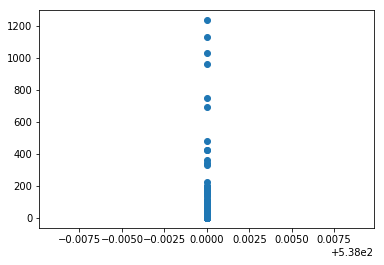

In [68]:
plt.scatter(df.longueur_du_tweet, df.popularité_du_tweet)

# Similarité

Beaucoup de tweet se ressemblent.

En utilisant le module similarity de spacy, et en prenant un de ces tweets peut on trouver les tweets qui lui sont similaires ?

In [17]:
import spacy
nlp= spacy.load('fr')

#tweet="@EPhilippePM Résistez à la Com° EU, signez le décret #StopNéonics interdisant les pesticides tueurs #abeilles"

tokens = nlp['main']

for token1 in tokens:
    for token2 in tokens:
        print(token1.text, token2.text, token1.similarity(token2))

TypeError: 'French' object is not subscriptable